# Failed Attempt

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, VGG19, InceptionV3, Xception, MobileNet, NASNetLarge, ResNet50
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import cv2
import os

import tensorflow as tf
import random
import numpy as np
 
from tqdm import tqdm 

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

In [2]:
imagePaths = list(paths.list_images("NIH"))
data = []
labels = []

In [3]:
# grab the list of images in our dataset directory, then initialize
# the list of data (i.e., images) and class images
print("[INFO] loading images...")
# imagePaths = list(paths.list_images(args["dataset"]))
# data = []
# labels = []

# loop over the image paths
for imagePath in imagePaths:
	# extract the class label from the filename
	label = imagePath.split(os.path.sep)[-2]

	# load the image, swap color channels, and resize it to be a fixed
	# 224x224 pixels while ignoring aspect ratio
	image = cv2.imread(imagePath)
#	cv2.imshow('image',image)
#	cv2.waitKey(4)
#	cv2.destroyAllWindows()
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	image = cv2.resize(image, (128, 128))

	# update the data and labels lists, respectively
	data.append(image)
	labels.append(label)

[INFO] loading images...


In [5]:
cv2.imshow('image',data[10])
cv2.waitKey(4)
cv2.destroyAllWindows()

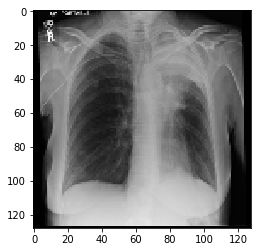

In [48]:
plt.imshow(data[1])
plt.show()

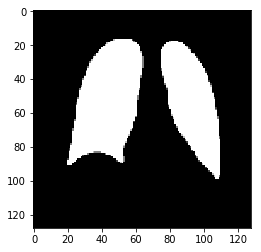

In [49]:
plt.imshow(data[101])
plt.show()

In [39]:
images = data[0:100]
masks = data[100:]
import pandas as pd

# holding 80 of the images for train
# X_train = images[0:81]
# y_train = masks[0:81]

# holding 20 of the images for test
# X_test = images[81:100]
# y_test = masks[81:]

In [40]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

In [32]:
X_train = np.zeros((len(data), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

print('Resizing training images')
for n in range(81):
    img = data[n]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_train[n] = img  #Fill empty X_train with values from img

Resizing training images


In [87]:
# y_train = np.zeros((len(data), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
# y_train = np.zeros((len(data), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

y_train = np.zeros((len(data), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

print('Resizing training masks')
for n in range(81):
    n = n + 100
    img = data[n]
#    img.shape
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
#    img = np.expand_dims(resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant',preserve_range=True), axis=-1)
    y_train[n] = img  #Fill empty X_train with values from img

Resizing training masks


In [136]:
#Build the model
inputs = tf.keras.layers.Input((200,128,128,3))
inputs = tf.reshape(inputs,shape=(200,128,128,3))
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

In [139]:
s.shape

TensorShape([200, 128, 128, 3])

In [140]:
#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)


In [ ]:
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

In [91]:
################################
#Modelcheckpoint
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

In [92]:
results = model.fit(X_train, y_train, validation_split=0.1, epochs=25, callbacks=callbacks)

ValueError: A target array with shape (200, 128, 128, 3) was passed for an output of shape (None, 128, 128, 1) while using as loss `binary_crossentropy`. This loss expects targets to have the same shape as the output.

In [33]:
################################
#Modelcheckpoint
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

results = model.fit(X_train, y_train, validation_split=0.1, batch_size=16, epochs=25, callbacks=callbacks)

####################################

idx = random.randint(0, len(X_train))


preds_train = model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)
preds_val = model.predict(X_train[int(X_train.shape[0]*0.9):], verbose=1)
preds_test = model.predict(X_test, verbose=1)

 
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)


# Perform a sanity check on some random training samples
ix = random.randint(0, len(preds_train_t))
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()
imshow(np.squeeze(preds_train_t[ix]))
plt.show()

# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.9):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()


In [37]:
display(Image.open(data[10]))

AttributeError: 'numpy.ndarray' object has no attribute 'read'

# Failed Attempt

# Working Code

In [160]:
%matplotlib inline
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from glob import glob
import matplotlib.pyplot as plt
USE_CV2 = True
if USE_CV2:
    from cv2 import imread # opencv is much faster, but less accurate
    MIN_OBJ_VAL = 0
else:
    from skimage.io import imread
    MIN_OBJ_VAL = 1000

from skimage.segmentation import mark_boundaries
DATA_DIR = os.path.join('..', 'NIH/')

In [348]:
all_paths = pd.DataFrame(imagePaths).rename(columns={0:'path'})

In [349]:
all_paths['split'] = all_paths['path'].map(lambda x: x.split('/')[-2].split('_')[0])

In [350]:
all_paths['group'] = all_paths['path'].map(lambda x: x.split('/')[-2].split('_')[-1])

In [351]:
all_paths['group'] = all_paths['group'].map(lambda x: 'color' if x == 'test' else x)

In [352]:
all_paths['id'] = all_paths['path'].map(lambda x: '_'.join(os.path.splitext(os.path.basename(x))[0].split('_')[:4]))
all_paths.sample(5)

,path,split,group,id
31,NIH/images/NIH_0088.png,images,images,NIH_0088
2,NIH/images/NIH_0017.png,images,images,NIH_0017
42,NIH/images/NIH_0065.png,images,images,NIH_0065
181,NIH/masks/NIH_0036_mask.png,masks,masks,NIH_0036_mask
63,NIH/images/NIH_0085.png,images,images,NIH_0085


In [226]:
group_df = all_paths.pivot_table(values = 'path', columns = 'group', aggfunc = 'first', index = ['id', 'split']).reset_index()
group_df.sample(5)

group,id,split,images,masks
91,NIH_0046_mask,masks,NaN,NIH/masks/NIH_0046_mask.png
46,NIH_0024,images,NIH/images/NIH_0024.png,NaN
28,NIH_0015,images,NIH/images/NIH_0015.png,NaN
113,NIH_0057_mask,masks,NaN,NIH/masks/NIH_0057_mask.png
49,NIH_0025_mask,masks,NaN,NIH/masks/NIH_0025_mask.png


In [227]:
group_df_image = group_df[group_df['split']=='images'].head(60)
group_df_masks = group_df[group_df['split']=='masks'].head(60)

In [228]:
train_df = pd.concat([group_df_image,group_df_masks],ignore_index=True)

In [229]:
train_df = train_df.rename(columns={'masks':'masks_'})
train_df = train_df.rename(columns={'images':'images_'})

In [230]:
train_df = train_df.replace('masks','train')

In [231]:
train_df = train_df.replace('images','train')

In [232]:
# train_df = group_df.query('split=="train"')
print(train_df.shape[0], 'rows')
sample_rows = 6

120 rows


In [ ]:
train_df_img = train_df.iloc[0:60,0:3]

In [316]:
group_df_image = group_df[group_df['split']=='images'].tail(40)
group_df_masks = group_df[group_df['split']=='masks'].tail(40)
valid_df = pd.concat([group_df_image,group_df_masks],ignore_index=True)
valid_df = valid_df.rename(columns={'masks':'masks_'})
valid_df = valid_df.rename(columns={'images':'images_'})
valid_df = valid_df.replace('masks','train')
valid_df = valid_df.replace('images','train')

In [317]:
len(valid_df)

80

In [321]:
valid_df_img = valid_df.iloc[0:40,0:3]
valid_df_lab = valid_df[['id','split','masks_']]
valid_df_lab = valid_df_lab.iloc[40:,]

In [239]:
from sklearn.model_selection import train_test_split
train_split_df, valid_split_df = train_test_split(train_df, random_state = 2018, test_size = 0.25)

In [240]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import preprocess_input
IMG_SIZE = (384, 384) # slightly smaller than vgg16 normally expects
img_gen_args = dict(samplewise_center=False, 
                              samplewise_std_normalization=False, 
                              horizontal_flip = True, 
                              vertical_flip = False, 
                              height_shift_range = 0.1, 
                              width_shift_range = 0.1, 
                              rotation_range = 3, 
                              shear_range = 0.01,
                              fill_mode = 'nearest',
                              zoom_range = 0.05)

rgb_gen = ImageDataGenerator(preprocessing_function = preprocess_input, **img_gen_args)
lab_gen = ImageDataGenerator(**img_gen_args)

Using TensorFlow backend.


In [241]:
def flow_from_dataframe(img_data_gen, in_df, path_col, y_col, seed = None, **dflow_args):
    base_dir = os.path.dirname(in_df[path_col].values[0])
    print('## Ignore next message from keras, values are replaced anyways: seed: {}'.format(seed))
    df_gen = img_data_gen.flow_from_directory(base_dir, 
                                     class_mode = 'sparse',
                                              seed = seed,
                                    **dflow_args)
    df_gen.filenames = in_df[path_col].values
    df_gen.classes = np.stack(in_df[y_col].values)
    df_gen.samples = in_df.shape[0]
    df_gen.n = in_df.shape[0]
    df_gen._set_index_array()
    df_gen.directory = '' # since we have the full path
    print('Reinserting dataframe: {} images'.format(in_df.shape[0]))
    return df_gen

In [242]:
import keras.preprocessing.image as KPImage
from PIL import Image
class pil_image_awesome():
    @staticmethod
    def open(in_path):
        if 'instanceIds' in in_path:
            # we only want to keep the positive labels not the background
            in_img = imread(in_path)
            if in_img.ndim==3:
                in_img = in_img[:,:,0]
            return Image.fromarray((in_img>MIN_OBJ_VAL).astype(np.float32))
        else:
            return Image.open(in_path)
    
    fromarray = Image.fromarray

KPImage.pil_image = pil_image_awesome

In [243]:
from skimage.filters.rank import maximum
from scipy.ndimage import zoom
def lab_read_func(in_path):
    bin_img = (imread(in_path)>1000).astype(np.uint8)
    x_dim, y_dim = bin_img.shape
    max_label_img = maximum(bin_img, np.ones((x_dim//IMG_SIZE[0], y_dim//IMG_SIZE[1])))
    return np.expand_dims(zoom(max_label_img, (IMG_SIZE[0]/x_dim, IMG_SIZE[1]/y_dim), order = 3), -1)

In [305]:
def train_and_lab_gen_func(in1_df, in2_df, batch_size = 8, seed = None):
    if seed is None:
        seed = np.random.choice(range(1000))
    train_rgb_gen = flow_from_dataframe(rgb_gen, in1_df, 
                             path_col = 'images_',
                            y_col = 'id', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = batch_size,
                                   seed = seed)
    train_lab_gen = flow_from_dataframe(lab_gen, in2_df, 
                             path_col = 'masks_',
                            y_col = 'id', 
                            target_size = IMG_SIZE,
                             color_mode = 'grayscale',
                            batch_size = batch_size,
                                   seed = seed)
    for (x, _), (y, _) in zip(train_rgb_gen, train_lab_gen):
        print(x)
        yield x, y

In [339]:
train_and_lab_gen = train_and_lab_gen_func(train_df_img, train_df_lab, batch_size = 32)

In [340]:
valid_and_lab_gen = train_and_lab_gen_func(valid_df_img, valid_df_lab, batch_size = 32)

In [341]:
(rgb_batch, lab_batch) = next(train_and_lab_gen)

## Ignore next message from keras, values are replaced anyways: seed: 110
Found 0 images belonging to 0 classes.
Reinserting dataframe: 60 images
## Ignore next message from keras, values are replaced anyways: seed: 110
Found 0 images belonging to 0 classes.
Reinserting dataframe: 60 images
[[[[-6.37229309e+01 -7.65629272e+01 -8.34639282e+01]
   [-6.34712753e+01 -7.63112717e+01 -8.32122726e+01]
   [-6.32196236e+01 -7.60596161e+01 -8.29606171e+01]
   ...
   [-6.07662811e+01 -7.36062775e+01 -8.05072784e+01]
   [-6.43444138e+01 -7.71844101e+01 -8.40854111e+01]
   [-6.95423889e+01 -8.23823853e+01 -8.92833862e+01]]

  [[-5.48390503e+01 -6.76790466e+01 -7.45800476e+01]
   [-5.46331520e+01 -6.74731445e+01 -7.43741455e+01]
   [-5.44272537e+01 -6.72672501e+01 -7.41682510e+01]
   ...
   [-5.29157333e+01 -6.57557297e+01 -7.26567307e+01]
   [-5.63417816e+01 -6.91817780e+01 -7.60827789e+01]
   [-6.13154411e+01 -7.41554413e+01 -8.10564423e+01]]

  [[-4.99792328e+01 -6.28192291e+01 -6.97202301e+01]
 

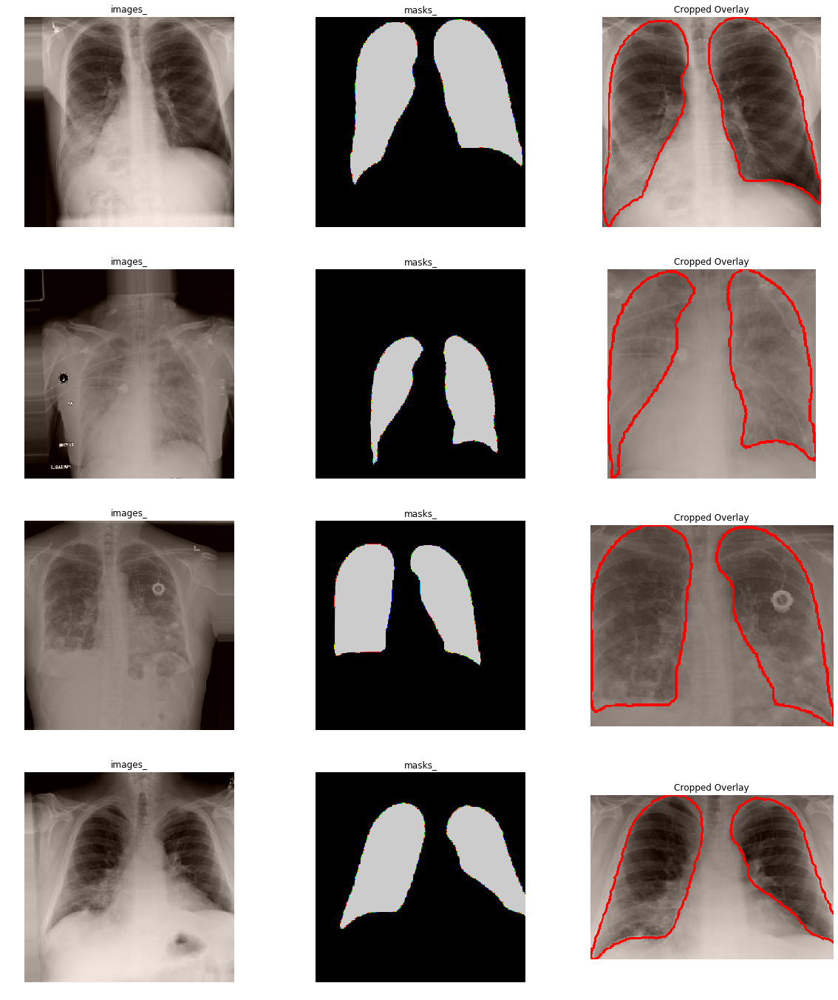

In [342]:
sample_rows = 4
fig, m_axs = plt.subplots(sample_rows, 3, figsize = (20, 6*sample_rows))
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax1, ax2, ax3), rgb_img, lab_img in zip(m_axs, rgb_batch, lab_batch):
    # undoing the vgg correction is tedious
    r_rgb_img = np.clip(rgb_img+110, 0, 255).astype(np.uint8)
    ax1.imshow(r_rgb_img)
    ax1.set_title('images_')
    ax2.imshow(lab_img[:,:,0], cmap = 'nipy_spectral')
    ax2.set_title('masks_')
    if lab_img.max()>0.1:
        xd, yd = np.where(lab_img[:,:,0]>0)
        bound_img = mark_boundaries(image = r_rgb_img, label_img = lab_img[:,:,0], 
                                    color = (1,0,0), background_label = 255, mode = 'thick')
        ax3.imshow(bound_img[xd.min():xd.max(), yd.min():yd.max(),:])
        ax3.set_title('Cropped Overlay')

In [343]:
(rgb_batch, lab_batch) = next(valid_and_lab_gen)

## Ignore next message from keras, values are replaced anyways: seed: 547
Found 0 images belonging to 0 classes.
Reinserting dataframe: 40 images
## Ignore next message from keras, values are replaced anyways: seed: 547
Found 0 images belonging to 0 classes.
Reinserting dataframe: 40 images
[[[[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -77.939      -90.7

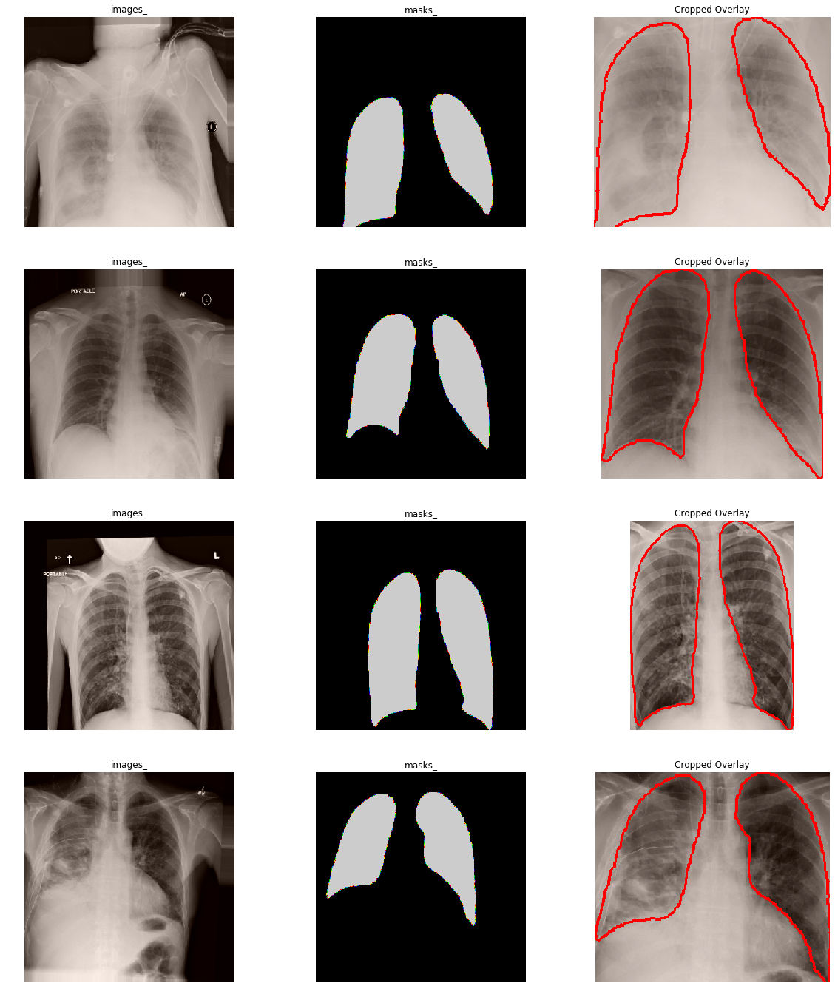

In [344]:
sample_rows = 4
fig, m_axs = plt.subplots(sample_rows, 3, figsize = (20, 6*sample_rows))
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax1, ax2, ax3), rgb_img, lab_img in zip(m_axs, rgb_batch, lab_batch):
    # undoing the vgg correction is tedious
    r_rgb_img = np.clip(rgb_img+110, 0, 255).astype(np.uint8)
    ax1.imshow(r_rgb_img)
    ax1.set_title('images_')
    ax2.imshow(lab_img[:,:,0], cmap = 'nipy_spectral')
    ax2.set_title('masks_')
    if lab_img.max()>0.1:
        xd, yd = np.where(lab_img[:,:,0]>0)
        bound_img = mark_boundaries(image = r_rgb_img, label_img = lab_img[:,:,0], 
                                    color = (1,0,0), background_label = 255, mode = 'thick')
        ax3.imshow(bound_img[xd.min():xd.max(), yd.min():yd.max(),:])
        ax3.set_title('Cropped Overlay')

In [311]:
train_df_lab.head()

group,id,split,masks_
60,NIH_0001_mask,train,NIH/masks/NIH_0001_mask.png
61,NIH_0002_mask,train,NIH/masks/NIH_0002_mask.png
62,NIH_0003_mask,train,NIH/masks/NIH_0003_mask.png
63,NIH_0004_mask,train,NIH/masks/NIH_0004_mask.png
64,NIH_0005_mask,train,NIH/masks/NIH_0005_mask.png


In [312]:
train_df_img.head()

group,id,split,images_
0,NIH_0001,train,NIH/images/NIH_0001.png
1,NIH_0002,train,NIH/images/NIH_0002.png
2,NIH_0003,train,NIH/images/NIH_0003.png
3,NIH_0004,train,NIH/images/NIH_0004.png
4,NIH_0005,train,NIH/images/NIH_0005.png


In [265]:
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Dropout, Lambda
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, VGG19, InceptionV3, Xception, MobileNet, NASNetLarge, ResNet50
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Build U-Net model
inputs = Input(IMG_SIZE+(3,))
s = BatchNormalization()(inputs) # we can learn the normalization step
s = Dropout(0.5)(s)

c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (s)
c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

u6 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
c9 = Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 384, 384, 3) 0                                            
__________________________________________________________________________________________________
batch_normalization_v2 (BatchNo (None, 384, 384, 3)  12          input_23[0][0]                   
__________________________________________________________________________________________________
dropout_54 (Dropout)            (None, 384, 384, 3)  0           batch_normalization_v2[0][0]     
__________________________________________________________________________________________________
conv2d_116 (Conv2D)             (None, 384, 384, 8)  224         dropout_54[0][0]                 
____________________________________________________________________________________________

In [266]:
import tensorflow as tf
from keras import backend as K
# Define IoU metric
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec))

smooth = 1.
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

model.compile(optimizer = 'adam', 
                   loss = dice_coef_loss, 
                   metrics = [dice_coef, 'binary_accuracy', 'mse'])

In [313]:
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('unet')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='loss', factor=0.8, patience=10, verbose=1, mode='auto', epsilon=0.0001, cooldown=5, min_lr=0.0001)
early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=5) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

W0528 14:30:52.056869 4536923584 callbacks.py:1443] `epsilon` argument is deprecated and will be removed, use `min_delta` instead.


In [325]:
batch_size = 8
train_and_lab_gen = train_and_lab_gen_func(train_df_img, train_df_lab, batch_size = batch_size)
valid_and_lab_gen = train_and_lab_gen_func(valid_df_img, valid_df_lab, batch_size = batch_size)

In [326]:
model.fit_generator(train_and_lab_gen, 
                    steps_per_epoch = 2048//batch_size,
                    validation_data = valid_and_lab_gen,
                    validation_steps = 256//batch_size,
                    epochs = 3, 
                    workers = 4,
                    use_multiprocessing = True,
                    callbacks = callbacks_list)

W0528 15:18:23.269701 4536923584 training_generator.py:409] Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `keras.utils.Sequence` class.


Epoch 1/3
## Ignore next message from keras, values are replaced anyways: seed: 760
Epoch 1/3
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Reinserting dataframe: 60 images
Reinserting dataframe: 60 images
Reinserting dataframe: 60 images
Reinserting dataframe: 60 images
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belongi

   [-103.939     -116.779     -123.68     ]]]][[[[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.506195  -101.34619   -108.24719  ]
   [ -87.52516   -100.36516   -107.26616  ]
   [ -91.67743   -104.517426  -111.41843  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.52715   -101.36715   -108.26815  ]
   [ -87.54612   -100.386116  -107.28712  ]
   [ -91.425964  -104.26596   -111.16696  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.54811   -101.38811   -108.28911  ]
   [ -87.56708   -100.407074  -107.308075 ]
   [ -91.17449   -104.01449   -110.91549  ]]

  ...

  [[ -85.55326    -98.39326   -105.29426  ]
   [ -85.59299    -98.43298   -105.333984 ]
   [ -18.638802   -31.478798   -38.3798 

   [-103.939     -116.779     -123.68     ]]]][[[[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.506195  -101.34619   -108.24719  ]
   [ -87.52516   -100.36516   -107.26616  ]
   [ -91.67743   -104.517426  -111.41843  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.52715   -101.36715   -108.26815  ]
   [ -87.54612   -100.386116  -107.28712  ]
   [ -91.425964  -104.26596   -111.16696  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.54811   -101.38811   -108.28911  ]
   [ -87.56708   -100.407074  -107.308075 ]
   [ -91.17449   -104.01449   -110.91549  ]]

  ...

  [[ -85.55326    -98.39326   -105.29426  ]
   [ -85.59299    -98.43298   -105.333984 ]
   [ -18.638802   -31.478798   -38.3798 

   [-103.939     -116.779     -123.68     ]]]][[[[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.506195  -101.34619   -108.24719  ]
   [ -87.52516   -100.36516   -107.26616  ]
   [ -91.67743   -104.517426  -111.41843  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.52715   -101.36715   -108.26815  ]
   [ -87.54612   -100.386116  -107.28712  ]
   [ -91.425964  -104.26596   -111.16696  ]]

  [[ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   ...
   [ -88.54811   -101.38811   -108.28911  ]
   [ -87.56708   -100.407074  -107.308075 ]
   [ -91.17449   -104.01449   -110.91549  ]]

  ...

  [[ -85.55326    -98.39326   -105.29426  ]
   [ -85.59299    -98.43298   -105.333984 ]
   [ -18.638802   -31.478798   -38.3798 

   [-103.939     -116.779     -123.68     ]]]]



[[[[ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.529655  -110.36965   -117.27065  ]
   [ -97.31372   -110.15372   -117.05472  ]]

  [[ -78.03609    -90.87608    -97.777084 ]
   [ -78.010445   -90.85044    -97.75144  ]
   [ -77.9848     -90.8248     -97.7258   ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.55376   -110.39375   -117.294754 ]
   [ -97.28963   -110.12962   -117.030624 ]]

  [[ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.57786   -110.417854  -117.318855 ]
   [ -97.265526  -110.10552   -117.00652  ]]

  ...

  [[ -67.914825   -80.75482    -87.65582  ]
   [ -67.940475   -80.78047    -87.68147  ]
   [ -67.96612    -80.806114   -87.7

   [ -88.86656   -101.70656   -108.60756  ]]]]
[[[[ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.529655  -110.36965   -117.27065  ]
   [ -97.31372   -110.15372   -117.05472  ]]

  [[ -78.03609    -90.87608    -97.777084 ]
   [ -78.010445   -90.85044    -97.75144  ]
   [ -77.9848     -90.8248     -97.7258   ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.55376   -110.39375   -117.294754 ]
   [ -97.28963   -110.12962   -117.030624 ]]

  [[ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.57786   -110.417854  -117.318855 ]
   [ -97.265526  -110.10552   -117.00652  ]]

  ...

  [[ -67.914825   -80.75482    -87.65582  ]
   [ -67.940475   -80.78047    -87.68147  ]
   [ -67.96612    -80.806114   -87.7071

   [ -88.86656   -101.70656   -108.60756  ]]]]
[[[[ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.529655  -110.36965   -117.27065  ]
   [ -97.31372   -110.15372   -117.05472  ]]

  [[ -78.03609    -90.87608    -97.777084 ]
   [ -78.010445   -90.85044    -97.75144  ]
   [ -77.9848     -90.8248     -97.7258   ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.55376   -110.39375   -117.294754 ]
   [ -97.28963   -110.12962   -117.030624 ]]

  [[ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.57786   -110.417854  -117.318855 ]
   [ -97.265526  -110.10552   -117.00652  ]]

  ...

  [[ -67.914825   -80.75482    -87.65582  ]
   [ -67.940475   -80.78047    -87.68147  ]
   [ -67.96612    -80.806114   -87.7071

   [ -88.86656   -101.70656   -108.60756  ]]]]
[[[[ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   [ -77.939      -90.779      -97.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.529655  -110.36965   -117.27065  ]
   [ -97.31372   -110.15372   -117.05472  ]]

  [[ -78.03609    -90.87608    -97.777084 ]
   [ -78.010445   -90.85044    -97.75144  ]
   [ -77.9848     -90.8248     -97.7258   ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.55376   -110.39375   -117.294754 ]
   [ -97.28963   -110.12962   -117.030624 ]]

  [[ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   [ -78.939      -91.779      -98.68     ]
   ...
   [ -96.939     -109.779     -116.68     ]
   [ -97.57786   -110.417854  -117.318855 ]
   [ -97.265526  -110.10552   -117.00652  ]]

  ...

  [[ -67.914825   -80.75482    -87.65582  ]
   [ -67.940475   -80.78047    -87.68147  ]
   [ -67.96612    -80.806114   -87.7071

   [ -88.86656   -101.70656   -108.60756  ]]]]
[[[[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.555664   -107.39566    -114.29666   ]
   [ -94.574455   -107.41445    -114.31545   ]
   [ -94.59325    -107.43324    -114.33424   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.32374    -107.163734   -114.064735  ]
   [ -94.30495    -107.14494    -114.045944  ]
   [ -94.286156   -107.12615    -114.02715   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -95.325134   -108.16513    -115.06613   ]
   [ -95.30634    -108.14634    -115.04734   ]
   [ -95.28755    -108.12755    -115.02855   ]]

  ...

  [[ -51.60752     -64.44752     -71.34852   ]
   [ -31.691063    -44.531

   [  64.766075     51.92608      45.025078  ]]]]
[[[[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.555664   -107.39566    -114.29666   ]
   [ -94.574455   -107.41445    -114.31545   ]
   [ -94.59325    -107.43324    -114.33424   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.32374    -107.163734   -114.064735  ]
   [ -94.30495    -107.14494    -114.045944  ]
   [ -94.286156   -107.12615    -114.02715   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -95.325134   -108.16513    -115.06613   ]
   [ -95.30634    -108.14634    -115.04734   ]
   [ -95.28755    -108.12755    -115.02855   ]]

  ...

  [[ -51.60752     -64.44752     -71.34852   ]
   [ -31.691063    -44.

   [  64.766075     51.92608      45.025078  ]]]]
[[[[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.555664   -107.39566    -114.29666   ]
   [ -94.574455   -107.41445    -114.31545   ]
   [ -94.59325    -107.43324    -114.33424   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.32374    -107.163734   -114.064735  ]
   [ -94.30495    -107.14494    -114.045944  ]
   [ -94.286156   -107.12615    -114.02715   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -95.325134   -108.16513    -115.06613   ]
   [ -95.30634    -108.14634    -115.04734   ]
   [ -95.28755    -108.12755    -115.02855   ]]

  ...

  [[ -51.60752     -64.44752     -71.34852   ]
   [ -31.691063    -44.

   [  64.766075     51.92608      45.025078  ]]]]
[[[[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.555664   -107.39566    -114.29666   ]
   [ -94.574455   -107.41445    -114.31545   ]
   [ -94.59325    -107.43324    -114.33424   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -94.32374    -107.163734   -114.064735  ]
   [ -94.30495    -107.14494    -114.045944  ]
   [ -94.286156   -107.12615    -114.02715   ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -95.325134   -108.16513    -115.06613   ]
   [ -95.30634    -108.14634    -115.04734   ]
   [ -95.28755    -108.12755    -115.02855   ]]

  ...

  [[ -51.60752     -64.44752     -71.34852   ]
   [ -31.691063    -44.

   [  64.766075     51.92608      45.025078  ]]]]
  1/256 [..............................] - ETA: 19:12 - loss: -1.9683 - dice_coef: 1.9683 - binary_accuracy: 1.3563e-05 - mse: 15595.4580[[[[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.36776   -92.207756  -99.10876 ]
   [ -79.52087   -92.36086   -99.26186 ]
   [ -79.34652   -92.186516  -99.08752 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.41586   -92.25586   -99.15686 ]
   [ -79.47276   -92.31276   -99.21376 ]
   [ -79.39462   -92.23462   -99.13562 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.46396   -92.303955  -99.204956]
   [ -79.42467   -92.26466   -99.165665]
   [ -79.44272   -92.282715  -99.183716]]

  ...

  [[ -96.939    -109.779    -116.68    ]


   [ -42.44975   -55.289745  -62.190746]]]]
  2/256 [..............................] - ETA: 14:26 - loss: -1.9683 - dice_coef: 1.9683 - binary_accuracy: 1.3563e-05 - mse: 15595.4580[[[[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.36776   -92.207756  -99.10876 ]
   [ -79.52087   -92.36086   -99.26186 ]
   [ -79.34652   -92.186516  -99.08752 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.41586   -92.25586   -99.15686 ]
   [ -79.47276   -92.31276   -99.21376 ]
   [ -79.39462   -92.23462   -99.13562 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.46396   -92.303955  -99.204956]
   [ -79.42467   -92.26466   -99.165665]
   [ -79.44272   -92.282715  -99.183716]]

  ...

  [[ -96.939    -109.779    -116.68    ]
   [ -

   [ -42.44975   -55.289745  -62.190746]]]]
  3/256 [..............................] - ETA: 12:33 - loss: -1.9683 - dice_coef: 1.9683 - binary_accuracy: 1.3563e-05 - mse: 15595.4580[[[[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.36776   -92.207756  -99.10876 ]
   [ -79.52087   -92.36086   -99.26186 ]
   [ -79.34652   -92.186516  -99.08752 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.41586   -92.25586   -99.15686 ]
   [ -79.47276   -92.31276   -99.21376 ]
   [ -79.39462   -92.23462   -99.13562 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.46396   -92.303955  -99.204956]
   [ -79.42467   -92.26466   -99.165665]
   [ -79.44272   -92.282715  -99.183716]]

  ...

  [[ -96.939    -109.779    -116.68    ]
   [ -

   [ -42.44975   -55.289745  -62.190746]]]]
  4/256 [..............................] - ETA: 11:38 - loss: -1.9683 - dice_coef: 1.9683 - binary_accuracy: 1.3563e-05 - mse: 15595.4580[[[[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.36776   -92.207756  -99.10876 ]
   [ -79.52087   -92.36086   -99.26186 ]
   [ -79.34652   -92.186516  -99.08752 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.41586   -92.25586   -99.15686 ]
   [ -79.47276   -92.31276   -99.21376 ]
   [ -79.39462   -92.23462   -99.13562 ]]

  [[ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   [ -16.939003  -29.779     -36.68    ]
   ...
   [ -79.46396   -92.303955  -99.204956]
   [ -79.42467   -92.26466   -99.165665]
   [ -79.44272   -92.282715  -99.183716]]

  ...

  [[ -96.939    -109.779    -116.68    ]
   [ -

   [ -42.44975   -55.289745  -62.190746]]]]
  5/256 [..............................] - ETA: 11:18 - loss: -1.9680 - dice_coef: 1.9680 - binary_accuracy: 1.3563e-05 - mse: 15489.5615[[[[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55429611e+01 -9.83829575e+01 -1.05283958e+02]
   [-8.51197815e+01 -9.79597778e+01 -1.04860779e+02]
   [-8.57754745e+01 -9.86154709e+01 -1.05516472e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55503235e+01 -9.83903198e+01 -1.05291321e+02]
   [-8.51160965e+01 -9.79560928e+01 -1.04857094e+02]
   [-8.57791595e+01 -9.86191559e+01 -1.05520157e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
  6/256 [..............................] - ETA: 11:46 - loss: -1.9679 - dice_coef: 1.9679 - binary_accuracy: 1.3563e-05 - mse: 15418.9629[[[[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55429611e+01 -9.83829575e+01 -1.05283958e+02]
   [-8.51197815e+01 -9.79597778e+01 -1.04860779e+02]
   [-8.57754745e+01 -9.86154709e+01 -1.05516472e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55503235e+01 -9.83903198e+01 -1.05291321e+02]
   [-8.51160965e+01 -9.79560928e+01 -1.04857094e+02]
   [-8.57791595e+01 -9.86191559e+01 -1.05520157e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
  7/256 [..............................] - ETA: 11:38 - loss: -1.9678 - dice_coef: 1.9678 - binary_accuracy: 1.3563e-05 - mse: 15368.5361[[[[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55429611e+01 -9.83829575e+01 -1.05283958e+02]
   [-8.51197815e+01 -9.79597778e+01 -1.04860779e+02]
   [-8.57754745e+01 -9.86154709e+01 -1.05516472e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55503235e+01 -9.83903198e+01 -1.05291321e+02]
   [-8.51160965e+01 -9.79560928e+01 -1.04857094e+02]
   [-8.57791595e+01 -9.86191559e+01 -1.05520157e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
  8/256 [..............................] - ETA: 11:37 - loss: -1.9677 - dice_coef: 1.9677 - binary_accuracy: 1.3563e-05 - mse: 15330.7148[[[[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55429611e+01 -9.83829575e+01 -1.05283958e+02]
   [-8.51197815e+01 -9.79597778e+01 -1.04860779e+02]
   [-8.57754745e+01 -9.86154709e+01 -1.05516472e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   ...
   [-8.55503235e+01 -9.83903198e+01 -1.05291321e+02]
   [-8.51160965e+01 -9.79560928e+01 -1.04857094e+02]
   [-8.57791595e+01 -9.86191559e+01 -1.05520157e+02]]

  [[ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997e+01]
   [ 4.30609970e+01  3.02210007e+01  2.33199997

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
  9/256 [>.............................] - ETA: 11:16 - loss: -1.9667 - dice_coef: 1.9667 - binary_accuracy: 1.3563e-05 - mse: 14954.8486[[[[-101.513306  -114.3533    -121.2543   ]
   [-101.51092   -114.350914  -121.251915 ]
   [-101.50853   -114.348526  -121.24953  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-101.315796  -114.15579   -121.05679  ]
   [-101.318184  -114.15818   -121.05918  ]
   [-101.32058   -114.160576  -121.06158  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120

   [ -93.945755  -106.78575   -113.68675  ]]]]
 10/256 [>.............................] - ETA: 11:01 - loss: -1.9659 - dice_coef: 1.9659 - binary_accuracy: 1.3563e-05 - mse: 14654.1553[[[[-101.513306  -114.3533    -121.2543   ]
   [-101.51092   -114.350914  -121.251915 ]
   [-101.50853   -114.348526  -121.24953  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-101.315796  -114.15579   -121.05679  ]
   [-101.318184  -114.15818   -121.05918  ]
   [-101.32058   -114.160576  -121.06158  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]

   [ -93.945755  -106.78575   -113.68675  ]]]]
 11/256 [>.............................] - ETA: 10:56 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3563e-05 - mse: 14408.1338[[[[-101.513306  -114.3533    -121.2543   ]
   [-101.51092   -114.350914  -121.251915 ]
   [-101.50853   -114.348526  -121.24953  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-101.315796  -114.15579   -121.05679  ]
   [-101.318184  -114.15818   -121.05918  ]
   [-101.32058   -114.160576  -121.06158  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]

   [ -93.945755  -106.78575   -113.68675  ]]]]
 12/256 [>.............................] - ETA: 10:46 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14203.1162[[[[-101.513306  -114.3533    -121.2543   ]
   [-101.51092   -114.350914  -121.251915 ]
   [-101.50853   -114.348526  -121.24953  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-101.315796  -114.15579   -121.05679  ]
   [-101.318184  -114.15818   -121.05918  ]
   [-101.32058   -114.160576  -121.06158  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]

   [ -93.945755  -106.78575   -113.68675  ]]]]
 13/256 [>.............................] - ETA: 10:35 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14092.5518[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.53867569e+01 -1.08226753e+02 -1.15127754e+02]
   [-9.53677750e+01 -1.08207771e+02 -1.15108772e+02]
   [-9.53487854e+01 -1.08188782e+02 -1.15089783e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 14/256 [>.............................] - ETA: 10:25 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 13997.7822[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.53867569e+01 -1.08226753e+02 -1.15127754e+02]
   [-9.53677750e+01 -1.08207771e+02 -1.15108772e+02]
   [-9.53487854e+01 -1.08188782e+02 -1.15089783e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 15/256 [>.............................] - ETA: 10:18 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 13915.6484[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.53867569e+01 -1.08226753e+02 -1.15127754e+02]
   [-9.53677750e+01 -1.08207771e+02 -1.15108772e+02]
   [-9.53487854e+01 -1.08188782e+02 -1.15089783e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 16/256 [>.............................] - ETA: 10:09 - loss: -1.9639 - dice_coef: 1.9639 - binary_accuracy: 1.3563e-05 - mse: 13843.7812[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.53867569e+01 -1.08226753e+02 -1.15127754e+02]
   [-9.53677750e+01 -1.08207771e+02 -1.15108772e+02]
   [-9.53487854e+01 -1.08188782e+02 -1.15089783e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 17/256 [>.............................] - ETA: 10:02 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14024.7480[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -22.181778  -35.021774  -41.92

   [-103.939    -116.779    -123.68    ]]]]
 19/256 [=>............................] - ETA: 9:49 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14329.5352[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -22.181778  -35.021774  -41.922775]
   [ -2

   [-103.939    -116.779    -123.68    ]]]]
 21/256 [=>............................] - ETA: 9:37 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3563e-05 - mse: 14373.6455[[[[  -3.8892136   -16.72921     -23.63021   ]
   [  -8.290581    -21.130577    -28.031578  ]
   [ -12.498375    -25.338371    -32.239372  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[  -5.533699    -18.373695    -25.274696  ]
   [   4.0171814    -8.822815    -15.723816  ]
   [  -0.21897125  -13.058968    -19.959969  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   1.6006927   -11.239304    -18.140305  ]
   [  14.311081      1.4710846    -5.4299164 ]
   [  13.782616      0.9426193    -5.9583817 ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68    

   [-103.939      -116.779      -123.68      ]]]]
 22/256 [=>............................] - ETA: 9:32 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14295.9873[[[[  -3.8892136   -16.72921     -23.63021   ]
   [  -8.290581    -21.130577    -28.031578  ]
   [ -12.498375    -25.338371    -32.239372  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[  -5.533699    -18.373695    -25.274696  ]
   [   4.0171814    -8.822815    -15.723816  ]
   [  -0.21897125  -13.058968    -19.959969  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   1.6006927   -11.239304    -18.140305  ]
   [  14.311081      1.4710846    -5.4299164 ]
   [  13.782616      0.9426193    -5.9583817 ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 23/256 [=>............................] - ETA: 9:27 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14225.0820[[[[  -3.8892136   -16.72921     -23.63021   ]
   [  -8.290581    -21.130577    -28.031578  ]
   [ -12.498375    -25.338371    -32.239372  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[  -5.533699    -18.373695    -25.274696  ]
   [   4.0171814    -8.822815    -15.723816  ]
   [  -0.21897125  -13.058968    -19.959969  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   1.6006927   -11.239304    -18.140305  ]
   [  14.311081      1.4710846    -5.4299164 ]
   [  13.782616      0.9426193    -5.9583817 ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 24/256 [=>............................] - ETA: 9:24 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14160.0859[[[[  -3.8892136   -16.72921     -23.63021   ]
   [  -8.290581    -21.130577    -28.031578  ]
   [ -12.498375    -25.338371    -32.239372  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[  -5.533699    -18.373695    -25.274696  ]
   [   4.0171814    -8.822815    -15.723816  ]
   [  -0.21897125  -13.058968    -19.959969  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   1.6006927   -11.239304    -18.140305  ]
   [  14.311081      1.4710846    -5.4299164 ]
   [  13.782616      0.9426193    -5.9583817 ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 25/256 [=>............................] - ETA: 9:20 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14206.0908[[[[ -75.372025   -88.21202    -95.11302  ]
   [ -73.08795    -85.92795    -92.82895  ]
   [ -72.31649    -85.15649    -92.05749  ]
   ...
   [ -48.461945   -61.30194    -68.20294  ]
   [ -48.997993   -61.83799    -68.73899  ]
   [ -49.53404    -62.374035   -69.27504  ]]

  [[ -71.74472    -84.58472    -91.48572  ]
   [ -73.10619    -85.94619    -92.84719  ]
   [ -74.61348    -87.453476   -94.35448  ]
   ...
   [ -32.900856   -45.740852   -52.641853 ]
   [ -33.436905   -46.2769     -53.177902 ]
   [ -33.972946   -46.812943   -53.713943 ]]

  [[ -54.038277   -66.87827    -73.779274 ]
   [   4.819618    -8.020378   -14.921379 ]
   [  -0.4881134  -13.32811    -20.22911  ]
   ...
   [ -30.388908   -43.228905   -50.129906 ]
   [ -30.3219     -43.161896   -50.062897 ]
   [ -30.254898   -43.094894   -49.995895

   [ -92.939     -105.779     -112.68     ]]]]
 26/256 [==>...........................] - ETA: 9:16 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14248.5576[[[[ -75.372025   -88.21202    -95.11302  ]
   [ -73.08795    -85.92795    -92.82895  ]
   [ -72.31649    -85.15649    -92.05749  ]
   ...
   [ -48.461945   -61.30194    -68.20294  ]
   [ -48.997993   -61.83799    -68.73899  ]
   [ -49.53404    -62.374035   -69.27504  ]]

  [[ -71.74472    -84.58472    -91.48572  ]
   [ -73.10619    -85.94619    -92.84719  ]
   [ -74.61348    -87.453476   -94.35448  ]
   ...
   [ -32.900856   -45.740852   -52.641853 ]
   [ -33.436905   -46.2769     -53.177902 ]
   [ -33.972946   -46.812943   -53.713943 ]]

  [[ -54.038277   -66.87827    -73.779274 ]
   [   4.819618    -8.020378   -14.921379 ]
   [  -0.4881134  -13.32811    -20.22911  ]
   ...
   [ -30.388908   -43.228905   -50.129906 ]
   [ -30.3219     -43.161896   -50.062897 ]
   [ -30.254898   -43.094894   -49.995895 ]]

   [ -92.939     -105.779     -112.68     ]]]]
 27/256 [==>...........................] - ETA: 9:12 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14287.8789[[[[ -75.372025   -88.21202    -95.11302  ]
   [ -73.08795    -85.92795    -92.82895  ]
   [ -72.31649    -85.15649    -92.05749  ]
   ...
   [ -48.461945   -61.30194    -68.20294  ]
   [ -48.997993   -61.83799    -68.73899  ]
   [ -49.53404    -62.374035   -69.27504  ]]

  [[ -71.74472    -84.58472    -91.48572  ]
   [ -73.10619    -85.94619    -92.84719  ]
   [ -74.61348    -87.453476   -94.35448  ]
   ...
   [ -32.900856   -45.740852   -52.641853 ]
   [ -33.436905   -46.2769     -53.177902 ]
   [ -33.972946   -46.812943   -53.713943 ]]

  [[ -54.038277   -66.87827    -73.779274 ]
   [   4.819618    -8.020378   -14.921379 ]
   [  -0.4881134  -13.32811    -20.22911  ]
   ...
   [ -30.388908   -43.228905   -50.129906 ]
   [ -30.3219     -43.161896   -50.062897 ]
   [ -30.254898   -43.094894   -49.995895 ]]

   [ -92.939     -105.779     -112.68     ]]]]
 28/256 [==>...........................] - ETA: 9:08 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14324.3906[[[[ -75.372025   -88.21202    -95.11302  ]
   [ -73.08795    -85.92795    -92.82895  ]
   [ -72.31649    -85.15649    -92.05749  ]
   ...
   [ -48.461945   -61.30194    -68.20294  ]
   [ -48.997993   -61.83799    -68.73899  ]
   [ -49.53404    -62.374035   -69.27504  ]]

  [[ -71.74472    -84.58472    -91.48572  ]
   [ -73.10619    -85.94619    -92.84719  ]
   [ -74.61348    -87.453476   -94.35448  ]
   ...
   [ -32.900856   -45.740852   -52.641853 ]
   [ -33.436905   -46.2769     -53.177902 ]
   [ -33.972946   -46.812943   -53.713943 ]]

  [[ -54.038277   -66.87827    -73.779274 ]
   [   4.819618    -8.020378   -14.921379 ]
   [  -0.4881134  -13.32811    -20.22911  ]
   ...
   [ -30.388908   -43.228905   -50.129906 ]
   [ -30.3219     -43.161896   -50.062897 ]
   [ -30.254898   -43.094894   -49.995895 ]]

   [ -92.939     -105.779     -112.68     ]]]]
 29/256 [==>...........................] - ETA: 8:56 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14275.3535[[[[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.40824    58.568245   51.667244]
   [  72.38572    59.545723   52.644722]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.39335    58.553352   51.65235 ]
   [  72.37084    59.530846   52.629845]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.37847    58.538475   51.637474]
   [  72.35595    59.515953   52.614952]]

  ...

  [[ -80.939     -93.779    -100.68    ]
   [

   [ 136.061     123.221     116.32    ]]]]
 30/256 [==>...........................] - ETA: 8:45 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14228.0078[[[[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.40824    58.568245   51.667244]
   [  72.38572    59.545723   52.644722]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.39335    58.553352   51.65235 ]
   [  72.37084    59.530846   52.629845]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.37847    58.538475   51.637474]
   [  72.35595    59.515953   52.614952]]

  ...

  [[ -80.939     -93.779    -100.68    ]
   [ -8

   [ 136.061     123.221     116.32    ]]]]
 31/256 [==>...........................] - ETA: 8:34 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14182.2666[[[[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.40824    58.568245   51.667244]
   [  72.38572    59.545723   52.644722]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.39335    58.553352   51.65235 ]
   [  72.37084    59.530846   52.629845]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.37847    58.538475   51.637474]
   [  72.35595    59.515953   52.614952]]

  ...

  [[ -80.939     -93.779    -100.68    ]
   [ -8

   [ 136.061     123.221     116.32    ]]]]
 32/256 [==>...........................] - ETA: 8:24 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 14138.0498[[[[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.40824    58.568245   51.667244]
   [  72.38572    59.545723   52.644722]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.39335    58.553352   51.65235 ]
   [  72.37084    59.530846   52.629845]]

  [[ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   [ 108.061      95.221      88.32    ]
   ...
   [  71.061      58.221      51.32    ]
   [  71.37847    58.538475   51.637474]
   [  72.35595    59.515953   52.614952]]

  ...

  [[ -80.939     -93.779    -100.68    ]
   [ -8

   [ 136.061     123.221     116.32    ]]]]
 33/256 [==>...........................] - ETA: 8:22 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 14110.3164[[[[ -99.78815   -112.62814   -119.529144 ]
   [ -99.13529   -111.97529   -118.87629  ]
   [ -99.69728   -112.53728   -119.43828  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.77524   -112.615234  -119.516235 ]
   [ -99.1482    -111.9882    -118.8892   ]
   [ -99.68437   -112.52437   -119.42537  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.76234   -112.60233   -119.503334 ]
   [ -99.1611    -112.0011    -118.9021   ]
   [ -99.67147   -112.51147   -119.41247  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

 

   [  10.060997    -2.7789993   -9.68     ]]]]
 34/256 [==>...........................] - ETA: 8:21 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 14084.3164[[[[ -99.78815   -112.62814   -119.529144 ]
   [ -99.13529   -111.97529   -118.87629  ]
   [ -99.69728   -112.53728   -119.43828  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.77524   -112.615234  -119.516235 ]
   [ -99.1482    -111.9882    -118.8892   ]
   [ -99.68437   -112.52437   -119.42537  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.76234   -112.60233   -119.503334 ]
   [ -99.1611    -112.0011    -118.9021   ]
   [ -99.67147   -112.51147   -119.41247  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [  10.060997    -2.7789993   -9.68     ]]]]
 35/256 [===>..........................] - ETA: 8:18 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 14059.8916[[[[ -99.78815   -112.62814   -119.529144 ]
   [ -99.13529   -111.97529   -118.87629  ]
   [ -99.69728   -112.53728   -119.43828  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.77524   -112.615234  -119.516235 ]
   [ -99.1482    -111.9882    -118.8892   ]
   [ -99.68437   -112.52437   -119.42537  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.76234   -112.60233   -119.503334 ]
   [ -99.1611    -112.0011    -118.9021   ]
   [ -99.67147   -112.51147   -119.41247  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [  10.060997    -2.7789993   -9.68     ]]]]
 36/256 [===>..........................] - ETA: 8:15 - loss: -1.9639 - dice_coef: 1.9639 - binary_accuracy: 1.3563e-05 - mse: 14036.9033[[[[ -99.78815   -112.62814   -119.529144 ]
   [ -99.13529   -111.97529   -118.87629  ]
   [ -99.69728   -112.53728   -119.43828  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.77524   -112.615234  -119.516235 ]
   [ -99.1482    -111.9882    -118.8892   ]
   [ -99.68437   -112.52437   -119.42537  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.76234   -112.60233   -119.503334 ]
   [ -99.1611    -112.0011    -118.9021   ]
   [ -99.67147   -112.51147   -119.41247  ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [  10.060997    -2.7789993   -9.68     ]]]]
 37/256 [===>..........................] - ETA: 8:12 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 14069.8477[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -85.49666    -98.336655  -105.237656 ]]]]
 38/256 [===>..........................] - ETA: 8:09 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 14100.9609[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -85.49666    -98.336655  -105.237656 ]]]]
 39/256 [===>..........................] - ETA: 8:07 - loss: -1.9642 - dice_coef: 1.9642 - binary_accuracy: 1.3563e-05 - mse: 14130.3936[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -85.49666    -98.336655  -105.237656 ]]]]
 40/256 [===>..........................] - ETA: 8:04 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14158.2764[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -85.49666    -98.336655  -105.237656 ]]]]
 41/256 [===>..........................] - ETA: 8:03 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 14192.5254[[[[ -48.495777   -61.335773   -68.23677  ]
   [ -50.27906    -63.119057   -70.02006  ]
   [ -50.581833   -63.42183    -70.32283  ]
   ...
   [ -66.51553    -79.35553    -86.25653  ]
   [ -66.55712    -79.39712    -86.29812  ]
   [ -66.5987     -79.4387     -86.3397   ]]

  [[ -38.96543    -51.805428   -58.70643  ]
   [ -41.467533   -54.30753    -61.20853  ]
   [ -42.762943   -55.60294    -62.50394  ]
   ...
   [ -66.79912    -79.639114   -86.540115 ]
   [ -66.71596    -79.555954   -86.456955 ]
   [ -66.6328     -79.47279    -86.373795 ]]

  [[ -30.995522   -43.835518   -50.73652  ]
   [ -34.014153   -46.85415    -53.75515  ]
   [ -34.01049    -46.850487   -53.751488 ]
   ...
   [ -67.50235    -80.34235    -87.24335  ]
   [ -67.54393    -80.38393    -87.28493  ]
   [ -67.58551    -80.42551    -87.32651  ]]

   [ -63.596577   -76.43657    -83.33757  ]]]]
 42/256 [===>..........................] - ETA: 8:00 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14225.0625[[[[ -48.495777   -61.335773   -68.23677  ]
   [ -50.27906    -63.119057   -70.02006  ]
   [ -50.581833   -63.42183    -70.32283  ]
   ...
   [ -66.51553    -79.35553    -86.25653  ]
   [ -66.55712    -79.39712    -86.29812  ]
   [ -66.5987     -79.4387     -86.3397   ]]

  [[ -38.96543    -51.805428   -58.70643  ]
   [ -41.467533   -54.30753    -61.20853  ]
   [ -42.762943   -55.60294    -62.50394  ]
   ...
   [ -66.79912    -79.639114   -86.540115 ]
   [ -66.71596    -79.555954   -86.456955 ]
   [ -66.6328     -79.47279    -86.373795 ]]

  [[ -30.995522   -43.835518   -50.73652  ]
   [ -34.014153   -46.85415    -53.75515  ]
   [ -34.01049    -46.850487   -53.751488 ]
   ...
   [ -67.50235    -80.34235    -87.24335  ]
   [ -67.54393    -80.38393    -87.28493  ]
   [ -67.58551    -80.42551    -87.32651  ]]

   [ -63.596577   -76.43657    -83.33757  ]]]]
 43/256 [====>.........................] - ETA: 7:58 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14256.0117[[[[ -48.495777   -61.335773   -68.23677  ]
   [ -50.27906    -63.119057   -70.02006  ]
   [ -50.581833   -63.42183    -70.32283  ]
   ...
   [ -66.51553    -79.35553    -86.25653  ]
   [ -66.55712    -79.39712    -86.29812  ]
   [ -66.5987     -79.4387     -86.3397   ]]

  [[ -38.96543    -51.805428   -58.70643  ]
   [ -41.467533   -54.30753    -61.20853  ]
   [ -42.762943   -55.60294    -62.50394  ]
   ...
   [ -66.79912    -79.639114   -86.540115 ]
   [ -66.71596    -79.555954   -86.456955 ]
   [ -66.6328     -79.47279    -86.373795 ]]

  [[ -30.995522   -43.835518   -50.73652  ]
   [ -34.014153   -46.85415    -53.75515  ]
   [ -34.01049    -46.850487   -53.751488 ]
   ...
   [ -67.50235    -80.34235    -87.24335  ]
   [ -67.54393    -80.38393    -87.28493  ]
   [ -67.58551    -80.42551    -87.32651  ]]

   [ -63.596577   -76.43657    -83.33757  ]]]]
 44/256 [====>.........................] - ETA: 7:55 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14285.4883[[[[ -48.495777   -61.335773   -68.23677  ]
   [ -50.27906    -63.119057   -70.02006  ]
   [ -50.581833   -63.42183    -70.32283  ]
   ...
   [ -66.51553    -79.35553    -86.25653  ]
   [ -66.55712    -79.39712    -86.29812  ]
   [ -66.5987     -79.4387     -86.3397   ]]

  [[ -38.96543    -51.805428   -58.70643  ]
   [ -41.467533   -54.30753    -61.20853  ]
   [ -42.762943   -55.60294    -62.50394  ]
   ...
   [ -66.79912    -79.639114   -86.540115 ]
   [ -66.71596    -79.555954   -86.456955 ]
   [ -66.6328     -79.47279    -86.373795 ]]

  [[ -30.995522   -43.835518   -50.73652  ]
   [ -34.014153   -46.85415    -53.75515  ]
   [ -34.01049    -46.850487   -53.751488 ]
   ...
   [ -67.50235    -80.34235    -87.24335  ]
   [ -67.54393    -80.38393    -87.28493  ]
   [ -67.58551    -80.42551    -87.32651  ]]

   [ -63.596577   -76.43657    -83.33757  ]]]]
 45/256 [====>.........................] - ETA: 7:52 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14262.3174[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [

   [ -85.939     -98.779    -105.68    ]]]]
 46/256 [====>.........................] - ETA: 7:49 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14240.2012[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -85.939     -98.779    -105.68    ]]]]
 47/256 [====>.........................] - ETA: 7:47 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14219.0664[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -85.939     -98.779    -105.68    ]]]]
 48/256 [====>.........................] - ETA: 7:45 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14198.8516[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -85.939     -98.779    -105.68    ]]]]
 49/256 [====>.........................] - ETA: 7:42 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14141.5508[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

 

   [-102.040634  -114.88063   -121.78163  ]]]]
 51/256 [====>.........................] - ETA: 7:37 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 14033.9678[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-102.040634  -114.88063   -121.78163  ]]]]
 53/256 [=====>........................] - ETA: 7:32 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 13999.1523[[[[ -85.41934     -98.25934    -105.16034   ]
   [ -80.74234     -93.58234    -100.48334   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.460075     44.62008      37.719078  ]]

  [[ -85.45179     -98.29179    -105.19279   ]
   [ -80.818054    -93.65805    -100.55905   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.449257     44.60926      37.70826   ]]

  [[ -85.48424     -98.324234   -105.225235  ]
   [ -80.893776    -93.73377    -100.63477   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32 

   [ -10.501289    -23.341286    -30.242287  ]]]]
 54/256 [=====>........................] - ETA: 7:29 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 14014.2949[[[[ -85.41934     -98.25934    -105.16034   ]
   [ -80.74234     -93.58234    -100.48334   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.460075     44.62008      37.719078  ]]

  [[ -85.45179     -98.29179    -105.19279   ]
   [ -80.818054    -93.65805    -100.55905   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.449257     44.60926      37.70826   ]]

  [[ -85.48424     -98.324234   -105.225235  ]
   [ -80.893776    -93.73377    -100.63477   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.

   [ -10.501289    -23.341286    -30.242287  ]]]]
 55/256 [=====>........................] - ETA: 7:27 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 14028.8662[[[[ -85.41934     -98.25934    -105.16034   ]
   [ -80.74234     -93.58234    -100.48334   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.460075     44.62008      37.719078  ]]

  [[ -85.45179     -98.29179    -105.19279   ]
   [ -80.818054    -93.65805    -100.55905   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.449257     44.60926      37.70826   ]]

  [[ -85.48424     -98.324234   -105.225235  ]
   [ -80.893776    -93.73377    -100.63477   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.

   [ -10.501289    -23.341286    -30.242287  ]]]]
 56/256 [=====>........................] - ETA: 7:25 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 14042.8975[[[[ -85.41934     -98.25934    -105.16034   ]
   [ -80.74234     -93.58234    -100.48334   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.460075     44.62008      37.719078  ]]

  [[ -85.45179     -98.29179    -105.19279   ]
   [ -80.818054    -93.65805    -100.55905   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.32      ]
   [  57.449257     44.60926      37.70826   ]]

  [[ -85.48424     -98.324234   -105.225235  ]
   [ -80.893776    -93.73377    -100.63477   ]
   [ -76.939       -89.779       -96.68      ]
   ...
   [  57.060997     44.221        37.32      ]
   [  57.060997     44.221        37.

   [ -10.501289    -23.341286    -30.242287  ]]]]
 57/256 [=====>........................] - ETA: 7:22 - loss: -1.9642 - dice_coef: 1.9642 - binary_accuracy: 1.3563e-05 - mse: 14062.5693[[[[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68    

   [-101.939     -114.779     -121.68     ]]]]
 58/256 [=====>........................] - ETA: 7:20 - loss: -1.9642 - dice_coef: 1.9642 - binary_accuracy: 1.3563e-05 - mse: 14081.5400[[[[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

   [-101.939     -114.779     -121.68     ]]]]
 59/256 [=====>........................] - ETA: 7:17 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14099.8438[[[[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

   [-101.939     -114.779     -121.68     ]]]]
 60/256 [======>.......................] - ETA: 7:15 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14117.5176[[[[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]]

   [-101.939     -114.779     -121.68     ]]]]
 61/256 [======>.......................] - ETA: 7:09 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14113.6465[[[[-9.80726776e+01 -1.10912674e+02 -1.17813675e+02]
   [-9.82303238e+01 -1.11070320e+02 -1.17971321e+02]
   [-9.84421082e+01 -1.11282104e+02 -1.18183105e+02]
   ...
   [ 1.88065109e+01  5.96651459e+00 -9.34486389e-01]
   [ 1.87633438e+01  5.92334747e+00 -9.77653503e-01]
   [ 1.87201767e+01  5.88018036e+00 -1.02082062e+00]]

  [[-9.73299866e+01 -1.10169983e+02 -1.17070984e+02]
   [-9.79719543e+01 -1.10811951e+02 -1.17712952e+02]
   [-9.81995316e+01 -1.11039528e+02 -1.17940529e+02]
   ...
   [ 1.91415405e+01  6.30154419e+00 -5.99456787e-01]
   [ 1.93142090e+01  6.47421265e+00 -4.26788330e-01]
   [ 1.94868774e+01  6.64688110e+00 -2.54119873e-01]]

  [[-9.64970932e+01 -1.09337090e+02 -1.16238091e+02]
   [-9.77603531e+01 -1.10600349e+02 -1.17501350e+02]
   [-9.70277481e+01 -1.09867744e+02 -1.16768745e+02]
   .

   [-9.73553696e+01 -1.10195366e+02 -1.17096367e+02]]]]
 62/256 [======>.......................] - ETA: 7:04 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14109.8418[[[[-9.80726776e+01 -1.10912674e+02 -1.17813675e+02]
   [-9.82303238e+01 -1.11070320e+02 -1.17971321e+02]
   [-9.84421082e+01 -1.11282104e+02 -1.18183105e+02]
   ...
   [ 1.88065109e+01  5.96651459e+00 -9.34486389e-01]
   [ 1.87633438e+01  5.92334747e+00 -9.77653503e-01]
   [ 1.87201767e+01  5.88018036e+00 -1.02082062e+00]]

  [[-9.73299866e+01 -1.10169983e+02 -1.17070984e+02]
   [-9.79719543e+01 -1.10811951e+02 -1.17712952e+02]
   [-9.81995316e+01 -1.11039528e+02 -1.17940529e+02]
   ...
   [ 1.91415405e+01  6.30154419e+00 -5.99456787e-01]
   [ 1.93142090e+01  6.47421265e+00 -4.26788330e-01]
   [ 1.94868774e+01  6.64688110e+00 -2.54119873e-01]]

  [[-9.64970932e+01 -1.09337090e+02 -1.16238091e+02]
   [-9.77603531e+01 -1.10600349e+02 -1.17501350e+02]
   [-9.70277481e+01 -1.09867744e+02 -1.16768745e

   [-9.73553696e+01 -1.10195366e+02 -1.17096367e+02]]]]
 63/256 [======>.......................] - ETA: 6:59 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14106.1006[[[[-9.80726776e+01 -1.10912674e+02 -1.17813675e+02]
   [-9.82303238e+01 -1.11070320e+02 -1.17971321e+02]
   [-9.84421082e+01 -1.11282104e+02 -1.18183105e+02]
   ...
   [ 1.88065109e+01  5.96651459e+00 -9.34486389e-01]
   [ 1.87633438e+01  5.92334747e+00 -9.77653503e-01]
   [ 1.87201767e+01  5.88018036e+00 -1.02082062e+00]]

  [[-9.73299866e+01 -1.10169983e+02 -1.17070984e+02]
   [-9.79719543e+01 -1.10811951e+02 -1.17712952e+02]
   [-9.81995316e+01 -1.11039528e+02 -1.17940529e+02]
   ...
   [ 1.91415405e+01  6.30154419e+00 -5.99456787e-01]
   [ 1.93142090e+01  6.47421265e+00 -4.26788330e-01]
   [ 1.94868774e+01  6.64688110e+00 -2.54119873e-01]]

  [[-9.64970932e+01 -1.09337090e+02 -1.16238091e+02]
   [-9.77603531e+01 -1.10600349e+02 -1.17501350e+02]
   [-9.70277481e+01 -1.09867744e+02 -1.16768745e

   [-9.73553696e+01 -1.10195366e+02 -1.17096367e+02]]]]
 64/256 [======>.......................] - ETA: 6:54 - loss: -1.9643 - dice_coef: 1.9643 - binary_accuracy: 1.3563e-05 - mse: 14102.4219[[[[-9.80726776e+01 -1.10912674e+02 -1.17813675e+02]
   [-9.82303238e+01 -1.11070320e+02 -1.17971321e+02]
   [-9.84421082e+01 -1.11282104e+02 -1.18183105e+02]
   ...
   [ 1.88065109e+01  5.96651459e+00 -9.34486389e-01]
   [ 1.87633438e+01  5.92334747e+00 -9.77653503e-01]
   [ 1.87201767e+01  5.88018036e+00 -1.02082062e+00]]

  [[-9.73299866e+01 -1.10169983e+02 -1.17070984e+02]
   [-9.79719543e+01 -1.10811951e+02 -1.17712952e+02]
   [-9.81995316e+01 -1.11039528e+02 -1.17940529e+02]
   ...
   [ 1.91415405e+01  6.30154419e+00 -5.99456787e-01]
   [ 1.93142090e+01  6.47421265e+00 -4.26788330e-01]
   [ 1.94868774e+01  6.64688110e+00 -2.54119873e-01]]

  [[-9.64970932e+01 -1.09337090e+02 -1.16238091e+02]
   [-9.77603531e+01 -1.10600349e+02 -1.17501350e+02]
   [-9.70277481e+01 -1.09867744e+02 -1.16768745e

   [-9.73553696e+01 -1.10195366e+02 -1.17096367e+02]]]]
 65/256 [======>.......................] - ETA: 6:52 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 14125.4170[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.90253677e+01  1.61853714e+01  9.28437042e+00]]]]
 66/256 [======>.......................] - ETA: 6:51 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 14147.6699[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.90253677e+01  1.61853714e+01  9.28437042e+00]]]]
 67/256 [======>.......................] - ETA: 6:49 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14169.2168[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.90253677e+01  1.61853714e+01  9.28437042e+00]]]]
 68/256 [======>.......................] - ETA: 6:47 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14190.0898[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.90253677e+01  1.61853714e+01  9.28437042e+00]]]]
 69/256 [=======>......................] - ETA: 6:45 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14213.7021[[[[ -97.69347   -110.53346   -117.43446  ]
   [ -97.482475  -110.32247   -117.22347  ]
   [ -97.57736   -110.41736   -117.31836  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-100.886635  -113.72663   -120.62763  ]
   [-101.33069   -114.170685  -121.071686 ]
   [-100.52228   -113.362274  -120.263275 ]
   ...
   [ -99.38552   -112.22552   -119.12652  ]
   [ -99.40924   -112.24924   -119.15024  ]
   [ -99.43296   -112.27296   -119.17396  ]]

  [[ -12.134262   -24.974258   -31.87526  ]
   [ -34.031418   -46.871414   -53.772415 ]
   [ -63.963676   -76.80367    -83.70467  ]
   ...
   [ -99.44614   -112.28613   -119.18713  ]
   [ -99.42241   -112.262405  -119.16341  ]
   [ -99.39869   -112.238686  -119.

   [ -95.32278   -108.16277   -115.063774 ]]]]
 70/256 [=======>......................] - ETA: 6:43 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14236.5977[[[[ -97.69347   -110.53346   -117.43446  ]
   [ -97.482475  -110.32247   -117.22347  ]
   [ -97.57736   -110.41736   -117.31836  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-100.886635  -113.72663   -120.62763  ]
   [-101.33069   -114.170685  -121.071686 ]
   [-100.52228   -113.362274  -120.263275 ]
   ...
   [ -99.38552   -112.22552   -119.12652  ]
   [ -99.40924   -112.24924   -119.15024  ]
   [ -99.43296   -112.27296   -119.17396  ]]

  [[ -12.134262   -24.974258   -31.87526  ]
   [ -34.031418   -46.871414   -53.772415 ]
   [ -63.963676   -76.80367    -83.70467  ]
   ...
   [ -99.44614   -112.28613   -119.18713  ]
   [ -99.42241   -112.262405  -119.16341  ]
   [ -99.39869   -112.238686  -119.13969  ]]

   [ -95.32278   -108.16277   -115.063774 ]]]]
 71/256 [=======>......................] - ETA: 6:41 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14258.8105[[[[ -97.69347   -110.53346   -117.43446  ]
   [ -97.482475  -110.32247   -117.22347  ]
   [ -97.57736   -110.41736   -117.31836  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-100.886635  -113.72663   -120.62763  ]
   [-101.33069   -114.170685  -121.071686 ]
   [-100.52228   -113.362274  -120.263275 ]
   ...
   [ -99.38552   -112.22552   -119.12652  ]
   [ -99.40924   -112.24924   -119.15024  ]
   [ -99.43296   -112.27296   -119.17396  ]]

  [[ -12.134262   -24.974258   -31.87526  ]
   [ -34.031418   -46.871414   -53.772415 ]
   [ -63.963676   -76.80367    -83.70467  ]
   ...
   [ -99.44614   -112.28613   -119.18713  ]
   [ -99.42241   -112.262405  -119.16341  ]
   [ -99.39869   -112.238686  -119.13969  ]]

   [ -95.32278   -108.16277   -115.063774 ]]]]
 72/256 [=======>......................] - ETA: 6:39 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14280.3711[[[[ -97.69347   -110.53346   -117.43446  ]
   [ -97.482475  -110.32247   -117.22347  ]
   [ -97.57736   -110.41736   -117.31836  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-100.886635  -113.72663   -120.62763  ]
   [-101.33069   -114.170685  -121.071686 ]
   [-100.52228   -113.362274  -120.263275 ]
   ...
   [ -99.38552   -112.22552   -119.12652  ]
   [ -99.40924   -112.24924   -119.15024  ]
   [ -99.43296   -112.27296   -119.17396  ]]

  [[ -12.134262   -24.974258   -31.87526  ]
   [ -34.031418   -46.871414   -53.772415 ]
   [ -63.963676   -76.80367    -83.70467  ]
   ...
   [ -99.44614   -112.28613   -119.18713  ]
   [ -99.42241   -112.262405  -119.16341  ]
   [ -99.39869   -112.238686  -119.13969  ]]

   [ -95.32278   -108.16277   -115.063774 ]]]]
 73/256 [=======>......................] - ETA: 6:37 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14269.5361[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.46826     -92.30826     -99.20926   ]
   [ -79.49016     -92.330154    -99.231155  ]
   [ -79.51207     -92.352066    -99.25307   ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.4372      -92.2772      -99.1782    ]
   [ -79.4153      -92.255295    -99.156

   [ -97.939      -110.779      -117.68      ]]]]
 74/256 [=======>......................] - ETA: 6:35 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14259.0107[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.46826     -92.30826     -99.20926   ]
   [ -79.49016     -92.330154    -99.231155  ]
   [ -79.51207     -92.352066    -99.25307   ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.4372      -92.2772      -99.1782    ]
   [ -79.4153      -92.255295    -99.

   [ -97.939      -110.779      -117.68      ]]]]
 75/256 [=======>......................] - ETA: 6:33 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14248.7822[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.46826     -92.30826     -99.20926   ]
   [ -79.49016     -92.330154    -99.231155  ]
   [ -79.51207     -92.352066    -99.25307   ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.4372      -92.2772      -99.1782    ]
   [ -79.4153      -92.255295    -99.

   [ -97.939      -110.779      -117.68      ]]]]
 76/256 [=======>......................] - ETA: 6:31 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14238.8379[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.46826     -92.30826     -99.20926   ]
   [ -79.49016     -92.330154    -99.231155  ]
   [ -79.51207     -92.352066    -99.25307   ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]
   [ -79.939       -92.779       -99.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [ -79.4372      -92.2772      -99.1782    ]
   [ -79.4153      -92.255295    -99.

   [ -97.939      -110.779      -117.68      ]]]]
 77/256 [========>.....................] - ETA: 6:29 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14227.2041[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
 

   [-4.89055977e+01 -6.17455940e+01 -6.86465912e+01]]]]
 78/256 [========>.....................] - ETA: 6:27 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14215.8848[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.89055977e+01 -6.17455940e+01 -6.86465912e+01]]]]
 79/256 [========>.....................] - ETA: 6:24 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14204.8662[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.89055977e+01 -6.17455940e+01 -6.86465912e+01]]]]
 80/256 [========>.....................] - ETA: 6:22 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14194.1387[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.89055977e+01 -6.17455940e+01 -6.86465912e+01]]]]
 81/256 [========>.....................] - ETA: 6:20 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14204.2031[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.

   [-100.939     -113.779     -120.68     ]]]]
 83/256 [========>.....................] - ETA: 6:16 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14223.5684[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-100.939     -113.779     -120.68     ]]]]
 85/256 [========>.....................] - ETA: 6:11 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14223.5488[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.29823   -113.13823   -120.03923  ]
   [-100.31076   -113.15076   -120.05176  ]
   [-100.32329   -113.163284  -120.064285 ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -98.06166   -110.90166   -117.80266  ]
   [ -98.080444  -110.92044   -117.82144  ]
   [ -98.099236  -110.93923   -117.84023  ]]

   [  35.644447    22.804451    15.90345  ]]]]
 86/256 [=========>....................] - ETA: 6:09 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14214.4375[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.29823   -113.13823   -120.03923  ]
   [-100.31076   -113.15076   -120.05176  ]
   [-100.32329   -113.163284  -120.064285 ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -98.06166   -110.90166   -117.80266  ]
   [ -98.080444  -110.92044   -117.82144  ]
   [ -98.099236  -110.93923   -117.84023  ]]

   [  35.644447    22.804451    15.90345  ]]]]
 87/256 [=========>....................] - ETA: 6:07 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14205.5459[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.29823   -113.13823   -120.03923  ]
   [-100.31076   -113.15076   -120.05176  ]
   [-100.32329   -113.163284  -120.064285 ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -98.06166   -110.90166   -117.80266  ]
   [ -98.080444  -110.92044   -117.82144  ]
   [ -98.099236  -110.93923   -117.84023  ]]

   [  35.644447    22.804451    15.90345  ]]]]
 88/256 [=========>....................] - ETA: 6:05 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14196.8662[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [-100.29823   -113.13823   -120.03923  ]
   [-100.31076   -113.15076   -120.05176  ]
   [-100.32329   -113.163284  -120.064285 ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -98.06166   -110.90166   -117.80266  ]
   [ -98.080444  -110.92044   -117.82144  ]
   [ -98.099236  -110.93923   -117.84023  ]]

   [  35.644447    22.804451    15.90345  ]]]]
 89/256 [=========>....................] - ETA: 6:03 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14196.8613[[[[ -97.19606   -110.03606   -116.93706  ]
   [ -95.97479   -108.81479   -115.71579  ]
   [ -84.17314    -97.01314   -103.91414  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -96.06363   -108.903625  -115.80463  ]
   [ -75.85112    -88.69112    -95.59212  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.491135  -110.33113   -117.23213  ]
   [ -93.41568   -106.25568   -113.15668  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ -96.92314   -109.76314   -116.66414  ]]]]
 90/256 [=========>....................] - ETA: 6:01 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14196.8564[[[[ -97.19606   -110.03606   -116.93706  ]
   [ -95.97479   -108.81479   -115.71579  ]
   [ -84.17314    -97.01314   -103.91414  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -96.06363   -108.903625  -115.80463  ]
   [ -75.85112    -88.69112    -95.59212  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.491135  -110.33113   -117.23213  ]
   [ -93.41568   -106.25568   -113.15668  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ -96.92314   -109.76314   -116.66414  ]]]]
 91/256 [=========>....................] - ETA: 5:58 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14196.8516[[[[ -97.19606   -110.03606   -116.93706  ]
   [ -95.97479   -108.81479   -115.71579  ]
   [ -84.17314    -97.01314   -103.91414  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -96.06363   -108.903625  -115.80463  ]
   [ -75.85112    -88.69112    -95.59212  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.491135  -110.33113   -117.23213  ]
   [ -93.41568   -106.25568   -113.15668  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ -96.92314   -109.76314   -116.66414  ]]]]
 92/256 [=========>....................] - ETA: 5:56 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14196.8477[[[[ -97.19606   -110.03606   -116.93706  ]
   [ -95.97479   -108.81479   -115.71579  ]
   [ -84.17314    -97.01314   -103.91414  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -96.06363   -108.903625  -115.80463  ]
   [ -75.85112    -88.69112    -95.59212  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -97.939     -110.779     -117.68     ]
   [ -97.491135  -110.33113   -117.23213  ]
   [ -93.41568   -106.25568   -113.15668  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ -96.92314   -109.76314   -116.66414  ]]]]
 93/256 [=========>....................] - ETA: 5:52 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14186.0928[[[[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.50429459e+01 -8.78829422e+01 -9.47839432e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.51265945e+01 -8.79665909e+01 -9.48675919e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   .

   [-9.70486069e+01 -1.09888603e+02 -1.16789604e+02]]]]
 94/256 [==========>...................] - ETA: 5:48 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14175.4590[[[[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.50429459e+01 -8.78829422e+01 -9.47839432e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.51265945e+01 -8.79665909e+01 -9.48675919e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e

   [-9.70486069e+01 -1.09888603e+02 -1.16789604e+02]]]]
 95/256 [==========>...................] - ETA: 5:45 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14164.9443[[[[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.50429459e+01 -8.78829422e+01 -9.47839432e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.51265945e+01 -8.79665909e+01 -9.48675919e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e

   [-9.70486069e+01 -1.09888603e+02 -1.16789604e+02]]]]
 96/256 [==========>...................] - ETA: 5:41 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14154.5469[[[[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.50429459e+01 -8.78829422e+01 -9.47839432e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   ...
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.59390030e+01 -8.87789993e+01 -9.56800003e+01]
   [-7.51265945e+01 -8.79665909e+01 -9.48675919e+01]]

  [[ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e+01]
   [ 5.70609970e+01  4.42210007e+01  3.73199997e

   [-9.70486069e+01 -1.09888603e+02 -1.16789604e+02]]]]
 97/256 [==========>...................] - ETA: 5:39 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3554e-05 - mse: 14168.4922[[[[  17.041588      4.2015915    -2.6994095 ]
   [  16.75241       3.9124146    -2.9885864 ]
   [  15.275673      2.4356766    -4.4653244 ]
   ...
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]]

  [[  21.682518      8.842522      1.9415207 ]
   [  14.56398       1.7239838    -5.177017  ]
   [  17.58319       4.7431946    -2.1578064 ]
   ...
   [ -85.66992     -98.50992    -105.41092   ]
   [ -85.65903     -98.49902    -105.400024  ]
   [ -85.64813     -98.48813    -105.38913   ]]

  [[  41.264397     28.4244       21.5234    ]
   [  33.936134     21.096138     14.195137  ]
   [  25.24981      12.409813      5.508812  ]
   ...
   [ -86.70014     -99.54014    -106.44114   ]
   [ -86.68925     -99.52924   

   [ -91.61877    -104.45876    -111.359764  ]]]]
 98/256 [==========>...................] - ETA: 5:37 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14182.1338[[[[  17.041588      4.2015915    -2.6994095 ]
   [  16.75241       3.9124146    -2.9885864 ]
   [  15.275673      2.4356766    -4.4653244 ]
   ...
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]]

  [[  21.682518      8.842522      1.9415207 ]
   [  14.56398       1.7239838    -5.177017  ]
   [  17.58319       4.7431946    -2.1578064 ]
   ...
   [ -85.66992     -98.50992    -105.41092   ]
   [ -85.65903     -98.49902    -105.400024  ]
   [ -85.64813     -98.48813    -105.38913   ]]

  [[  41.264397     28.4244       21.5234    ]
   [  33.936134     21.096138     14.195137  ]
   [  25.24981      12.409813      5.508812  ]
   ...
   [ -86.70014     -99.54014    -106.44114   ]
   [ -86.68925     -99.52924    -106.

   [ -91.61877    -104.45876    -111.359764  ]]]]
 99/256 [==========>...................] - ETA: 5:35 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14195.4824[[[[  17.041588      4.2015915    -2.6994095 ]
   [  16.75241       3.9124146    -2.9885864 ]
   [  15.275673      2.4356766    -4.4653244 ]
   ...
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]]

  [[  21.682518      8.842522      1.9415207 ]
   [  14.56398       1.7239838    -5.177017  ]
   [  17.58319       4.7431946    -2.1578064 ]
   ...
   [ -85.66992     -98.50992    -105.41092   ]
   [ -85.65903     -98.49902    -105.400024  ]
   [ -85.64813     -98.48813    -105.38913   ]]

  [[  41.264397     28.4244       21.5234    ]
   [  33.936134     21.096138     14.195137  ]
   [  25.24981      12.409813      5.508812  ]
   ...
   [ -86.70014     -99.54014    -106.44114   ]
   [ -86.68925     -99.52924    -106.

   [ -91.61877    -104.45876    -111.359764  ]]]]
100/256 [==========>...................] - ETA: 5:33 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3527e-05 - mse: 14208.5469[[[[  17.041588      4.2015915    -2.6994095 ]
   [  16.75241       3.9124146    -2.9885864 ]
   [  15.275673      2.4356766    -4.4653244 ]
   ...
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]
   [ -84.939       -97.779      -104.68      ]]

  [[  21.682518      8.842522      1.9415207 ]
   [  14.56398       1.7239838    -5.177017  ]
   [  17.58319       4.7431946    -2.1578064 ]
   ...
   [ -85.66992     -98.50992    -105.41092   ]
   [ -85.65903     -98.49902    -105.400024  ]
   [ -85.64813     -98.48813    -105.38913   ]]

  [[  41.264397     28.4244       21.5234    ]
   [  33.936134     21.096138     14.195137  ]
   [  25.24981      12.409813      5.508812  ]
   ...
   [ -86.70014     -99.54014    -106.44114   ]
   [ -86.68925     -99.52924    -106.

   [ -91.61877    -104.45876    -111.359764  ]]]]
101/256 [==========>...................] - ETA: 5:31 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3528e-05 - mse: 14210.0361[[[[ 1.07946777e+01 -2.04531860e+00 -8.94631958e+00]
   [ 1.21152344e+01 -7.24761963e-01 -7.62576294e+00]
   [ 1.20121078e+01 -8.27888489e-01 -7.72888947e+00]
   ...
   [ 2.68361588e+01  1.39961624e+01  7.09516144e+00]
   [ 2.71520615e+01  1.43120651e+01  7.41106415e+00]
   [ 2.74679489e+01  1.46279526e+01  7.72695160e+00]]

  [[ 1.18350983e+01 -1.00489807e+00 -7.90589905e+00]
   [ 1.38279572e+01  9.87960815e-01 -5.91304016e+00]
   [ 1.09027176e+01 -1.93727875e+00 -8.83827972e+00]
   ...
   [ 3.30611649e+01  2.02211685e+01  1.33201675e+01]
   [ 3.32717514e+01  2.04317551e+01  1.35307541e+01]
   [ 3.34823532e+01  2.06423569e+01  1.37413559e+01]]

  [[ 1.30675354e+01  2.27539062e-01 -6.67346191e+00]
   [ 1.26890564e+01 -1.50939941e-01 -7.05194092e+00]
   [ 1.17581177e+01 -1.08187866e+00 -7.98287964e+00]
 

   [ 1.07396385e+02  9.45563889e+01  8.76553879e+01]]]]
102/256 [==========>...................] - ETA: 5:29 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3528e-05 - mse: 14211.4941[[[[ 1.07946777e+01 -2.04531860e+00 -8.94631958e+00]
   [ 1.21152344e+01 -7.24761963e-01 -7.62576294e+00]
   [ 1.20121078e+01 -8.27888489e-01 -7.72888947e+00]
   ...
   [ 2.68361588e+01  1.39961624e+01  7.09516144e+00]
   [ 2.71520615e+01  1.43120651e+01  7.41106415e+00]
   [ 2.74679489e+01  1.46279526e+01  7.72695160e+00]]

  [[ 1.18350983e+01 -1.00489807e+00 -7.90589905e+00]
   [ 1.38279572e+01  9.87960815e-01 -5.91304016e+00]
   [ 1.09027176e+01 -1.93727875e+00 -8.83827972e+00]
   ...
   [ 3.30611649e+01  2.02211685e+01  1.33201675e+01]
   [ 3.32717514e+01  2.04317551e+01  1.35307541e+01]
   [ 3.34823532e+01  2.06423569e+01  1.37413559e+01]]

  [[ 1.30675354e+01  2.27539062e-01 -6.67346191e+00]
   [ 1.26890564e+01 -1.50939941e-01 -7.05194092e+00]
   [ 1.17581177e+01 -1.08187866e+00 -7.98287964e

   [ 1.07396385e+02  9.45563889e+01  8.76553879e+01]]]]
103/256 [===========>..................] - ETA: 5:27 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3528e-05 - mse: 14212.9219[[[[ 1.07946777e+01 -2.04531860e+00 -8.94631958e+00]
   [ 1.21152344e+01 -7.24761963e-01 -7.62576294e+00]
   [ 1.20121078e+01 -8.27888489e-01 -7.72888947e+00]
   ...
   [ 2.68361588e+01  1.39961624e+01  7.09516144e+00]
   [ 2.71520615e+01  1.43120651e+01  7.41106415e+00]
   [ 2.74679489e+01  1.46279526e+01  7.72695160e+00]]

  [[ 1.18350983e+01 -1.00489807e+00 -7.90589905e+00]
   [ 1.38279572e+01  9.87960815e-01 -5.91304016e+00]
   [ 1.09027176e+01 -1.93727875e+00 -8.83827972e+00]
   ...
   [ 3.30611649e+01  2.02211685e+01  1.33201675e+01]
   [ 3.32717514e+01  2.04317551e+01  1.35307541e+01]
   [ 3.34823532e+01  2.06423569e+01  1.37413559e+01]]

  [[ 1.30675354e+01  2.27539062e-01 -6.67346191e+00]
   [ 1.26890564e+01 -1.50939941e-01 -7.05194092e+00]
   [ 1.17581177e+01 -1.08187866e+00 -7.98287964e

   [ 1.07396385e+02  9.45563889e+01  8.76553879e+01]]]]
104/256 [===========>..................] - ETA: 5:25 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3529e-05 - mse: 14214.3213[[[[ 1.07946777e+01 -2.04531860e+00 -8.94631958e+00]
   [ 1.21152344e+01 -7.24761963e-01 -7.62576294e+00]
   [ 1.20121078e+01 -8.27888489e-01 -7.72888947e+00]
   ...
   [ 2.68361588e+01  1.39961624e+01  7.09516144e+00]
   [ 2.71520615e+01  1.43120651e+01  7.41106415e+00]
   [ 2.74679489e+01  1.46279526e+01  7.72695160e+00]]

  [[ 1.18350983e+01 -1.00489807e+00 -7.90589905e+00]
   [ 1.38279572e+01  9.87960815e-01 -5.91304016e+00]
   [ 1.09027176e+01 -1.93727875e+00 -8.83827972e+00]
   ...
   [ 3.30611649e+01  2.02211685e+01  1.33201675e+01]
   [ 3.32717514e+01  2.04317551e+01  1.35307541e+01]
   [ 3.34823532e+01  2.06423569e+01  1.37413559e+01]]

  [[ 1.30675354e+01  2.27539062e-01 -6.67346191e+00]
   [ 1.26890564e+01 -1.50939941e-01 -7.05194092e+00]
   [ 1.17581177e+01 -1.08187866e+00 -7.98287964e

   [ 1.07396385e+02  9.45563889e+01  8.76553879e+01]]]]
105/256 [===========>..................] - ETA: 5:23 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3529e-05 - mse: 14199.2080[[[[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.

   [-103.939     -116.779     -123.68     ]]]]
106/256 [===========>..................] - ETA: 5:20 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3529e-05 - mse: 14184.3965[[[[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
107/256 [===========>..................] - ETA: 5:19 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3530e-05 - mse: 14169.8789[[[[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
108/256 [===========>..................] - ETA: 5:16 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3530e-05 - mse: 14155.6455[[[[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
109/256 [===========>..................] - ETA: 5:14 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3530e-05 - mse: 14154.1406[[[[-101.22058   -114.06058   -120.96158  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21655   -114.05655   -120.95755  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21253   -114.05253   -120.95353  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.538055  -110.37805   -117.27905  ]
   [ -97.54215   -110.38215   -117.28315  ]
   [ -97.54626   -110.38625   -117.287254 ]]

   [-103.939     -116.779     -123.68     ]]]]
110/256 [===========>..................] - ETA: 5:12 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3531e-05 - mse: 14152.6631[[[[-101.22058   -114.06058   -120.96158  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21655   -114.05655   -120.95755  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21253   -114.05253   -120.95353  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.538055  -110.37805   -117.27905  ]
   [ -97.54215   -110.38215   -117.28315  ]
   [ -97.54626   -110.38625   -117.287254 ]]

   [-103.939     -116.779     -123.68     ]]]]
111/256 [============>.................] - ETA: 5:10 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3531e-05 - mse: 14151.2148[[[[-101.22058   -114.06058   -120.96158  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21655   -114.05655   -120.95755  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21253   -114.05253   -120.95353  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.538055  -110.37805   -117.27905  ]
   [ -97.54215   -110.38215   -117.28315  ]
   [ -97.54626   -110.38625   -117.287254 ]]

   [-103.939     -116.779     -123.68     ]]]]
112/256 [============>.................] - ETA: 5:08 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3531e-05 - mse: 14149.7939[[[[-101.22058   -114.06058   -120.96158  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21655   -114.05655   -120.95755  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[-101.21253   -114.05253   -120.95353  ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -97.538055  -110.37805   -117.27905  ]
   [ -97.54215   -110.38215   -117.28315  ]
   [ -97.54626   -110.38625   -117.287254 ]]

   [-103.939     -116.779     -123.68     ]]]]
113/256 [============>.................] - ETA: 5:06 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3532e-05 - mse: 14161.9443[[[[ -75.939       -88.779       -95.68      ]
   [ -75.939       -88.779       -95.68      ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -75.992035    -88.83203     -95.73303   ]
   [ -75.97775     -88.81775     -95.71875   ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -76.44208     -89.282074    -96.183075  ]
   [ -76.37843     -89.21843     -96.11943   ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [  34.060997     21.221        14.32      ]]]]
115/256 [============>.................] - ETA: 5:02 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3532e-05 - mse: 14185.5762[[[[ -75.939       -88.779       -95.68      ]
   [ -75.939       -88.779       -95.68      ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -75.992035    -88.83203     -95.73303   ]
   [ -75.97775     -88.81775     -95.71875   ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -76.44208     -89.282074    -96.183075  ]
   [ -76.37843     -89.21843     -96.11943   ]
   [ -75.939       -88.779       -95.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  34.060997     21.221        14.32      ]]]]
117/256 [============>.................] - ETA: 4:58 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3533e-05 - mse: 14181.5889[[[[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
 

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
118/256 [============>.................] - ETA: 4:56 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3533e-05 - mse: 14166.3838[[[[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
119/256 [============>.................] - ETA: 4:54 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3533e-05 - mse: 14151.4482[[[[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
120/256 [=============>................] - ETA: 4:51 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3534e-05 - mse: 14136.7744[[[[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   ...
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]
   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]

  [[-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
121/256 [=============>................] - ETA: 4:49 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3534e-05 - mse: 14138.3711[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.29975739e+01 -9.58375702e+01 -1.02738571e+02]
   [-4.69866905e+01 -5.98266869e+01 -6.67276917e+01]
   [-2.17961197e+01 -3.46361160e+01 -4.15371170e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.18835754e+01 -9.47235718e+01 -1.01624573e+02]
   [-4.59931297e+01 -5.88331261e+01 -6.57341309e+01]
   [-2.13143921e+01 -3.41543884e+01 -4.10553894e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.74238052e+01 -6.02638016e+01 -6.71648026e+01]]]]
122/256 [=============>................] - ETA: 4:47 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3534e-05 - mse: 14139.9395[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.29975739e+01 -9.58375702e+01 -1.02738571e+02]
   [-4.69866905e+01 -5.98266869e+01 -6.67276917e+01]
   [-2.17961197e+01 -3.46361160e+01 -4.15371170e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.18835754e+01 -9.47235718e+01 -1.01624573e+02]
   [-4.59931297e+01 -5.88331261e+01 -6.57341309e+01]
   [-2.13143921e+01 -3.41543884e+01 -4.10553894e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.74238052e+01 -6.02638016e+01 -6.71648026e+01]]]]
123/256 [=============>................] - ETA: 4:45 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3534e-05 - mse: 14141.4814[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.29975739e+01 -9.58375702e+01 -1.02738571e+02]
   [-4.69866905e+01 -5.98266869e+01 -6.67276917e+01]
   [-2.17961197e+01 -3.46361160e+01 -4.15371170e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.18835754e+01 -9.47235718e+01 -1.01624573e+02]
   [-4.59931297e+01 -5.88331261e+01 -6.57341309e+01]
   [-2.13143921e+01 -3.41543884e+01 -4.10553894e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.74238052e+01 -6.02638016e+01 -6.71648026e+01]]]]
124/256 [=============>................] - ETA: 4:43 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14142.9971[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.29975739e+01 -9.58375702e+01 -1.02738571e+02]
   [-4.69866905e+01 -5.98266869e+01 -6.67276917e+01]
   [-2.17961197e+01 -3.46361160e+01 -4.15371170e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-8.18835754e+01 -9.47235718e+01 -1.01624573e+02]
   [-4.59931297e+01 -5.88331261e+01 -6.57341309e+01]
   [-2.13143921e+01 -3.41543884e+01 -4.10553894e+01]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.74238052e+01 -6.02638016e+01 -6.71648026e+01]]]]
125/256 [=============>................] - ETA: 4:40 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14142.8379[[[[ -20.479576   -33.319572   -40.220573 ]
   [ -20.988937   -33.828934   -40.729935 ]
   [ -21.498299   -34.338295   -41.239296 ]
   ...
   [ -67.83951    -80.679504   -87.580505 ]
   [ -67.875885   -80.71588    -87.61688  ]
   [ -67.91228    -80.75227    -87.653275 ]]

  [[ -34.540955   -47.38095    -54.28195  ]
   [ -34.8684     -47.708397   -54.609398 ]
   [ -35.195847   -48.035843   -54.936844 ]
   ...
   [ -66.08145    -78.92145    -85.82245  ]
   [ -66.00869    -78.84869    -85.74969  ]
   [ -65.93746    -78.77746    -85.67846  ]]

  [[ -43.700237   -56.540234   -63.441235 ]
   [ -43.9913     -56.831295   -63.732296 ]
   [ -44.282364   -57.12236    -64.02336  ]
   ...
   [ -64.98196    -77.82195    -84.72295  ]
   [ -64.94557    -77.78557    -84.68657  ]
   [ -64.84956    -77.68956    -84.

   [ -68.261345   -81.10134    -88.00234  ]]]]
126/256 [=============>................] - ETA: 4:37 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14142.6807[[[[ -20.479576   -33.319572   -40.220573 ]
   [ -20.988937   -33.828934   -40.729935 ]
   [ -21.498299   -34.338295   -41.239296 ]
   ...
   [ -67.83951    -80.679504   -87.580505 ]
   [ -67.875885   -80.71588    -87.61688  ]
   [ -67.91228    -80.75227    -87.653275 ]]

  [[ -34.540955   -47.38095    -54.28195  ]
   [ -34.8684     -47.708397   -54.609398 ]
   [ -35.195847   -48.035843   -54.936844 ]
   ...
   [ -66.08145    -78.92145    -85.82245  ]
   [ -66.00869    -78.84869    -85.74969  ]
   [ -65.93746    -78.77746    -85.67846  ]]

  [[ -43.700237   -56.540234   -63.441235 ]
   [ -43.9913     -56.831295   -63.732296 ]
   [ -44.282364   -57.12236    -64.02336  ]
   ...
   [ -64.98196    -77.82195    -84.72295  ]
   [ -64.94557    -77.78557    -84.68657  ]
   [ -64.84956    -77.68956    -84.59056  ]]

   [ -68.261345   -81.10134    -88.00234  ]]]]
127/256 [=============>................] - ETA: 4:34 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14142.5244[[[[ -20.479576   -33.319572   -40.220573 ]
   [ -20.988937   -33.828934   -40.729935 ]
   [ -21.498299   -34.338295   -41.239296 ]
   ...
   [ -67.83951    -80.679504   -87.580505 ]
   [ -67.875885   -80.71588    -87.61688  ]
   [ -67.91228    -80.75227    -87.653275 ]]

  [[ -34.540955   -47.38095    -54.28195  ]
   [ -34.8684     -47.708397   -54.609398 ]
   [ -35.195847   -48.035843   -54.936844 ]
   ...
   [ -66.08145    -78.92145    -85.82245  ]
   [ -66.00869    -78.84869    -85.74969  ]
   [ -65.93746    -78.77746    -85.67846  ]]

  [[ -43.700237   -56.540234   -63.441235 ]
   [ -43.9913     -56.831295   -63.732296 ]
   [ -44.282364   -57.12236    -64.02336  ]
   ...
   [ -64.98196    -77.82195    -84.72295  ]
   [ -64.94557    -77.78557    -84.68657  ]
   [ -64.84956    -77.68956    -84.59056  ]]

   [ -68.261345   -81.10134    -88.00234  ]]]]
128/256 [==============>...............] - ETA: 4:31 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14142.3691[[[[ -20.479576   -33.319572   -40.220573 ]
   [ -20.988937   -33.828934   -40.729935 ]
   [ -21.498299   -34.338295   -41.239296 ]
   ...
   [ -67.83951    -80.679504   -87.580505 ]
   [ -67.875885   -80.71588    -87.61688  ]
   [ -67.91228    -80.75227    -87.653275 ]]

  [[ -34.540955   -47.38095    -54.28195  ]
   [ -34.8684     -47.708397   -54.609398 ]
   [ -35.195847   -48.035843   -54.936844 ]
   ...
   [ -66.08145    -78.92145    -85.82245  ]
   [ -66.00869    -78.84869    -85.74969  ]
   [ -65.93746    -78.77746    -85.67846  ]]

  [[ -43.700237   -56.540234   -63.441235 ]
   [ -43.9913     -56.831295   -63.732296 ]
   [ -44.282364   -57.12236    -64.02336  ]
   ...
   [ -64.98196    -77.82195    -84.72295  ]
   [ -64.94557    -77.78557    -84.68657  ]
   [ -64.84956    -77.68956    -84.59056  ]]

   [ -68.261345   -81.10134    -88.00234  ]]]]
129/256 [==============>...............] - ETA: 4:29 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3535e-05 - mse: 14138.0234[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [-103.939      -116.779      -123.68      ]]]]
130/256 [==============>...............] - ETA: 4:27 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14133.7500[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
131/256 [==============>...............] - ETA: 4:25 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3536e-05 - mse: 14129.5449[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
132/256 [==============>...............] - ETA: 4:23 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3536e-05 - mse: 14125.4072[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
133/256 [==============>...............] - ETA: 4:20 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14137.5029[[[[-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.42349091e+01 -1.07074905e+02 -1.13975906e+02]
   [-9.42922211e+01 -1.07132217e+02 -1.14033218e+02]
   [-9.43495255e+01 -1.07189522e+02 -1.14090523e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
 

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
134/256 [==============>...............] - ETA: 4:18 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14149.4062[[[[-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.42349091e+01 -1.07074905e+02 -1.13975906e+02]
   [-9.42922211e+01 -1.07132217e+02 -1.14033218e+02]
   [-9.43495255e+01 -1.07189522e+02 -1.14090523e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
135/256 [==============>...............] - ETA: 4:16 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14161.1221[[[[-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.42349091e+01 -1.07074905e+02 -1.13975906e+02]
   [-9.42922211e+01 -1.07132217e+02 -1.14033218e+02]
   [-9.43495255e+01 -1.07189522e+02 -1.14090523e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
136/256 [==============>...............] - ETA: 4:14 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3537e-05 - mse: 14172.6553[[[[-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.42349091e+01 -1.07074905e+02 -1.13975906e+02]
   [-9.42922211e+01 -1.07132217e+02 -1.14033218e+02]
   [-9.43495255e+01 -1.07189522e+02 -1.14090523e+02]
   ...
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]]

  [[-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e+02]
   [-9.19390030e+01 -1.04778999e+02 -1.11680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
137/256 [===============>..............] - ETA: 4:12 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3537e-05 - mse: 14178.7217[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.

   [ -98.939     -111.779     -118.68     ]]]]
138/256 [===============>..............] - ETA: 4:10 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3537e-05 - mse: 14184.6953[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

   [ -98.939     -111.779     -118.68     ]]]]
139/256 [===============>..............] - ETA: 4:08 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3537e-05 - mse: 14190.5771[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

   [ -98.939     -111.779     -118.68     ]]]]
140/256 [===============>..............] - ETA: 4:06 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14196.3691[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

   [ -98.939     -111.779     -118.68     ]]]]
141/256 [===============>..............] - ETA: 4:04 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14189.8730[[[[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.334114 -112.17411  -119.07511 ]
   [ -99.3506   -112.1906   -119.0916  ]
   [ -99.36709  -112.207085 -119.108086]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]]

  ...

  [[ 129.061     116.221     109.32    ]
   [

   [-103.939    -116.779    -123.68    ]]]]
142/256 [===============>..............] - ETA: 4:02 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14183.4746[[[[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.334114 -112.17411  -119.07511 ]
   [ -99.3506   -112.1906   -119.0916  ]
   [ -99.36709  -112.207085 -119.108086]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]]

  ...

  [[ 129.061     116.221     109.32    ]
   [ 12

   [-103.939    -116.779    -123.68    ]]]]
143/256 [===============>..............] - ETA: 4:00 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14177.1699[[[[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.334114 -112.17411  -119.07511 ]
   [ -99.3506   -112.1906   -119.0916  ]
   [ -99.36709  -112.207085 -119.108086]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]]

  ...

  [[ 129.061     116.221     109.32    ]
   [ 12

   [-103.939    -116.779    -123.68    ]]]]
144/256 [===============>..............] - ETA: 3:58 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14170.9590[[[[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.334114 -112.17411  -119.07511 ]
   [ -99.3506   -112.1906   -119.0916  ]
   [ -99.36709  -112.207085 -119.108086]]

  [[-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]]

  ...

  [[ 129.061     116.221     109.32    ]
   [ 12

   [-103.939    -116.779    -123.68    ]]]]
145/256 [===============>..............] - ETA: 3:56 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3539e-05 - mse: 14164.8389[[[[ -80.452614  -93.29261  -100.19361 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.23809   -93.07809   -99.97909 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -80.34519   -93.18519  -100.08619 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.2918    -93.1318   -100.0328  ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -80.23778   -93.077774  -99.978775]
   [ -80.939     -93.779    -100.68    ]
   [ -80.345505  -93.1855   -100.0865  ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[ -58.337387  -71.17738   -78.078384]
   [ -5

   [ -85.939     -98.779    -105.68    ]]]]
147/256 [================>.............] - ETA: 3:51 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3539e-05 - mse: 14152.8613[[[[ -80.452614  -93.29261  -100.19361 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.23809   -93.07809   -99.97909 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -80.34519   -93.18519  -100.08619 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.2918    -93.1318   -100.0328  ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -80.23778   -93.077774  -99.978775]
   [ -80.939     -93.779    -100.68    ]
   [ -80.345505  -93.1855   -100.0865  ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[ -58.337387  -71.17738   -78.078384]
   [ -5

   [ -85.939     -98.779    -105.68    ]]]]
149/256 [================>.............] - ETA: 3:47 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3539e-05 - mse: 14150.7061[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...


   [ 2.69447861e+01  1.41047897e+01  7.20378876e+00]]]]
150/256 [================>.............] - ETA: 3:45 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3539e-05 - mse: 14154.3584[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.69447861e+01  1.41047897e+01  7.20378876e+00]]]]
151/256 [================>.............] - ETA: 3:43 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14157.9600[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.69447861e+01  1.41047897e+01  7.20378876e+00]]]]
152/256 [================>.............] - ETA: 3:41 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14161.5107[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 2.69447861e+01  1.41047897e+01  7.20378876e+00]]]]
153/256 [================>.............] - ETA: 3:39 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14163.5859[[[[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779     

   [-103.939      -116.779      -123.68      ]]]]
154/256 [=================>............] - ETA: 3:36 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14165.6328[[[[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.

   [-103.939      -116.779      -123.68      ]]]]
155/256 [=================>............] - ETA: 3:34 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14167.6523[[[[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.

   [-103.939      -116.779      -123.68      ]]]]
156/256 [=================>............] - ETA: 3:33 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14169.6445[[[[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]]

  [[ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   ...
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.

   [-103.939      -116.779      -123.68      ]]]]
157/256 [=================>............] - ETA: 3:30 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3541e-05 - mse: 14161.7764[[[[ -82.84003   -95.68002  -102.581024]
   [ -83.18467   -96.024666 -102.92567 ]
   [ -84.18165   -97.021645 -103.922646]
   ...
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]]

  [[ -83.103516  -95.94351  -102.84451 ]
   [ -83.18178   -96.021774 -102.922775]
   [ -84.17876   -97.01875  -103.919754]
   ...
   [ -75.45043   -88.29043   -95.19143 ]
   [ -75.447556  -88.28755   -95.18855 ]
   [ -75.44467   -88.28467   -95.18567 ]]

  [[ -81.918625  -94.75862  -101.65962 ]
   [ -83.17888   -96.018875 -102.919876]
   [ -84.092125  -96.93212  -103.83312 ]
   ...
   [ -75.384384  -88.22438   -95.12538 ]
   [ -75.38727   -88.227264  -95.128265]
   [ -75.390144  -88.23014   -95.13114 ]]

  ...

  [[ -77.16214   -90.00214   -96.90314 ]
 

   [-103.939    -116.779    -123.68    ]]]]
158/256 [=================>............] - ETA: 3:27 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3541e-05 - mse: 14153.9609[[[[ -82.84003   -95.68002  -102.581024]
   [ -83.18467   -96.024666 -102.92567 ]
   [ -84.18165   -97.021645 -103.922646]
   ...
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]]

  [[ -83.103516  -95.94351  -102.84451 ]
   [ -83.18178   -96.021774 -102.922775]
   [ -84.17876   -97.01875  -103.919754]
   ...
   [ -75.45043   -88.29043   -95.19143 ]
   [ -75.447556  -88.28755   -95.18855 ]
   [ -75.44467   -88.28467   -95.18567 ]]

  [[ -81.918625  -94.75862  -101.65962 ]
   [ -83.17888   -96.018875 -102.919876]
   [ -84.092125  -96.93212  -103.83312 ]
   ...
   [ -75.384384  -88.22438   -95.12538 ]
   [ -75.38727   -88.227264  -95.128265]
   [ -75.390144  -88.23014   -95.13114 ]]

  ...

  [[ -77.16214   -90.00214   -96.90314 ]
   [ -7

   [-103.939    -116.779    -123.68    ]]]]
159/256 [=================>............] - ETA: 3:25 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3541e-05 - mse: 14146.1982[[[[ -82.84003   -95.68002  -102.581024]
   [ -83.18467   -96.024666 -102.92567 ]
   [ -84.18165   -97.021645 -103.922646]
   ...
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]]

  [[ -83.103516  -95.94351  -102.84451 ]
   [ -83.18178   -96.021774 -102.922775]
   [ -84.17876   -97.01875  -103.919754]
   ...
   [ -75.45043   -88.29043   -95.19143 ]
   [ -75.447556  -88.28755   -95.18855 ]
   [ -75.44467   -88.28467   -95.18567 ]]

  [[ -81.918625  -94.75862  -101.65962 ]
   [ -83.17888   -96.018875 -102.919876]
   [ -84.092125  -96.93212  -103.83312 ]
   ...
   [ -75.384384  -88.22438   -95.12538 ]
   [ -75.38727   -88.227264  -95.128265]
   [ -75.390144  -88.23014   -95.13114 ]]

  ...

  [[ -77.16214   -90.00214   -96.90314 ]
   [ -7

   [-103.939    -116.779    -123.68    ]]]]
160/256 [=================>............] - ETA: 3:22 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3541e-05 - mse: 14138.4873[[[[ -82.84003   -95.68002  -102.581024]
   [ -83.18467   -96.024666 -102.92567 ]
   [ -84.18165   -97.021645 -103.922646]
   ...
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]
   [ -75.939     -88.779     -95.68    ]]

  [[ -83.103516  -95.94351  -102.84451 ]
   [ -83.18178   -96.021774 -102.922775]
   [ -84.17876   -97.01875  -103.919754]
   ...
   [ -75.45043   -88.29043   -95.19143 ]
   [ -75.447556  -88.28755   -95.18855 ]
   [ -75.44467   -88.28467   -95.18567 ]]

  [[ -81.918625  -94.75862  -101.65962 ]
   [ -83.17888   -96.018875 -102.919876]
   [ -84.092125  -96.93212  -103.83312 ]
   ...
   [ -75.384384  -88.22438   -95.12538 ]
   [ -75.38727   -88.227264  -95.128265]
   [ -75.390144  -88.23014   -95.13114 ]]

  ...

  [[ -77.16214   -90.00214   -96.90314 ]
   [ -7

   [-103.939    -116.779    -123.68    ]]]]
161/256 [=================>............] - ETA: 3:20 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3541e-05 - mse: 14120.4258[[[[ -76.715866   -89.55586    -96.45686  ]
   [ -71.91872    -84.75871    -91.65971  ]
   [ -69.02785    -81.86784    -88.768845 ]
   ...
   [ -72.95461    -85.79461    -92.69561  ]
   [ -72.39945    -85.23945    -92.14045  ]
   [ -71.8443     -84.684296   -91.5853   ]]

  [[ -69.414795   -82.25479    -89.15579  ]
   [ -64.6223     -77.462296   -84.3633   ]
   [ -63.127495   -75.96749    -82.86849  ]
   ...
   [ -54.89163    -67.73163    -74.63263  ]
   [ -53.94459    -66.78459    -73.68559  ]
   [ -52.99756    -65.837555   -72.738556 ]]

  [[ -61.067      -73.907      -80.808    ]
   [ -56.563618   -69.40361    -76.30461  ]
   [ -53.490746   -66.33074    -73.23174  ]
   ...
   [ -27.605835   -40.44583    -47.346832 ]
   [ -27.475204   -40.3152     -47.2162   ]
   [ -27.344582   -40.184578   -47.08558  ]]

 

   [ -97.939     -110.779     -117.68     ]]]]
162/256 [=================>............] - ETA: 3:18 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3541e-05 - mse: 14102.6006[[[[ -76.715866   -89.55586    -96.45686  ]
   [ -71.91872    -84.75871    -91.65971  ]
   [ -69.02785    -81.86784    -88.768845 ]
   ...
   [ -72.95461    -85.79461    -92.69561  ]
   [ -72.39945    -85.23945    -92.14045  ]
   [ -71.8443     -84.684296   -91.5853   ]]

  [[ -69.414795   -82.25479    -89.15579  ]
   [ -64.6223     -77.462296   -84.3633   ]
   [ -63.127495   -75.96749    -82.86849  ]
   ...
   [ -54.89163    -67.73163    -74.63263  ]
   [ -53.94459    -66.78459    -73.68559  ]
   [ -52.99756    -65.837555   -72.738556 ]]

  [[ -61.067      -73.907      -80.808    ]
   [ -56.563618   -69.40361    -76.30461  ]
   [ -53.490746   -66.33074    -73.23174  ]
   ...
   [ -27.605835   -40.44583    -47.346832 ]
   [ -27.475204   -40.3152     -47.2162   ]
   [ -27.344582   -40.184578   -47.08558  ]]

   [ -97.939     -110.779     -117.68     ]]]]
163/256 [==================>...........] - ETA: 3:16 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3541e-05 - mse: 14085.0098[[[[ -76.715866   -89.55586    -96.45686  ]
   [ -71.91872    -84.75871    -91.65971  ]
   [ -69.02785    -81.86784    -88.768845 ]
   ...
   [ -72.95461    -85.79461    -92.69561  ]
   [ -72.39945    -85.23945    -92.14045  ]
   [ -71.8443     -84.684296   -91.5853   ]]

  [[ -69.414795   -82.25479    -89.15579  ]
   [ -64.6223     -77.462296   -84.3633   ]
   [ -63.127495   -75.96749    -82.86849  ]
   ...
   [ -54.89163    -67.73163    -74.63263  ]
   [ -53.94459    -66.78459    -73.68559  ]
   [ -52.99756    -65.837555   -72.738556 ]]

  [[ -61.067      -73.907      -80.808    ]
   [ -56.563618   -69.40361    -76.30461  ]
   [ -53.490746   -66.33074    -73.23174  ]
   ...
   [ -27.605835   -40.44583    -47.346832 ]
   [ -27.475204   -40.3152     -47.2162   ]
   [ -27.344582   -40.184578   -47.08558  ]]

   [ -97.939     -110.779     -117.68     ]]]]
164/256 [==================>...........] - ETA: 3:14 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3541e-05 - mse: 14067.6465[[[[ -76.715866   -89.55586    -96.45686  ]
   [ -71.91872    -84.75871    -91.65971  ]
   [ -69.02785    -81.86784    -88.768845 ]
   ...
   [ -72.95461    -85.79461    -92.69561  ]
   [ -72.39945    -85.23945    -92.14045  ]
   [ -71.8443     -84.684296   -91.5853   ]]

  [[ -69.414795   -82.25479    -89.15579  ]
   [ -64.6223     -77.462296   -84.3633   ]
   [ -63.127495   -75.96749    -82.86849  ]
   ...
   [ -54.89163    -67.73163    -74.63263  ]
   [ -53.94459    -66.78459    -73.68559  ]
   [ -52.99756    -65.837555   -72.738556 ]]

  [[ -61.067      -73.907      -80.808    ]
   [ -56.563618   -69.40361    -76.30461  ]
   [ -53.490746   -66.33074    -73.23174  ]
   ...
   [ -27.605835   -40.44583    -47.346832 ]
   [ -27.475204   -40.3152     -47.2162   ]
   [ -27.344582   -40.184578   -47.08558  ]]

   [ -97.939     -110.779     -117.68     ]]]]
165/256 [==================>...........] - ETA: 3:12 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3541e-05 - mse: 14073.3975[[[[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68 

   [ 136.061       123.221       116.32      ]]]]
166/256 [==================>...........] - ETA: 3:10 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3542e-05 - mse: 14079.0752[[[[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [ 136.061       123.221       116.32      ]]]]
167/256 [==================>...........] - ETA: 3:16 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3542e-05 - mse: 14084.6807[[[[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [ 136.061       123.221       116.32      ]]]]
168/256 [==================>...........] - ETA: 3:17 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3542e-05 - mse: 14090.2148[[[[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   [ -90.939      -103.779      -110.68      ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [ 136.061       123.221       116.32      ]]]]
169/256 [==================>...........] - ETA: 3:16 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3542e-05 - mse: 14095.4102[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -75.75334     -88.59334     -95.49434   ]
   [ -75.116516    -87.95651     -94.85751   ]
   [ -74.68283     -87.52283     -94.42383   ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.015274    -86.85527     -93.75627   ]
   [ -73.13147     -85.971466    -92.87247   ]
   [ -73.71744     -86.557434    -93.458435  ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.62733     -87.46732     -94.368324  ]
   [ -73.0186      -85.8586      -92.

   [-103.939      -116.779      -123.68      ]]]]
170/256 [==================>...........] - ETA: 3:13 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3542e-05 - mse: 14100.5400[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -75.75334     -88.59334     -95.49434   ]
   [ -75.116516    -87.95651     -94.85751   ]
   [ -74.68283     -87.52283     -94.42383   ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.015274    -86.85527     -93.75627   ]
   [ -73.13147     -85.971466    -92.87247   ]
   [ -73.71744     -86.557434    -93.458435  ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.62733     -87.46732     -94.368324  ]
   [ -73.0186      -85.8586      -92.

   [-103.939      -116.779      -123.68      ]]]]
171/256 [===================>..........] - ETA: 3:11 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3542e-05 - mse: 14105.6064[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -75.75334     -88.59334     -95.49434   ]
   [ -75.116516    -87.95651     -94.85751   ]
   [ -74.68283     -87.52283     -94.42383   ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.015274    -86.85527     -93.75627   ]
   [ -73.13147     -85.971466    -92.87247   ]
   [ -73.71744     -86.557434    -93.458435  ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.62733     -87.46732     -94.368324  ]
   [ -73.0186      -85.8586      -92.

   [-103.939      -116.779      -123.68      ]]]]
172/256 [===================>..........] - ETA: 3:09 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3542e-05 - mse: 14110.6104[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -75.75334     -88.59334     -95.49434   ]
   [ -75.116516    -87.95651     -94.85751   ]
   [ -74.68283     -87.52283     -94.42383   ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.015274    -86.85527     -93.75627   ]
   [ -73.13147     -85.971466    -92.87247   ]
   [ -73.71744     -86.557434    -93.458435  ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [ -74.62733     -87.46732     -94.368324  ]
   [ -73.0186      -85.8586      -92.

   [-103.939      -116.779      -123.68      ]]]]
173/256 [===================>..........] - ETA: 3:07 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14111.2109[[[[-1.01527603e+02 -1.14367599e+02 -1.21268600e+02]
   [-1.01595131e+02 -1.14435127e+02 -1.21336128e+02]
   [-1.01662666e+02 -1.14502663e+02 -1.21403664e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00866638e+02 -1.13706635e+02 -1.20607635e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
 

   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]]]
174/256 [===================>..........] - ETA: 3:04 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14111.8037[[[[-1.01527603e+02 -1.14367599e+02 -1.21268600e+02]
   [-1.01595131e+02 -1.14435127e+02 -1.21336128e+02]
   [-1.01662666e+02 -1.14502663e+02 -1.21403664e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00866638e+02 -1.13706635e+02 -1.20607635e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]]]
175/256 [===================>..........] - ETA: 3:02 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14112.3896[[[[-1.01527603e+02 -1.14367599e+02 -1.21268600e+02]
   [-1.01595131e+02 -1.14435127e+02 -1.21336128e+02]
   [-1.01662666e+02 -1.14502663e+02 -1.21403664e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00866638e+02 -1.13706635e+02 -1.20607635e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]]]
176/256 [===================>..........] - ETA: 3:00 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14112.9678[[[[-1.01527603e+02 -1.14367599e+02 -1.21268600e+02]
   [-1.01595131e+02 -1.14435127e+02 -1.21336128e+02]
   [-1.01662666e+02 -1.14502663e+02 -1.21403664e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00866638e+02 -1.13706635e+02 -1.20607635e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [ 6.09970093e-02 -1.27789993e+01 -1.96800003e+01]]]]
177/256 [===================>..........] - ETA: 2:58 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14114.2900[[[[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.92781  -106.76781  -113.66881 ]
   [ -92.7945   -105.6345   -112.5355  ]
   [ -88.60522  -101.44521  -108.346214]]

  [[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.887856 -106.72785  -113.62885 ]
   [ -92.94283  -105.78283  -112.68383 ]
   [ -88.76502  -101.60502  -108.50602 ]]

  [[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.8479   -106.6879   -113.5889  ]
   [ -92.98278  -105.82278  -112.72378 ]
   [ -88.924835 -101.76483  -108.66583 ]]

  ...

  [[ -69.425964  -82.26596   -89.166

   [-103.939    -116.779    -123.68    ]]]]
179/256 [===================>..........] - ETA: 2:53 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3543e-05 - mse: 14116.8877[[[[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.92781  -106.76781  -113.66881 ]
   [ -92.7945   -105.6345   -112.5355  ]
   [ -88.60522  -101.44521  -108.346214]]

  [[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.887856 -106.72785  -113.62885 ]
   [ -92.94283  -105.78283  -112.68383 ]
   [ -88.76502  -101.60502  -108.50602 ]]

  [[ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   [ -71.939     -84.779     -91.68    ]
   ...
   [ -93.8479   -106.6879   -113.5889  ]
   [ -92.98278  -105.82278  -112.72378 ]
   [ -88.924835 -101.76483  -108.66583 ]]

  ...

  [[ -69.425964  -82.26596   -89.16696 ]
   [ -6

   [-103.939    -116.779    -123.68    ]]]]
181/256 [====================>.........] - ETA: 3:20 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14116.0771[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

 

   [ -38.15753    -50.997528   -57.89853  ]]]]
182/256 [====================>.........] - ETA: 3:17 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14114.0146[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -38.15753    -50.997528   -57.89853  ]]]]
183/256 [====================>.........] - ETA: 3:14 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14111.9756[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -38.15753    -50.997528   -57.89853  ]]]]
184/256 [====================>.........] - ETA: 3:12 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14109.9600[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -38.15753    -50.997528   -57.89853  ]]]]
185/256 [====================>.........] - ETA: 3:09 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14111.9238[[[[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.921196  -106.76119   -113.66219  ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.12145   -105.96145   -112.86245  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.07286   -105.91286   -112.81386  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.02428   -105.86427   -112.765274 ]]

   [ -91.278595  -104.11859   -111.01959  ]]]]
186/256 [====================>.........] - ETA: 3:06 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14113.8652[[[[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.921196  -106.76119   -113.66219  ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.12145   -105.96145   -112.86245  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.07286   -105.91286   -112.81386  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.02428   -105.86427   -112.765274 ]]

   [ -91.278595  -104.11859   -111.01959  ]]]]
187/256 [====================>.........] - ETA: 3:03 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14115.7842[[[[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.921196  -106.76119   -113.66219  ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.12145   -105.96145   -112.86245  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.07286   -105.91286   -112.81386  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.02428   -105.86427   -112.765274 ]]

   [ -91.278595  -104.11859   -111.01959  ]]]]
188/256 [=====================>........] - ETA: 3:01 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3544e-05 - mse: 14117.6816[[[[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.921196  -106.76119   -113.66219  ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.12145   -105.96145   -112.86245  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.07286   -105.91286   -112.81386  ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [ -93.939     -106.779     -113.68     ]
   [ -93.939     -106.779     -113.68     ]
   [ -93.02428   -105.86427   -112.765274 ]]

   [ -91.278595  -104.11859   -111.01959  ]]]]
189/256 [=====================>........] - ETA: 2:57 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3544e-05 - mse: 14126.6494[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   .

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
190/256 [=====================>........] - ETA: 2:54 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3544e-05 - mse: 14135.5664[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
191/256 [=====================>........] - ETA: 2:51 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3544e-05 - mse: 14144.4346[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
192/256 [=====================>........] - ETA: 2:48 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14153.2529[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
193/256 [=====================>........] - ETA: 2:45 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14141.4639[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.61194534e+01  3.27945709e+00 -3.62154388e+00]
   [ 1.61473923e+01  3.30739594e+00 -3.59360504e+00]
   [ 1.61753311e+01  3.33533478e+00 -3.56566620e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [-6.33167114e+01 -7.61567078e+01 -8.30577087e+01]]]]
194/256 [=====================>........] - ETA: 2:43 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14129.8037[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.61194534e+01  3.27945709e+00 -3.62154388e+00]
   [ 1.61473923e+01  3.30739594e+00 -3.59360504e+00]
   [ 1.61753311e+01  3.33533478e+00 -3.56566620e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [-6.33167114e+01 -7.61567078e+01 -8.30577087e+01]]]]
195/256 [=====================>........] - ETA: 2:40 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14118.2705[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.61194534e+01  3.27945709e+00 -3.62154388e+00]
   [ 1.61473923e+01  3.30739594e+00 -3.59360504e+00]
   [ 1.61753311e+01  3.33533478e+00 -3.56566620e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [-6.33167114e+01 -7.61567078e+01 -8.30577087e+01]]]]
196/256 [=====================>........] - ETA: 2:37 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14106.8633[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.61194534e+01  3.27945709e+00 -3.62154388e+00]
   [ 1.61473923e+01  3.30739594e+00 -3.59360504e+00]
   [ 1.61753311e+01  3.33533478e+00 -3.56566620e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]
   [ 1.60609970e+01  3.22100067e+00 -3.68000031e+00]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

   [-6.33167114e+01 -7.61567078e+01 -8.30577087e+01]]]]
197/256 [======================>.......] - ETA: 2:34 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14107.3066[[[[ 6.84494019e+00 -5.99505615e+00 -1.28960571e+01]
   [ 9.04228210e+00 -3.79771423e+00 -1.06987152e+01]
   [ 4.93432617e+00 -7.90567017e+00 -1.48066711e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 5.58027649e+00 -7.25971985e+00 -1.41607208e+01]
   [ 8.25031281e+00 -4.58968353e+00 -1.14906845e+01]
   [ 1.55478668e+00 -1.12852097e+01 -1.81862106e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 4.60874939e+00 -8.23124695e+00 -1.51322479e+01]
   [ 4.97148895e+00 -7.86850739e+00 -1.47695084e+01]
   [ 1.89663696e+00 -1.09433594e+01 -1.78443604e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
198/256 [======================>.......] - ETA: 2:32 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14107.7451[[[[ 6.84494019e+00 -5.99505615e+00 -1.28960571e+01]
   [ 9.04228210e+00 -3.79771423e+00 -1.06987152e+01]
   [ 4.93432617e+00 -7.90567017e+00 -1.48066711e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 5.58027649e+00 -7.25971985e+00 -1.41607208e+01]
   [ 8.25031281e+00 -4.58968353e+00 -1.14906845e+01]
   [ 1.55478668e+00 -1.12852097e+01 -1.81862106e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 4.60874939e+00 -8.23124695e+00 -1.51322479e+01]
   [ 4.97148895e+00 -7.86850739e+00 -1.47695084e+01]
   [ 1.89663696e+00 -1.09433594e+01 -1.78443604e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
199/256 [======================>.......] - ETA: 2:29 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14108.1797[[[[ 6.84494019e+00 -5.99505615e+00 -1.28960571e+01]
   [ 9.04228210e+00 -3.79771423e+00 -1.06987152e+01]
   [ 4.93432617e+00 -7.90567017e+00 -1.48066711e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 5.58027649e+00 -7.25971985e+00 -1.41607208e+01]
   [ 8.25031281e+00 -4.58968353e+00 -1.14906845e+01]
   [ 1.55478668e+00 -1.12852097e+01 -1.81862106e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 4.60874939e+00 -8.23124695e+00 -1.51322479e+01]
   [ 4.97148895e+00 -7.86850739e+00 -1.47695084e+01]
   [ 1.89663696e+00 -1.09433594e+01 -1.78443604e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
200/256 [======================>.......] - ETA: 2:26 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14108.6084[[[[ 6.84494019e+00 -5.99505615e+00 -1.28960571e+01]
   [ 9.04228210e+00 -3.79771423e+00 -1.06987152e+01]
   [ 4.93432617e+00 -7.90567017e+00 -1.48066711e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 5.58027649e+00 -7.25971985e+00 -1.41607208e+01]
   [ 8.25031281e+00 -4.58968353e+00 -1.14906845e+01]
   [ 1.55478668e+00 -1.12852097e+01 -1.81862106e+01]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[ 4.60874939e+00 -8.23124695e+00 -1.51322479e+01]
   [ 4.97148895e+00 -7.86850739e+00 -1.47695084e+01]
   [ 1.89663696e+00 -1.09433594e+01 -1.78443604e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
201/256 [======================>.......] - ETA: 2:23 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3545e-05 - mse: 14124.6836[[[[-101.838554   -114.67855    -121.57955   ]
   [-102.71897    -115.55897    -122.45997   ]
   [-101.975945   -114.81594    -121.71694   ]
   ...
   [ -81.56749     -94.407486   -101.30849   ]
   [ -81.61867     -94.458664   -101.359665  ]
   [ -81.66985     -94.50985    -101.41085   ]]

  [[-100.939      -113.779      -120.68      ]
   [-101.7521     -114.592094   -121.493095  ]
   [-101.68867    -114.52866    -121.429665  ]
   ...
   [ -81.30537     -94.14536    -101.046364  ]
   [ -81.25418     -94.09418    -100.99518   ]
   [ -81.203       -94.043      -100.944     ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779     

   [  64.061        51.221        44.32      ]]]]
202/256 [======================>.......] - ETA: 2:21 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3546e-05 - mse: 14140.5879[[[[-101.838554   -114.67855    -121.57955   ]
   [-102.71897    -115.55897    -122.45997   ]
   [-101.975945   -114.81594    -121.71694   ]
   ...
   [ -81.56749     -94.407486   -101.30849   ]
   [ -81.61867     -94.458664   -101.359665  ]
   [ -81.66985     -94.50985    -101.41085   ]]

  [[-100.939      -113.779      -120.68      ]
   [-101.7521     -114.592094   -121.493095  ]
   [-101.68867    -114.52866    -121.429665  ]
   ...
   [ -81.30537     -94.14536    -101.046364  ]
   [ -81.25418     -94.09418    -100.99518   ]
   [ -81.203       -94.043      -100.944     ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [  64.061        51.221        44.32      ]]]]
203/256 [======================>.......] - ETA: 2:18 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14156.3271[[[[-101.838554   -114.67855    -121.57955   ]
   [-102.71897    -115.55897    -122.45997   ]
   [-101.975945   -114.81594    -121.71694   ]
   ...
   [ -81.56749     -94.407486   -101.30849   ]
   [ -81.61867     -94.458664   -101.359665  ]
   [ -81.66985     -94.50985    -101.41085   ]]

  [[-100.939      -113.779      -120.68      ]
   [-101.7521     -114.592094   -121.493095  ]
   [-101.68867    -114.52866    -121.429665  ]
   ...
   [ -81.30537     -94.14536    -101.046364  ]
   [ -81.25418     -94.09418    -100.99518   ]
   [ -81.203       -94.043      -100.944     ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [  64.061        51.221        44.32      ]]]]
204/256 [======================>.......] - ETA: 2:16 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14171.9014[[[[-101.838554   -114.67855    -121.57955   ]
   [-102.71897    -115.55897    -122.45997   ]
   [-101.975945   -114.81594    -121.71694   ]
   ...
   [ -81.56749     -94.407486   -101.30849   ]
   [ -81.61867     -94.458664   -101.359665  ]
   [ -81.66985     -94.50985    -101.41085   ]]

  [[-100.939      -113.779      -120.68      ]
   [-101.7521     -114.592094   -121.493095  ]
   [-101.68867    -114.52866    -121.429665  ]
   ...
   [ -81.30537     -94.14536    -101.046364  ]
   [ -81.25418     -94.09418    -100.99518   ]
   [ -81.203       -94.043      -100.944     ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [  64.061        51.221        44.32      ]]]]
205/256 [=======================>......] - ETA: 2:13 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14173.9531[[[[ -93.27328    -106.11327    -113.014275  ]
   [ -93.92599    -106.76598    -113.666985  ]
   [ -94.1905     -107.030495   -113.931496  ]
   ...
   [ -87.455574   -100.29557    -107.19657   ]
   [ -87.35722    -100.19722    -107.09822   ]
   [ -87.25888    -100.09888    -106.99988   ]]

  [[ -96.383095   -109.22309    -116.12409   ]
   [ -96.138535   -108.97853    -115.87953   ]
   [ -96.21309    -109.053085   -115.95409   ]
   ...
   [ -84.02643     -96.866425   -103.767426  ]
   [ -83.86252     -96.702515   -103.603516  ]
   [ -83.69861     -96.538605   -103.439606  ]]

  [[ -97.87836    -110.71835    -117.619354  ]
   [ -97.026146   -109.86614    -116.76714   ]
   [ -97.62984    -110.46983    -117.370834  ]
   ...
   [ -79.531235    -92.37123     -99.27223   ]
   [ -79.46567     -92.305664    -99.

   [ -17.939003    -30.779       -37.68      ]]]]
206/256 [=======================>......] - ETA: 2:10 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14175.9824[[[[ -93.27328    -106.11327    -113.014275  ]
   [ -93.92599    -106.76598    -113.666985  ]
   [ -94.1905     -107.030495   -113.931496  ]
   ...
   [ -87.455574   -100.29557    -107.19657   ]
   [ -87.35722    -100.19722    -107.09822   ]
   [ -87.25888    -100.09888    -106.99988   ]]

  [[ -96.383095   -109.22309    -116.12409   ]
   [ -96.138535   -108.97853    -115.87953   ]
   [ -96.21309    -109.053085   -115.95409   ]
   ...
   [ -84.02643     -96.866425   -103.767426  ]
   [ -83.86252     -96.702515   -103.603516  ]
   [ -83.69861     -96.538605   -103.439606  ]]

  [[ -97.87836    -110.71835    -117.619354  ]
   [ -97.026146   -109.86614    -116.76714   ]
   [ -97.62984    -110.46983    -117.370834  ]
   ...
   [ -79.531235    -92.37123     -99.27223   ]
   [ -79.46567     -92.305664    -99.

   [ -17.939003    -30.779       -37.68      ]]]]
207/256 [=======================>......] - ETA: 2:07 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14177.9922[[[[ -93.27328    -106.11327    -113.014275  ]
   [ -93.92599    -106.76598    -113.666985  ]
   [ -94.1905     -107.030495   -113.931496  ]
   ...
   [ -87.455574   -100.29557    -107.19657   ]
   [ -87.35722    -100.19722    -107.09822   ]
   [ -87.25888    -100.09888    -106.99988   ]]

  [[ -96.383095   -109.22309    -116.12409   ]
   [ -96.138535   -108.97853    -115.87953   ]
   [ -96.21309    -109.053085   -115.95409   ]
   ...
   [ -84.02643     -96.866425   -103.767426  ]
   [ -83.86252     -96.702515   -103.603516  ]
   [ -83.69861     -96.538605   -103.439606  ]]

  [[ -97.87836    -110.71835    -117.619354  ]
   [ -97.026146   -109.86614    -116.76714   ]
   [ -97.62984    -110.46983    -117.370834  ]
   ...
   [ -79.531235    -92.37123     -99.27223   ]
   [ -79.46567     -92.305664    -99.

   [ -17.939003    -30.779       -37.68      ]]]]
208/256 [=======================>......] - ETA: 2:05 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14179.9805[[[[ -93.27328    -106.11327    -113.014275  ]
   [ -93.92599    -106.76598    -113.666985  ]
   [ -94.1905     -107.030495   -113.931496  ]
   ...
   [ -87.455574   -100.29557    -107.19657   ]
   [ -87.35722    -100.19722    -107.09822   ]
   [ -87.25888    -100.09888    -106.99988   ]]

  [[ -96.383095   -109.22309    -116.12409   ]
   [ -96.138535   -108.97853    -115.87953   ]
   [ -96.21309    -109.053085   -115.95409   ]
   ...
   [ -84.02643     -96.866425   -103.767426  ]
   [ -83.86252     -96.702515   -103.603516  ]
   [ -83.69861     -96.538605   -103.439606  ]]

  [[ -97.87836    -110.71835    -117.619354  ]
   [ -97.026146   -109.86614    -116.76714   ]
   [ -97.62984    -110.46983    -117.370834  ]
   ...
   [ -79.531235    -92.37123     -99.27223   ]
   [ -79.46567     -92.305664    -99.

   [ -17.939003    -30.779       -37.68      ]]]]
209/256 [=======================>......] - ETA: 2:02 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14178.0811[[[[ -33.892174   -46.73217    -53.63317  ]
   [ -34.051727   -46.891724   -53.792725 ]
   [ -34.21128    -47.051277   -53.95228  ]
   ...
   [ -27.460152   -40.300148   -47.20115  ]
   [ -29.390526   -42.230522   -49.131523 ]
   [ -30.794945   -43.63494    -50.535942 ]]

  [[ -28.763351   -41.603348   -48.50435  ]
   [ -28.954819   -41.794815   -48.695816 ]
   [ -29.146286   -41.986282   -48.887283 ]
   ...
   [ -26.661613   -39.50161    -46.40261  ]
   [ -26.087578   -38.927574   -45.828575 ]
   [ -26.821175   -39.66117    -46.562172 ]]

  [[ -23.208931   -36.048927   -42.94993  ]
   [ -23.336578   -36.176575   -43.077576 ]
   [ -23.464218   -36.304214   -43.205215 ]
   ...
   [ -14.570404   -27.4104     -34.3114   ]
   [ -15.837402   -28.677399   -35.5784   ]
   [ -17.921211   -30.761208   -37.66221 

   [ -89.939     -102.779     -109.68     ]]]]
211/256 [=======================>......] - ETA: 1:57 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14174.3398[[[[ -33.892174   -46.73217    -53.63317  ]
   [ -34.051727   -46.891724   -53.792725 ]
   [ -34.21128    -47.051277   -53.95228  ]
   ...
   [ -27.460152   -40.300148   -47.20115  ]
   [ -29.390526   -42.230522   -49.131523 ]
   [ -30.794945   -43.63494    -50.535942 ]]

  [[ -28.763351   -41.603348   -48.50435  ]
   [ -28.954819   -41.794815   -48.695816 ]
   [ -29.146286   -41.986282   -48.887283 ]
   ...
   [ -26.661613   -39.50161    -46.40261  ]
   [ -26.087578   -38.927574   -45.828575 ]
   [ -26.821175   -39.66117    -46.562172 ]]

  [[ -23.208931   -36.048927   -42.94993  ]
   [ -23.336578   -36.176575   -43.077576 ]
   [ -23.464218   -36.304214   -43.205215 ]
   ...
   [ -14.570404   -27.4104     -34.3114   ]
   [ -15.837402   -28.677399   -35.5784   ]
   [ -17.921211   -30.761208   -37.66221  ]]

   [ -89.939     -102.779     -109.68     ]]]]
213/256 [=======================>......] - ETA: 1:51 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3546e-05 - mse: 14174.6113[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [  35.0523       22.212303     15.311302  ]]]]
214/256 [========================>.....] - ETA: 1:48 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14176.7051[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  35.0523       22.212303     15.311302  ]]]]
215/256 [========================>.....] - ETA: 1:46 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14178.7783[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  35.0523       22.212303     15.311302  ]]]]
216/256 [========================>.....] - ETA: 1:43 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14180.8311[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  35.0523       22.212303     15.311302  ]]]]
217/256 [========================>.....] - ETA: 1:41 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14178.5381[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68    

   [-103.939     -116.779     -123.68     ]]]]
218/256 [========================>.....] - ETA: 1:38 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14176.2666[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
219/256 [========================>.....] - ETA: 1:35 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14174.0176[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
220/256 [========================>.....] - ETA: 1:33 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14171.7891[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
221/256 [========================>.....] - ETA: 1:30 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14171.2930[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.933945  -113.77394   -120.67494  ]
   [ -99.55347   -112.39346   -119.294464 ]
   [ -96.82206   -109.662056  -116.56306  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.22112   -113.06112   -119.96212  ]
   [ -96.85015   -109.69015   -116.59115  ]
   [ -92.85553   -105.695526  -112.59653  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
222/256 [=========================>....] - ETA: 1:27 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14170.7998[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.933945  -113.77394   -120.67494  ]
   [ -99.55347   -112.39346   -119.294464 ]
   [ -96.82206   -109.662056  -116.56306  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.22112   -113.06112   -119.96212  ]
   [ -96.85015   -109.69015   -116.59115  ]
   [ -92.85553   -105.695526  -112.59653  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
223/256 [=========================>....] - ETA: 1:24 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14170.3086[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.933945  -113.77394   -120.67494  ]
   [ -99.55347   -112.39346   -119.294464 ]
   [ -96.82206   -109.662056  -116.56306  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.22112   -113.06112   -119.96212  ]
   [ -96.85015   -109.69015   -116.59115  ]
   [ -92.85553   -105.695526  -112.59653  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
224/256 [=========================>....] - ETA: 1:22 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14169.8193[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.933945  -113.77394   -120.67494  ]
   [ -99.55347   -112.39346   -119.294464 ]
   [ -96.82206   -109.662056  -116.56306  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-100.22112   -113.06112   -119.96212  ]
   [ -96.85015   -109.69015   -116.59115  ]
   [ -92.85553   -105.695526  -112.59653  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
225/256 [=========================>....] - ETA: 1:19 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14156.4561[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [

   [-103.939    -116.779    -123.68    ]]]]
226/256 [=========================>....] - ETA: 1:17 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3547e-05 - mse: 14143.2188[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [-103.939    -116.779    -123.68    ]]]]
227/256 [=========================>....] - ETA: 1:14 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3547e-05 - mse: 14130.1064[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [-103.939    -116.779    -123.68    ]]]]
228/256 [=========================>....] - ETA: 1:11 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14117.1162[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [-103.939    -116.779    -123.68    ]]]]
229/256 [=========================>....] - ETA: 1:09 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14113.3564[[[[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -91.977066 -104.81706  -111.71806 ]
   [ -92.02541  -104.86541  -111.76641 ]]

  [[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.921844 -105.76184  -112.66284 ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  [[-101.910416 -114.75041  -121.65141 ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  ...

  [[ -85.09258   -97.93258  -104.83358 ]
   [ -8

   [ -94.79015  -107.63015  -114.53115 ]]]]
230/256 [=========================>....] - ETA: 1:06 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14109.6309[[[[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -91.977066 -104.81706  -111.71806 ]
   [ -92.02541  -104.86541  -111.76641 ]]

  [[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.921844 -105.76184  -112.66284 ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  [[-101.910416 -114.75041  -121.65141 ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  ...

  [[ -85.09258   -97.93258  -104.83358 ]
   [ -8

   [ -94.79015  -107.63015  -114.53115 ]]]]
231/256 [==========================>...] - ETA: 1:04 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14105.9395[[[[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -91.977066 -104.81706  -111.71806 ]
   [ -92.02541  -104.86541  -111.76641 ]]

  [[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.921844 -105.76184  -112.66284 ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  [[-101.910416 -114.75041  -121.65141 ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  ...

  [[ -85.09258   -97.93258  -104.83358 ]
   [ -8

   [ -94.79015  -107.63015  -114.53115 ]]]]
232/256 [==========================>...] - ETA: 1:01 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14102.2822[[[[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -91.977066 -104.81706  -111.71806 ]
   [ -92.02541  -104.86541  -111.76641 ]]

  [[-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.921844 -105.76184  -112.66284 ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  [[-101.910416 -114.75041  -121.65141 ]
   [-101.939    -114.779    -121.68    ]
   [-101.939    -114.779    -121.68    ]
   ...
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]
   [ -92.939    -105.779    -112.68    ]]

  ...

  [[ -85.09258   -97.93258  -104.83358 ]
   [ -8

   [ -94.79015  -107.63015  -114.53115 ]]]]
233/256 [==========================>...] - ETA: 58s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14105.3535 [[[[ -46.40335    -59.243347   -66.14435  ]
   [ -46.410076   -59.250072   -66.15108  ]
   [ -46.416805   -59.2568     -66.15781  ]
   ...
   [ -97.81224   -110.65224   -117.55324  ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.56019   -110.400185  -117.301186 ]]

  [[ -51.222504   -64.0625     -70.9635   ]
   [ -51.229233   -64.06923    -70.97023  ]
   [ -51.235962   -64.07596    -70.97696  ]
   ...
   [ -97.76282   -110.60281   -117.503815 ]
   [ -97.818436  -110.65843   -117.55943  ]
   [ -98.04242   -110.882416  -117.78342  ]]

  [[ -42.913155   -55.75315    -62.654152 ]
   [ -42.898354   -55.73835    -62.63935  ]
   [ -42.88355    -55.723545   -62.624546 ]
   ...
   [ -97.080894  -109.92089   -116.82189  ]
   [ -96.720474  -109.56047   -116.46147  ]
   [ -97.75682   -110.59682   -117.49782  ]]

 

   [  18.074814     5.2348175   -1.6661835]]]]
234/256 [==========================>...] - ETA: 56s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14108.3965[[[[ -46.40335    -59.243347   -66.14435  ]
   [ -46.410076   -59.250072   -66.15108  ]
   [ -46.416805   -59.2568     -66.15781  ]
   ...
   [ -97.81224   -110.65224   -117.55324  ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.56019   -110.400185  -117.301186 ]]

  [[ -51.222504   -64.0625     -70.9635   ]
   [ -51.229233   -64.06923    -70.97023  ]
   [ -51.235962   -64.07596    -70.97696  ]
   ...
   [ -97.76282   -110.60281   -117.503815 ]
   [ -97.818436  -110.65843   -117.55943  ]
   [ -98.04242   -110.882416  -117.78342  ]]

  [[ -42.913155   -55.75315    -62.654152 ]
   [ -42.898354   -55.73835    -62.63935  ]
   [ -42.88355    -55.723545   -62.624546 ]
   ...
   [ -97.080894  -109.92089   -116.82189  ]
   [ -96.720474  -109.56047   -116.46147  ]
   [ -97.75682   -110.59682   -117.49782  ]]


   [  18.074814     5.2348175   -1.6661835]]]]
235/256 [==========================>...] - ETA: 53s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14111.4131[[[[ -46.40335    -59.243347   -66.14435  ]
   [ -46.410076   -59.250072   -66.15108  ]
   [ -46.416805   -59.2568     -66.15781  ]
   ...
   [ -97.81224   -110.65224   -117.55324  ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.56019   -110.400185  -117.301186 ]]

  [[ -51.222504   -64.0625     -70.9635   ]
   [ -51.229233   -64.06923    -70.97023  ]
   [ -51.235962   -64.07596    -70.97696  ]
   ...
   [ -97.76282   -110.60281   -117.503815 ]
   [ -97.818436  -110.65843   -117.55943  ]
   [ -98.04242   -110.882416  -117.78342  ]]

  [[ -42.913155   -55.75315    -62.654152 ]
   [ -42.898354   -55.73835    -62.63935  ]
   [ -42.88355    -55.723545   -62.624546 ]
   ...
   [ -97.080894  -109.92089   -116.82189  ]
   [ -96.720474  -109.56047   -116.46147  ]
   [ -97.75682   -110.59682   -117.49782  ]]


   [  18.074814     5.2348175   -1.6661835]]]]
236/256 [==========================>...] - ETA: 51s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14114.4014[[[[ -46.40335    -59.243347   -66.14435  ]
   [ -46.410076   -59.250072   -66.15108  ]
   [ -46.416805   -59.2568     -66.15781  ]
   ...
   [ -97.81224   -110.65224   -117.55324  ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.56019   -110.400185  -117.301186 ]]

  [[ -51.222504   -64.0625     -70.9635   ]
   [ -51.229233   -64.06923    -70.97023  ]
   [ -51.235962   -64.07596    -70.97696  ]
   ...
   [ -97.76282   -110.60281   -117.503815 ]
   [ -97.818436  -110.65843   -117.55943  ]
   [ -98.04242   -110.882416  -117.78342  ]]

  [[ -42.913155   -55.75315    -62.654152 ]
   [ -42.898354   -55.73835    -62.63935  ]
   [ -42.88355    -55.723545   -62.624546 ]
   ...
   [ -97.080894  -109.92089   -116.82189  ]
   [ -96.720474  -109.56047   -116.46147  ]
   [ -97.75682   -110.59682   -117.49782  ]]


   [  18.074814     5.2348175   -1.6661835]]]]
237/256 [==========================>...] - ETA: 48s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14116.4717[[[[ -13.043137   -25.883133   -32.784134 ]
   [  37.060997    24.221       17.32     ]
   [  37.469795    24.629799    17.728798 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -15.414032   -28.254028   -35.15503  ]
   [  37.060997    24.221       17.32     ]
   [  37.437325    24.597328    17.696327 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -17.784935   -30.624931   -37.525932 ]
   [  37.060997    24.221       17.32     ]
   [  37.40484     24.564842    17.663841 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]


   [ -89.939     -102.779     -109.68     ]]]]
238/256 [==========================>...] - ETA: 46s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14118.5225[[[[ -13.043137   -25.883133   -32.784134 ]
   [  37.060997    24.221       17.32     ]
   [  37.469795    24.629799    17.728798 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -15.414032   -28.254028   -35.15503  ]
   [  37.060997    24.221       17.32     ]
   [  37.437325    24.597328    17.696327 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -17.784935   -30.624931   -37.525932 ]
   [  37.060997    24.221       17.32     ]
   [  37.40484     24.564842    17.663841 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]


   [ -89.939     -102.779     -109.68     ]]]]
239/256 [===========================>..] - ETA: 43s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14120.5557[[[[ -13.043137   -25.883133   -32.784134 ]
   [  37.060997    24.221       17.32     ]
   [  37.469795    24.629799    17.728798 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -15.414032   -28.254028   -35.15503  ]
   [  37.060997    24.221       17.32     ]
   [  37.437325    24.597328    17.696327 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -17.784935   -30.624931   -37.525932 ]
   [  37.060997    24.221       17.32     ]
   [  37.40484     24.564842    17.663841 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]


   [ -89.939     -102.779     -109.68     ]]]]
240/256 [===========================>..] - ETA: 40s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14122.5713[[[[ -13.043137   -25.883133   -32.784134 ]
   [  37.060997    24.221       17.32     ]
   [  37.469795    24.629799    17.728798 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -15.414032   -28.254028   -35.15503  ]
   [  37.060997    24.221       17.32     ]
   [  37.437325    24.597328    17.696327 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]

  [[ -17.784935   -30.624931   -37.525932 ]
   [  37.060997    24.221       17.32     ]
   [  37.40484     24.564842    17.663841 ]
   ...
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]]


   [ -89.939     -102.779     -109.68     ]]]]
241/256 [===========================>..] - ETA: 38s - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3548e-05 - mse: 14128.9385[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  72.7179     59.877907   52.976906]
   [ 

   [ 101.93615    89.09615    82.19515 ]]]]
243/256 [===========================>..] - ETA: 33s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14141.5068[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  72.7179     59.877907   52.976906]
   [  78

   [ 101.93615    89.09615    82.19515 ]]]]
245/256 [===========================>..] - ETA: 28s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14148.1191[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68     

   [ -99.939      -112.779      -119.68      ]]]]
246/256 [===========================>..] - ETA: 25s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14148.5254[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.6

   [ -99.939      -112.779      -119.68      ]]]]
247/256 [===========================>..] - ETA: 23s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14148.9287[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.6

   [ -99.939      -112.779      -119.68      ]]]]
248/256 [============================>.] - ETA: 20s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14149.3281[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.68      ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   ...
   [ -16.939003    -29.779       -36.68      ]
   [ -16.939003    -29.779       -36.6

   [ -99.939      -112.779      -119.68      ]]]]
249/256 [============================>.] - ETA: 17s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14156.1475[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     

   [-100.939     -113.779     -120.68     ]]]]
250/256 [============================>.] - ETA: 15s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14162.9082[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]


   [-100.939     -113.779     -120.68     ]]]]
251/256 [============================>.] - ETA: 12s - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3549e-05 - mse: 14169.6123[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]


   [-100.939     -113.779     -120.68     ]]]]
252/256 [============================>.] - ETA: 10s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3549e-05 - mse: 14176.2607[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]


   [-100.939     -113.779     -120.68     ]]]]
253/256 [============================>.] - ETA: 7s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3549e-05 - mse: 14177.3994 [[[[  38.060997    25.221       18.32     ]
   [  37.765648    24.925652    18.02465  ]
   [  36.806816    23.96682     17.065819 ]
   ...
   [  50.019005    37.17901     30.278008 ]
   [  51.060997    38.221       31.32     ]
   [  51.060997    38.221       31.32     ]]

  [[  38.060997    25.221       18.32     ]
   [  37.81968     24.979683    18.078682 ]
   [  36.860832    24.020836    17.119835 ]
   ...
   [  51.068398    38.2284      31.3274   ]
   [  51.21836     38.378365    31.477364 ]
   [  51.368324    38.528328    31.627327 ]]

  [[  38.060997    25.221       18.32     ]
   [  37.873695    25.033699    18.132698 ]
   [  36.91485     24.074852    17.173851 ]
   ...
   [  53.98165     41.141655    34.240654 ]
   [  53.881676    41.04168     34.14068  ]
   [  53.781715    40.94172     34.040718 ]]


   [-103.939     -116.779     -123.68     ]]]]
254/256 [============================>.] - ETA: 5s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3549e-05 - mse: 14178.5342[[[[  38.060997    25.221       18.32     ]
   [  37.765648    24.925652    18.02465  ]
   [  36.806816    23.96682     17.065819 ]
   ...
   [  50.019005    37.17901     30.278008 ]
   [  51.060997    38.221       31.32     ]
   [  51.060997    38.221       31.32     ]]

  [[  38.060997    25.221       18.32     ]
   [  37.81968     24.979683    18.078682 ]
   [  36.860832    24.020836    17.119835 ]
   ...
   [  51.068398    38.2284      31.3274   ]
   [  51.21836     38.378365    31.477364 ]
   [  51.368324    38.528328    31.627327 ]]

  [[  38.060997    25.221       18.32     ]
   [  37.873695    25.033699    18.132698 ]
   [  36.91485     24.074852    17.173851 ]
   ...
   [  53.98165     41.141655    34.240654 ]
   [  53.881676    41.04168     34.14068  ]
   [  53.781715    40.94172     34.040718 ]]



   [-103.939     -116.779     -123.68     ]]]]
255/256 [============================>.] - ETA: 2s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3549e-05 - mse: 14179.6631[[[[  38.060997    25.221       18.32     ]
   [  37.765648    24.925652    18.02465  ]
   [  36.806816    23.96682     17.065819 ]
   ...
   [  50.019005    37.17901     30.278008 ]
   [  51.060997    38.221       31.32     ]
   [  51.060997    38.221       31.32     ]]

  [[  38.060997    25.221       18.32     ]
   [  37.81968     24.979683    18.078682 ]
   [  36.860832    24.020836    17.119835 ]
   ...
   [  51.068398    38.2284      31.3274   ]
   [  51.21836     38.378365    31.477364 ]
   [  51.368324    38.528328    31.627327 ]]

  [[  38.060997    25.221       18.32     ]
   [  37.873695    25.033699    18.132698 ]
   [  36.91485     24.074852    17.173851 ]
   ...
   [  53.98165     41.141655    34.240654 ]
   [  53.881676    41.04168     34.14068  ]
   [  53.781715    40.94172     34.040718 ]]



   [-103.939     -116.779     -123.68     ]]]]


W0528 15:29:13.161071 4536923584 training_generator.py:409] Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `keras.utils.Sequence` class.


## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Fou

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]]


[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -1

   [ -53.3693      -66.2093      -73.1103    ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.0977

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758  

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -1

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.605877

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.945

   [ -97.73563    -110.57562    -117.47662   ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.

   [ -97.73563    -110.57562    -117.47662   ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.

   [ -97.73563    -110.57562    -117.47662   ]]]]

Epoch 00001: val_loss improved from inf to -1.96707, saving model to unet_weights.best.hdf5
256/256 [==============================] - 671s 3s/step - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3549e-05 - mse: 14180.7881 - val_loss: -1.9671 - val_dice_coef: 1.9671 - val_binary_accuracy: 1.3563e-05 - val_mse: 15169.1523
Epoch 2/3
[[[[  38.060997    25.221       18.32     ]
   [  37.765648    24.925652    18.02465  ]
   [  36.806816    23.96682     17.065819 ]
   ...
   [  50.019005    37.17901     30.278008 ]
   [  51.060997    38.221       31.32     ]
   [  51.060997    38.221       31.32     ]]

  [[  38.060997    25.221       18.32     ]
   [  37.81968     24.979683    18.078682 ]
   [  36.860832    24.020836    17.119835 ]
   ...
   [  51.068398    38.2284      31.3274   ]
   [  51.21836     38.378365    31.477364 ]
   [  51.368324    38.528328    31.627327 ]]

  [[  38.060997    25.221       18.32     ]
   [  37.873695  

   [-103.939     -116.779     -123.68     ]]]]
  1/256 [..............................] - ETA: 11:39 - loss: -1.9638 - dice_coef: 1.9638 - binary_accuracy: 1.3563e-05 - mse: 13636.5742[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68

   [   4.216408     -8.623589    -15.52459   ]]]]
  2/256 [..............................] - ETA: 10:51 - loss: -1.9638 - dice_coef: 1.9638 - binary_accuracy: 1.3563e-05 - mse: 13636.5742[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123

   [   4.216408     -8.623589    -15.52459   ]]]]
  3/256 [..............................] - ETA: 10:26 - loss: -1.9638 - dice_coef: 1.9638 - binary_accuracy: 1.3563e-05 - mse: 13636.5742[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123

   [   4.216408     -8.623589    -15.52459   ]]]]
  4/256 [..............................] - ETA: 10:06 - loss: -1.9638 - dice_coef: 1.9638 - binary_accuracy: 1.3563e-05 - mse: 13636.5742[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123

   [   4.216408     -8.623589    -15.52459   ]]]]
  5/256 [..............................] - ETA: 10:03 - loss: -1.9635 - dice_coef: 1.9635 - binary_accuracy: 1.3563e-05 - mse: 13512.2832[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.380226    38.54023     31.639229 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.39135     38.551353    31.650352 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.40246     38.56246     31.66146

   [   6.060997    -6.7789993  -13.68     ]]]]
  6/256 [..............................] - ETA: 9:51 - loss: -1.9633 - dice_coef: 1.9633 - binary_accuracy: 1.3563e-05 - mse: 13429.4209 [[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.380226    38.54023     31.639229 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.39135     38.551353    31.650352 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.40246     38.56246     31.66146  ]

   [   6.060997    -6.7789993  -13.68     ]]]]
  7/256 [..............................] - ETA: 9:53 - loss: -1.9631 - dice_coef: 1.9631 - binary_accuracy: 1.3563e-05 - mse: 13370.2344[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.380226    38.54023     31.639229 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.39135     38.551353    31.650352 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.40246     38.56246     31.66146  ]]

   [   6.060997    -6.7789993  -13.68     ]]]]
  8/256 [..............................] - ETA: 9:59 - loss: -1.9630 - dice_coef: 1.9630 - binary_accuracy: 1.3563e-05 - mse: 13325.8438[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.380226    38.54023     31.639229 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.39135     38.551353    31.650352 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  50.060997    37.221       30.32     ]
   [  50.060997    37.221       30.32     ]
   [  51.40246     38.56246     31.66146  ]]

   [   6.060997    -6.7789993  -13.68     ]]]]
  9/256 [>.............................] - ETA: 10:08 - loss: -1.9632 - dice_coef: 1.9632 - binary_accuracy: 1.3563e-05 - mse: 13426.2715[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.42946   -113.269455  -120.170456 ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.37975   -113.21975   -120.12075  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.37366   -112.21365   -119.114655 ]
   [ -99.606255  -112.44625   -119.34725  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]

   [  -9.939003   -22.779      -29.68     ]]]]
 10/256 [>.............................] - ETA: 10:08 - loss: -1.9634 - dice_coef: 1.9634 - binary_accuracy: 1.3563e-05 - mse: 13506.6143[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.42946   -113.269455  -120.170456 ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.37975   -113.21975   -120.12075  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.37366   -112.21365   -119.114655 ]
   [ -99.606255  -112.44625   -119.34725  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]

   [  -9.939003   -22.779      -29.68     ]]]]
 11/256 [>.............................] - ETA: 10:01 - loss: -1.9636 - dice_coef: 1.9636 - binary_accuracy: 1.3563e-05 - mse: 13572.3486[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.42946   -113.269455  -120.170456 ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.37975   -113.21975   -120.12075  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.37366   -112.21365   -119.114655 ]
   [ -99.606255  -112.44625   -119.34725  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]

   [  -9.939003   -22.779      -29.68     ]]]]
 12/256 [>.............................] - ETA: 9:53 - loss: -1.9637 - dice_coef: 1.9637 - binary_accuracy: 1.3563e-05 - mse: 13627.1270 [[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.42946   -113.269455  -120.170456 ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.37975   -113.21975   -120.12075  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.37366   -112.21365   -119.114655 ]
   [ -99.606255  -112.44625   -119.34725  ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]

   [  -9.939003   -22.779      -29.68     ]]]]
 13/256 [>.............................] - ETA: 9:45 - loss: -1.9641 - dice_coef: 1.9641 - binary_accuracy: 1.3563e-05 - mse: 13797.5781[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [ -88.849335   -101.68933    -108.59033   ]]]]
 14/256 [>.............................] - ETA: 9:38 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 13943.6787[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.849335   -101.68933    -108.59033   ]]]]
 15/256 [>.............................] - ETA: 9:36 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14070.2988[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.849335   -101.68933    -108.59033   ]]]]
 16/256 [>.............................] - ETA: 9:41 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14181.0918[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.849335   -101.68933    -108.59033   ]]]]
 17/256 [>.............................] - ETA: 9:42 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14166.3789[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.97637   -111.81637   -118.71737  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68    

   [ -91.36266   -104.20266   -111.10366  ]]]]
 19/256 [=>............................] - ETA: 9:37 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14141.5996[[[[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.97637   -111.81637   -118.71737  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

   [ -91.36266   -104.20266   -111.10366  ]]]]
 21/256 [=>............................] - ETA: 9:31 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14116.7793[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [  20.959488      8.119492      1.2184906 ]]]]
 22/256 [=>............................] - ETA: 9:30 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14103.7891[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  20.959488      8.119492      1.2184906 ]]]]
 23/256 [=>............................] - ETA: 9:27 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14091.9287[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  20.959488      8.119492      1.2184906 ]]]]
 24/256 [=>............................] - ETA: 9:24 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14081.0566[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  20.959488      8.119492      1.2184906 ]]]]
 25/256 [=>............................] - ETA: 9:21 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14033.7305[[[[   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.9077682   -6.932228   -13.833229 ]
   [   5.844902    -6.9950943  -13.896095 ]
   [   5.782036    -7.0579605  -13.9589615]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.613846    -7.2261505  -14.1271515]
   [   5.645279    -7.1947174  -14.095718 ]
   [   5.6767044   -7.163292   -14.064293 ]
   ...
   [-103.42785   -116.267845  -123.168846 ]
   [-103.90789   -116.74789   -123.64889  ]
   [-103.939     -116.779     -123.68    

   [ -55.59813    -68.438126   -75.33913  ]]]]
 26/256 [==>...........................] - ETA: 9:19 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 13990.0439[[[[   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.9077682   -6.932228   -13.833229 ]
   [   5.844902    -6.9950943  -13.896095 ]
   [   5.782036    -7.0579605  -13.9589615]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.613846    -7.2261505  -14.1271515]
   [   5.645279    -7.1947174  -14.095718 ]
   [   5.6767044   -7.163292   -14.064293 ]
   ...
   [-103.42785   -116.267845  -123.168846 ]
   [-103.90789   -116.74789   -123.64889  ]
   [-103.939     -116.779     -123.68     ]]

   [ -55.59813    -68.438126   -75.33913  ]]]]
 27/256 [==>...........................] - ETA: 9:18 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 13949.5938[[[[   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.9077682   -6.932228   -13.833229 ]
   [   5.844902    -6.9950943  -13.896095 ]
   [   5.782036    -7.0579605  -13.9589615]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.613846    -7.2261505  -14.1271515]
   [   5.645279    -7.1947174  -14.095718 ]
   [   5.6767044   -7.163292   -14.064293 ]
   ...
   [-103.42785   -116.267845  -123.168846 ]
   [-103.90789   -116.74789   -123.64889  ]
   [-103.939     -116.779     -123.68     ]]

   [ -55.59813    -68.438126   -75.33913  ]]]]
 28/256 [==>...........................] - ETA: 9:16 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 13912.0332[[[[   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   [   7.060997    -5.7789993  -12.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.9077682   -6.932228   -13.833229 ]
   [   5.844902    -6.9950943  -13.896095 ]
   [   5.782036    -7.0579605  -13.9589615]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[   5.613846    -7.2261505  -14.1271515]
   [   5.645279    -7.1947174  -14.095718 ]
   [   5.6767044   -7.163292   -14.064293 ]
   ...
   [-103.42785   -116.267845  -123.168846 ]
   [-103.90789   -116.74789   -123.64889  ]
   [-103.939     -116.779     -123.68     ]]

   [ -55.59813    -68.438126   -75.33913  ]]]]
 29/256 [==>...........................] - ETA: 9:05 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 13955.1416[[[[ 102.061        89.221        82.32      ]
   [  97.94346      85.10346      78.20246   ]
   [  93.19775      80.35775      73.45675   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.871925     85.03193      78.13093   ]
   [  93.15005      80.31005      73.40905   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.80038      84.96038      78.05938   ]
   [  93.10236      80.26237      73.36137   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68 

   [ 131.18814     118.34815     111.44715   ]]]]
 30/256 [==>...........................] - ETA: 8:54 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 13996.7637[[[[ 102.061        89.221        82.32      ]
   [  97.94346      85.10346      78.20246   ]
   [  93.19775      80.35775      73.45675   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.871925     85.03193      78.13093   ]
   [  93.15005      80.31005      73.40905   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.80038      84.96038      78.05938   ]
   [  93.10236      80.26237      73.36137   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [ 131.18814     118.34815     111.44715   ]]]]
 31/256 [==>...........................] - ETA: 8:43 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14036.9746[[[[ 102.061        89.221        82.32      ]
   [  97.94346      85.10346      78.20246   ]
   [  93.19775      80.35775      73.45675   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.871925     85.03193      78.13093   ]
   [  93.15005      80.31005      73.40905   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.80038      84.96038      78.05938   ]
   [  93.10236      80.26237      73.36137   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [ 131.18814     118.34815     111.44715   ]]]]
 32/256 [==>...........................] - ETA: 8:35 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14075.8457[[[[ 102.061        89.221        82.32      ]
   [  97.94346      85.10346      78.20246   ]
   [  93.19775      80.35775      73.45675   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.871925     85.03193      78.13093   ]
   [  93.15005      80.31005      73.40905   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ 102.061        89.221        82.32      ]
   [  97.80038      84.96038      78.05938   ]
   [  93.10236      80.26237      73.36137   ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [ 131.18814     118.34815     111.44715   ]]]]
 33/256 [==>...........................] - ETA: 8:34 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14028.5703[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68    

   [ -84.745995   -97.58599   -104.48699  ]]]]
 34/256 [==>...........................] - ETA: 8:37 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 13984.2490[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [ -84.745995   -97.58599   -104.48699  ]]]]
 35/256 [===>..........................] - ETA: 8:37 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 13942.6143[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [ -84.745995   -97.58599   -104.48699  ]]]]
 36/256 [===>..........................] - ETA: 8:34 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 13903.4277[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [ -84.745995   -97.58599   -104.48699  ]]]]
 37/256 [===>..........................] - ETA: 8:31 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 13931.5957[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  27.20565    14.365654    7.464653]
   [

   [-103.232796 -116.07279  -122.97379 ]]]]
 38/256 [===>..........................] - ETA: 8:31 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 13958.1973[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  27.20565    14.365654    7.464653]
   [  3

   [-103.232796 -116.07279  -122.97379 ]]]]
 39/256 [===>..........................] - ETA: 8:29 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 13983.3623[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  27.20565    14.365654    7.464653]
   [  3

   [-103.232796 -116.07279  -122.97379 ]]]]
 40/256 [===>..........................] - ETA: 8:28 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14007.2021[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[  27.20565    14.365654    7.464653]
   [  3

   [-103.232796 -116.07279  -122.97379 ]]]]
 41/256 [===>..........................] - ETA: 8:26 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14000.3984[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68    

   [-103.939      -116.779      -123.68      ]]]]
 42/256 [===>..........................] - ETA: 8:24 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 13993.9365[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 43/256 [====>.........................] - ETA: 8:21 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 13987.7891[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 44/256 [====>.........................] - ETA: 8:20 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 13981.9336[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 45/256 [====>.........................] - ETA: 8:18 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 13992.3828[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  53.292915     40.45292      33.551918  ]]]]
 46/256 [====>.........................] - ETA: 8:16 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14002.3564[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  53.292915     40.45292      33.551918  ]]]]
 47/256 [====>.........................] - ETA: 8:15 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14011.8867[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  53.292915     40.45292      33.551918  ]]]]
 48/256 [====>.........................] - ETA: 8:15 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14021.0020[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  53.292915     40.45292      33.551918  ]]]]
 49/256 [====>.........................] - ETA: 8:14 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14037.8613[[[[ -62.910732   -75.75073    -82.65173  ]
   [ -62.87258    -75.71258    -82.61358  ]
   [ -62.834427   -75.67442    -82.575424 ]
   ...
   [-103.203224  -116.04322   -122.94422  ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.425213   -75.26521    -82.166214 ]
   [ -62.44429    -75.28429    -82.18529  ]
   [ -62.463367   -75.30336    -82.20436  ]
   ...
   [ -94.74138   -107.581375  -114.482376 ]
   [ -96.95346   -109.79346   -116.69446  ]
   [ -99.78832   -112.62832   -119.52932  ]]

  [[ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   ...
   [ -88.36819   -101.20818   -108.109184 ]
   [ -91.123856  -103.96385   -110.86485  ]
   [ -92.68784   -105.52784   -112.42884 

   [ -84.62861    -97.468605  -104.369606 ]]]]
 51/256 [====>.........................] - ETA: 8:10 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14069.5156[[[[ -62.910732   -75.75073    -82.65173  ]
   [ -62.87258    -75.71258    -82.61358  ]
   [ -62.834427   -75.67442    -82.575424 ]
   ...
   [-103.203224  -116.04322   -122.94422  ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.425213   -75.26521    -82.166214 ]
   [ -62.44429    -75.28429    -82.18529  ]
   [ -62.463367   -75.30336    -82.20436  ]
   ...
   [ -94.74138   -107.581375  -114.482376 ]
   [ -96.95346   -109.79346   -116.69446  ]
   [ -99.78832   -112.62832   -119.52932  ]]

  [[ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   ...
   [ -88.36819   -101.20818   -108.109184 ]
   [ -91.123856  -103.96385   -110.86485  ]
   [ -92.68784   -105.52784   -112.42884  ]]

   [ -84.62861    -97.468605  -104.369606 ]]]]
 53/256 [=====>........................] - ETA: 8:07 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14091.7900[[[[-9.74902267e+01 -1.10330223e+02 -1.17231224e+02]
   [-9.73892365e+01 -1.10229233e+02 -1.17130234e+02]
   [-9.74873123e+01 -1.10327309e+02 -1.17228310e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74949799e+01 -1.10334976e+02 -1.17235977e+02]
   [-9.73844833e+01 -1.10224480e+02 -1.17125481e+02]
   [-9.74920654e+01 -1.10332062e+02 -1.17233063e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74997330e+01 -1.10339729e+02 -1.17240730e+02]
   [-9.73797302e+01 -1.10219727e+02 -1.17120728e+02]
   [-9.74968262e+01 -1.10336823e+02 -1.17237823e+02]
   .

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 54/256 [=====>........................] - ETA: 8:05 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14098.9014[[[[-9.74902267e+01 -1.10330223e+02 -1.17231224e+02]
   [-9.73892365e+01 -1.10229233e+02 -1.17130234e+02]
   [-9.74873123e+01 -1.10327309e+02 -1.17228310e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74949799e+01 -1.10334976e+02 -1.17235977e+02]
   [-9.73844833e+01 -1.10224480e+02 -1.17125481e+02]
   [-9.74920654e+01 -1.10332062e+02 -1.17233063e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74997330e+01 -1.10339729e+02 -1.17240730e+02]
   [-9.73797302e+01 -1.10219727e+02 -1.17120728e+02]
   [-9.74968262e+01 -1.10336823e+02 -1.17237823e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 55/256 [=====>........................] - ETA: 8:02 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14105.7451[[[[-9.74902267e+01 -1.10330223e+02 -1.17231224e+02]
   [-9.73892365e+01 -1.10229233e+02 -1.17130234e+02]
   [-9.74873123e+01 -1.10327309e+02 -1.17228310e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74949799e+01 -1.10334976e+02 -1.17235977e+02]
   [-9.73844833e+01 -1.10224480e+02 -1.17125481e+02]
   [-9.74920654e+01 -1.10332062e+02 -1.17233063e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74997330e+01 -1.10339729e+02 -1.17240730e+02]
   [-9.73797302e+01 -1.10219727e+02 -1.17120728e+02]
   [-9.74968262e+01 -1.10336823e+02 -1.17237823e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 56/256 [=====>........................] - ETA: 7:59 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14112.3350[[[[-9.74902267e+01 -1.10330223e+02 -1.17231224e+02]
   [-9.73892365e+01 -1.10229233e+02 -1.17130234e+02]
   [-9.74873123e+01 -1.10327309e+02 -1.17228310e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74949799e+01 -1.10334976e+02 -1.17235977e+02]
   [-9.73844833e+01 -1.10224480e+02 -1.17125481e+02]
   [-9.74920654e+01 -1.10332062e+02 -1.17233063e+02]
   ...
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]
   [-7.19390030e+01 -8.47789993e+01 -9.16800003e+01]]

  [[-9.74997330e+01 -1.10339729e+02 -1.17240730e+02]
   [-9.73797302e+01 -1.10219727e+02 -1.17120728e+02]
   [-9.74968262e+01 -1.10336823e+02 -1.17237823e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 57/256 [=====>........................] - ETA: 7:58 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14083.3691[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221     

   [-103.939      -116.779      -123.68      ]]]]
 58/256 [=====>........................] - ETA: 7:56 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14055.4365[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.

   [-103.939      -116.779      -123.68      ]]]]
 59/256 [=====>........................] - ETA: 7:54 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14028.4844[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.

   [-103.939      -116.779      -123.68      ]]]]
 60/256 [======>.......................] - ETA: 7:52 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14002.4619[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.32      ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  76.061        63.221        56.32      ]
   [  76.061        63.221        56.

   [-103.939      -116.779      -123.68      ]]]]
 61/256 [======>.......................] - ETA: 7:46 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14040.2793[[[[-100.939      -113.779      -120.68      ]
   [-100.74946    -113.589455   -120.490456  ]
   [-100.417534   -113.25753    -120.15853   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.76808    -113.60808    -120.50908   ]
   [-100.46056    -113.30056    -120.20156   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.48853    -114.32853    -121.22953   ]
   [-101.474594   -114.31459    -121.21559   ]
   [-101.460655   -114.30065    -121.20165   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.

   [-103.939      -116.779      -123.68      ]]]]
 62/256 [======>.......................] - ETA: 7:40 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14077.4561[[[[-100.939      -113.779      -120.68      ]
   [-100.74946    -113.589455   -120.490456  ]
   [-100.417534   -113.25753    -120.15853   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.76808    -113.60808    -120.50908   ]
   [-100.46056    -113.30056    -120.20156   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.48853    -114.32853    -121.22953   ]
   [-101.474594   -114.31459    -121.21559   ]
   [-101.460655   -114.30065    -121.20165   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.

   [-103.939      -116.779      -123.68      ]]]]
 63/256 [======>.......................] - ETA: 7:33 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3563e-05 - mse: 14114.0078[[[[-100.939      -113.779      -120.68      ]
   [-100.74946    -113.589455   -120.490456  ]
   [-100.417534   -113.25753    -120.15853   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.76808    -113.60808    -120.50908   ]
   [-100.46056    -113.30056    -120.20156   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.48853    -114.32853    -121.22953   ]
   [-101.474594   -114.31459    -121.21559   ]
   [-101.460655   -114.30065    -121.20165   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.

   [-103.939      -116.779      -123.68      ]]]]
 64/256 [======>.......................] - ETA: 7:27 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3563e-05 - mse: 14149.9502[[[[-100.939      -113.779      -120.68      ]
   [-100.74946    -113.589455   -120.490456  ]
   [-100.417534   -113.25753    -120.15853   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-100.939      -113.779      -120.68      ]
   [-100.76808    -113.60808    -120.50908   ]
   [-100.46056    -113.30056    -120.20156   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.48853    -114.32853    -121.22953   ]
   [-101.474594   -114.31459    -121.21559   ]
   [-101.460655   -114.30065    -121.20165   ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.

   [-103.939      -116.779      -123.68      ]]]]
 65/256 [======>.......................] - ETA: 7:24 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3549e-05 - mse: 14142.1729[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68    

   [-103.939     -116.779     -123.68     ]]]]
 66/256 [======>.......................] - ETA: 7:21 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3536e-05 - mse: 14134.6465[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 67/256 [======>.......................] - ETA: 7:19 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3523e-05 - mse: 14127.3594[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 68/256 [======>.......................] - ETA: 7:16 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3510e-05 - mse: 14120.3008[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]
   [ -97.939     -110.779     -117.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 69/256 [=======>......................] - ETA: 7:13 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3511e-05 - mse: 14140.9238[[[[-9.43375168e+01 -1.07177513e+02 -1.14078514e+02]
   [-9.43547287e+01 -1.07194725e+02 -1.14095726e+02]
   [-9.43719330e+01 -1.07211929e+02 -1.14112930e+02]
   ...
   [-9.83204880e+01 -1.11160484e+02 -1.18061485e+02]
   [-9.79674225e+01 -1.10807419e+02 -1.17708420e+02]
   [-9.85132828e+01 -1.11353279e+02 -1.18254280e+02]]

  [[-9.45800400e+01 -1.07420036e+02 -1.14321037e+02]
   [-9.45628357e+01 -1.07402832e+02 -1.14303833e+02]
   [-9.45456314e+01 -1.07385628e+02 -1.14286629e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.88963623e+01 -1.11736359e+02 -1.18637360e+02]
   [-9.89180832e+01 -1.11758080e+02 -1.18659081e+02]]

  [[-9.56195984e+01 -1.08459595e+02 -1.15360596e+02]
   [-9.56023941e+01 -1.08442390e+02 -1.15343391e+02]
   [-9.55851822e+01 -1.08425179e+02 -1.15326180e+02]
   .

   [-1.02939003e+02 -1.15778999e+02 -1.22680000e+02]]]]
 70/256 [=======>......................] - ETA: 7:10 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3512e-05 - mse: 14160.9229[[[[-9.43375168e+01 -1.07177513e+02 -1.14078514e+02]
   [-9.43547287e+01 -1.07194725e+02 -1.14095726e+02]
   [-9.43719330e+01 -1.07211929e+02 -1.14112930e+02]
   ...
   [-9.83204880e+01 -1.11160484e+02 -1.18061485e+02]
   [-9.79674225e+01 -1.10807419e+02 -1.17708420e+02]
   [-9.85132828e+01 -1.11353279e+02 -1.18254280e+02]]

  [[-9.45800400e+01 -1.07420036e+02 -1.14321037e+02]
   [-9.45628357e+01 -1.07402832e+02 -1.14303833e+02]
   [-9.45456314e+01 -1.07385628e+02 -1.14286629e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.88963623e+01 -1.11736359e+02 -1.18637360e+02]
   [-9.89180832e+01 -1.11758080e+02 -1.18659081e+02]]

  [[-9.56195984e+01 -1.08459595e+02 -1.15360596e+02]
   [-9.56023941e+01 -1.08442390e+02 -1.15343391e+02]
   [-9.55851822e+01 -1.08425179e+02 -1.15326180e

   [-1.02939003e+02 -1.15778999e+02 -1.22680000e+02]]]]
 71/256 [=======>......................] - ETA: 7:07 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3513e-05 - mse: 14180.3232[[[[-9.43375168e+01 -1.07177513e+02 -1.14078514e+02]
   [-9.43547287e+01 -1.07194725e+02 -1.14095726e+02]
   [-9.43719330e+01 -1.07211929e+02 -1.14112930e+02]
   ...
   [-9.83204880e+01 -1.11160484e+02 -1.18061485e+02]
   [-9.79674225e+01 -1.10807419e+02 -1.17708420e+02]
   [-9.85132828e+01 -1.11353279e+02 -1.18254280e+02]]

  [[-9.45800400e+01 -1.07420036e+02 -1.14321037e+02]
   [-9.45628357e+01 -1.07402832e+02 -1.14303833e+02]
   [-9.45456314e+01 -1.07385628e+02 -1.14286629e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.88963623e+01 -1.11736359e+02 -1.18637360e+02]
   [-9.89180832e+01 -1.11758080e+02 -1.18659081e+02]]

  [[-9.56195984e+01 -1.08459595e+02 -1.15360596e+02]
   [-9.56023941e+01 -1.08442390e+02 -1.15343391e+02]
   [-9.55851822e+01 -1.08425179e+02 -1.15326180e

   [-1.02939003e+02 -1.15778999e+02 -1.22680000e+02]]]]
 72/256 [=======>......................] - ETA: 7:04 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3514e-05 - mse: 14199.1533[[[[-9.43375168e+01 -1.07177513e+02 -1.14078514e+02]
   [-9.43547287e+01 -1.07194725e+02 -1.14095726e+02]
   [-9.43719330e+01 -1.07211929e+02 -1.14112930e+02]
   ...
   [-9.83204880e+01 -1.11160484e+02 -1.18061485e+02]
   [-9.79674225e+01 -1.10807419e+02 -1.17708420e+02]
   [-9.85132828e+01 -1.11353279e+02 -1.18254280e+02]]

  [[-9.45800400e+01 -1.07420036e+02 -1.14321037e+02]
   [-9.45628357e+01 -1.07402832e+02 -1.14303833e+02]
   [-9.45456314e+01 -1.07385628e+02 -1.14286629e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.88963623e+01 -1.11736359e+02 -1.18637360e+02]
   [-9.89180832e+01 -1.11758080e+02 -1.18659081e+02]]

  [[-9.56195984e+01 -1.08459595e+02 -1.15360596e+02]
   [-9.56023941e+01 -1.08442390e+02 -1.15343391e+02]
   [-9.55851822e+01 -1.08425179e+02 -1.15326180e

   [-1.02939003e+02 -1.15778999e+02 -1.22680000e+02]]]]
 73/256 [=======>......................] - ETA: 7:01 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3514e-05 - mse: 14190.3672[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.457306   -16.297302   -23.198303 ]
   [  -8.564354   -21.40435    -28.305351 ]
   [ -14.228653   -27.06865    -33.96965  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.8902893  -16.730286   -23.631287 ]
   [  -8.212555   -21.052551   -27.953552 ]
   [ -14.147469   -26.987465   -33.888466 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -4.3232727  -17.163269   -24.06427  ]
   [  -7.860756   -20.700752   -27.601753 ]
   [ -14.066284   -26.90628    -33.

   [ -94.939     -107.779     -114.68     ]]]]
 74/256 [=======>......................] - ETA: 6:59 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3515e-05 - mse: 14181.8320[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.457306   -16.297302   -23.198303 ]
   [  -8.564354   -21.40435    -28.305351 ]
   [ -14.228653   -27.06865    -33.96965  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.8902893  -16.730286   -23.631287 ]
   [  -8.212555   -21.052551   -27.953552 ]
   [ -14.147469   -26.987465   -33.888466 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -4.3232727  -17.163269   -24.06427  ]
   [  -7.860756   -20.700752   -27.601753 ]
   [ -14.066284   -26.90628    -33.80728  ]]

   [ -94.939     -107.779     -114.68     ]]]]
 75/256 [=======>......................] - ETA: 6:56 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3516e-05 - mse: 14173.5371[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.457306   -16.297302   -23.198303 ]
   [  -8.564354   -21.40435    -28.305351 ]
   [ -14.228653   -27.06865    -33.96965  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.8902893  -16.730286   -23.631287 ]
   [  -8.212555   -21.052551   -27.953552 ]
   [ -14.147469   -26.987465   -33.888466 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -4.3232727  -17.163269   -24.06427  ]
   [  -7.860756   -20.700752   -27.601753 ]
   [ -14.066284   -26.90628    -33.80728  ]]

   [ -94.939     -107.779     -114.68     ]]]]
 76/256 [=======>......................] - ETA: 6:53 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3516e-05 - mse: 14165.4727[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.457306   -16.297302   -23.198303 ]
   [  -8.564354   -21.40435    -28.305351 ]
   [ -14.228653   -27.06865    -33.96965  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -3.8902893  -16.730286   -23.631287 ]
   [  -8.212555   -21.052551   -27.953552 ]
   [ -14.147469   -26.987465   -33.888466 ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  -4.3232727  -17.163269   -24.06427  ]
   [  -7.860756   -20.700752   -27.601753 ]
   [ -14.066284   -26.90628    -33.80728  ]]

   [ -94.939     -107.779     -114.68     ]]]]
 77/256 [========>.....................] - ETA: 6:51 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3517e-05 - mse: 14140.6123[[[[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   .

   [ 7.64305344e+01  6.35905380e+01  5.66895370e+01]]]]
 78/256 [========>.....................] - ETA: 6:48 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3518e-05 - mse: 14116.4238[[[[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e

   [ 7.64305344e+01  6.35905380e+01  5.66895370e+01]]]]
 79/256 [========>.....................] - ETA: 6:45 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3518e-05 - mse: 14092.8799[[[[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e

   [ 7.64305344e+01  6.35905380e+01  5.66895370e+01]]]]
 80/256 [========>.....................] - ETA: 6:42 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3519e-05 - mse: 14069.9561[[[[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   ...
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]
   [-8.09390030e+01 -9.37789993e+01 -1.00680000e+02]]

  [[-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e+02]
   [-8.29390030e+01 -9.57789993e+01 -1.02680000e

   [ 7.64305344e+01  6.35905380e+01  5.66895370e+01]]]]
 81/256 [========>.....................] - ETA: 6:40 - loss: -1.9650 - dice_coef: 1.9651 - binary_accuracy: 1.3519e-05 - mse: 14098.0664[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

 82/256 [========>.....................] - ETA: 6:37 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3520e-05 - mse: 14125.4561[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680

   [ 4.23962021e+01  2.95562057e+01  2.26552048e+01]]]]
 84/256 [========>.....................] - ETA: 6:32 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3521e-05 - mse: 14178.1807[[[[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e

 85/256 [========>.....................] - ETA: 6:29 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3522e-05 - mse: 14178.6191[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.429073    -67.26907     -74.170074  ]
   ...
   [ -97.85108    -110.69108    -117.59208   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.97231    -110.81231    -117.71331   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.23527     -67.07527     -73.97627   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -98.51151    -111.35151    -118.25251   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.041473    -66.88147     -73.78247   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68 

   [-103.939      -116.779      -123.68      ]]]]
 86/256 [=========>....................] - ETA: 6:26 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3522e-05 - mse: 14179.0459[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.429073    -67.26907     -74.170074  ]
   ...
   [ -97.85108    -110.69108    -117.59208   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.97231    -110.81231    -117.71331   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.23527     -67.07527     -73.97627   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -98.51151    -111.35151    -118.25251   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.041473    -66.88147     -73.78247   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [-103.939      -116.779      -123.68      ]]]]
 87/256 [=========>....................] - ETA: 6:24 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3523e-05 - mse: 14179.4629[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.429073    -67.26907     -74.170074  ]
   ...
   [ -97.85108    -110.69108    -117.59208   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.97231    -110.81231    -117.71331   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.23527     -67.07527     -73.97627   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -98.51151    -111.35151    -118.25251   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.041473    -66.88147     -73.78247   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [-103.939      -116.779      -123.68      ]]]]
 88/256 [=========>....................] - ETA: 6:21 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3523e-05 - mse: 14179.8701[[[[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.429073    -67.26907     -74.170074  ]
   ...
   [ -97.85108    -110.69108    -117.59208   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.97231    -110.81231    -117.71331   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.23527     -67.07527     -73.97627   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -98.51151    -111.35151    -118.25251   ]]

  [[ -52.939003    -65.779       -72.68      ]
   [ -52.939003    -65.779       -72.68      ]
   [ -54.041473    -66.88147     -73.78247   ]
   ...
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.

   [-103.939      -116.779      -123.68      ]]]]
 89/256 [=========>....................] - ETA: 6:19 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3523e-05 - mse: 14178.2617[[[[ 8.95925827e+01  7.67525864e+01  6.98515854e+01]
   [ 7.68902359e+01  6.40502396e+01  5.71492386e+01]
   [ 1.92748260e+01  6.43482971e+00 -4.66171265e-01]
   ...
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]]

  [[ 8.92323685e+01  7.63923721e+01  6.94913712e+01]
   [ 7.88953629e+01  6.60553665e+01  5.91543655e+01]
   [ 1.96325073e+01  6.79251099e+00 -1.08489990e-01]
   ...
   [-8.45634003e+01 -9.74033966e+01 -1.04304398e+02]
   [-8.46670914e+01 -9.75070877e+01 -1.04408089e+02]
   [-8.47707748e+01 -9.76107712e+01 -1.04511772e+02]]

  [[ 8.89142532e+01  7.60742569e+01  6.91732559e+01]
   [ 8.04308090e+01  6.75908127e+01  6.06898117e+01]
   [ 1.69768600e+01  4.13686371e+00 -2.76413727e+00]
 

   [-3.06786041e+01 -4.35186005e+01 -5.04196014e+01]]]]
 90/256 [=========>....................] - ETA: 6:17 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3524e-05 - mse: 14176.6895[[[[ 8.95925827e+01  7.67525864e+01  6.98515854e+01]
   [ 7.68902359e+01  6.40502396e+01  5.71492386e+01]
   [ 1.92748260e+01  6.43482971e+00 -4.66171265e-01]
   ...
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]]

  [[ 8.92323685e+01  7.63923721e+01  6.94913712e+01]
   [ 7.88953629e+01  6.60553665e+01  5.91543655e+01]
   [ 1.96325073e+01  6.79251099e+00 -1.08489990e-01]
   ...
   [-8.45634003e+01 -9.74033966e+01 -1.04304398e+02]
   [-8.46670914e+01 -9.75070877e+01 -1.04408089e+02]
   [-8.47707748e+01 -9.76107712e+01 -1.04511772e+02]]

  [[ 8.89142532e+01  7.60742569e+01  6.91732559e+01]
   [ 8.04308090e+01  6.75908127e+01  6.06898117e+01]
   [ 1.69768600e+01  4.13686371e+00 -2.76413727e

   [-3.06786041e+01 -4.35186005e+01 -5.04196014e+01]]]]
 91/256 [=========>....................] - ETA: 6:14 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3524e-05 - mse: 14175.1543[[[[ 8.95925827e+01  7.67525864e+01  6.98515854e+01]
   [ 7.68902359e+01  6.40502396e+01  5.71492386e+01]
   [ 1.92748260e+01  6.43482971e+00 -4.66171265e-01]
   ...
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]]

  [[ 8.92323685e+01  7.63923721e+01  6.94913712e+01]
   [ 7.88953629e+01  6.60553665e+01  5.91543655e+01]
   [ 1.96325073e+01  6.79251099e+00 -1.08489990e-01]
   ...
   [-8.45634003e+01 -9.74033966e+01 -1.04304398e+02]
   [-8.46670914e+01 -9.75070877e+01 -1.04408089e+02]
   [-8.47707748e+01 -9.76107712e+01 -1.04511772e+02]]

  [[ 8.89142532e+01  7.60742569e+01  6.91732559e+01]
   [ 8.04308090e+01  6.75908127e+01  6.06898117e+01]
   [ 1.69768600e+01  4.13686371e+00 -2.76413727e

   [-3.06786041e+01 -4.35186005e+01 -5.04196014e+01]]]]
 92/256 [=========>....................] - ETA: 6:12 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3525e-05 - mse: 14173.6543[[[[ 8.95925827e+01  7.67525864e+01  6.98515854e+01]
   [ 7.68902359e+01  6.40502396e+01  5.71492386e+01]
   [ 1.92748260e+01  6.43482971e+00 -4.66171265e-01]
   ...
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]
   [-8.39390030e+01 -9.67789993e+01 -1.03680000e+02]]

  [[ 8.92323685e+01  7.63923721e+01  6.94913712e+01]
   [ 7.88953629e+01  6.60553665e+01  5.91543655e+01]
   [ 1.96325073e+01  6.79251099e+00 -1.08489990e-01]
   ...
   [-8.45634003e+01 -9.74033966e+01 -1.04304398e+02]
   [-8.46670914e+01 -9.75070877e+01 -1.04408089e+02]
   [-8.47707748e+01 -9.76107712e+01 -1.04511772e+02]]

  [[ 8.89142532e+01  7.60742569e+01  6.91732559e+01]
   [ 8.04308090e+01  6.75908127e+01  6.06898117e+01]
   [ 1.69768600e+01  4.13686371e+00 -2.76413727e

   [-3.06786041e+01 -4.35186005e+01 -5.04196014e+01]]]]
 93/256 [=========>....................] - ETA: 6:08 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3525e-05 - mse: 14172.6738[[[[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.54248581e+01  4.25848618e+01  3.56838608e+01]
   [ 5.57351761e+01  4.28951797e+01  3.59941788e+01]
   ...
   [-8.98463898e+01 -1.02686386e+02 -1.09587387e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.82764053e+01 -1.01116402e+02 -1.08017403e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53745804e+01  4.25345840e+01  3.56335831e+01]
   [ 5.57854538e+01  4.29454575e+01  3.60444565e+01]
   ...
   [-8.97961121e+01 -1.02636108e+02 -1.09537109e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.83769608e+01 -1.01216957e+02 -1.08117958e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53243027e+01  4.24843063e+01  3.55833054e+01]
   [ 5.58357315e+01  4.29957352e+01  3.60947342e

   [-9.76990356e+01 -1.10539032e+02 -1.17440033e+02]]]]
 94/256 [==========>...................] - ETA: 6:03 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3525e-05 - mse: 14171.7051[[[[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.54248581e+01  4.25848618e+01  3.56838608e+01]
   [ 5.57351761e+01  4.28951797e+01  3.59941788e+01]
   ...
   [-8.98463898e+01 -1.02686386e+02 -1.09587387e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.82764053e+01 -1.01116402e+02 -1.08017403e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53745804e+01  4.25345840e+01  3.56335831e+01]
   [ 5.57854538e+01  4.29454575e+01  3.60444565e+01]
   ...
   [-8.97961121e+01 -1.02636108e+02 -1.09537109e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.83769608e+01 -1.01216957e+02 -1.08117958e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53243027e+01  4.24843063e+01  3.55833054e+01]
   [ 5.58357315e+01  4.29957352e+01  3.60947342e

   [-9.76990356e+01 -1.10539032e+02 -1.17440033e+02]]]]
 95/256 [==========>...................] - ETA: 5:59 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3525e-05 - mse: 14170.7471[[[[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.54248581e+01  4.25848618e+01  3.56838608e+01]
   [ 5.57351761e+01  4.28951797e+01  3.59941788e+01]
   ...
   [-8.98463898e+01 -1.02686386e+02 -1.09587387e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.82764053e+01 -1.01116402e+02 -1.08017403e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53745804e+01  4.25345840e+01  3.56335831e+01]
   [ 5.57854538e+01  4.29454575e+01  3.60444565e+01]
   ...
   [-8.97961121e+01 -1.02636108e+02 -1.09537109e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.83769608e+01 -1.01216957e+02 -1.08117958e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53243027e+01  4.24843063e+01  3.55833054e+01]
   [ 5.58357315e+01  4.29957352e+01  3.60947342e

   [-9.76990356e+01 -1.10539032e+02 -1.17440033e+02]]]]
 96/256 [==========>...................] - ETA: 5:55 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3526e-05 - mse: 14169.7998[[[[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.54248581e+01  4.25848618e+01  3.56838608e+01]
   [ 5.57351761e+01  4.28951797e+01  3.59941788e+01]
   ...
   [-8.98463898e+01 -1.02686386e+02 -1.09587387e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.82764053e+01 -1.01116402e+02 -1.08017403e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53745804e+01  4.25345840e+01  3.56335831e+01]
   [ 5.57854538e+01  4.29454575e+01  3.60444565e+01]
   ...
   [-8.97961121e+01 -1.02636108e+02 -1.09537109e+02]
   [-8.99390030e+01 -1.02778999e+02 -1.09680000e+02]
   [-8.83769608e+01 -1.01216957e+02 -1.08117958e+02]]

  [[ 5.50609970e+01  4.22210007e+01  3.53199997e+01]
   [ 5.53243027e+01  4.24843063e+01  3.55833054e+01]
   [ 5.58357315e+01  4.29957352e+01  3.60947342e

   [-9.76990356e+01 -1.10539032e+02 -1.17440033e+02]]]]
 97/256 [==========>...................] - ETA: 5:53 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3526e-05 - mse: 14178.7090[[[[ -53.44138   -66.28137   -73.18237 ]
   [ -52.81699   -65.65698   -72.55798 ]
   [ -52.772713  -65.61271   -72.51371 ]
   ...
   [ -13.021233  -25.861229  -32.76223 ]
   [ -12.966362  -25.806358  -32.70736 ]
   [ -12.911491  -25.751488  -32.65249 ]]

  [[ -55.411232  -68.25123   -75.15223 ]
   [ -54.284496  -67.1245    -74.0255  ]
   [ -52.489773  -65.32977   -72.230774]
   ...
   [ -17.711823  -30.551819  -37.45282 ]
   [ -17.565506  -30.405502  -37.306503]
   [ -17.41919   -30.259186  -37.160187]]

  [[ -56.78373   -69.623726  -76.52473 ]
   [ -54.910294  -67.75029   -74.65129 ]
   [ -52.951397  -65.7914    -72.6924  ]
   ...
   [ -25.598701  -38.438698  -45.3397  ]
   [ -25.452385  -38.29238   -45.193382]
   [ -25.306068  -38.146065  -45.047066]]

  ...

  [[  45.847557   33.00756    26.106

   [-103.939    -116.779    -123.68    ]]]]
 98/256 [==========>...................] - ETA: 5:51 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3527e-05 - mse: 14187.4248[[[[ -53.44138   -66.28137   -73.18237 ]
   [ -52.81699   -65.65698   -72.55798 ]
   [ -52.772713  -65.61271   -72.51371 ]
   ...
   [ -13.021233  -25.861229  -32.76223 ]
   [ -12.966362  -25.806358  -32.70736 ]
   [ -12.911491  -25.751488  -32.65249 ]]

  [[ -55.411232  -68.25123   -75.15223 ]
   [ -54.284496  -67.1245    -74.0255  ]
   [ -52.489773  -65.32977   -72.230774]
   ...
   [ -17.711823  -30.551819  -37.45282 ]
   [ -17.565506  -30.405502  -37.306503]
   [ -17.41919   -30.259186  -37.160187]]

  [[ -56.78373   -69.623726  -76.52473 ]
   [ -54.910294  -67.75029   -74.65129 ]
   [ -52.951397  -65.7914    -72.6924  ]
   ...
   [ -25.598701  -38.438698  -45.3397  ]
   [ -25.452385  -38.29238   -45.193382]
   [ -25.306068  -38.146065  -45.047066]]

  ...

  [[  45.847557   33.00756    26.10656 ]
   [  4

   [-103.939    -116.779    -123.68    ]]]]
 99/256 [==========>...................] - ETA: 5:48 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3527e-05 - mse: 14195.9531[[[[ -53.44138   -66.28137   -73.18237 ]
   [ -52.81699   -65.65698   -72.55798 ]
   [ -52.772713  -65.61271   -72.51371 ]
   ...
   [ -13.021233  -25.861229  -32.76223 ]
   [ -12.966362  -25.806358  -32.70736 ]
   [ -12.911491  -25.751488  -32.65249 ]]

  [[ -55.411232  -68.25123   -75.15223 ]
   [ -54.284496  -67.1245    -74.0255  ]
   [ -52.489773  -65.32977   -72.230774]
   ...
   [ -17.711823  -30.551819  -37.45282 ]
   [ -17.565506  -30.405502  -37.306503]
   [ -17.41919   -30.259186  -37.160187]]

  [[ -56.78373   -69.623726  -76.52473 ]
   [ -54.910294  -67.75029   -74.65129 ]
   [ -52.951397  -65.7914    -72.6924  ]
   ...
   [ -25.598701  -38.438698  -45.3397  ]
   [ -25.452385  -38.29238   -45.193382]
   [ -25.306068  -38.146065  -45.047066]]

  ...

  [[  45.847557   33.00756    26.10656 ]
   [  4

   [-103.939    -116.779    -123.68    ]]]]
100/256 [==========>...................] - ETA: 5:46 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3527e-05 - mse: 14204.2998[[[[ -53.44138   -66.28137   -73.18237 ]
   [ -52.81699   -65.65698   -72.55798 ]
   [ -52.772713  -65.61271   -72.51371 ]
   ...
   [ -13.021233  -25.861229  -32.76223 ]
   [ -12.966362  -25.806358  -32.70736 ]
   [ -12.911491  -25.751488  -32.65249 ]]

  [[ -55.411232  -68.25123   -75.15223 ]
   [ -54.284496  -67.1245    -74.0255  ]
   [ -52.489773  -65.32977   -72.230774]
   ...
   [ -17.711823  -30.551819  -37.45282 ]
   [ -17.565506  -30.405502  -37.306503]
   [ -17.41919   -30.259186  -37.160187]]

  [[ -56.78373   -69.623726  -76.52473 ]
   [ -54.910294  -67.75029   -74.65129 ]
   [ -52.951397  -65.7914    -72.6924  ]
   ...
   [ -25.598701  -38.438698  -45.3397  ]
   [ -25.452385  -38.29238   -45.193382]
   [ -25.306068  -38.146065  -45.047066]]

  ...

  [[  45.847557   33.00756    26.10656 ]
   [  4

   [-103.939    -116.779    -123.68    ]]]]
101/256 [==========>...................] - ETA: 5:44 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3528e-05 - mse: 14202.8955[[[[  76.87034     64.03034     57.12934  ]
   [  76.90031     64.06031     57.15931  ]
   [  76.930275    64.09028     57.189278 ]
   ...
   [  -2.2518158  -15.091812   -21.992813 ]
   [  -4.4680405  -17.308037   -24.209038 ]
   [  -9.203316   -22.043312   -28.944313 ]]

  [[  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   ...
   [  -1.7129974  -14.552994   -21.453995 ]
   [  -4.0735245  -16.91352    -23.814522 ]
   [  -5.4993515  -18.339348   -25.240349 ]]

  [[  76.195076    63.35508     56.45408  ]
   [  76.16511     63.32511     56.42411  ]
   [  76.135155    63.29516     56.394157 ]
   ...
   [   2.331833   -10.508163   -17.409164 ]
   [  -1.1793747  -14.019371   -20.920372 ]
   [  -2.6748657  -15.514862   -22.415863 ]]

 

   [-102.939     -115.779     -122.68     ]]]]
102/256 [==========>...................] - ETA: 5:42 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3528e-05 - mse: 14201.5205[[[[  76.87034     64.03034     57.12934  ]
   [  76.90031     64.06031     57.15931  ]
   [  76.930275    64.09028     57.189278 ]
   ...
   [  -2.2518158  -15.091812   -21.992813 ]
   [  -4.4680405  -17.308037   -24.209038 ]
   [  -9.203316   -22.043312   -28.944313 ]]

  [[  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   ...
   [  -1.7129974  -14.552994   -21.453995 ]
   [  -4.0735245  -16.91352    -23.814522 ]
   [  -5.4993515  -18.339348   -25.240349 ]]

  [[  76.195076    63.35508     56.45408  ]
   [  76.16511     63.32511     56.42411  ]
   [  76.135155    63.29516     56.394157 ]
   ...
   [   2.331833   -10.508163   -17.409164 ]
   [  -1.1793747  -14.019371   -20.920372 ]
   [  -2.6748657  -15.514862   -22.415863 ]]

   [-102.939     -115.779     -122.68     ]]]]
103/256 [===========>..................] - ETA: 5:39 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3528e-05 - mse: 14200.1738[[[[  76.87034     64.03034     57.12934  ]
   [  76.90031     64.06031     57.15931  ]
   [  76.930275    64.09028     57.189278 ]
   ...
   [  -2.2518158  -15.091812   -21.992813 ]
   [  -4.4680405  -17.308037   -24.209038 ]
   [  -9.203316   -22.043312   -28.944313 ]]

  [[  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   ...
   [  -1.7129974  -14.552994   -21.453995 ]
   [  -4.0735245  -16.91352    -23.814522 ]
   [  -5.4993515  -18.339348   -25.240349 ]]

  [[  76.195076    63.35508     56.45408  ]
   [  76.16511     63.32511     56.42411  ]
   [  76.135155    63.29516     56.394157 ]
   ...
   [   2.331833   -10.508163   -17.409164 ]
   [  -1.1793747  -14.019371   -20.920372 ]
   [  -2.6748657  -15.514862   -22.415863 ]]

   [-102.939     -115.779     -122.68     ]]]]
104/256 [===========>..................] - ETA: 5:37 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3529e-05 - mse: 14198.8545[[[[  76.87034     64.03034     57.12934  ]
   [  76.90031     64.06031     57.15931  ]
   [  76.930275    64.09028     57.189278 ]
   ...
   [  -2.2518158  -15.091812   -21.992813 ]
   [  -4.4680405  -17.308037   -24.209038 ]
   [  -9.203316   -22.043312   -28.944313 ]]

  [[  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   [  77.061       64.221       57.32     ]
   ...
   [  -1.7129974  -14.552994   -21.453995 ]
   [  -4.0735245  -16.91352    -23.814522 ]
   [  -5.4993515  -18.339348   -25.240349 ]]

  [[  76.195076    63.35508     56.45408  ]
   [  76.16511     63.32511     56.42411  ]
   [  76.135155    63.29516     56.394157 ]
   ...
   [   2.331833   -10.508163   -17.409164 ]
   [  -1.1793747  -14.019371   -20.920372 ]
   [  -2.6748657  -15.514862   -22.415863 ]]

   [-102.939     -115.779     -122.68     ]]]]
105/256 [===========>..................] - ETA: 5:34 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3529e-05 - mse: 14197.8301[[[[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.47763519e+01 -9.76163483e+01 -1.04517349e+02]
   [-8.58400192e+01 -9.86800156e+01 -1.05581017e+02]
   [-8.33702469e+01 -9.62102432e+01 -1.03111244e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.48135986e+01 -9.76535950e+01 -1.04554596e+02]
   [-8.58524323e+01 -9.86924286e+01 -1.05593430e+02]
   [-8.33330002e+01 -9.61729965e+01 -1.03073997e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   .

   [-8.56454468e+01 -9.84854431e+01 -1.05386444e+02]]]]
106/256 [===========>..................] - ETA: 5:32 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3529e-05 - mse: 14196.8271[[[[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.47763519e+01 -9.76163483e+01 -1.04517349e+02]
   [-8.58400192e+01 -9.86800156e+01 -1.05581017e+02]
   [-8.33702469e+01 -9.62102432e+01 -1.03111244e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.48135986e+01 -9.76535950e+01 -1.04554596e+02]
   [-8.58524323e+01 -9.86924286e+01 -1.05593430e+02]
   [-8.33330002e+01 -9.61729965e+01 -1.03073997e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e

   [-8.56454468e+01 -9.84854431e+01 -1.05386444e+02]]]]
107/256 [===========>..................] - ETA: 5:30 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3530e-05 - mse: 14195.8428[[[[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.47763519e+01 -9.76163483e+01 -1.04517349e+02]
   [-8.58400192e+01 -9.86800156e+01 -1.05581017e+02]
   [-8.33702469e+01 -9.62102432e+01 -1.03111244e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.48135986e+01 -9.76535950e+01 -1.04554596e+02]
   [-8.58524323e+01 -9.86924286e+01 -1.05593430e+02]
   [-8.33330002e+01 -9.61729965e+01 -1.03073997e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e

   [-8.56454468e+01 -9.84854431e+01 -1.05386444e+02]]]]
108/256 [===========>..................] - ETA: 5:27 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3530e-05 - mse: 14194.8779[[[[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.47763519e+01 -9.76163483e+01 -1.04517349e+02]
   [-8.58400192e+01 -9.86800156e+01 -1.05581017e+02]
   [-8.33702469e+01 -9.62102432e+01 -1.03111244e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   ...
   [-8.48135986e+01 -9.76535950e+01 -1.04554596e+02]
   [-8.58524323e+01 -9.86924286e+01 -1.05593430e+02]
   [-8.33330002e+01 -9.61729965e+01 -1.03073997e+02]]

  [[-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e+01]
   [-7.29390030e+01 -8.57789993e+01 -9.26800003e

   [-8.56454468e+01 -9.84854431e+01 -1.05386444e+02]]]]
109/256 [===========>..................] - ETA: 5:25 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3530e-05 - mse: 14198.5732[[[[-2.30275726e+00 -1.51427536e+01 -2.20437546e+01]
   [ 8.37821960e-01 -1.20021744e+01 -1.89031754e+01]
   [-1.54324341e+00 -1.43832397e+01 -2.12842407e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 4.88204956e-01 -1.23517914e+01 -1.92527924e+01]
   [ 2.64698792e+00 -1.01930084e+01 -1.70940094e+01]
   [-8.88580322e-01 -1.37285767e+01 -2.06295776e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 2.66512299e+00 -1.01748734e+01 -1.70758743e+01]
   [ 2.25251007e+00 -1.05874863e+01 -1.74884872e+01]
   [-9.20181274e-02 -1.29320145e+01 -1.98330154e

   [-2.36656952e+00 -1.52065659e+01 -2.21075668e+01]]]]
110/256 [===========>..................] - ETA: 5:23 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3531e-05 - mse: 14202.1963[[[[-2.30275726e+00 -1.51427536e+01 -2.20437546e+01]
   [ 8.37821960e-01 -1.20021744e+01 -1.89031754e+01]
   [-1.54324341e+00 -1.43832397e+01 -2.12842407e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 4.88204956e-01 -1.23517914e+01 -1.92527924e+01]
   [ 2.64698792e+00 -1.01930084e+01 -1.70940094e+01]
   [-8.88580322e-01 -1.37285767e+01 -2.06295776e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 2.66512299e+00 -1.01748734e+01 -1.70758743e+01]
   [ 2.25251007e+00 -1.05874863e+01 -1.74884872e+01]
   [-9.20181274e-02 -1.29320145e+01 -1.98330154e

   [-2.36656952e+00 -1.52065659e+01 -2.21075668e+01]]]]
111/256 [============>.................] - ETA: 5:21 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3531e-05 - mse: 14205.7510[[[[-2.30275726e+00 -1.51427536e+01 -2.20437546e+01]
   [ 8.37821960e-01 -1.20021744e+01 -1.89031754e+01]
   [-1.54324341e+00 -1.43832397e+01 -2.12842407e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 4.88204956e-01 -1.23517914e+01 -1.92527924e+01]
   [ 2.64698792e+00 -1.01930084e+01 -1.70940094e+01]
   [-8.88580322e-01 -1.37285767e+01 -2.06295776e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 2.66512299e+00 -1.01748734e+01 -1.70758743e+01]
   [ 2.25251007e+00 -1.05874863e+01 -1.74884872e+01]
   [-9.20181274e-02 -1.29320145e+01 -1.98330154e

   [-2.36656952e+00 -1.52065659e+01 -2.21075668e+01]]]]
112/256 [============>.................] - ETA: 5:18 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3531e-05 - mse: 14209.2393[[[[-2.30275726e+00 -1.51427536e+01 -2.20437546e+01]
   [ 8.37821960e-01 -1.20021744e+01 -1.89031754e+01]
   [-1.54324341e+00 -1.43832397e+01 -2.12842407e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 4.88204956e-01 -1.23517914e+01 -1.92527924e+01]
   [ 2.64698792e+00 -1.01930084e+01 -1.70940094e+01]
   [-8.88580322e-01 -1.37285767e+01 -2.06295776e+01]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[ 2.66512299e+00 -1.01748734e+01 -1.70758743e+01]
   [ 2.25251007e+00 -1.05874863e+01 -1.74884872e+01]
   [-9.20181274e-02 -1.29320145e+01 -1.98330154e

   [-2.36656952e+00 -1.52065659e+01 -2.21075668e+01]]]]
113/256 [============>.................] - ETA: 5:16 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3532e-05 - mse: 14217.2891[[[[ -99.939     -112.779     -119.68     ]
   [-100.7162    -113.5562    -120.4572   ]
   [-100.931816  -113.77181   -120.67281  ]
   ...
   [-101.06589   -113.90588   -120.806885 ]
   [-101.03937   -113.879364  -120.780365 ]
   [-101.01285   -113.852844  -120.753845 ]]

  [[ -99.939     -112.779     -119.68     ]
   [-100.88962   -113.729614  -120.630615 ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.66331   -113.5033    -120.404305 ]
   [-100.92343   -113.76343   -120.66443  ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-101.81282   -114.65282   -121.55382  ]
   [-101.83934   -114.67934   -121.58034  ]
   [-101.86586   -114.70586   -121.

   [  -9.825455   -22.665451   -29.566452 ]]]]
115/256 [============>.................] - ETA: 5:11 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3532e-05 - mse: 14232.9453[[[[ -99.939     -112.779     -119.68     ]
   [-100.7162    -113.5562    -120.4572   ]
   [-100.931816  -113.77181   -120.67281  ]
   ...
   [-101.06589   -113.90588   -120.806885 ]
   [-101.03937   -113.879364  -120.780365 ]
   [-101.01285   -113.852844  -120.753845 ]]

  [[ -99.939     -112.779     -119.68     ]
   [-100.88962   -113.729614  -120.630615 ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.66331   -113.5033    -120.404305 ]
   [-100.92343   -113.76343   -120.66443  ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-101.81282   -114.65282   -121.55382  ]
   [-101.83934   -114.67934   -121.58034  ]
   [-101.86586   -114.70586   -121.60686  ]]

   [  -9.825455   -22.665451   -29.566452 ]]]]
117/256 [============>.................] - ETA: 5:08 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3533e-05 - mse: 14216.4844[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  27.060997    14.221001     7.3199997]]]]
118/256 [============>.................] - ETA: 5:06 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3533e-05 - mse: 14192.8389[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  27.060997    14.221001     7.3199997]]]]
119/256 [============>.................] - ETA: 5:05 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3533e-05 - mse: 14169.6123[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  27.060997    14.221001     7.3199997]]]]
120/256 [=============>................] - ETA: 5:03 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3534e-05 - mse: 14146.7930[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  27.060997    14.221001     7.3199997]]]]
121/256 [=============>................] - ETA: 5:00 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3534e-05 - mse: 14139.3770[[[[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [

   [ -99.939    -112.779    -119.68    ]]]]
122/256 [=============>................] - ETA: 4:58 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3534e-05 - mse: 14132.0879[[[[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -99.939    -112.779    -119.68    ]]]]
123/256 [=============>................] - ETA: 4:56 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3534e-05 - mse: 14124.9238[[[[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -99.939    -112.779    -119.68    ]]]]
124/256 [=============>................] - ETA: 4:53 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14117.8818[[[[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   [ -52.939003  -65.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -99.939    -112.779    -119.68    ]]]]
125/256 [=============>................] - ETA: 4:50 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14119.1270[[[[  20.52761       7.6876144     0.78661346]
   [  20.531052      7.6910553     0.7900543 ]
   [  20.534492      7.694496      0.7934952 ]
   ...
   [ -57.863503    -70.7035      -77.6045    ]
   [ -57.94961     -70.78961     -77.69061   ]
   [ -58.32168     -71.161674    -78.062675  ]]

  [[  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   ...
   [ -65.596985    -78.43698     -85.33798   ]
   [ -65.787994    -78.62799     -85.52899   ]
   [ -66.57863     -79.418625    -86.319626  ]]

  [[  17.94983       5.109833     -1.7911682 ]
   [  17.950981      5.110985     -1.7900162 ]
   [  17.952126      5.112129     -1.7888718 ]
   ...
   [ -71.42263     -84.26263     -91.16363   ]
   [ -72.0416      -84.8816      -91.7826  

   [ -43.735176    -56.575172    -63.476173  ]]]]
126/256 [=============>................] - ETA: 4:47 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14120.3623[[[[  20.52761       7.6876144     0.78661346]
   [  20.531052      7.6910553     0.7900543 ]
   [  20.534492      7.694496      0.7934952 ]
   ...
   [ -57.863503    -70.7035      -77.6045    ]
   [ -57.94961     -70.78961     -77.69061   ]
   [ -58.32168     -71.161674    -78.062675  ]]

  [[  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   ...
   [ -65.596985    -78.43698     -85.33798   ]
   [ -65.787994    -78.62799     -85.52899   ]
   [ -66.57863     -79.418625    -86.319626  ]]

  [[  17.94983       5.109833     -1.7911682 ]
   [  17.950981      5.110985     -1.7900162 ]
   [  17.952126      5.112129     -1.7888718 ]
   ...
   [ -71.42263     -84.26263     -91.16363   ]
   [ -72.0416      -84.8816      -91.

   [ -43.735176    -56.575172    -63.476173  ]]]]
127/256 [=============>................] - ETA: 4:44 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14121.5869[[[[  20.52761       7.6876144     0.78661346]
   [  20.531052      7.6910553     0.7900543 ]
   [  20.534492      7.694496      0.7934952 ]
   ...
   [ -57.863503    -70.7035      -77.6045    ]
   [ -57.94961     -70.78961     -77.69061   ]
   [ -58.32168     -71.161674    -78.062675  ]]

  [[  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   ...
   [ -65.596985    -78.43698     -85.33798   ]
   [ -65.787994    -78.62799     -85.52899   ]
   [ -66.57863     -79.418625    -86.319626  ]]

  [[  17.94983       5.109833     -1.7911682 ]
   [  17.950981      5.110985     -1.7900162 ]
   [  17.952126      5.112129     -1.7888718 ]
   ...
   [ -71.42263     -84.26263     -91.16363   ]
   [ -72.0416      -84.8816      -91.

   [ -43.735176    -56.575172    -63.476173  ]]]]
128/256 [==============>...............] - ETA: 4:40 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14122.8018[[[[  20.52761       7.6876144     0.78661346]
   [  20.531052      7.6910553     0.7900543 ]
   [  20.534492      7.694496      0.7934952 ]
   ...
   [ -57.863503    -70.7035      -77.6045    ]
   [ -57.94961     -70.78961     -77.69061   ]
   [ -58.32168     -71.161674    -78.062675  ]]

  [[  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   [  18.060997      5.2210007    -1.6800003 ]
   ...
   [ -65.596985    -78.43698     -85.33798   ]
   [ -65.787994    -78.62799     -85.52899   ]
   [ -66.57863     -79.418625    -86.319626  ]]

  [[  17.94983       5.109833     -1.7911682 ]
   [  17.950981      5.110985     -1.7900162 ]
   [  17.952126      5.112129     -1.7888718 ]
   ...
   [ -71.42263     -84.26263     -91.16363   ]
   [ -72.0416      -84.8816      -91.

   [ -43.735176    -56.575172    -63.476173  ]]]]
129/256 [==============>...............] - ETA: 4:38 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3535e-05 - mse: 14114.8740[[[[ -76.216896    -89.05689     -95.95789   ]
   [ -76.28679     -89.126785    -96.02779   ]
   [ -76.356674    -89.19667     -96.09767   ]
   ...
   [ -87.20465    -100.04465    -106.94565   ]
   [ -88.176      -101.016      -107.917     ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   ...
   [ -87.23998    -100.07998    -106.98098   ]
   [ -88.21134    -101.05134    -107.95234   ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -75.266685    -88.10668     -95.00768   ]
   [ -75.23174     -88.07174     -94.97274   ]
   [ -75.19679     -88.03679     -94.93779   ]
   ...
   [ -87.275314   -100.11531    -107.01631   ]
   [ -88.24667    -101.08667    -107.

   [ -42.197926    -55.03792     -61.938923  ]]]]
130/256 [==============>...............] - ETA: 4:36 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3536e-05 - mse: 14107.0762[[[[ -76.216896    -89.05689     -95.95789   ]
   [ -76.28679     -89.126785    -96.02779   ]
   [ -76.356674    -89.19667     -96.09767   ]
   ...
   [ -87.20465    -100.04465    -106.94565   ]
   [ -88.176      -101.016      -107.917     ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   ...
   [ -87.23998    -100.07998    -106.98098   ]
   [ -88.21134    -101.05134    -107.95234   ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -75.266685    -88.10668     -95.00768   ]
   [ -75.23174     -88.07174     -94.97274   ]
   [ -75.19679     -88.03679     -94.93779   ]
   ...
   [ -87.275314   -100.11531    -107.01631   ]
   [ -88.24667    -101.08667    -107.

   [ -42.197926    -55.03792     -61.938923  ]]]]
131/256 [==============>...............] - ETA: 4:34 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3536e-05 - mse: 14099.4053[[[[ -76.216896    -89.05689     -95.95789   ]
   [ -76.28679     -89.126785    -96.02779   ]
   [ -76.356674    -89.19667     -96.09767   ]
   ...
   [ -87.20465    -100.04465    -106.94565   ]
   [ -88.176      -101.016      -107.917     ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   ...
   [ -87.23998    -100.07998    -106.98098   ]
   [ -88.21134    -101.05134    -107.95234   ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -75.266685    -88.10668     -95.00768   ]
   [ -75.23174     -88.07174     -94.97274   ]
   [ -75.19679     -88.03679     -94.93779   ]
   ...
   [ -87.275314   -100.11531    -107.01631   ]
   [ -88.24667    -101.08667    -107.

   [ -42.197926    -55.03792     -61.938923  ]]]]
132/256 [==============>...............] - ETA: 4:31 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3536e-05 - mse: 14091.8584[[[[ -76.216896    -89.05689     -95.95789   ]
   [ -76.28679     -89.126785    -96.02779   ]
   [ -76.356674    -89.19667     -96.09767   ]
   ...
   [ -87.20465    -100.04465    -106.94565   ]
   [ -88.176      -101.016      -107.917     ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   [ -74.939       -87.779       -94.68      ]
   ...
   [ -87.23998    -100.07998    -106.98098   ]
   [ -88.21134    -101.05134    -107.95234   ]
   [ -88.939      -101.779      -108.68      ]]

  [[ -75.266685    -88.10668     -95.00768   ]
   [ -75.23174     -88.07174     -94.97274   ]
   [ -75.19679     -88.03679     -94.93779   ]
   ...
   [ -87.275314   -100.11531    -107.01631   ]
   [ -88.24667    -101.08667    -107.

   [ -42.197926    -55.03792     -61.938923  ]]]]
133/256 [==============>...............] - ETA: 4:29 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3536e-05 - mse: 14105.2607[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68    

   [ 102.35783     89.51783     82.61683  ]]]]
134/256 [==============>...............] - ETA: 4:27 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3536e-05 - mse: 14118.4502[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ 102.35783     89.51783     82.61683  ]]]]
135/256 [==============>...............] - ETA: 4:25 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3537e-05 - mse: 14131.4316[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ 102.35783     89.51783     82.61683  ]]]]
136/256 [==============>...............] - ETA: 4:23 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3537e-05 - mse: 14144.2100[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [ 102.35783     89.51783     82.61683  ]]]]
137/256 [===============>..............] - ETA: 4:20 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3537e-05 - mse: 14160.1797[[[[  86.564995    73.725       66.824    ]
   [  79.97143     67.13143     60.23043  ]
   [  72.23347     59.39347     52.49247  ]
   ...
   [ -81.1207     -93.96069   -100.861694 ]
   [ -80.849525   -93.68952   -100.59052  ]
   [ -80.578354   -93.41835   -100.31935  ]]

  [[  84.67216     71.83216     64.93116  ]
   [  78.81866     65.97866     59.07766  ]
   [  71.2992      58.459206    51.558205 ]
   ...
   [ -70.77964    -83.61964    -90.52064  ]
   [ -70.63173    -83.471725   -90.37273  ]
   [ -70.48381    -83.32381    -90.22481  ]]

  [[  83.61335     70.77335     63.872353 ]
   [  77.92486     65.08486     58.18386  ]
   [  70.15417     57.31417     50.41317  ]
   ...
   [ -65.06662    -77.90662    -84.80762  ]
   [ -64.94915    -77.78915    -84.69015  ]
   [ -65.0231     -77.8631     -84.7641   ]]

   [-103.939     -116.779     -123.68     ]]]]
138/256 [===============>..............] - ETA: 4:18 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3537e-05 - mse: 14175.9043[[[[  86.564995    73.725       66.824    ]
   [  79.97143     67.13143     60.23043  ]
   [  72.23347     59.39347     52.49247  ]
   ...
   [ -81.1207     -93.96069   -100.861694 ]
   [ -80.849525   -93.68952   -100.59052  ]
   [ -80.578354   -93.41835   -100.31935  ]]

  [[  84.67216     71.83216     64.93116  ]
   [  78.81866     65.97866     59.07766  ]
   [  71.2992      58.459206    51.558205 ]
   ...
   [ -70.77964    -83.61964    -90.52064  ]
   [ -70.63173    -83.471725   -90.37273  ]
   [ -70.48381    -83.32381    -90.22481  ]]

  [[  83.61335     70.77335     63.872353 ]
   [  77.92486     65.08486     58.18386  ]
   [  70.15417     57.31417     50.41317  ]
   ...
   [ -65.06662    -77.90662    -84.80762  ]
   [ -64.94915    -77.78915    -84.69015  ]
   [ -65.0231     -77.8631     -84.7641   ]]

   [-103.939     -116.779     -123.68     ]]]]
139/256 [===============>..............] - ETA: 4:16 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3537e-05 - mse: 14191.3887[[[[  86.564995    73.725       66.824    ]
   [  79.97143     67.13143     60.23043  ]
   [  72.23347     59.39347     52.49247  ]
   ...
   [ -81.1207     -93.96069   -100.861694 ]
   [ -80.849525   -93.68952   -100.59052  ]
   [ -80.578354   -93.41835   -100.31935  ]]

  [[  84.67216     71.83216     64.93116  ]
   [  78.81866     65.97866     59.07766  ]
   [  71.2992      58.459206    51.558205 ]
   ...
   [ -70.77964    -83.61964    -90.52064  ]
   [ -70.63173    -83.471725   -90.37273  ]
   [ -70.48381    -83.32381    -90.22481  ]]

  [[  83.61335     70.77335     63.872353 ]
   [  77.92486     65.08486     58.18386  ]
   [  70.15417     57.31417     50.41317  ]
   ...
   [ -65.06662    -77.90662    -84.80762  ]
   [ -64.94915    -77.78915    -84.69015  ]
   [ -65.0231     -77.8631     -84.7641   ]]

   [-103.939     -116.779     -123.68     ]]]]
140/256 [===============>..............] - ETA: 4:14 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3538e-05 - mse: 14206.6377[[[[  86.564995    73.725       66.824    ]
   [  79.97143     67.13143     60.23043  ]
   [  72.23347     59.39347     52.49247  ]
   ...
   [ -81.1207     -93.96069   -100.861694 ]
   [ -80.849525   -93.68952   -100.59052  ]
   [ -80.578354   -93.41835   -100.31935  ]]

  [[  84.67216     71.83216     64.93116  ]
   [  78.81866     65.97866     59.07766  ]
   [  71.2992      58.459206    51.558205 ]
   ...
   [ -70.77964    -83.61964    -90.52064  ]
   [ -70.63173    -83.471725   -90.37273  ]
   [ -70.48381    -83.32381    -90.22481  ]]

  [[  83.61335     70.77335     63.872353 ]
   [  77.92486     65.08486     58.18386  ]
   [  70.15417     57.31417     50.41317  ]
   ...
   [ -65.06662    -77.90662    -84.80762  ]
   [ -64.94915    -77.78915    -84.69015  ]
   [ -65.0231     -77.8631     -84.7641   ]]

   [-103.939     -116.779     -123.68     ]]]]
141/256 [===============>..............] - ETA: 4:11 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3538e-05 - mse: 14199.0762[[[[-9.44668808e+01 -1.07306877e+02 -1.14207878e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49999695e+01 -1.07839966e+02 -1.14740967e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.53144073e+01 -1.08154404e+02 -1.15055405e+02]
   [-9.52638931e+01 -1.08103889e+02 -1.15004890e+02]
   [-9.54033432e+01 -1.08243340e+02 -1.15144341e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.63004303e+01 -1.09140427e+02 -1.16041428e+02]
   [-9.62499237e+01 -1.09089920e+02 -1.15990921e+02]
   [-9.62806931e+01 -1.09120689e+02 -1.16021690e+02]
   .

   [-9.74697113e+01 -1.10309708e+02 -1.17210709e+02]]]]
142/256 [===============>..............] - ETA: 4:09 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3538e-05 - mse: 14191.6270[[[[-9.44668808e+01 -1.07306877e+02 -1.14207878e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49999695e+01 -1.07839966e+02 -1.14740967e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.53144073e+01 -1.08154404e+02 -1.15055405e+02]
   [-9.52638931e+01 -1.08103889e+02 -1.15004890e+02]
   [-9.54033432e+01 -1.08243340e+02 -1.15144341e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.63004303e+01 -1.09140427e+02 -1.16041428e+02]
   [-9.62499237e+01 -1.09089920e+02 -1.15990921e+02]
   [-9.62806931e+01 -1.09120689e+02 -1.16021690e

   [-9.74697113e+01 -1.10309708e+02 -1.17210709e+02]]]]
143/256 [===============>..............] - ETA: 4:07 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3538e-05 - mse: 14184.2881[[[[-9.44668808e+01 -1.07306877e+02 -1.14207878e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49999695e+01 -1.07839966e+02 -1.14740967e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.53144073e+01 -1.08154404e+02 -1.15055405e+02]
   [-9.52638931e+01 -1.08103889e+02 -1.15004890e+02]
   [-9.54033432e+01 -1.08243340e+02 -1.15144341e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.63004303e+01 -1.09140427e+02 -1.16041428e+02]
   [-9.62499237e+01 -1.09089920e+02 -1.15990921e+02]
   [-9.62806931e+01 -1.09120689e+02 -1.16021690e

   [-9.74697113e+01 -1.10309708e+02 -1.17210709e+02]]]]
144/256 [===============>..............] - ETA: 4:05 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3538e-05 - mse: 14177.0576[[[[-9.44668808e+01 -1.07306877e+02 -1.14207878e+02]
   [-9.49390030e+01 -1.07778999e+02 -1.14680000e+02]
   [-9.49999695e+01 -1.07839966e+02 -1.14740967e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.53144073e+01 -1.08154404e+02 -1.15055405e+02]
   [-9.52638931e+01 -1.08103889e+02 -1.15004890e+02]
   [-9.54033432e+01 -1.08243340e+02 -1.15144341e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-9.63004303e+01 -1.09140427e+02 -1.16041428e+02]
   [-9.62499237e+01 -1.09089920e+02 -1.15990921e+02]
   [-9.62806931e+01 -1.09120689e+02 -1.16021690e

   [-9.74697113e+01 -1.10309708e+02 -1.17210709e+02]]]]
145/256 [===============>..............] - ETA: 4:02 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3539e-05 - mse: 14160.0225[[[[-100.39798   -113.237976  -120.13898  ]
   [-100.208015  -113.04801   -119.94901  ]
   [-100.00072   -112.84071   -119.741714 ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.129555  -112.96955   -119.87055  ]
   [ -99.939     -112.779     -119.68     ]
   [-100.501915  -113.34191   -120.24291  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.98337   -112.823364  -119.724365 ]
   [ -99.939     -112.779     -119.68     ]
   [-100.219955  -113.05995   -119.96095  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.

   [-103.939     -116.779     -123.68     ]]]]
147/256 [================>.............] - ETA: 3:58 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3539e-05 - mse: 14126.6895[[[[-100.39798   -113.237976  -120.13898  ]
   [-100.208015  -113.04801   -119.94901  ]
   [-100.00072   -112.84071   -119.741714 ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.129555  -112.96955   -119.87055  ]
   [ -99.939     -112.779     -119.68     ]
   [-100.501915  -113.34191   -120.24291  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[ -99.98337   -112.823364  -119.724365 ]
   [ -99.939     -112.779     -119.68     ]
   [-100.219955  -113.05995   -119.96095  ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
149/256 [================>.............] - ETA: 3:54 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3539e-05 - mse: 14101.4434[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [ -29.226448   -42.066444   -48.967445 ]]]]
150/256 [================>.............] - ETA: 3:51 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3539e-05 - mse: 14092.6338[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [ -29.226448   -42.066444   -48.967445 ]]]]
151/256 [================>.............] - ETA: 3:49 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3540e-05 - mse: 14083.9473[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [ -29.226448   -42.066444   -48.967445 ]]]]
152/256 [================>.............] - ETA: 3:47 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3540e-05 - mse: 14075.3809[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [ -29.226448   -42.066444   -48.967445 ]]]]
153/256 [================>.............] - ETA: 3:45 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3540e-05 - mse: 14090.4609[[[[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17835083e+01 -1.04623505e+02 -1.11524506e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07724533e+01 -1.03612450e+02 -1.10513451e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17442780e+01 -1.04584274e+02 -1.11485275e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07332230e+01 -1.03573219e+02 -1.10474220e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   .

   [-1.12565079e+01 -2.40965042e+01 -3.09975052e+01]]]]
154/256 [=================>............] - ETA: 3:43 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3540e-05 - mse: 14105.3350[[[[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17835083e+01 -1.04623505e+02 -1.11524506e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07724533e+01 -1.03612450e+02 -1.10513451e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17442780e+01 -1.04584274e+02 -1.11485275e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07332230e+01 -1.03573219e+02 -1.10474220e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e

   [-1.12565079e+01 -2.40965042e+01 -3.09975052e+01]]]]
155/256 [=================>............] - ETA: 3:40 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3540e-05 - mse: 14120.0059[[[[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17835083e+01 -1.04623505e+02 -1.11524506e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07724533e+01 -1.03612450e+02 -1.10513451e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17442780e+01 -1.04584274e+02 -1.11485275e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07332230e+01 -1.03573219e+02 -1.10474220e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e

   [-1.12565079e+01 -2.40965042e+01 -3.09975052e+01]]]]
156/256 [=================>............] - ETA: 3:38 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3540e-05 - mse: 14134.4785[[[[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17835083e+01 -1.04623505e+02 -1.11524506e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07724533e+01 -1.03612450e+02 -1.10513451e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   ...
   [-9.17442780e+01 -1.04584274e+02 -1.11485275e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.07332230e+01 -1.03573219e+02 -1.10474220e+02]]

  [[-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e+02]
   [-9.09390030e+01 -1.03778999e+02 -1.10680000e

   [-1.12565079e+01 -2.40965042e+01 -3.09975052e+01]]]]
157/256 [=================>............] - ETA: 3:35 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14138.1953[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -82.570335    -95.41033    -102.31133   ]
   [ -82.57414     -95.41414    -102.31514   ]
   [ -83.33892     -96.17892    -103.07992   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -80.14981     -92.98981     -99.89081   ]
   [ -80.91885     -93.75885    -100.65985   ]
   [ -81.13661     -93.97661    -100.87761   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -76.00189     -88.84189     -95.74289   ]
   [ -76.45521     -89.295204  

   [  73.24009      60.400093     53.499092  ]]]]
158/256 [=================>............] - ETA: 3:33 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14141.8867[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -82.570335    -95.41033    -102.31133   ]
   [ -82.57414     -95.41414    -102.31514   ]
   [ -83.33892     -96.17892    -103.07992   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -80.14981     -92.98981     -99.89081   ]
   [ -80.91885     -93.75885    -100.65985   ]
   [ -81.13661     -93.97661    -100.87761   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -76.00189     -88.84189     -95.74289   ]
   [ -76.45521     -89.295204    -96.

   [  73.24009      60.400093     53.499092  ]]]]
159/256 [=================>............] - ETA: 3:30 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14145.5537[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -82.570335    -95.41033    -102.31133   ]
   [ -82.57414     -95.41414    -102.31514   ]
   [ -83.33892     -96.17892    -103.07992   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -80.14981     -92.98981     -99.89081   ]
   [ -80.91885     -93.75885    -100.65985   ]
   [ -81.13661     -93.97661    -100.87761   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -76.00189     -88.84189     -95.74289   ]
   [ -76.45521     -89.295204    -96.

   [  73.24009      60.400093     53.499092  ]]]]
160/256 [=================>............] - ETA: 3:27 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14149.1953[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -82.570335    -95.41033    -102.31133   ]
   [ -82.57414     -95.41414    -102.31514   ]
   [ -83.33892     -96.17892    -103.07992   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -80.14981     -92.98981     -99.89081   ]
   [ -80.91885     -93.75885    -100.65985   ]
   [ -81.13661     -93.97661    -100.87761   ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -76.00189     -88.84189     -95.74289   ]
   [ -76.45521     -89.295204    -96.

   [  73.24009      60.400093     53.499092  ]]]]
161/256 [=================>............] - ETA: 3:25 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14143.2246[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68    

   [  70.44909     57.609093    50.70809  ]]]]
162/256 [=================>............] - ETA: 3:23 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14137.3320[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

   [  70.44909     57.609093    50.70809  ]]]]
163/256 [==================>...........] - ETA: 3:21 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14131.5166[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

   [  70.44909     57.609093    50.70809  ]]]]
164/256 [==================>...........] - ETA: 3:18 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14125.7764[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

   [  70.44909     57.609093    50.70809  ]]]]
165/256 [==================>...........] - ETA: 3:16 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3541e-05 - mse: 14132.5137[[[[ -81.621994   -94.46199   -101.36299  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.58679    -94.42679   -101.32779  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.55158    -94.39158   -101.29258  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

   [ -26.753983   -39.59398    -46.49498  ]]]]
166/256 [==================>...........] - ETA: 3:14 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14139.1641[[[[ -81.621994   -94.46199   -101.36299  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.58679    -94.42679   -101.32779  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.55158    -94.39158   -101.29258  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

   [ -26.753983   -39.59398    -46.49498  ]]]]
167/256 [==================>...........] - ETA: 3:12 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14145.7295[[[[ -81.621994   -94.46199   -101.36299  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.58679    -94.42679   -101.32779  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.55158    -94.39158   -101.29258  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

   [ -26.753983   -39.59398    -46.49498  ]]]]
168/256 [==================>...........] - ETA: 3:10 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14152.2119[[[[ -81.621994   -94.46199   -101.36299  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.58679    -94.42679   -101.32779  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

  [[ -81.55158    -94.39158   -101.29258  ]
   [ -80.939      -93.779     -100.68     ]
   [ -80.939      -93.779     -100.68     ]
   ...
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]
   [ -61.939003   -74.779      -81.68     ]]

   [ -26.753983   -39.59398    -46.49498  ]]]]
169/256 [==================>...........] - ETA: 3:08 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14149.8887[[[[ -93.20346  -106.04346  -112.94446 ]
   [ -94.3681   -107.2081   -114.1091  ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.54174  -109.38174  -116.28274 ]
   [ -97.10691  -109.94691  -116.84791 ]]

  [[ -92.88698  -105.726974 -112.627975]
   [ -94.40503  -107.245026 -114.14603 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.504814 -109.34481  -116.24581 ]
   [ -97.21769  -110.057686 -116.95869 ]]

  [[ -93.07673  -105.916725 -112.817726]
   [ -94.441956 -107.28195  -114.18295 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.46789  -109.307884 -116.208885]
   [ -97.328476 -110.16847  -117.06947 ]]

  ...

  [[  35.30297    22.462975   15.561974]
   [

   [-103.939    -116.779    -123.68    ]]]]
170/256 [==================>...........] - ETA: 3:05 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14147.5928[[[[ -93.20346  -106.04346  -112.94446 ]
   [ -94.3681   -107.2081   -114.1091  ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.54174  -109.38174  -116.28274 ]
   [ -97.10691  -109.94691  -116.84791 ]]

  [[ -92.88698  -105.726974 -112.627975]
   [ -94.40503  -107.245026 -114.14603 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.504814 -109.34481  -116.24581 ]
   [ -97.21769  -110.057686 -116.95869 ]]

  [[ -93.07673  -105.916725 -112.817726]
   [ -94.441956 -107.28195  -114.18295 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.46789  -109.307884 -116.208885]
   [ -97.328476 -110.16847  -117.06947 ]]

  ...

  [[  35.30297    22.462975   15.561974]
   [  3

   [-103.939    -116.779    -123.68    ]]]]
171/256 [===================>..........] - ETA: 3:03 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14145.3262[[[[ -93.20346  -106.04346  -112.94446 ]
   [ -94.3681   -107.2081   -114.1091  ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.54174  -109.38174  -116.28274 ]
   [ -97.10691  -109.94691  -116.84791 ]]

  [[ -92.88698  -105.726974 -112.627975]
   [ -94.40503  -107.245026 -114.14603 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.504814 -109.34481  -116.24581 ]
   [ -97.21769  -110.057686 -116.95869 ]]

  [[ -93.07673  -105.916725 -112.817726]
   [ -94.441956 -107.28195  -114.18295 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.46789  -109.307884 -116.208885]
   [ -97.328476 -110.16847  -117.06947 ]]

  ...

  [[  35.30297    22.462975   15.561974]
   [  3

   [-103.939    -116.779    -123.68    ]]]]
172/256 [===================>..........] - ETA: 3:01 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3542e-05 - mse: 14143.0879[[[[ -93.20346  -106.04346  -112.94446 ]
   [ -94.3681   -107.2081   -114.1091  ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.54174  -109.38174  -116.28274 ]
   [ -97.10691  -109.94691  -116.84791 ]]

  [[ -92.88698  -105.726974 -112.627975]
   [ -94.40503  -107.245026 -114.14603 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.504814 -109.34481  -116.24581 ]
   [ -97.21769  -110.057686 -116.95869 ]]

  [[ -93.07673  -105.916725 -112.817726]
   [ -94.441956 -107.28195  -114.18295 ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [ -96.939    -109.779    -116.68    ]
   [ -96.46789  -109.307884 -116.208885]
   [ -97.328476 -110.16847  -117.06947 ]]

  ...

  [[  35.30297    22.462975   15.561974]
   [  3

   [-103.939    -116.779    -123.68    ]]]]
173/256 [===================>..........] - ETA: 2:59 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3543e-05 - mse: 14129.9736[[[[ -94.8845    -107.724495  -114.625496 ]
   [ -94.09686   -106.93686   -113.83786  ]
   [ -94.74884   -107.58884   -114.48984  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.8525    -107.6925    -114.5935   ]
   [ -94.91909   -107.75909   -114.66009  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

 

   [  25.060997    12.221001     5.3199997]]]]
174/256 [===================>..........] - ETA: 2:57 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3543e-05 - mse: 14117.0205[[[[ -94.8845    -107.724495  -114.625496 ]
   [ -94.09686   -106.93686   -113.83786  ]
   [ -94.74884   -107.58884   -114.48984  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.8525    -107.6925    -114.5935   ]
   [ -94.91909   -107.75909   -114.66009  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [  25.060997    12.221001     5.3199997]]]]
175/256 [===================>..........] - ETA: 2:55 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3543e-05 - mse: 14104.2236[[[[ -94.8845    -107.724495  -114.625496 ]
   [ -94.09686   -106.93686   -113.83786  ]
   [ -94.74884   -107.58884   -114.48984  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.8525    -107.6925    -114.5935   ]
   [ -94.91909   -107.75909   -114.66009  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [  25.060997    12.221001     5.3199997]]]]
176/256 [===================>..........] - ETA: 2:52 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3543e-05 - mse: 14091.5811[[[[ -94.8845    -107.724495  -114.625496 ]
   [ -94.09686   -106.93686   -113.83786  ]
   [ -94.74884   -107.58884   -114.48984  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.8525    -107.6925    -114.5935   ]
   [ -94.91909   -107.75909   -114.66009  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   [ -94.939     -107.779     -114.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [  25.060997    12.221001     5.3199997]]]]
177/256 [===================>..........] - ETA: 2:50 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3543e-05 - mse: 14094.3896[[[[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.303585   -57.14358    -64.044586 ]
   [ -45.939003   -58.779      -65.68     ]]

  [[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.25907    -57.099068   -64.00007  ]
   [ -45.939003   -58.779      -65.68     ]]

  [[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.214558   -57.054554   -63.955555 ]
   [ -45.939003   -58.779      -65.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
179/256 [===================>..........] - ETA: 2:46 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3543e-05 - mse: 14099.9082[[[[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.303585   -57.14358    -64.044586 ]
   [ -45.939003   -58.779      -65.68     ]]

  [[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.25907    -57.099068   -64.00007  ]
   [ -45.939003   -58.779      -65.68     ]]

  [[ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   ...
   [ -42.939003   -55.779      -62.68     ]
   [ -44.214558   -57.054554   -63.955555 ]
   [ -45.939003   -58.779      -65.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
181/256 [====================>.........] - ETA: 2:42 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3544e-05 - mse: 14109.5469[[[[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.152084   -76.99208    -83.89308  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.256195   -77.09619    -83.99719  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.360306   -77.2003     -84.1013   ]]

   [ -40.939003   -53.779      -60.68     ]]]]
182/256 [====================>.........] - ETA: 2:39 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3544e-05 - mse: 14116.3945[[[[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.152084   -76.99208    -83.89308  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.256195   -77.09619    -83.99719  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.360306   -77.2003     -84.1013   ]]

   [ -40.939003   -53.779      -60.68     ]]]]
183/256 [====================>.........] - ETA: 2:37 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3544e-05 - mse: 14123.1621[[[[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.152084   -76.99208    -83.89308  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.256195   -77.09619    -83.99719  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.360306   -77.2003     -84.1013   ]]

   [ -40.939003   -53.779      -60.68     ]]]]
184/256 [====================>.........] - ETA: 2:35 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14129.8535[[[[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.152084   -76.99208    -83.89308  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.256195   -77.09619    -83.99719  ]]

  [[ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [ -62.939003   -75.779      -82.68     ]
   [ -62.939003   -75.779      -82.68     ]
   [ -64.360306   -77.2003     -84.1013   ]]

   [ -40.939003   -53.779      -60.68     ]]]]
185/256 [====================>.........] - ETA: 2:33 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14135.7979[[[[ -46.778088   -59.618084   -66.51909  ]
   [ -40.239716   -53.079712   -59.980713 ]
   [ -33.57911    -46.419106   -53.320107 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -43.442307   -56.282303   -63.183304 ]
   [ -36.308807   -49.148804   -56.049805 ]
   [ -30.023125   -42.86312    -49.764122 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -40.85788    -53.697876   -60.598877 ]
   [ -34.261932   -47.10193    -54.00293  ]
   [ -28.929428   -41.769424   -48.670425 ]
   ...
   [ -98.72972   -111.56972   -118.47072  ]
   [ -98.751366  -111.59136   -118.49236  ]
   [ -98.77301   -111.61301   -118.51401  ]]

   [-103.939     -116.779     -123.68     ]]]]
186/256 [====================>.........] - ETA: 2:31 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14141.6758[[[[ -46.778088   -59.618084   -66.51909  ]
   [ -40.239716   -53.079712   -59.980713 ]
   [ -33.57911    -46.419106   -53.320107 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -43.442307   -56.282303   -63.183304 ]
   [ -36.308807   -49.148804   -56.049805 ]
   [ -30.023125   -42.86312    -49.764122 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -40.85788    -53.697876   -60.598877 ]
   [ -34.261932   -47.10193    -54.00293  ]
   [ -28.929428   -41.769424   -48.670425 ]
   ...
   [ -98.72972   -111.56972   -118.47072  ]
   [ -98.751366  -111.59136   -118.49236  ]
   [ -98.77301   -111.61301   -118.51401  ]]

   [-103.939     -116.779     -123.68     ]]]]
187/256 [====================>.........] - ETA: 2:29 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14147.4863[[[[ -46.778088   -59.618084   -66.51909  ]
   [ -40.239716   -53.079712   -59.980713 ]
   [ -33.57911    -46.419106   -53.320107 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -43.442307   -56.282303   -63.183304 ]
   [ -36.308807   -49.148804   -56.049805 ]
   [ -30.023125   -42.86312    -49.764122 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -40.85788    -53.697876   -60.598877 ]
   [ -34.261932   -47.10193    -54.00293  ]
   [ -28.929428   -41.769424   -48.670425 ]
   ...
   [ -98.72972   -111.56972   -118.47072  ]
   [ -98.751366  -111.59136   -118.49236  ]
   [ -98.77301   -111.61301   -118.51401  ]]

   [-103.939     -116.779     -123.68     ]]]]
188/256 [=====================>........] - ETA: 2:26 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14153.2324[[[[ -46.778088   -59.618084   -66.51909  ]
   [ -40.239716   -53.079712   -59.980713 ]
   [ -33.57911    -46.419106   -53.320107 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -43.442307   -56.282303   -63.183304 ]
   [ -36.308807   -49.148804   -56.049805 ]
   [ -30.023125   -42.86312    -49.764122 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]
   [ -98.939     -111.779     -118.68     ]]

  [[ -40.85788    -53.697876   -60.598877 ]
   [ -34.261932   -47.10193    -54.00293  ]
   [ -28.929428   -41.769424   -48.670425 ]
   ...
   [ -98.72972   -111.56972   -118.47072  ]
   [ -98.751366  -111.59136   -118.49236  ]
   [ -98.77301   -111.61301   -118.51401  ]]

   [-103.939     -116.779     -123.68     ]]]]
189/256 [=====================>........] - ETA: 2:24 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14155.3799[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68 

   [ -73.53754     -86.37753     -93.278534  ]]]]
190/256 [=====================>........] - ETA: 2:21 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14157.5156[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [ -73.53754     -86.37753     -93.278534  ]]]]
191/256 [=====================>........] - ETA: 2:19 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3544e-05 - mse: 14159.6396[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [ -73.53754     -86.37753     -93.278534  ]]]]
192/256 [=====================>........] - ETA: 2:17 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14161.7520[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [ -73.53754     -86.37753     -93.278534  ]]]]
193/256 [=====================>........] - ETA: 2:14 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3545e-05 - mse: 14163.3164[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68    

   [ -36.508446   -49.348442   -56.249443 ]]]]
194/256 [=====================>........] - ETA: 2:12 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3545e-05 - mse: 14164.8633[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -36.508446   -49.348442   -56.249443 ]]]]
195/256 [=====================>........] - ETA: 2:10 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3545e-05 - mse: 14166.3936[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -36.508446   -49.348442   -56.249443 ]]]]
196/256 [=====================>........] - ETA: 2:08 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3545e-05 - mse: 14167.9072[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -36.508446   -49.348442   -56.249443 ]]]]
197/256 [======================>.......] - ETA: 2:06 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14162.0674[[[[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.24038    -44.080376   -50.981377 ]
   [ -30.681908   -43.521904   -50.422905 ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.262535   -44.10253    -51.003532 ]
   [ -30.593254   -43.43325    -50.33425  ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.284698   -44.124695   -51.025696 ]
   [ -30.504608   -43.344604   -50.245605 ]
   [ -27.939003   -40.779      -47.68     ]]

   [ -58.31028    -71.150276   -78.05128  ]]]]
198/256 [======================>.......] - ETA: 2:04 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14156.2900[[[[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.24038    -44.080376   -50.981377 ]
   [ -30.681908   -43.521904   -50.422905 ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.262535   -44.10253    -51.003532 ]
   [ -30.593254   -43.43325    -50.33425  ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.284698   -44.124695   -51.025696 ]
   [ -30.504608   -43.344604   -50.245605 ]
   [ -27.939003   -40.779      -47.68     ]]

   [ -58.31028    -71.150276   -78.05128  ]]]]
199/256 [======================>.......] - ETA: 2:02 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14150.5752[[[[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.24038    -44.080376   -50.981377 ]
   [ -30.681908   -43.521904   -50.422905 ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.262535   -44.10253    -51.003532 ]
   [ -30.593254   -43.43325    -50.33425  ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.284698   -44.124695   -51.025696 ]
   [ -30.504608   -43.344604   -50.245605 ]
   [ -27.939003   -40.779      -47.68     ]]

   [ -58.31028    -71.150276   -78.05128  ]]]]
200/256 [======================>.......] - ETA: 1:59 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14144.9209[[[[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.24038    -44.080376   -50.981377 ]
   [ -30.681908   -43.521904   -50.422905 ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.262535   -44.10253    -51.003532 ]
   [ -30.593254   -43.43325    -50.33425  ]
   [ -27.939003   -40.779      -47.68     ]]

  [[ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   ...
   [ -31.284698   -44.124695   -51.025696 ]
   [ -30.504608   -43.344604   -50.245605 ]
   [ -27.939003   -40.779      -47.68     ]]

   [ -58.31028    -71.150276   -78.05128  ]]]]
201/256 [======================>.......] - ETA: 1:57 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3545e-05 - mse: 14148.8535[[[[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -96.99011  -109.83011  -116.73111 ]
   [ -97.11359  -109.95358  -116.85458 ]
   [ -96.211914 -109.05191  -115.95291 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -91.18872  -104.02872  -110.92972 ]
   [ -93.44397  -106.283966 -113.18497 ]
   [ -93.30587  -106.14587  -113.04687 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -83.32639   -96.16639  -103.06739 ]
   [ -84.34659   -97.186584 -104.087585]
   [ -84.096436  -96.93643  -103.83743 ]]

  ...

  [[ -97.939    -110.779    -117.68    ]
   [

   [-103.939    -116.779    -123.68    ]]]]
202/256 [======================>.......] - ETA: 1:55 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14152.7451[[[[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -96.99011  -109.83011  -116.73111 ]
   [ -97.11359  -109.95358  -116.85458 ]
   [ -96.211914 -109.05191  -115.95291 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -91.18872  -104.02872  -110.92972 ]
   [ -93.44397  -106.283966 -113.18497 ]
   [ -93.30587  -106.14587  -113.04687 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -83.32639   -96.16639  -103.06739 ]
   [ -84.34659   -97.186584 -104.087585]
   [ -84.096436  -96.93643  -103.83743 ]]

  ...

  [[ -97.939    -110.779    -117.68    ]
   [ -9

   [-103.939    -116.779    -123.68    ]]]]
203/256 [======================>.......] - ETA: 1:53 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14156.5957[[[[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -96.99011  -109.83011  -116.73111 ]
   [ -97.11359  -109.95358  -116.85458 ]
   [ -96.211914 -109.05191  -115.95291 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -91.18872  -104.02872  -110.92972 ]
   [ -93.44397  -106.283966 -113.18497 ]
   [ -93.30587  -106.14587  -113.04687 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -83.32639   -96.16639  -103.06739 ]
   [ -84.34659   -97.186584 -104.087585]
   [ -84.096436  -96.93643  -103.83743 ]]

  ...

  [[ -97.939    -110.779    -117.68    ]
   [ -9

   [-103.939    -116.779    -123.68    ]]]]
204/256 [======================>.......] - ETA: 1:51 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14160.4062[[[[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -96.99011  -109.83011  -116.73111 ]
   [ -97.11359  -109.95358  -116.85458 ]
   [ -96.211914 -109.05191  -115.95291 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -91.18872  -104.02872  -110.92972 ]
   [ -93.44397  -106.283966 -113.18497 ]
   [ -93.30587  -106.14587  -113.04687 ]]

  [[ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   ...
   [ -83.32639   -96.16639  -103.06739 ]
   [ -84.34659   -97.186584 -104.087585]
   [ -84.096436  -96.93643  -103.83743 ]]

  ...

  [[ -97.939    -110.779    -117.68    ]
   [ -9

   [-103.939    -116.779    -123.68    ]]]]
205/256 [=======================>......] - ETA: 1:49 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14161.5938[[[[ 1.12462273e+02  9.96222763e+01  9.27212753e+01]
   [ 1.09069145e+02  9.62291489e+01  8.93281479e+01]
   [ 1.06310249e+02  9.34702530e+01  8.65692520e+01]
   ...
   [ 5.18835220e+01  3.90435257e+01  3.21425247e+01]
   [ 5.19216843e+01  3.90816879e+01  3.21806870e+01]
   [ 5.19598465e+01  3.91198502e+01  3.22188492e+01]]

  [[ 1.14879601e+02  1.02039604e+02  9.51386032e+01]
   [ 1.14605888e+02  1.01765892e+02  9.48648911e+01]
   [ 1.12513191e+02  9.96731949e+01  9.27721939e+01]
   ...
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]]

  [[ 1.18501350e+02  1.05661354e+02  9.87603531e+01]
   [ 1.18043861e+02  1.05203865e+02  9.83028641e+01]
   [ 1.17751198e+02  1.04911201e+02  9.80102005e+01]
   ...


   [ 5.16434555e+01  3.88034592e+01  3.19024582e+01]]]]
206/256 [=======================>......] - ETA: 1:47 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14162.7686[[[[ 1.12462273e+02  9.96222763e+01  9.27212753e+01]
   [ 1.09069145e+02  9.62291489e+01  8.93281479e+01]
   [ 1.06310249e+02  9.34702530e+01  8.65692520e+01]
   ...
   [ 5.18835220e+01  3.90435257e+01  3.21425247e+01]
   [ 5.19216843e+01  3.90816879e+01  3.21806870e+01]
   [ 5.19598465e+01  3.91198502e+01  3.22188492e+01]]

  [[ 1.14879601e+02  1.02039604e+02  9.51386032e+01]
   [ 1.14605888e+02  1.01765892e+02  9.48648911e+01]
   [ 1.12513191e+02  9.96731949e+01  9.27721939e+01]
   ...
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]]

  [[ 1.18501350e+02  1.05661354e+02  9.87603531e+01]
   [ 1.18043861e+02  1.05203865e+02  9.83028641e+01]
   [ 1.17751198e+02  1.04911201e+02  9.80102005e

   [ 5.16434555e+01  3.88034592e+01  3.19024582e+01]]]]
207/256 [=======================>......] - ETA: 1:45 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3546e-05 - mse: 14163.9316[[[[ 1.12462273e+02  9.96222763e+01  9.27212753e+01]
   [ 1.09069145e+02  9.62291489e+01  8.93281479e+01]
   [ 1.06310249e+02  9.34702530e+01  8.65692520e+01]
   ...
   [ 5.18835220e+01  3.90435257e+01  3.21425247e+01]
   [ 5.19216843e+01  3.90816879e+01  3.21806870e+01]
   [ 5.19598465e+01  3.91198502e+01  3.22188492e+01]]

  [[ 1.14879601e+02  1.02039604e+02  9.51386032e+01]
   [ 1.14605888e+02  1.01765892e+02  9.48648911e+01]
   [ 1.12513191e+02  9.96731949e+01  9.27721939e+01]
   ...
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]]

  [[ 1.18501350e+02  1.05661354e+02  9.87603531e+01]
   [ 1.18043861e+02  1.05203865e+02  9.83028641e+01]
   [ 1.17751198e+02  1.04911201e+02  9.80102005e

   [ 5.16434555e+01  3.88034592e+01  3.19024582e+01]]]]
208/256 [=======================>......] - ETA: 1:42 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3546e-05 - mse: 14165.0830[[[[ 1.12462273e+02  9.96222763e+01  9.27212753e+01]
   [ 1.09069145e+02  9.62291489e+01  8.93281479e+01]
   [ 1.06310249e+02  9.34702530e+01  8.65692520e+01]
   ...
   [ 5.18835220e+01  3.90435257e+01  3.21425247e+01]
   [ 5.19216843e+01  3.90816879e+01  3.21806870e+01]
   [ 5.19598465e+01  3.91198502e+01  3.22188492e+01]]

  [[ 1.14879601e+02  1.02039604e+02  9.51386032e+01]
   [ 1.14605888e+02  1.01765892e+02  9.48648911e+01]
   [ 1.12513191e+02  9.96731949e+01  9.27721939e+01]
   ...
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]
   [ 5.10609970e+01  3.82210007e+01  3.13199997e+01]]

  [[ 1.18501350e+02  1.05661354e+02  9.87603531e+01]
   [ 1.18043861e+02  1.05203865e+02  9.83028641e+01]
   [ 1.17751198e+02  1.04911201e+02  9.80102005e

   [ 5.16434555e+01  3.88034592e+01  3.19024582e+01]]]]
209/256 [=======================>......] - ETA: 1:40 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14159.3428[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

210/256 [=======================>......] - ETA: 1:38 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14153.6602[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
212/256 [=======================>......] - ETA: 1:34 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14142.4658[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

213/256 [=======================>......] - ETA: 1:32 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3546e-05 - mse: 14146.0674[[[[ -82.88402    -95.724014  -102.625015 ]
   [ -84.705376   -97.54537   -104.44637  ]
   [ -86.49158    -99.33157   -106.232574 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.395424  -111.23542   -118.13642  ]
   [ -97.19522   -110.03522   -116.93622  ]]

  [[ -73.07286    -85.91286    -92.81386  ]
   [ -75.66955    -88.509544   -95.410545 ]
   [ -79.25982    -92.099815   -99.00082  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.31684   -111.15684   -118.05784  ]
   [ -97.23451   -110.07451   -116.97551  ]]

  [[ -64.36391    -77.2039     -84.104904 ]
   [ -67.92447    -80.764465   -87.66547  ]
   [ -72.38846    -85.228455   -92.129456 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.23825   -111.07825   -117.97925  ]
   [ -97.2738    -110.1138    -117.0148   ]]

  ...

  [[ 135.061      122.221      115.32 

   [-103.939     -116.779     -123.68     ]]]]
214/256 [========================>.....] - ETA: 1:30 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14149.6338[[[[ -82.88402    -95.724014  -102.625015 ]
   [ -84.705376   -97.54537   -104.44637  ]
   [ -86.49158    -99.33157   -106.232574 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.395424  -111.23542   -118.13642  ]
   [ -97.19522   -110.03522   -116.93622  ]]

  [[ -73.07286    -85.91286    -92.81386  ]
   [ -75.66955    -88.509544   -95.410545 ]
   [ -79.25982    -92.099815   -99.00082  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.31684   -111.15684   -118.05784  ]
   [ -97.23451   -110.07451   -116.97551  ]]

  [[ -64.36391    -77.2039     -84.104904 ]
   [ -67.92447    -80.764465   -87.66547  ]
   [ -72.38846    -85.228455   -92.129456 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.23825   -111.07825   -117.97925  ]
   [ -97.2738    -110.1138    -117.0148   ]]

   [-103.939     -116.779     -123.68     ]]]]
215/256 [========================>.....] - ETA: 1:27 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14153.1650[[[[ -82.88402    -95.724014  -102.625015 ]
   [ -84.705376   -97.54537   -104.44637  ]
   [ -86.49158    -99.33157   -106.232574 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.395424  -111.23542   -118.13642  ]
   [ -97.19522   -110.03522   -116.93622  ]]

  [[ -73.07286    -85.91286    -92.81386  ]
   [ -75.66955    -88.509544   -95.410545 ]
   [ -79.25982    -92.099815   -99.00082  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.31684   -111.15684   -118.05784  ]
   [ -97.23451   -110.07451   -116.97551  ]]

  [[ -64.36391    -77.2039     -84.104904 ]
   [ -67.92447    -80.764465   -87.66547  ]
   [ -72.38846    -85.228455   -92.129456 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.23825   -111.07825   -117.97925  ]
   [ -97.2738    -110.1138    -117.0148   ]]

   [-103.939     -116.779     -123.68     ]]]]
216/256 [========================>.....] - ETA: 1:25 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14156.6611[[[[ -82.88402    -95.724014  -102.625015 ]
   [ -84.705376   -97.54537   -104.44637  ]
   [ -86.49158    -99.33157   -106.232574 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.395424  -111.23542   -118.13642  ]
   [ -97.19522   -110.03522   -116.93622  ]]

  [[ -73.07286    -85.91286    -92.81386  ]
   [ -75.66955    -88.509544   -95.410545 ]
   [ -79.25982    -92.099815   -99.00082  ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.31684   -111.15684   -118.05784  ]
   [ -97.23451   -110.07451   -116.97551  ]]

  [[ -64.36391    -77.2039     -84.104904 ]
   [ -67.92447    -80.764465   -87.66547  ]
   [ -72.38846    -85.228455   -92.129456 ]
   ...
   [ -98.939     -111.779     -118.68     ]
   [ -98.23825   -111.07825   -117.97925  ]
   [ -97.2738    -110.1138    -117.0148   ]]

   [-103.939     -116.779     -123.68     ]]]]
217/256 [========================>.....] - ETA: 1:23 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14152.9131[[[[ -96.731804   -109.5718     -116.4728    ]
   [ -94.57133    -107.41132    -114.312325  ]
   [ -94.939      -107.779      -114.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.367195   -110.20719    -117.10819   ]
   [ -95.532074   -108.37207    -115.27307   ]
   [ -95.53983    -108.37983    -115.28083   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.268105   -110.1081     -117.0091    ]
   [ -95.91315    -108.75314    -115.654144  ]
   [ -95.3648     -108.204796   -115.1058    ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [ -86.411156    -99.25115    -106.15215   ]]]]
218/256 [========================>.....] - ETA: 1:21 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14149.2002[[[[ -96.731804   -109.5718     -116.4728    ]
   [ -94.57133    -107.41132    -114.312325  ]
   [ -94.939      -107.779      -114.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.367195   -110.20719    -117.10819   ]
   [ -95.532074   -108.37207    -115.27307   ]
   [ -95.53983    -108.37983    -115.28083   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.268105   -110.1081     -117.0091    ]
   [ -95.91315    -108.75314    -115.654144  ]
   [ -95.3648     -108.204796   -115.1058    ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -86.411156    -99.25115    -106.15215   ]]]]
219/256 [========================>.....] - ETA: 1:19 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14145.5244[[[[ -96.731804   -109.5718     -116.4728    ]
   [ -94.57133    -107.41132    -114.312325  ]
   [ -94.939      -107.779      -114.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.367195   -110.20719    -117.10819   ]
   [ -95.532074   -108.37207    -115.27307   ]
   [ -95.53983    -108.37983    -115.28083   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.268105   -110.1081     -117.0091    ]
   [ -95.91315    -108.75314    -115.654144  ]
   [ -95.3648     -108.204796   -115.1058    ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -86.411156    -99.25115    -106.15215   ]]]]
220/256 [========================>.....] - ETA: 1:17 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14141.8838[[[[ -96.731804   -109.5718     -116.4728    ]
   [ -94.57133    -107.41132    -114.312325  ]
   [ -94.939      -107.779      -114.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.367195   -110.20719    -117.10819   ]
   [ -95.532074   -108.37207    -115.27307   ]
   [ -95.53983    -108.37983    -115.28083   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -97.268105   -110.1081     -117.0091    ]
   [ -95.91315    -108.75314    -115.654144  ]
   [ -95.3648     -108.204796   -115.1058    ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -86.411156    -99.25115    -106.15215   ]]]]
221/256 [========================>.....] - ETA: 1:14 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14144.8027[[[[ -71.59217    -84.43217    -91.33317  ]
   [ -71.517975   -84.35797    -91.25897  ]
   [ -71.44377    -84.28377    -91.18477  ]
   ...
   [ -85.06241    -97.902405  -104.803406 ]
   [ -85.077255   -97.91725   -104.81825  ]
   [ -85.092094   -97.93209   -104.83309  ]]

  [[ -68.51969    -81.35969    -88.26069  ]
   [ -68.50485    -81.34485    -88.24585  ]
   [ -68.490005   -81.33       -88.231    ]
   ...
   [ -86.01236    -98.852356  -105.75336  ]
   [ -86.0272     -98.867195  -105.768196 ]
   [ -86.04204    -98.882034  -105.783035 ]]

  [[ -70.89307    -83.73306    -90.63406  ]
   [ -71.011795   -83.85179    -90.75279  ]
   [ -71.13051    -83.970505   -90.871506 ]
   ...
   [ -86.729294   -99.56929   -106.47029  ]
   [ -86.59573    -99.43573   -106.33673  ]
   [ -86.46217    -99.30217   -106.20317 

   [ -69.78098    -82.62098    -89.52198  ]]]]
222/256 [=========================>....] - ETA: 1:12 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14147.7080[[[[ -71.59217    -84.43217    -91.33317  ]
   [ -71.517975   -84.35797    -91.25897  ]
   [ -71.44377    -84.28377    -91.18477  ]
   ...
   [ -85.06241    -97.902405  -104.803406 ]
   [ -85.077255   -97.91725   -104.81825  ]
   [ -85.092094   -97.93209   -104.83309  ]]

  [[ -68.51969    -81.35969    -88.26069  ]
   [ -68.50485    -81.34485    -88.24585  ]
   [ -68.490005   -81.33       -88.231    ]
   ...
   [ -86.01236    -98.852356  -105.75336  ]
   [ -86.0272     -98.867195  -105.768196 ]
   [ -86.04204    -98.882034  -105.783035 ]]

  [[ -70.89307    -83.73306    -90.63406  ]
   [ -71.011795   -83.85179    -90.75279  ]
   [ -71.13051    -83.970505   -90.871506 ]
   ...
   [ -86.729294   -99.56929   -106.47029  ]
   [ -86.59573    -99.43573   -106.33673  ]
   [ -86.46217    -99.30217   -106.20317  ]]

   [ -69.78098    -82.62098    -89.52198  ]]]]
223/256 [=========================>....] - ETA: 1:10 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14150.5986[[[[ -71.59217    -84.43217    -91.33317  ]
   [ -71.517975   -84.35797    -91.25897  ]
   [ -71.44377    -84.28377    -91.18477  ]
   ...
   [ -85.06241    -97.902405  -104.803406 ]
   [ -85.077255   -97.91725   -104.81825  ]
   [ -85.092094   -97.93209   -104.83309  ]]

  [[ -68.51969    -81.35969    -88.26069  ]
   [ -68.50485    -81.34485    -88.24585  ]
   [ -68.490005   -81.33       -88.231    ]
   ...
   [ -86.01236    -98.852356  -105.75336  ]
   [ -86.0272     -98.867195  -105.768196 ]
   [ -86.04204    -98.882034  -105.783035 ]]

  [[ -70.89307    -83.73306    -90.63406  ]
   [ -71.011795   -83.85179    -90.75279  ]
   [ -71.13051    -83.970505   -90.871506 ]
   ...
   [ -86.729294   -99.56929   -106.47029  ]
   [ -86.59573    -99.43573   -106.33673  ]
   [ -86.46217    -99.30217   -106.20317  ]]

   [ -69.78098    -82.62098    -89.52198  ]]]]
224/256 [=========================>....] - ETA: 1:08 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14153.4766[[[[ -71.59217    -84.43217    -91.33317  ]
   [ -71.517975   -84.35797    -91.25897  ]
   [ -71.44377    -84.28377    -91.18477  ]
   ...
   [ -85.06241    -97.902405  -104.803406 ]
   [ -85.077255   -97.91725   -104.81825  ]
   [ -85.092094   -97.93209   -104.83309  ]]

  [[ -68.51969    -81.35969    -88.26069  ]
   [ -68.50485    -81.34485    -88.24585  ]
   [ -68.490005   -81.33       -88.231    ]
   ...
   [ -86.01236    -98.852356  -105.75336  ]
   [ -86.0272     -98.867195  -105.768196 ]
   [ -86.04204    -98.882034  -105.783035 ]]

  [[ -70.89307    -83.73306    -90.63406  ]
   [ -71.011795   -83.85179    -90.75279  ]
   [ -71.13051    -83.970505   -90.871506 ]
   ...
   [ -86.729294   -99.56929   -106.47029  ]
   [ -86.59573    -99.43573   -106.33673  ]
   [ -86.46217    -99.30217   -106.20317  ]]

   [ -69.78098    -82.62098    -89.52198  ]]]]
225/256 [=========================>....] - ETA: 1:05 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14148.6826[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
226/256 [=========================>....] - ETA: 1:03 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14143.9336[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
227/256 [=========================>....] - ETA: 1:01 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3547e-05 - mse: 14139.2305[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
228/256 [=========================>....] - ETA: 59s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14134.5703 [[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]
   [ -52.939003   -65.779      -72.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
229/256 [=========================>....] - ETA: 57s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14148.1846[[[[ 1.37544586e+02  1.24704597e+02  1.17803596e+02]
   [ 1.37814117e+02  1.24974129e+02  1.18073128e+02]
   [ 1.38083649e+02  1.25243660e+02  1.18342659e+02]
   ...
   [-9.65422516e+01 -1.09382248e+02 -1.16283249e+02]
   [-9.65170898e+01 -1.09357086e+02 -1.16258087e+02]
   [-9.66043320e+01 -1.09444328e+02 -1.16345329e+02]]

  [[ 6.19977951e+01  4.91577988e+01  4.22567978e+01]
   [ 6.08354568e+01  4.79954605e+01  4.10944595e+01]
   [ 5.96731186e+01  4.68331223e+01  3.99321213e+01]
   ...
   [-9.67136841e+01 -1.09553680e+02 -1.16454681e+02]
   [-9.59825897e+01 -1.08822586e+02 -1.15723587e+02]
   [-9.67743759e+01 -1.09614372e+02 -1.16515373e+02]]

  [[ 2.97924805e+00 -9.86074829e+00 -1.67617493e+01]
   [ 2.86975098e+00 -9.97024536e+00 -1.68712463e+01]
   [ 2.76025391e+00 -1.00797424e+01 -1.69807434e+01]
   ..

   [-8.55512543e+01 -9.83912506e+01 -1.05292252e+02]]]]
230/256 [=========================>....] - ETA: 55s - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3548e-05 - mse: 14161.6738[[[[ 1.37544586e+02  1.24704597e+02  1.17803596e+02]
   [ 1.37814117e+02  1.24974129e+02  1.18073128e+02]
   [ 1.38083649e+02  1.25243660e+02  1.18342659e+02]
   ...
   [-9.65422516e+01 -1.09382248e+02 -1.16283249e+02]
   [-9.65170898e+01 -1.09357086e+02 -1.16258087e+02]
   [-9.66043320e+01 -1.09444328e+02 -1.16345329e+02]]

  [[ 6.19977951e+01  4.91577988e+01  4.22567978e+01]
   [ 6.08354568e+01  4.79954605e+01  4.10944595e+01]
   [ 5.96731186e+01  4.68331223e+01  3.99321213e+01]
   ...
   [-9.67136841e+01 -1.09553680e+02 -1.16454681e+02]
   [-9.59825897e+01 -1.08822586e+02 -1.15723587e+02]
   [-9.67743759e+01 -1.09614372e+02 -1.16515373e+02]]

  [[ 2.97924805e+00 -9.86074829e+00 -1.67617493e+01]
   [ 2.86975098e+00 -9.97024536e+00 -1.68712463e+01]
   [ 2.76025391e+00 -1.00797424e+01 -1.69807434e+

   [-8.55512543e+01 -9.83912506e+01 -1.05292252e+02]]]]
231/256 [==========================>...] - ETA: 53s - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3548e-05 - mse: 14175.0381[[[[ 1.37544586e+02  1.24704597e+02  1.17803596e+02]
   [ 1.37814117e+02  1.24974129e+02  1.18073128e+02]
   [ 1.38083649e+02  1.25243660e+02  1.18342659e+02]
   ...
   [-9.65422516e+01 -1.09382248e+02 -1.16283249e+02]
   [-9.65170898e+01 -1.09357086e+02 -1.16258087e+02]
   [-9.66043320e+01 -1.09444328e+02 -1.16345329e+02]]

  [[ 6.19977951e+01  4.91577988e+01  4.22567978e+01]
   [ 6.08354568e+01  4.79954605e+01  4.10944595e+01]
   [ 5.96731186e+01  4.68331223e+01  3.99321213e+01]
   ...
   [-9.67136841e+01 -1.09553680e+02 -1.16454681e+02]
   [-9.59825897e+01 -1.08822586e+02 -1.15723587e+02]
   [-9.67743759e+01 -1.09614372e+02 -1.16515373e+02]]

  [[ 2.97924805e+00 -9.86074829e+00 -1.67617493e+01]
   [ 2.86975098e+00 -9.97024536e+00 -1.68712463e+01]
   [ 2.76025391e+00 -1.00797424e+01 -1.69807434e+

   [-8.55512543e+01 -9.83912506e+01 -1.05292252e+02]]]]
232/256 [==========================>...] - ETA: 51s - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3548e-05 - mse: 14188.2803[[[[ 1.37544586e+02  1.24704597e+02  1.17803596e+02]
   [ 1.37814117e+02  1.24974129e+02  1.18073128e+02]
   [ 1.38083649e+02  1.25243660e+02  1.18342659e+02]
   ...
   [-9.65422516e+01 -1.09382248e+02 -1.16283249e+02]
   [-9.65170898e+01 -1.09357086e+02 -1.16258087e+02]
   [-9.66043320e+01 -1.09444328e+02 -1.16345329e+02]]

  [[ 6.19977951e+01  4.91577988e+01  4.22567978e+01]
   [ 6.08354568e+01  4.79954605e+01  4.10944595e+01]
   [ 5.96731186e+01  4.68331223e+01  3.99321213e+01]
   ...
   [-9.67136841e+01 -1.09553680e+02 -1.16454681e+02]
   [-9.59825897e+01 -1.08822586e+02 -1.15723587e+02]
   [-9.67743759e+01 -1.09614372e+02 -1.16515373e+02]]

  [[ 2.97924805e+00 -9.86074829e+00 -1.67617493e+01]
   [ 2.86975098e+00 -9.97024536e+00 -1.68712463e+01]
   [ 2.76025391e+00 -1.00797424e+01 -1.69807434e+

   [-8.55512543e+01 -9.83912506e+01 -1.05292252e+02]]]]
233/256 [==========================>...] - ETA: 48s - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3548e-05 - mse: 14176.0703[[[[   8.962723     -3.8772736   -10.778275  ]
   [   7.1682205    -5.671776    -12.572777  ]
   [   7.51017      -5.3298264   -12.230827  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   6.307495     -6.532501    -13.433502  ]
   [   7.841507     -4.9984894   -11.89949   ]
   [   9.535324     -3.3046722   -10.205673  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   3.327301     -9.512695    -16.413696  ]
   [   3.4983215    -9.341675    -16.242676  ]
   [   3.7456894    -9.094307    -15.995308  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      

   [ -77.939       -90.779       -97.68      ]]]]
234/256 [==========================>...] - ETA: 46s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14163.9707[[[[   8.962723     -3.8772736   -10.778275  ]
   [   7.1682205    -5.671776    -12.572777  ]
   [   7.51017      -5.3298264   -12.230827  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   6.307495     -6.532501    -13.433502  ]
   [   7.841507     -4.9984894   -11.89949   ]
   [   9.535324     -3.3046722   -10.205673  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   3.327301     -9.512695    -16.413696  ]
   [   3.4983215    -9.341675    -16.242676  ]
   [   3.7456894    -9.094307    -15.995308  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.6

   [ -77.939       -90.779       -97.68      ]]]]
235/256 [==========================>...] - ETA: 44s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14151.9805[[[[   8.962723     -3.8772736   -10.778275  ]
   [   7.1682205    -5.671776    -12.572777  ]
   [   7.51017      -5.3298264   -12.230827  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   6.307495     -6.532501    -13.433502  ]
   [   7.841507     -4.9984894   -11.89949   ]
   [   9.535324     -3.3046722   -10.205673  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   3.327301     -9.512695    -16.413696  ]
   [   3.4983215    -9.341675    -16.242676  ]
   [   3.7456894    -9.094307    -15.995308  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.6

   [ -77.939       -90.779       -97.68      ]]]]
236/256 [==========================>...] - ETA: 42s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14140.0986[[[[   8.962723     -3.8772736   -10.778275  ]
   [   7.1682205    -5.671776    -12.572777  ]
   [   7.51017      -5.3298264   -12.230827  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   6.307495     -6.532501    -13.433502  ]
   [   7.841507     -4.9984894   -11.89949   ]
   [   9.535324     -3.3046722   -10.205673  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[   3.327301     -9.512695    -16.413696  ]
   [   3.4983215    -9.341675    -16.242676  ]
   [   3.7456894    -9.094307    -15.995308  ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.6

   [ -77.939       -90.779       -97.68      ]]]]
237/256 [==========================>...] - ETA: 40s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14137.7598[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.36346   -112.20345   -119.104454 ]
   [-100.226364  -113.06636   -119.96736  ]
   [ -99.67612   -112.51611   -119.417114 ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.31086   -112.150856  -119.05186  ]
   [ -99.58867   -112.428665  -119.329666 ]
   [ -99.36239   -112.202385  -119.103386 ]]

  [[-100.51179   -113.35178   -120.252785 ]
   [-100.46065   -113.300644  -120.201645 ]
   [-100.40951   -113.249504  -120.150505 ]
   ...
   [ -99.3649    -112.204895  -119.105896 ]
   [ -98.95949   -111.799484  -118.700485 ]
   [ -99.46901   -112.309006  -119.21001  

   [-103.939     -116.779     -123.68     ]]]]
238/256 [==========================>...] - ETA: 38s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14135.4414[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.36346   -112.20345   -119.104454 ]
   [-100.226364  -113.06636   -119.96736  ]
   [ -99.67612   -112.51611   -119.417114 ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.31086   -112.150856  -119.05186  ]
   [ -99.58867   -112.428665  -119.329666 ]
   [ -99.36239   -112.202385  -119.103386 ]]

  [[-100.51179   -113.35178   -120.252785 ]
   [-100.46065   -113.300644  -120.201645 ]
   [-100.40951   -113.249504  -120.150505 ]
   ...
   [ -99.3649    -112.204895  -119.105896 ]
   [ -98.95949   -111.799484  -118.700485 ]
   [ -99.46901   -112.309006  -119.21001  ]]


   [-103.939     -116.779     -123.68     ]]]]
239/256 [===========================>..] - ETA: 36s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14133.1436[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.36346   -112.20345   -119.104454 ]
   [-100.226364  -113.06636   -119.96736  ]
   [ -99.67612   -112.51611   -119.417114 ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.31086   -112.150856  -119.05186  ]
   [ -99.58867   -112.428665  -119.329666 ]
   [ -99.36239   -112.202385  -119.103386 ]]

  [[-100.51179   -113.35178   -120.252785 ]
   [-100.46065   -113.300644  -120.201645 ]
   [-100.40951   -113.249504  -120.150505 ]
   ...
   [ -99.3649    -112.204895  -119.105896 ]
   [ -98.95949   -111.799484  -118.700485 ]
   [ -99.46901   -112.309006  -119.21001  ]]


   [-103.939     -116.779     -123.68     ]]]]
240/256 [===========================>..] - ETA: 34s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14130.8662[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.36346   -112.20345   -119.104454 ]
   [-100.226364  -113.06636   -119.96736  ]
   [ -99.67612   -112.51611   -119.417114 ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [ -99.31086   -112.150856  -119.05186  ]
   [ -99.58867   -112.428665  -119.329666 ]
   [ -99.36239   -112.202385  -119.103386 ]]

  [[-100.51179   -113.35178   -120.252785 ]
   [-100.46065   -113.300644  -120.201645 ]
   [-100.40951   -113.249504  -120.150505 ]
   ...
   [ -99.3649    -112.204895  -119.105896 ]
   [ -98.95949   -111.799484  -118.700485 ]
   [ -99.46901   -112.309006  -119.21001  ]]


   [-103.939     -116.779     -123.68     ]]]]
241/256 [===========================>..] - ETA: 31s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3548e-05 - mse: 14135.7168[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]


   [ -74.939      -87.779      -94.68     ]]]]
243/256 [===========================>..] - ETA: 27s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14145.2920[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]
   [  30.060997    17.221       10.32     ]]


   [ -74.939      -87.779      -94.68     ]]]]
245/256 [===========================>..] - ETA: 23s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14155.1367[[[[ -81.75909   -94.59908  -101.500084]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.80864   -94.648636 -101.54964 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.8582    -94.6982   -101.5992  ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  ...

  [[ -38.101517  -50.941513  -57.842514]
   [ 

   [-103.74185  -116.58185  -123.48285 ]]]]
246/256 [===========================>..] - ETA: 21s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14160.2139[[[[ -81.75909   -94.59908  -101.500084]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.80864   -94.648636 -101.54964 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.8582    -94.6982   -101.5992  ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  ...

  [[ -38.101517  -50.941513  -57.842514]
   [ -36

   [-103.74185  -116.58185  -123.48285 ]]]]
247/256 [===========================>..] - ETA: 19s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14165.2461[[[[ -81.75909   -94.59908  -101.500084]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.80864   -94.648636 -101.54964 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.8582    -94.6982   -101.5992  ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  ...

  [[ -38.101517  -50.941513  -57.842514]
   [ -36

   [-103.74185  -116.58185  -123.48285 ]]]]
248/256 [============================>.] - ETA: 17s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14170.2363[[[[ -81.75909   -94.59908  -101.500084]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.80864   -94.648636 -101.54964 ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  [[ -81.8582    -94.6982   -101.5992  ]
   [ -80.939     -93.779    -100.68    ]
   [ -80.939     -93.779    -100.68    ]
   ...
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]
   [ -61.939003  -74.779     -81.68    ]]

  ...

  [[ -38.101517  -50.941513  -57.842514]
   [ -36

   [-103.74185  -116.58185  -123.48285 ]]]]
249/256 [============================>.] - ETA: 14s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14168.6533[[[[ -84.939     -97.779    -104.68    ]
   [ -84.84845   -97.688446 -104.58945 ]
   [ -84.43939   -97.27939  -104.18039 ]
   ...
   [ -83.01773   -95.85773  -102.75873 ]
   [ -83.03261   -95.872604 -102.773605]
   [ -83.047485  -95.88748  -102.78848 ]]

  [[ -69.74062   -82.58062   -89.48162 ]
   [ -67.90404   -80.74403   -87.645035]
   [ -67.69807   -80.53806   -87.439064]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -58.48811   -71.32811   -78.22911 ]
   [ -56.501842  -69.34184   -76.24284 ]
   [ -55.83091   -68.670906  -75.57191 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103

   [-103.939    -116.779    -123.68    ]]]]
250/256 [============================>.] - ETA: 12s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14167.0840[[[[ -84.939     -97.779    -104.68    ]
   [ -84.84845   -97.688446 -104.58945 ]
   [ -84.43939   -97.27939  -104.18039 ]
   ...
   [ -83.01773   -95.85773  -102.75873 ]
   [ -83.03261   -95.872604 -102.773605]
   [ -83.047485  -95.88748  -102.78848 ]]

  [[ -69.74062   -82.58062   -89.48162 ]
   [ -67.90404   -80.74403   -87.645035]
   [ -67.69807   -80.53806   -87.439064]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -58.48811   -71.32811   -78.22911 ]
   [ -56.501842  -69.34184   -76.24284 ]
   [ -55.83091   -68.670906  -75.57191 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103

   [-103.939    -116.779    -123.68    ]]]]
251/256 [============================>.] - ETA: 10s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14165.5273[[[[ -84.939     -97.779    -104.68    ]
   [ -84.84845   -97.688446 -104.58945 ]
   [ -84.43939   -97.27939  -104.18039 ]
   ...
   [ -83.01773   -95.85773  -102.75873 ]
   [ -83.03261   -95.872604 -102.773605]
   [ -83.047485  -95.88748  -102.78848 ]]

  [[ -69.74062   -82.58062   -89.48162 ]
   [ -67.90404   -80.74403   -87.645035]
   [ -67.69807   -80.53806   -87.439064]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -58.48811   -71.32811   -78.22911 ]
   [ -56.501842  -69.34184   -76.24284 ]
   [ -55.83091   -68.670906  -75.57191 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103

   [-103.939    -116.779    -123.68    ]]]]
252/256 [============================>.] - ETA: 8s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14163.9844 [[[[ -84.939     -97.779    -104.68    ]
   [ -84.84845   -97.688446 -104.58945 ]
   [ -84.43939   -97.27939  -104.18039 ]
   ...
   [ -83.01773   -95.85773  -102.75873 ]
   [ -83.03261   -95.872604 -102.773605]
   [ -83.047485  -95.88748  -102.78848 ]]

  [[ -69.74062   -82.58062   -89.48162 ]
   [ -67.90404   -80.74403   -87.645035]
   [ -67.69807   -80.53806   -87.439064]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  [[ -58.48811   -71.32811   -78.22911 ]
   [ -56.501842  -69.34184   -76.24284 ]
   [ -55.83091   -68.670906  -75.57191 ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]
   [ -83.939     -96.779    -103.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103

   [-103.939    -116.779    -123.68    ]]]]
253/256 [============================>.] - ETA: 6s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14162.3008[[[[ -98.86013   -111.70013   -118.60113  ]
   [ -98.788574  -111.62857   -118.52957  ]
   [ -98.71702   -111.557014  -118.458015 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.14975   -114.989746  -121.89075  ]
   [-102.13186   -114.971855  -121.872856 ]
   [-102.11397   -114.953964  -121.854965 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.747795  -115.58779   -122.48879  ]
   [-102.76568   -115.605675  -122.506676 ]
   [-102.78357   -115.623566  -122.52457  ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  .

   [ -89.939     -102.779     -109.68     ]]]]
254/256 [============================>.] - ETA: 4s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14160.6240[[[[ -98.86013   -111.70013   -118.60113  ]
   [ -98.788574  -111.62857   -118.52957  ]
   [ -98.71702   -111.557014  -118.458015 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.14975   -114.989746  -121.89075  ]
   [-102.13186   -114.971855  -121.872856 ]
   [-102.11397   -114.953964  -121.854965 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.747795  -115.58779   -122.48879  ]
   [-102.76568   -115.605675  -122.506676 ]
   [-102.78357   -115.623566  -122.52457  ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]



   [ -89.939     -102.779     -109.68     ]]]]
255/256 [============================>.] - ETA: 2s - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14158.9541[[[[ -98.86013   -111.70013   -118.60113  ]
   [ -98.788574  -111.62857   -118.52957  ]
   [ -98.71702   -111.557014  -118.458015 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.14975   -114.989746  -121.89075  ]
   [-102.13186   -114.971855  -121.872856 ]
   [-102.11397   -114.953964  -121.854965 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.747795  -115.58779   -122.48879  ]
   [-102.76568   -115.605675  -122.506676 ]
   [-102.78357   -115.623566  -122.52457  ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]



   [ -89.939     -102.779     -109.68     ]]]]


W0528 15:38:36.001242 4536923584 training_generator.py:409] Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `keras.utils.Sequence` class.


## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Fou

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]]



[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -8

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.0977

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758  

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -1

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.605877

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.945

   [ -97.73563    -110.57562    -117.47662   ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.

   [ -97.73563    -110.57562    -117.47662   ]]]]

Epoch 00002: val_loss did not improve from -1.96707
256/256 [==============================] - 559s 2s/step - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3549e-05 - mse: 14157.2920 - val_loss: -1.9671 - val_dice_coef: 1.9671 - val_binary_accuracy: 1.3563e-05 - val_mse: 15169.1523
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.63390

   [ -97.73563    -110.57562    -117.47662   ]]]]
Epoch 3/3
[[[[ -98.86013   -111.70013   -118.60113  ]
   [ -98.788574  -111.62857   -118.52957  ]
   [ -98.71702   -111.557014  -118.458015 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.14975   -114.989746  -121.89075  ]
   [-102.13186   -114.971855  -121.872856 ]
   [-102.11397   -114.953964  -121.854965 ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  [[-102.747795  -115.58779   -122.48879  ]
   [-102.76568   -115.605675  -122.506676 ]
   [-102.78357   -115.623566  -122.52457  ]
   ...
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]
   [  67.061       54.221       47.32     ]]

  ...

  [[ -62.34382    -75.183815   -82.084816 ]
   [ -65.81764    -78.65764    -85.55864  ]
   [ -66.13237    -78.9723

   [ -89.939     -102.779     -109.68     ]]]]
  1/256 [..............................] - ETA: 9:33 - loss: -1.9674 - dice_coef: 1.9674 - binary_accuracy: 1.3563e-05 - mse: 15191.7383[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.2953    -112.1353    -119.0363   ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.299736  -112.13973   -119.04073  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.30417   -112.144165  -119.045166 ]]

   [ -65.939      -78.779      -85.68     ]]]]
  2/256 [..............................] - ETA: 9:15 - loss: -1.9674 - dice_coef: 1.9674 - binary_accuracy: 1.3563e-05 - mse: 15191.7383[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.2953    -112.1353    -119.0363   ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.299736  -112.13973   -119.04073  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.30417   -112.144165  -119.045166 ]]

   [ -65.939      -78.779      -85.68     ]]]]
  3/256 [..............................] - ETA: 9:09 - loss: -1.9674 - dice_coef: 1.9674 - binary_accuracy: 1.3563e-05 - mse: 15191.7383[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.2953    -112.1353    -119.0363   ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.299736  -112.13973   -119.04073  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.30417   -112.144165  -119.045166 ]]

   [ -65.939      -78.779      -85.68     ]]]]
  4/256 [..............................] - ETA: 9:05 - loss: -1.9674 - dice_coef: 1.9674 - binary_accuracy: 1.3563e-05 - mse: 15191.7383[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.2953    -112.1353    -119.0363   ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.299736  -112.13973   -119.04073  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.30417   -112.144165  -119.045166 ]]

   [ -65.939      -78.779      -85.68     ]]]]
  5/256 [..............................] - ETA: 9:02 - loss: -1.9653 - dice_coef: 1.9653 - binary_accuracy: 1.3563e-05 - mse: 14420.5889[[[[ -38.949104    -51.7891      -58.6901    ]
   [ -38.176994    -51.01699     -57.91799   ]
   [ -37.491318    -50.331314    -57.232315  ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  [[ -35.082695    -47.92269     -54.823692  ]
   [ -34.79679     -47.636787    -54.53779   ]
   [ -34.002472    -46.84247     -53.74347   ]
   ...
   [ -86.235504    -99.0755     -105.9765    ]
   [ -86.20418     -99.044174   -105.945175  ]
   [ -86.172844    -99.01284    -105.91384   ]]

  [[ -31.296738    -44.136734    -51.037735  ]
   [ -30.978668    -43.818665    -50.719666  ]
   [ -31.70858     -44.548576    -51.449577  ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68 

   [-103.939      -116.779      -123.68      ]]]]
  6/256 [..............................] - ETA: 9:04 - loss: -1.9638 - dice_coef: 1.9638 - binary_accuracy: 1.3563e-05 - mse: 13906.4893[[[[ -38.949104    -51.7891      -58.6901    ]
   [ -38.176994    -51.01699     -57.91799   ]
   [ -37.491318    -50.331314    -57.232315  ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  [[ -35.082695    -47.92269     -54.823692  ]
   [ -34.79679     -47.636787    -54.53779   ]
   [ -34.002472    -46.84247     -53.74347   ]
   ...
   [ -86.235504    -99.0755     -105.9765    ]
   [ -86.20418     -99.044174   -105.945175  ]
   [ -86.172844    -99.01284    -105.91384   ]]

  [[ -31.296738    -44.136734    -51.037735  ]
   [ -30.978668    -43.818665    -50.719666  ]
   [ -31.70858     -44.548576    -51.449577  ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [-103.939      -116.779      -123.68      ]]]]
  7/256 [..............................] - ETA: 8:59 - loss: -1.9628 - dice_coef: 1.9628 - binary_accuracy: 1.3563e-05 - mse: 13539.2754[[[[ -38.949104    -51.7891      -58.6901    ]
   [ -38.176994    -51.01699     -57.91799   ]
   [ -37.491318    -50.331314    -57.232315  ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  [[ -35.082695    -47.92269     -54.823692  ]
   [ -34.79679     -47.636787    -54.53779   ]
   [ -34.002472    -46.84247     -53.74347   ]
   ...
   [ -86.235504    -99.0755     -105.9765    ]
   [ -86.20418     -99.044174   -105.945175  ]
   [ -86.172844    -99.01284    -105.91384   ]]

  [[ -31.296738    -44.136734    -51.037735  ]
   [ -30.978668    -43.818665    -50.719666  ]
   [ -31.70858     -44.548576    -51.449577  ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [-103.939      -116.779      -123.68      ]]]]
  8/256 [..............................] - ETA: 8:53 - loss: -1.9620 - dice_coef: 1.9620 - binary_accuracy: 1.3563e-05 - mse: 13263.8652[[[[ -38.949104    -51.7891      -58.6901    ]
   [ -38.176994    -51.01699     -57.91799   ]
   [ -37.491318    -50.331314    -57.232315  ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  [[ -35.082695    -47.92269     -54.823692  ]
   [ -34.79679     -47.636787    -54.53779   ]
   [ -34.002472    -46.84247     -53.74347   ]
   ...
   [ -86.235504    -99.0755     -105.9765    ]
   [ -86.20418     -99.044174   -105.945175  ]
   [ -86.172844    -99.01284    -105.91384   ]]

  [[ -31.296738    -44.136734    -51.037735  ]
   [ -30.978668    -43.818665    -50.719666  ]
   [ -31.70858     -44.548576    -51.449577  ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.

   [-103.939      -116.779      -123.68      ]]]]
  9/256 [>.............................] - ETA: 8:49 - loss: -1.9626 - dice_coef: 1.9626 - binary_accuracy: 1.3563e-05 - mse: 13444.7451[[[[ -98.08543    -110.92542    -117.82642   ]
   [ -98.12045    -110.96045    -117.86145   ]
   [ -98.15548    -110.995476   -117.89648   ]
   ...
   [ -10.529312    -23.369308    -30.27031   ]
   [ -11.832634    -24.67263     -31.573631  ]
   [ -12.360985    -25.200981    -32.101982  ]]

  [[ -98.719826   -111.55982    -118.46082   ]
   [ -98.64977    -111.48977    -118.39077   ]
   [ -98.57971    -111.41971    -118.32071   ]
   ...
   [  -7.7336655   -20.573662    -27.474663  ]
   [ -10.694023    -23.53402     -30.43502   ]
   [ -12.0412445   -24.88124     -31.782242  ]]

  [[ -97.01176    -109.85175    -116.752754  ]
   [ -97.04679    -109.88679    -116.78779   ]
   [ -97.08182    -109.921814   -116.822815  ]
   ...
   [  -5.3601227   -18.200119    -25.10112   ]
   [  -7.558014    -20.39801     -27.

   [ -50.109276    -62.949272    -69.85027   ]]]]
 10/256 [>.............................] - ETA: 8:46 - loss: -1.9630 - dice_coef: 1.9630 - binary_accuracy: 1.3563e-05 - mse: 13589.4502[[[[ -98.08543    -110.92542    -117.82642   ]
   [ -98.12045    -110.96045    -117.86145   ]
   [ -98.15548    -110.995476   -117.89648   ]
   ...
   [ -10.529312    -23.369308    -30.27031   ]
   [ -11.832634    -24.67263     -31.573631  ]
   [ -12.360985    -25.200981    -32.101982  ]]

  [[ -98.719826   -111.55982    -118.46082   ]
   [ -98.64977    -111.48977    -118.39077   ]
   [ -98.57971    -111.41971    -118.32071   ]
   ...
   [  -7.7336655   -20.573662    -27.474663  ]
   [ -10.694023    -23.53402     -30.43502   ]
   [ -12.0412445   -24.88124     -31.782242  ]]

  [[ -97.01176    -109.85175    -116.752754  ]
   [ -97.04679    -109.88679    -116.78779   ]
   [ -97.08182    -109.921814   -116.822815  ]
   ...
   [  -5.3601227   -18.200119    -25.10112   ]
   [  -7.558014    -20.39801     -27.

   [ -50.109276    -62.949272    -69.85027   ]]]]
 11/256 [>.............................] - ETA: 8:43 - loss: -1.9633 - dice_coef: 1.9633 - binary_accuracy: 1.3563e-05 - mse: 13707.8447[[[[ -98.08543    -110.92542    -117.82642   ]
   [ -98.12045    -110.96045    -117.86145   ]
   [ -98.15548    -110.995476   -117.89648   ]
   ...
   [ -10.529312    -23.369308    -30.27031   ]
   [ -11.832634    -24.67263     -31.573631  ]
   [ -12.360985    -25.200981    -32.101982  ]]

  [[ -98.719826   -111.55982    -118.46082   ]
   [ -98.64977    -111.48977    -118.39077   ]
   [ -98.57971    -111.41971    -118.32071   ]
   ...
   [  -7.7336655   -20.573662    -27.474663  ]
   [ -10.694023    -23.53402     -30.43502   ]
   [ -12.0412445   -24.88124     -31.782242  ]]

  [[ -97.01176    -109.85175    -116.752754  ]
   [ -97.04679    -109.88679    -116.78779   ]
   [ -97.08182    -109.921814   -116.822815  ]
   ...
   [  -5.3601227   -18.200119    -25.10112   ]
   [  -7.558014    -20.39801     -27.

   [ -50.109276    -62.949272    -69.85027   ]]]]
 12/256 [>.............................] - ETA: 8:40 - loss: -1.9636 - dice_coef: 1.9636 - binary_accuracy: 1.3563e-05 - mse: 13806.5068[[[[ -98.08543    -110.92542    -117.82642   ]
   [ -98.12045    -110.96045    -117.86145   ]
   [ -98.15548    -110.995476   -117.89648   ]
   ...
   [ -10.529312    -23.369308    -30.27031   ]
   [ -11.832634    -24.67263     -31.573631  ]
   [ -12.360985    -25.200981    -32.101982  ]]

  [[ -98.719826   -111.55982    -118.46082   ]
   [ -98.64977    -111.48977    -118.39077   ]
   [ -98.57971    -111.41971    -118.32071   ]
   ...
   [  -7.7336655   -20.573662    -27.474663  ]
   [ -10.694023    -23.53402     -30.43502   ]
   [ -12.0412445   -24.88124     -31.782242  ]]

  [[ -97.01176    -109.85175    -116.752754  ]
   [ -97.04679    -109.88679    -116.78779   ]
   [ -97.08182    -109.921814   -116.822815  ]
   ...
   [  -5.3601227   -18.200119    -25.10112   ]
   [  -7.558014    -20.39801     -27.

   [ -50.109276    -62.949272    -69.85027   ]]]]
 13/256 [>.............................] - ETA: 8:37 - loss: -1.9640 - dice_coef: 1.9640 - binary_accuracy: 1.3563e-05 - mse: 13970.7090[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -95.98645   -108.82645   -115.72745  ]
   [ -98.11813   -110.95813   -117.85913  ]
   [ -98.73206   -111.57206   -118.47306  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -94.265915  -107.10591   -114.00691  ]
   [ -95.965195  -108.80519   -115.70619  ]
   [ -96.48918   -109.32918   -116.23018  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -92.39851   -105.23851   -112.13951  ]
   [ -93.541405  -106.3814    -113.2824   ]
   [ -94.357445  -107.19744   -114.09844 

   [ -99.529396  -112.36939   -119.27039  ]]]]
 14/256 [>.............................] - ETA: 8:35 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 14111.4541[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -95.98645   -108.82645   -115.72745  ]
   [ -98.11813   -110.95813   -117.85913  ]
   [ -98.73206   -111.57206   -118.47306  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -94.265915  -107.10591   -114.00691  ]
   [ -95.965195  -108.80519   -115.70619  ]
   [ -96.48918   -109.32918   -116.23018  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -92.39851   -105.23851   -112.13951  ]
   [ -93.541405  -106.3814    -113.2824   ]
   [ -94.357445  -107.19744   -114.09844  ]]

   [ -99.529396  -112.36939   -119.27039  ]]]]
 15/256 [>.............................] - ETA: 8:32 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14233.4336[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -95.98645   -108.82645   -115.72745  ]
   [ -98.11813   -110.95813   -117.85913  ]
   [ -98.73206   -111.57206   -118.47306  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -94.265915  -107.10591   -114.00691  ]
   [ -95.965195  -108.80519   -115.70619  ]
   [ -96.48918   -109.32918   -116.23018  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -92.39851   -105.23851   -112.13951  ]
   [ -93.541405  -106.3814    -113.2824   ]
   [ -94.357445  -107.19744   -114.09844  ]]

   [ -99.529396  -112.36939   -119.27039  ]]]]
 16/256 [>.............................] - ETA: 8:30 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14340.1650[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -95.98645   -108.82645   -115.72745  ]
   [ -98.11813   -110.95813   -117.85913  ]
   [ -98.73206   -111.57206   -118.47306  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -94.265915  -107.10591   -114.00691  ]
   [ -95.965195  -108.80519   -115.70619  ]
   [ -96.48918   -109.32918   -116.23018  ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [ -92.39851   -105.23851   -112.13951  ]
   [ -93.541405  -106.3814    -113.2824   ]
   [ -94.357445  -107.19744   -114.09844  ]]

   [ -99.529396  -112.36939   -119.27039  ]]]]
 17/256 [>.............................] - ETA: 8:30 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14334.0459[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -42.939003   -55.779      -62.68     ]]]]
 19/256 [=>............................] - ETA: 8:23 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14323.7402[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -42.939003   -55.779      -62.68     ]]]]
 21/256 [=>............................] - ETA: 8:17 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14257.0518[[[[ -55.36616     -68.20616     -75.10716   ]
   [ -55.31539     -68.15539     -75.05639   ]
   [ -55.26462     -68.104614    -75.005615  ]
   ...
   [ -85.92578     -98.76578    -105.66678   ]
   [ -85.59496     -98.43496    -105.33596   ]
   [ -84.931656    -97.77165    -104.67265   ]]

  [[ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   ...
   [ -85.32799     -98.167984   -105.068985  ]
   [ -85.93793     -98.77792    -105.678925  ]
   [ -85.92331     -98.763306   -105.66431   ]]

  [[ -57.60735     -70.44734     -77.34834   ]
   [ -57.581966    -70.42197     -77.32297   ]
   [ -57.55658     -70.396576    -77.29758   ]
   ...
   [ -85.93803     -98.77802    -105.67902   ]
   [ -85.939       -98.779      -105.68 

   [ -81.939       -94.779      -101.68      ]]]]
 22/256 [=>............................] - ETA: 8:15 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14200.4082[[[[ -55.36616     -68.20616     -75.10716   ]
   [ -55.31539     -68.15539     -75.05639   ]
   [ -55.26462     -68.104614    -75.005615  ]
   ...
   [ -85.92578     -98.76578    -105.66678   ]
   [ -85.59496     -98.43496    -105.33596   ]
   [ -84.931656    -97.77165    -104.67265   ]]

  [[ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   ...
   [ -85.32799     -98.167984   -105.068985  ]
   [ -85.93793     -98.77792    -105.678925  ]
   [ -85.92331     -98.763306   -105.66431   ]]

  [[ -57.60735     -70.44734     -77.34834   ]
   [ -57.581966    -70.42197     -77.32297   ]
   [ -57.55658     -70.396576    -77.29758   ]
   ...
   [ -85.93803     -98.77802    -105.67902   ]
   [ -85.939       -98.779      -105.

   [ -81.939       -94.779      -101.68      ]]]]
 23/256 [=>............................] - ETA: 8:13 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14148.6895[[[[ -55.36616     -68.20616     -75.10716   ]
   [ -55.31539     -68.15539     -75.05639   ]
   [ -55.26462     -68.104614    -75.005615  ]
   ...
   [ -85.92578     -98.76578    -105.66678   ]
   [ -85.59496     -98.43496    -105.33596   ]
   [ -84.931656    -97.77165    -104.67265   ]]

  [[ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   ...
   [ -85.32799     -98.167984   -105.068985  ]
   [ -85.93793     -98.77792    -105.678925  ]
   [ -85.92331     -98.763306   -105.66431   ]]

  [[ -57.60735     -70.44734     -77.34834   ]
   [ -57.581966    -70.42197     -77.32297   ]
   [ -57.55658     -70.396576    -77.29758   ]
   ...
   [ -85.93803     -98.77802    -105.67902   ]
   [ -85.939       -98.779      -105.

   [ -81.939       -94.779      -101.68      ]]]]
 24/256 [=>............................] - ETA: 8:11 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14101.2812[[[[ -55.36616     -68.20616     -75.10716   ]
   [ -55.31539     -68.15539     -75.05639   ]
   [ -55.26462     -68.104614    -75.005615  ]
   ...
   [ -85.92578     -98.76578    -105.66678   ]
   [ -85.59496     -98.43496    -105.33596   ]
   [ -84.931656    -97.77165    -104.67265   ]]

  [[ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   [ -55.939003    -68.779       -75.68      ]
   ...
   [ -85.32799     -98.167984   -105.068985  ]
   [ -85.93793     -98.77792    -105.678925  ]
   [ -85.92331     -98.763306   -105.66431   ]]

  [[ -57.60735     -70.44734     -77.34834   ]
   [ -57.581966    -70.42197     -77.32297   ]
   [ -57.55658     -70.396576    -77.29758   ]
   ...
   [ -85.93803     -98.77802    -105.67902   ]
   [ -85.939       -98.779      -105.

   [ -81.939       -94.779      -101.68      ]]]]
 25/256 [=>............................] - ETA: 8:14 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14132.5508[[[[-9.83253326e+01 -1.11165329e+02 -1.18066330e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01979324e+02 -1.14819321e+02 -1.21720322e+02]
   [-1.01948158e+02 -1.14788155e+02 -1.21689156e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83563843e+01 -1.11196381e+02 -1.18097382e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83874359e+01 -1.11227432e+02 -1.18128433e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
 

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 26/256 [==>...........................] - ETA: 8:12 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14161.4160[[[[-9.83253326e+01 -1.11165329e+02 -1.18066330e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01979324e+02 -1.14819321e+02 -1.21720322e+02]
   [-1.01948158e+02 -1.14788155e+02 -1.21689156e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83563843e+01 -1.11196381e+02 -1.18097382e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83874359e+01 -1.11227432e+02 -1.18128433e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 27/256 [==>...........................] - ETA: 8:09 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14188.1416[[[[-9.83253326e+01 -1.11165329e+02 -1.18066330e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01979324e+02 -1.14819321e+02 -1.21720322e+02]
   [-1.01948158e+02 -1.14788155e+02 -1.21689156e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83563843e+01 -1.11196381e+02 -1.18097382e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83874359e+01 -1.11227432e+02 -1.18128433e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 28/256 [==>...........................] - ETA: 8:07 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14212.9590[[[[-9.83253326e+01 -1.11165329e+02 -1.18066330e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01979324e+02 -1.14819321e+02 -1.21720322e+02]
   [-1.01948158e+02 -1.14788155e+02 -1.21689156e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83563843e+01 -1.11196381e+02 -1.18097382e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-9.83874359e+01 -1.11227432e+02 -1.18128433e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e+02]
   [-9.79390030e+01 -1.10778999e+02 -1.17680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
 29/256 [==>...........................] - ETA: 7:58 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14219.5820[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.

   [ -28.104156   -40.944153   -47.845154 ]]]]
 30/256 [==>...........................] - ETA: 7:49 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14225.9756[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -28.104156   -40.944153   -47.845154 ]]]]
 31/256 [==>...........................] - ETA: 7:40 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14232.1533[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -28.104156   -40.944153   -47.845154 ]]]]
 32/256 [==>...........................] - ETA: 7:31 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14238.1250[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -28.104156   -40.944153   -47.845154 ]]]]
 33/256 [==>...........................] - ETA: 7:30 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3563e-05 - mse: 14260.4482[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [  73.22625      60.386253     53.485252  ]]]]
 34/256 [==>...........................] - ETA: 7:29 - loss: -1.9651 - dice_coef: 1.9651 - binary_accuracy: 1.3563e-05 - mse: 14281.3760[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  73.22625      60.386253     53.485252  ]]]]
 35/256 [===>..........................] - ETA: 7:28 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3563e-05 - mse: 14301.0352[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  73.22625      60.386253     53.485252  ]]]]
 36/256 [===>..........................] - ETA: 7:26 - loss: -1.9652 - dice_coef: 1.9652 - binary_accuracy: 1.3563e-05 - mse: 14319.5391[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  73.22625      60.386253     53.485252  ]]]]
 37/256 [===>..........................] - ETA: 7:25 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3563e-05 - mse: 14249.7480[[[[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-101.939      -114.779      -121.68      ]]]]
 38/256 [===>..........................] - ETA: 7:23 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14183.8330[[[[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-101.939      -114.779      -121.68      ]]]]
 39/256 [===>..........................] - ETA: 7:21 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14121.4824[[[[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-101.939      -114.779      -121.68      ]]]]
 40/256 [===>..........................] - ETA: 7:19 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14062.4121[[[[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   [ -70.939       -83.779       -90.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-101.939      -114.779      -121.68      ]]]]
 41/256 [===>..........................] - ETA: 7:18 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14060.6582[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.45952   -112.299515  -119.200516 ]
   [-101.0746    -113.9146    -120.8156   ]
   [-101.32393   -114.163925  -121.064926 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.48819   -112.328186  -119.22919  ]
   [-101.13194   -113.97194   -120.87294  ]
   [-101.29526   -114.135254  -121.036255 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.51686   -112.35686   -119.25786  ]
   [-101.189285  -114.02928   -120.93028  ]
   [-101.26659   -114.10658   -121.00758 

   [-103.939     -116.779     -123.68     ]]]]
 42/256 [===>..........................] - ETA: 7:16 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14058.9912[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.45952   -112.299515  -119.200516 ]
   [-101.0746    -113.9146    -120.8156   ]
   [-101.32393   -114.163925  -121.064926 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.48819   -112.328186  -119.22919  ]
   [-101.13194   -113.97194   -120.87294  ]
   [-101.29526   -114.135254  -121.036255 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.51686   -112.35686   -119.25786  ]
   [-101.189285  -114.02928   -120.93028  ]
   [-101.26659   -114.10658   -121.00758  ]]

   [-103.939     -116.779     -123.68     ]]]]
 43/256 [====>.........................] - ETA: 7:14 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14057.4062[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.45952   -112.299515  -119.200516 ]
   [-101.0746    -113.9146    -120.8156   ]
   [-101.32393   -114.163925  -121.064926 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.48819   -112.328186  -119.22919  ]
   [-101.13194   -113.97194   -120.87294  ]
   [-101.29526   -114.135254  -121.036255 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.51686   -112.35686   -119.25786  ]
   [-101.189285  -114.02928   -120.93028  ]
   [-101.26659   -114.10658   -121.00758  ]]

   [-103.939     -116.779     -123.68     ]]]]
 44/256 [====>.........................] - ETA: 7:12 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14055.8965[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.45952   -112.299515  -119.200516 ]
   [-101.0746    -113.9146    -120.8156   ]
   [-101.32393   -114.163925  -121.064926 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.48819   -112.328186  -119.22919  ]
   [-101.13194   -113.97194   -120.87294  ]
   [-101.29526   -114.135254  -121.036255 ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [ -99.51686   -112.35686   -119.25786  ]
   [-101.189285  -114.02928   -120.93028  ]
   [-101.26659   -114.10658   -121.00758  ]]

   [-103.939     -116.779     -123.68     ]]]]
 45/256 [====>.........................] - ETA: 7:11 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14038.5908[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

   [  -2.5661316  -15.406128   -22.307129 ]]]]
 46/256 [====>.........................] - ETA: 7:09 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14022.0703[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

   [  -2.5661316  -15.406128   -22.307129 ]]]]
 47/256 [====>.........................] - ETA: 7:07 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14006.2852[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

   [  -2.5661316  -15.406128   -22.307129 ]]]]
 48/256 [====>.........................] - ETA: 7:05 - loss: -1.9644 - dice_coef: 1.9644 - binary_accuracy: 1.3563e-05 - mse: 13991.1855[[[[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

  [[-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   ...
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]
   [-100.939     -113.779     -120.68     ]]

   [  -2.5661316  -15.406128   -22.307129 ]]]]
 49/256 [====>.........................] - ETA: 7:03 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14038.0898[[[[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -99.0518   -111.8918   -118.7928  ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -99.03357  -111.873566 -118.77457 ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.95617  -111.796165 -118.69717 ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[ -31.939003  -44.779     -51.68    ]
   [

   [  74.73208    61.892082   54.99108 ]]]]
 51/256 [====>.........................] - ETA: 6:59 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14126.1543[[[[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -99.0518   -111.8918   -118.7928  ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -99.03357  -111.873566 -118.77457 ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.95617  -111.796165 -118.69717 ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]
   [-102.939    -115.779    -122.68    ]]

  ...

  [[ -31.939003  -44.779     -51.68    ]
   [ -3

   [  74.73208    61.892082   54.99108 ]]]]
 53/256 [=====>........................] - ETA: 6:55 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14164.8008[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...


   [-8.99999847e+01 -1.02839981e+02 -1.09740982e+02]]]]
 54/256 [=====>........................] - ETA: 6:53 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14162.1621[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-8.99999847e+01 -1.02839981e+02 -1.09740982e+02]]]]
 55/256 [=====>........................] - ETA: 6:52 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14159.6240[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-8.99999847e+01 -1.02839981e+02 -1.09740982e+02]]]]
 56/256 [=====>........................] - ETA: 6:51 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14157.1787[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-8.99999847e+01 -1.02839981e+02 -1.09740982e+02]]]]
 57/256 [=====>........................] - ETA: 6:49 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14149.2627[[[[-100.939      -113.779      -120.68      ]
   [-100.97217    -113.812164   -120.713165  ]
   [-101.01596    -113.85596    -120.75696   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-100.95289    -113.792885   -120.693886  ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.912346   -114.75234    -121.65334   ]
   [-101.86855    -114.70855    -121.60955   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779     

   [ -77.00987     -89.84987     -96.75087   ]]]]
 58/256 [=====>........................] - ETA: 6:47 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14141.6289[[[[-100.939      -113.779      -120.68      ]
   [-100.97217    -113.812164   -120.713165  ]
   [-101.01596    -113.85596    -120.75696   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-100.95289    -113.792885   -120.693886  ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.912346   -114.75234    -121.65334   ]
   [-101.86855    -114.70855    -121.60955   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -77.00987     -89.84987     -96.75087   ]]]]
 59/256 [=====>........................] - ETA: 6:46 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14134.2627[[[[-100.939      -113.779      -120.68      ]
   [-100.97217    -113.812164   -120.713165  ]
   [-101.01596    -113.85596    -120.75696   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-100.95289    -113.792885   -120.693886  ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.912346   -114.75234    -121.65334   ]
   [-101.86855    -114.70855    -121.60955   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -77.00987     -89.84987     -96.75087   ]]]]
 60/256 [======>.......................] - ETA: 6:44 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14127.1514[[[[-100.939      -113.779      -120.68      ]
   [-100.97217    -113.812164   -120.713165  ]
   [-101.01596    -113.85596    -120.75696   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-100.95289    -113.792885   -120.693886  ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.912346   -114.75234    -121.65334   ]
   [-101.86855    -114.70855    -121.60955   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -77.00987     -89.84987     -96.75087   ]]]]
 61/256 [======>.......................] - ETA: 6:39 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14125.7734[[[[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
 

   [-4.84329071e+01 -6.12729034e+01 -6.81739044e+01]]]]
 62/256 [======>.......................] - ETA: 6:35 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14124.4180[[[[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e

   [-4.84329071e+01 -6.12729034e+01 -6.81739044e+01]]]]
 63/256 [======>.......................] - ETA: 6:30 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14123.0859[[[[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e

   [-4.84329071e+01 -6.12729034e+01 -6.81739044e+01]]]]
 64/256 [======>.......................] - ETA: 6:26 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14121.7764[[[[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   ...
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]]

  [[-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e+02]
   [-9.89390030e+01 -1.11778999e+02 -1.18680000e

   [-4.84329071e+01 -6.12729034e+01 -6.81739044e+01]]]]
 65/256 [======>.......................] - ETA: 6:24 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14098.9326[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.

   [-103.939     -116.779     -123.68     ]]]]
 66/256 [======>.......................] - ETA: 6:23 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14076.8262[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 67/256 [======>.......................] - ETA: 6:22 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14055.4219[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 68/256 [======>.......................] - ETA: 6:20 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14034.6855[[[[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

  [[-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   ...
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]
   [-102.939     -115.779     -122.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 69/256 [=======>......................] - ETA: 6:18 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14023.9102[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68 

   [-103.939      -116.779      -123.68      ]]]]
 70/256 [=======>......................] - ETA: 6:16 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14013.4609[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 71/256 [=======>......................] - ETA: 6:15 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14003.3232[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 72/256 [=======>......................] - ETA: 6:13 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 13993.4834[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [-103.939      -116.779      -123.68      ]]]]
 73/256 [=======>......................] - ETA: 6:11 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14020.2109[[[[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70600243e+01 -5.99000206e+01 -6.68010254e+01]
   [-4.60675583e+01 -5.89075546e+01 -6.58085556e+01]
   [-5.11224709e+01 -6.39624672e+01 -7.08634644e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70641594e+01 -5.99041557e+01 -6.68051605e+01]
   [-4.60716896e+01 -5.89116859e+01 -6.58126831e+01]
   [-5.10976715e+01 -6.39376678e+01 -7.08386688e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
 

   [ 7.43838577e+01  6.15438614e+01  5.46428604e+01]]]]
 74/256 [=======>......................] - ETA: 6:10 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14046.1748[[[[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70600243e+01 -5.99000206e+01 -6.68010254e+01]
   [-4.60675583e+01 -5.89075546e+01 -6.58085556e+01]
   [-5.11224709e+01 -6.39624672e+01 -7.08634644e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70641594e+01 -5.99041557e+01 -6.68051605e+01]
   [-4.60716896e+01 -5.89116859e+01 -6.58126831e+01]
   [-5.10976715e+01 -6.39376678e+01 -7.08386688e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e

   [ 7.43838577e+01  6.15438614e+01  5.46428604e+01]]]]
 75/256 [=======>......................] - ETA: 6:08 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14071.4072[[[[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70600243e+01 -5.99000206e+01 -6.68010254e+01]
   [-4.60675583e+01 -5.89075546e+01 -6.58085556e+01]
   [-5.11224709e+01 -6.39624672e+01 -7.08634644e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70641594e+01 -5.99041557e+01 -6.68051605e+01]
   [-4.60716896e+01 -5.89116859e+01 -6.58126831e+01]
   [-5.10976715e+01 -6.39376678e+01 -7.08386688e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e

   [ 7.43838577e+01  6.15438614e+01  5.46428604e+01]]]]
 76/256 [=======>......................] - ETA: 6:06 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14095.9385[[[[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70600243e+01 -5.99000206e+01 -6.68010254e+01]
   [-4.60675583e+01 -5.89075546e+01 -6.58085556e+01]
   [-5.11224709e+01 -6.39624672e+01 -7.08634644e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   ...
   [-4.70641594e+01 -5.99041557e+01 -6.68051605e+01]
   [-4.60716896e+01 -5.89116859e+01 -6.58126831e+01]
   [-5.10976715e+01 -6.39376678e+01 -7.08386688e+01]]

  [[-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e+01]
   [-5.59390030e+01 -6.87789993e+01 -7.56800003e

   [ 7.43838577e+01  6.15438614e+01  5.46428604e+01]]]]
 77/256 [========>.....................] - ETA: 6:04 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14079.4062[[[[ -90.47661   -103.316605  -110.217606 ]
   [-102.676506  -115.5165    -122.4175   ]
   [-103.57933   -116.41933   -123.32033  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -85.12861    -97.968605  -104.869606 ]
   [ -98.14135   -110.981346  -117.88235  ]
   [-101.25371   -114.093704  -120.994705 ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -67.32922    -80.16922    -87.07022  ]
   [ -88.07694   -100.91694   -107.81794  ]
   [ -96.44135   -109.28135   -116.18235  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.

   [-103.939     -116.779     -123.68     ]]]]
 78/256 [========>.....................] - ETA: 6:02 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14063.3213[[[[ -90.47661   -103.316605  -110.217606 ]
   [-102.676506  -115.5165    -122.4175   ]
   [-103.57933   -116.41933   -123.32033  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -85.12861    -97.968605  -104.869606 ]
   [ -98.14135   -110.981346  -117.88235  ]
   [-101.25371   -114.093704  -120.994705 ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -67.32922    -80.16922    -87.07022  ]
   [ -88.07694   -100.91694   -107.81794  ]
   [ -96.44135   -109.28135   -116.18235  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 79/256 [========>.....................] - ETA: 6:00 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14047.6650[[[[ -90.47661   -103.316605  -110.217606 ]
   [-102.676506  -115.5165    -122.4175   ]
   [-103.57933   -116.41933   -123.32033  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -85.12861    -97.968605  -104.869606 ]
   [ -98.14135   -110.981346  -117.88235  ]
   [-101.25371   -114.093704  -120.994705 ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -67.32922    -80.16922    -87.07022  ]
   [ -88.07694   -100.91694   -107.81794  ]
   [ -96.44135   -109.28135   -116.18235  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 80/256 [========>.....................] - ETA: 5:58 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14032.4209[[[[ -90.47661   -103.316605  -110.217606 ]
   [-102.676506  -115.5165    -122.4175   ]
   [-103.57933   -116.41933   -123.32033  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -85.12861    -97.968605  -104.869606 ]
   [ -98.14135   -110.981346  -117.88235  ]
   [-101.25371   -114.093704  -120.994705 ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[ -67.32922    -80.16922    -87.07022  ]
   [ -88.07694   -100.91694   -107.81794  ]
   [ -96.44135   -109.28135   -116.18235  ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 81/256 [========>.....................] - ETA: 5:57 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14028.2910[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [

   [ -87.69854  -100.538536 -107.43954 ]]]]
 83/256 [========>.....................] - ETA: 5:53 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14020.3457[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -87.69854  -100.538536 -107.43954 ]]]]
 85/256 [========>.....................] - ETA: 5:49 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3563e-05 - mse: 14026.1328[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.69159   -109.531586  -116.43259  ]
   [ -96.22919   -109.06918   -115.970184 ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.7295    -109.569496  -116.4705   ]
   [ -96.191284  -109.03128   -115.93228  ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.76741   -109.60741   -116.50841  ]
   [ -96.15337   -108.99337   -115.89437  ]
   [ -95.939     -108.779     -115.68     ]]

 

   [ 107.061       94.221       87.32     ]]]]
 86/256 [=========>....................] - ETA: 5:48 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14035.5098[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.69159   -109.531586  -116.43259  ]
   [ -96.22919   -109.06918   -115.970184 ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.7295    -109.569496  -116.4705   ]
   [ -96.191284  -109.03128   -115.93228  ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.76741   -109.60741   -116.50841  ]
   [ -96.15337   -108.99337   -115.89437  ]
   [ -95.939     -108.779     -115.68     ]]

   [ 107.061       94.221       87.32     ]]]]
 87/256 [=========>....................] - ETA: 5:46 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14044.6602[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.69159   -109.531586  -116.43259  ]
   [ -96.22919   -109.06918   -115.970184 ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.7295    -109.569496  -116.4705   ]
   [ -96.191284  -109.03128   -115.93228  ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.76741   -109.60741   -116.50841  ]
   [ -96.15337   -108.99337   -115.89437  ]
   [ -95.939     -108.779     -115.68     ]]

   [ 107.061       94.221       87.32     ]]]]
 88/256 [=========>....................] - ETA: 5:45 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3563e-05 - mse: 14053.5928[[[[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.69159   -109.531586  -116.43259  ]
   [ -96.22919   -109.06918   -115.970184 ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.7295    -109.569496  -116.4705   ]
   [ -96.191284  -109.03128   -115.93228  ]
   [ -95.939     -108.779     -115.68     ]]

  [[ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   [ -95.939     -108.779     -115.68     ]
   ...
   [ -96.76741   -109.60741   -116.50841  ]
   [ -96.15337   -108.99337   -115.89437  ]
   [ -95.939     -108.779     -115.68     ]]

   [ 107.061       94.221       87.32     ]]]]
 89/256 [=========>....................] - ETA: 5:43 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14082.6865[[[[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68 

   [ -77.939       -90.779       -97.68      ]]]]
 90/256 [=========>....................] - ETA: 5:41 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14111.1035[[[[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -77.939       -90.779       -97.68      ]]]]
 91/256 [=========>....................] - ETA: 5:39 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14138.8672[[[[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -77.939       -90.779       -97.68      ]]]]
 92/256 [=========>....................] - ETA: 5:37 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3563e-05 - mse: 14166.0000[[[[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -77.939       -90.779       -97.68      ]]]]
 93/256 [=========>....................] - ETA: 5:33 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14160.4434[[[[ -31.04699    -43.886986   -50.787987 ]
   [ -30.613464   -43.45346    -50.35446  ]
   [ -30.57302    -43.413017   -50.31402  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.819252   -75.65925    -82.56025  ]
   [ -61.451576   -74.29157    -81.19257  ]
   [ -62.392513   -75.23251    -82.133514 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -74.41017    -87.25017    -94.15117  ]
   [ -74.1543     -86.99429    -93.895294 ]
   [ -74.12169    -86.961685   -93.862686 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68    

   [  84.23275     71.39275     64.49175  ]]]]
 94/256 [==========>...................] - ETA: 5:30 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14154.9492[[[[ -31.04699    -43.886986   -50.787987 ]
   [ -30.613464   -43.45346    -50.35446  ]
   [ -30.57302    -43.413017   -50.31402  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.819252   -75.65925    -82.56025  ]
   [ -61.451576   -74.29157    -81.19257  ]
   [ -62.392513   -75.23251    -82.133514 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -74.41017    -87.25017    -94.15117  ]
   [ -74.1543     -86.99429    -93.895294 ]
   [ -74.12169    -86.961685   -93.862686 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  84.23275     71.39275     64.49175  ]]]]
 95/256 [==========>...................] - ETA: 5:26 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14149.5156[[[[ -31.04699    -43.886986   -50.787987 ]
   [ -30.613464   -43.45346    -50.35446  ]
   [ -30.57302    -43.413017   -50.31402  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.819252   -75.65925    -82.56025  ]
   [ -61.451576   -74.29157    -81.19257  ]
   [ -62.392513   -75.23251    -82.133514 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -74.41017    -87.25017    -94.15117  ]
   [ -74.1543     -86.99429    -93.895294 ]
   [ -74.12169    -86.961685   -93.862686 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  84.23275     71.39275     64.49175  ]]]]
 96/256 [==========>...................] - ETA: 5:23 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14144.1436[[[[ -31.04699    -43.886986   -50.787987 ]
   [ -30.613464   -43.45346    -50.35446  ]
   [ -30.57302    -43.413017   -50.31402  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -62.819252   -75.65925    -82.56025  ]
   [ -61.451576   -74.29157    -81.19257  ]
   [ -62.392513   -75.23251    -82.133514 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -74.41017    -87.25017    -94.15117  ]
   [ -74.1543     -86.99429    -93.895294 ]
   [ -74.12169    -86.961685   -93.862686 ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  84.23275     71.39275     64.49175  ]]]]
 97/256 [==========>...................] - ETA: 5:21 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14143.2725[[[[ -78.93207    -91.772064   -98.673065 ]
   [ -78.934074   -91.77407    -98.67507  ]
   [ -79.80567    -92.64567    -99.54667  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.867134   -92.70713    -99.60813  ]
   [ -79.89824    -92.738235   -99.63924  ]
   [ -80.769295   -93.60929   -100.51029  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.939      -92.779      -99.68     ]
   [ -79.939      -92.779      -99.68     ]
   [ -80.733894   -93.57389   -100.47489  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 98/256 [==========>...................] - ETA: 5:20 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14142.4199[[[[ -78.93207    -91.772064   -98.673065 ]
   [ -78.934074   -91.77407    -98.67507  ]
   [ -79.80567    -92.64567    -99.54667  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.867134   -92.70713    -99.60813  ]
   [ -79.89824    -92.738235   -99.63924  ]
   [ -80.769295   -93.60929   -100.51029  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.939      -92.779      -99.68     ]
   [ -79.939      -92.779      -99.68     ]
   [ -80.733894   -93.57389   -100.47489  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
 99/256 [==========>...................] - ETA: 5:18 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14141.5869[[[[ -78.93207    -91.772064   -98.673065 ]
   [ -78.934074   -91.77407    -98.67507  ]
   [ -79.80567    -92.64567    -99.54667  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.867134   -92.70713    -99.60813  ]
   [ -79.89824    -92.738235   -99.63924  ]
   [ -80.769295   -93.60929   -100.51029  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.939      -92.779      -99.68     ]
   [ -79.939      -92.779      -99.68     ]
   [ -80.733894   -93.57389   -100.47489  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
100/256 [==========>...................] - ETA: 5:16 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3563e-05 - mse: 14140.7705[[[[ -78.93207    -91.772064   -98.673065 ]
   [ -78.934074   -91.77407    -98.67507  ]
   [ -79.80567    -92.64567    -99.54667  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.867134   -92.70713    -99.60813  ]
   [ -79.89824    -92.738235   -99.63924  ]
   [ -80.769295   -93.60929   -100.51029  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -79.939      -92.779      -99.68     ]
   [ -79.939      -92.779      -99.68     ]
   [ -80.733894   -93.57389   -100.47489  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
101/256 [==========>...................] - ETA: 5:14 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14133.2559[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [   9.149605    -3.6903915  -10.5913925]]]]
102/256 [==========>...................] - ETA: 5:12 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14125.8984[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [   9.149605    -3.6903915  -10.5913925]]]]
103/256 [===========>..................] - ETA: 5:10 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14118.6914[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [   9.149605    -3.6903915  -10.5913925]]]]
104/256 [===========>..................] - ETA: 5:08 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3563e-05 - mse: 14111.6328[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]]

   [   9.149605    -3.6903915  -10.5913925]]]]
105/256 [===========>..................] - ETA: 5:06 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3555e-05 - mse: 14131.1064[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   .

   [-4.09390030e+01 -5.37789993e+01 -6.06800003e+01]]]]
106/256 [===========>..................] - ETA: 5:04 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3546e-05 - mse: 14150.1914[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.09390030e+01 -5.37789993e+01 -6.06800003e+01]]]]
107/256 [===========>..................] - ETA: 5:02 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3538e-05 - mse: 14168.8975[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.09390030e+01 -5.37789993e+01 -6.06800003e+01]]]]
108/256 [===========>..................] - ETA: 5:00 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3530e-05 - mse: 14187.2373[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]
   [-1.01939003e+02 -1.14778999e+02 -1.21680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-4.09390030e+01 -5.37789993e+01 -6.06800003e+01]]]]
109/256 [===========>..................] - ETA: 4:58 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3530e-05 - mse: 14196.2188[[[[ -31.157715    -43.99771     -50.898712  ]
   [ -29.349411    -42.189407    -49.09041   ]
   [ -28.951042    -41.79104     -48.69204   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -31.586548    -44.426544    -51.327545  ]
   [ -33.881638    -46.721634    -53.622635  ]
   [ -32.065086    -44.905083    -51.806084  ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -28.74157     -41.581566    -48.482567  ]
   [ -27.148865    -39.98886     -46.889862  ]
   [ -23.795921    -36.635918    -43.53692   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779     

   [  31.256477     18.416481     11.51548   ]]]]
110/256 [===========>..................] - ETA: 4:57 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3531e-05 - mse: 14205.0273[[[[ -31.157715    -43.99771     -50.898712  ]
   [ -29.349411    -42.189407    -49.09041   ]
   [ -28.951042    -41.79104     -48.69204   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -31.586548    -44.426544    -51.327545  ]
   [ -33.881638    -46.721634    -53.622635  ]
   [ -32.065086    -44.905083    -51.806084  ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -28.74157     -41.581566    -48.482567  ]
   [ -27.148865    -39.98886     -46.889862  ]
   [ -23.795921    -36.635918    -43.53692   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.

   [  31.256477     18.416481     11.51548   ]]]]
111/256 [============>.................] - ETA: 4:55 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3531e-05 - mse: 14213.6689[[[[ -31.157715    -43.99771     -50.898712  ]
   [ -29.349411    -42.189407    -49.09041   ]
   [ -28.951042    -41.79104     -48.69204   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -31.586548    -44.426544    -51.327545  ]
   [ -33.881638    -46.721634    -53.622635  ]
   [ -32.065086    -44.905083    -51.806084  ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -28.74157     -41.581566    -48.482567  ]
   [ -27.148865    -39.98886     -46.889862  ]
   [ -23.795921    -36.635918    -43.53692   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.

   [  31.256477     18.416481     11.51548   ]]]]
112/256 [============>.................] - ETA: 4:53 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3531e-05 - mse: 14222.1465[[[[ -31.157715    -43.99771     -50.898712  ]
   [ -29.349411    -42.189407    -49.09041   ]
   [ -28.951042    -41.79104     -48.69204   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -31.586548    -44.426544    -51.327545  ]
   [ -33.881638    -46.721634    -53.622635  ]
   [ -32.065086    -44.905083    -51.806084  ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.68      ]]

  [[ -28.74157     -41.581566    -48.482567  ]
   [ -27.148865    -39.98886     -46.889862  ]
   [ -23.795921    -36.635918    -43.53692   ]
   ...
   [ -92.939      -105.779      -112.68      ]
   [ -92.939      -105.779      -112.

   [  31.256477     18.416481     11.51548   ]]]]
113/256 [============>.................] - ETA: 4:51 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3532e-05 - mse: 14224.3066[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68    

   [ -99.939     -112.779     -119.68     ]]]]
115/256 [============>.................] - ETA: 4:47 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3532e-05 - mse: 14228.5068[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [ -99.939     -112.779     -119.68     ]]]]
117/256 [============>.................] - ETA: 4:43 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3533e-05 - mse: 14227.9912[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [

   [ -70.939     -83.779     -90.68    ]]]]
118/256 [============>.................] - ETA: 4:41 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3533e-05 - mse: 14225.4785[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -70.939     -83.779     -90.68    ]]]]
119/256 [============>.................] - ETA: 4:39 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3533e-05 - mse: 14223.0098[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -70.939     -83.779     -90.68    ]]]]
120/256 [=============>................] - ETA: 4:37 - loss: -1.9650 - dice_coef: 1.9650 - binary_accuracy: 1.3534e-05 - mse: 14220.5850[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-10

   [ -70.939     -83.779     -90.68    ]]]]
121/256 [=============>................] - ETA: 4:35 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3534e-05 - mse: 14206.4277[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68    

   [ -88.939      -101.779      -108.68      ]]]]
122/256 [=============>................] - ETA: 4:33 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3534e-05 - mse: 14192.5156[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.939      -101.779      -108.68      ]]]]
123/256 [=============>................] - ETA: 4:31 - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3534e-05 - mse: 14178.8408[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.939      -101.779      -108.68      ]]]]
124/256 [=============>................] - ETA: 4:29 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14165.3975[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -88.939      -101.779      -108.68      ]]]]
125/256 [=============>................] - ETA: 4:26 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14159.1758[[[[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [  29.545815     16.705818      9.804817  ]]]]
126/256 [=============>................] - ETA: 4:23 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14153.0068[[[[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [  29.545815     16.705818      9.804817  ]]]]
127/256 [=============>................] - ETA: 4:20 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14146.8887[[[[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [  29.545815     16.705818      9.804817  ]]]]
128/256 [==============>...............] - ETA: 4:18 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3535e-05 - mse: 14140.8223[[[[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]]

  [[ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [ -99.939      -112.779      -119.68      ]
   [ -99.939      -112.779      -119.

   [  29.545815     16.705818      9.804817  ]]]]
129/256 [==============>...............] - ETA: 4:16 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3535e-05 - mse: 14119.7959[[[[ -47.92027    -60.760265   -67.66127  ]
   [ -46.961605   -59.8016     -66.70261  ]
   [ -47.875065   -60.71506    -67.61606  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.93596    -60.775955   -67.676956 ]
   [ -46.977295   -59.81729    -66.71829  ]
   [ -47.859375   -60.69937    -67.60037  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.926357   -60.766354   -67.66736  ]
   [ -46.992985   -59.83298    -66.73398  ]
   [ -47.843685   -60.68368    -67.58469  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68    

   [  40.060997    27.221       20.32     ]]]]
130/256 [==============>...............] - ETA: 4:14 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14099.1152[[[[ -47.92027    -60.760265   -67.66127  ]
   [ -46.961605   -59.8016     -66.70261  ]
   [ -47.875065   -60.71506    -67.61606  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.93596    -60.775955   -67.676956 ]
   [ -46.977295   -59.81729    -66.71829  ]
   [ -47.859375   -60.69937    -67.60037  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.926357   -60.766354   -67.66736  ]
   [ -46.992985   -59.83298    -66.73398  ]
   [ -47.843685   -60.68368    -67.58469  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

   [  40.060997    27.221       20.32     ]]]]
131/256 [==============>...............] - ETA: 4:12 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14078.7695[[[[ -47.92027    -60.760265   -67.66127  ]
   [ -46.961605   -59.8016     -66.70261  ]
   [ -47.875065   -60.71506    -67.61606  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.93596    -60.775955   -67.676956 ]
   [ -46.977295   -59.81729    -66.71829  ]
   [ -47.859375   -60.69937    -67.60037  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.926357   -60.766354   -67.66736  ]
   [ -46.992985   -59.83298    -66.73398  ]
   [ -47.843685   -60.68368    -67.58469  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

   [  40.060997    27.221       20.32     ]]]]
132/256 [==============>...............] - ETA: 4:10 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3536e-05 - mse: 14058.7529[[[[ -47.92027    -60.760265   -67.66127  ]
   [ -46.961605   -59.8016     -66.70261  ]
   [ -47.875065   -60.71506    -67.61606  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.93596    -60.775955   -67.676956 ]
   [ -46.977295   -59.81729    -66.71829  ]
   [ -47.859375   -60.69937    -67.60037  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

  [[ -47.926357   -60.766354   -67.66736  ]
   [ -46.992985   -59.83298    -66.73398  ]
   [ -47.843685   -60.68368    -67.58469  ]
   ...
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]
   [ -70.939      -83.779      -90.68     ]]

   [  40.060997    27.221       20.32     ]]]]
133/256 [==============>...............] - ETA: 4:08 - loss: -1.9645 - dice_coef: 1.9645 - binary_accuracy: 1.3536e-05 - mse: 14068.1631[[[[ -96.05571  -108.895706 -115.79671 ]
   [ -96.84595  -109.68594  -116.586945]
   [ -97.005806 -109.8458   -116.7468  ]
   ...
   [ -97.370384 -110.21038  -117.11138 ]
   [ -97.37743  -110.21743  -117.11843 ]
   [ -97.38448  -110.22448  -117.12548 ]]

  [[ -96.50223  -109.342224 -116.243225]
   [ -96.80098  -109.640976 -116.54198 ]
   [ -96.42898  -109.268974 -116.169975]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  [[ -96.939    -109.779    -116.68    ]
   [ -97.93878  -110.77878  -117.67978 ]
   [ -97.08963  -109.92963  -116.83063 ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  ...

  [[ -94.88983  -107.72983  -114.63083 ]
   [

   [-101.939    -114.779    -121.68    ]]]]
134/256 [==============>...............] - ETA: 4:06 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3536e-05 - mse: 14077.4229[[[[ -96.05571  -108.895706 -115.79671 ]
   [ -96.84595  -109.68594  -116.586945]
   [ -97.005806 -109.8458   -116.7468  ]
   ...
   [ -97.370384 -110.21038  -117.11138 ]
   [ -97.37743  -110.21743  -117.11843 ]
   [ -97.38448  -110.22448  -117.12548 ]]

  [[ -96.50223  -109.342224 -116.243225]
   [ -96.80098  -109.640976 -116.54198 ]
   [ -96.42898  -109.268974 -116.169975]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  [[ -96.939    -109.779    -116.68    ]
   [ -97.93878  -110.77878  -117.67978 ]
   [ -97.08963  -109.92963  -116.83063 ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  ...

  [[ -94.88983  -107.72983  -114.63083 ]
   [ -9

   [-101.939    -114.779    -121.68    ]]]]
135/256 [==============>...............] - ETA: 4:04 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14086.5381[[[[ -96.05571  -108.895706 -115.79671 ]
   [ -96.84595  -109.68594  -116.586945]
   [ -97.005806 -109.8458   -116.7468  ]
   ...
   [ -97.370384 -110.21038  -117.11138 ]
   [ -97.37743  -110.21743  -117.11843 ]
   [ -97.38448  -110.22448  -117.12548 ]]

  [[ -96.50223  -109.342224 -116.243225]
   [ -96.80098  -109.640976 -116.54198 ]
   [ -96.42898  -109.268974 -116.169975]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  [[ -96.939    -109.779    -116.68    ]
   [ -97.93878  -110.77878  -117.67978 ]
   [ -97.08963  -109.92963  -116.83063 ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  ...

  [[ -94.88983  -107.72983  -114.63083 ]
   [ -9

   [-101.939    -114.779    -121.68    ]]]]
136/256 [==============>...............] - ETA: 4:02 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14095.5107[[[[ -96.05571  -108.895706 -115.79671 ]
   [ -96.84595  -109.68594  -116.586945]
   [ -97.005806 -109.8458   -116.7468  ]
   ...
   [ -97.370384 -110.21038  -117.11138 ]
   [ -97.37743  -110.21743  -117.11843 ]
   [ -97.38448  -110.22448  -117.12548 ]]

  [[ -96.50223  -109.342224 -116.243225]
   [ -96.80098  -109.640976 -116.54198 ]
   [ -96.42898  -109.268974 -116.169975]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  [[ -96.939    -109.779    -116.68    ]
   [ -97.93878  -110.77878  -117.67978 ]
   [ -97.08963  -109.92963  -116.83063 ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    -110.779    -117.68    ]]

  ...

  [[ -94.88983  -107.72983  -114.63083 ]
   [ -9

   [-101.939    -114.779    -121.68    ]]]]
137/256 [===============>..............] - ETA: 4:00 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14096.8994[[[[ -75.4443     -88.284294   -95.185295 ]
   [ -75.87773    -88.71773    -95.61873  ]
   [ -76.54847    -89.388466   -96.28947  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -76.24755    -89.08755    -95.98855  ]
   [ -76.32762    -89.16762    -96.06862  ]
   [ -77.03357    -89.873566   -96.77457  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -77.48953    -90.32953    -97.23053  ]
   [ -76.61664    -89.456635   -96.357635 ]
   [ -75.323906   -88.1639     -95.0649   ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

 

   [  21.142555     8.302559     1.4015579]]]]
138/256 [===============>..............] - ETA: 3:58 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14098.2666[[[[ -75.4443     -88.284294   -95.185295 ]
   [ -75.87773    -88.71773    -95.61873  ]
   [ -76.54847    -89.388466   -96.28947  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -76.24755    -89.08755    -95.98855  ]
   [ -76.32762    -89.16762    -96.06862  ]
   [ -77.03357    -89.873566   -96.77457  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -77.48953    -90.32953    -97.23053  ]
   [ -76.61664    -89.456635   -96.357635 ]
   [ -75.323906   -88.1639     -95.0649   ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  21.142555     8.302559     1.4015579]]]]
139/256 [===============>..............] - ETA: 3:57 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3537e-05 - mse: 14099.6133[[[[ -75.4443     -88.284294   -95.185295 ]
   [ -75.87773    -88.71773    -95.61873  ]
   [ -76.54847    -89.388466   -96.28947  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -76.24755    -89.08755    -95.98855  ]
   [ -76.32762    -89.16762    -96.06862  ]
   [ -77.03357    -89.873566   -96.77457  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -77.48953    -90.32953    -97.23053  ]
   [ -76.61664    -89.456635   -96.357635 ]
   [ -75.323906   -88.1639     -95.0649   ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  21.142555     8.302559     1.4015579]]]]
140/256 [===============>..............] - ETA: 3:55 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3538e-05 - mse: 14100.9395[[[[ -75.4443     -88.284294   -95.185295 ]
   [ -75.87773    -88.71773    -95.61873  ]
   [ -76.54847    -89.388466   -96.28947  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -76.24755    -89.08755    -95.98855  ]
   [ -76.32762    -89.16762    -96.06862  ]
   [ -77.03357    -89.873566   -96.77457  ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[ -77.48953    -90.32953    -97.23053  ]
   [ -76.61664    -89.456635   -96.357635 ]
   [ -75.323906   -88.1639     -95.0649   ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

   [  21.142555     8.302559     1.4015579]]]]
141/256 [===============>..............] - ETA: 3:53 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3538e-05 - mse: 14104.9189[[[[ -84.87543    -97.71542   -104.616425 ]
   [ -84.74644    -97.58643   -104.487434 ]
   [ -84.447174   -97.28717   -104.18817  ]
   ...
   [ -59.982204   -72.822205   -79.723206 ]
   [ -59.982773   -72.82277    -79.72377  ]
   [ -59.983345   -72.82334    -79.72434  ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.72974    -97.56973   -104.47073  ]
   ...
   [ -59.873207   -72.7132     -79.614204 ]
   [ -59.87264    -72.71263    -79.61363  ]
   [ -59.87207    -72.71207    -79.61307  ]]

  [[ -84.700775   -97.54077   -104.44177  ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -61.39481    -74.2348     -81.1358   ]
   [ -61.394524   -74.23452    -81.13552  ]
   [ -61.394238   -74.23424    -81.13524  ]]

   [ -85.800285   -98.64028   -105.54128  ]]]]
142/256 [===============>..............] - ETA: 3:51 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3538e-05 - mse: 14108.8389[[[[ -84.87543    -97.71542   -104.616425 ]
   [ -84.74644    -97.58643   -104.487434 ]
   [ -84.447174   -97.28717   -104.18817  ]
   ...
   [ -59.982204   -72.822205   -79.723206 ]
   [ -59.982773   -72.82277    -79.72377  ]
   [ -59.983345   -72.82334    -79.72434  ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.72974    -97.56973   -104.47073  ]
   ...
   [ -59.873207   -72.7132     -79.614204 ]
   [ -59.87264    -72.71263    -79.61363  ]
   [ -59.87207    -72.71207    -79.61307  ]]

  [[ -84.700775   -97.54077   -104.44177  ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -61.39481    -74.2348     -81.1358   ]
   [ -61.394524   -74.23452    -81.13552  ]
   [ -61.394238   -74.23424    -81.13524  ]]

   [ -85.800285   -98.64028   -105.54128  ]]]]
143/256 [===============>..............] - ETA: 3:49 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14112.7012[[[[ -84.87543    -97.71542   -104.616425 ]
   [ -84.74644    -97.58643   -104.487434 ]
   [ -84.447174   -97.28717   -104.18817  ]
   ...
   [ -59.982204   -72.822205   -79.723206 ]
   [ -59.982773   -72.82277    -79.72377  ]
   [ -59.983345   -72.82334    -79.72434  ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.72974    -97.56973   -104.47073  ]
   ...
   [ -59.873207   -72.7132     -79.614204 ]
   [ -59.87264    -72.71263    -79.61363  ]
   [ -59.87207    -72.71207    -79.61307  ]]

  [[ -84.700775   -97.54077   -104.44177  ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -61.39481    -74.2348     -81.1358   ]
   [ -61.394524   -74.23452    -81.13552  ]
   [ -61.394238   -74.23424    -81.13524  ]]

   [ -85.800285   -98.64028   -105.54128  ]]]]
144/256 [===============>..............] - ETA: 3:47 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3538e-05 - mse: 14116.5068[[[[ -84.87543    -97.71542   -104.616425 ]
   [ -84.74644    -97.58643   -104.487434 ]
   [ -84.447174   -97.28717   -104.18817  ]
   ...
   [ -59.982204   -72.822205   -79.723206 ]
   [ -59.982773   -72.82277    -79.72377  ]
   [ -59.983345   -72.82334    -79.72434  ]]

  [[ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.72974    -97.56973   -104.47073  ]
   ...
   [ -59.873207   -72.7132     -79.614204 ]
   [ -59.87264    -72.71263    -79.61363  ]
   [ -59.87207    -72.71207    -79.61307  ]]

  [[ -84.700775   -97.54077   -104.44177  ]
   [ -84.939      -97.779     -104.68     ]
   [ -84.939      -97.779     -104.68     ]
   ...
   [ -61.39481    -74.2348     -81.1358   ]
   [ -61.394524   -74.23452    -81.13552  ]
   [ -61.394238   -74.23424    -81.13524  ]]

   [ -85.800285   -98.64028   -105.54128  ]]]]
145/256 [===============>..............] - ETA: 3:45 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3539e-05 - mse: 14110.4365[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
147/256 [================>.............] - ETA: 3:41 - loss: -1.9646 - dice_coef: 1.9646 - binary_accuracy: 1.3539e-05 - mse: 14098.5576[[[[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

  [[ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   ...
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]
   [ -99.939     -112.779     -119.68     ]]

   [-103.939     -116.779     -123.68     ]]]]
149/256 [================>.............] - ETA: 3:37 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3539e-05 - mse: 14111.3223[[[[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00432045e+02 -1.13272041e+02 -1.20173042e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00093079e+02 -1.12933075e+02 -1.19834076e+02]
   [-1.01758652e+02 -1.14598648e+02 -1.21499649e+02]
   [-9.90253983e+01 -1.11865395e+02 -1.18766396e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00405182e+02 -1.13245178e+02 -1.20146179e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00146812e+02 -1.12986809e+02 -1.19887810e+02]
   [-1.01678047e+02 -1.14518044e+02 -1.21419044e+02]
   [-9.90791321e+01 -1.11919128e+02 -1.18820129e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00378311e+02 -1.13218307e+02 -1.20119308e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   .

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
150/256 [================>.............] - ETA: 3:35 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3539e-05 - mse: 14129.6367[[[[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00432045e+02 -1.13272041e+02 -1.20173042e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00093079e+02 -1.12933075e+02 -1.19834076e+02]
   [-1.01758652e+02 -1.14598648e+02 -1.21499649e+02]
   [-9.90253983e+01 -1.11865395e+02 -1.18766396e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00405182e+02 -1.13245178e+02 -1.20146179e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00146812e+02 -1.12986809e+02 -1.19887810e+02]
   [-1.01678047e+02 -1.14518044e+02 -1.21419044e+02]
   [-9.90791321e+01 -1.11919128e+02 -1.18820129e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00378311e+02 -1.13218307e+02 -1.20119308e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
151/256 [================>.............] - ETA: 3:33 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14147.6953[[[[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00432045e+02 -1.13272041e+02 -1.20173042e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00093079e+02 -1.12933075e+02 -1.19834076e+02]
   [-1.01758652e+02 -1.14598648e+02 -1.21499649e+02]
   [-9.90253983e+01 -1.11865395e+02 -1.18766396e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00405182e+02 -1.13245178e+02 -1.20146179e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00146812e+02 -1.12986809e+02 -1.19887810e+02]
   [-1.01678047e+02 -1.14518044e+02 -1.21419044e+02]
   [-9.90791321e+01 -1.11919128e+02 -1.18820129e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00378311e+02 -1.13218307e+02 -1.20119308e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
152/256 [================>.............] - ETA: 3:31 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3540e-05 - mse: 14165.5029[[[[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00432045e+02 -1.13272041e+02 -1.20173042e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00093079e+02 -1.12933075e+02 -1.19834076e+02]
   [-1.01758652e+02 -1.14598648e+02 -1.21499649e+02]
   [-9.90253983e+01 -1.11865395e+02 -1.18766396e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00405182e+02 -1.13245178e+02 -1.20146179e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   ...
   [-1.00146812e+02 -1.12986809e+02 -1.19887810e+02]
   [-1.01678047e+02 -1.14518044e+02 -1.21419044e+02]
   [-9.90791321e+01 -1.11919128e+02 -1.18820129e+02]]

  [[-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   [-1.00378311e+02 -1.13218307e+02 -1.20119308e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
153/256 [================>.............] - ETA: 3:29 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14153.3672[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  ...

  [[ -65.939     -78.779     -85.68 

   [ -95.61013  -108.45013  -115.35113 ]]]]
154/256 [=================>............] - ETA: 3:28 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14141.3975[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  ...

  [[ -65.939     -78.779     -85.68    ]
   [ -6

   [ -95.61013  -108.45013  -115.35113 ]]]]
155/256 [=================>............] - ETA: 3:26 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14129.5898[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  ...

  [[ -65.939     -78.779     -85.68    ]
   [ -6

   [ -95.61013  -108.45013  -115.35113 ]]]]
156/256 [=================>............] - ETA: 3:24 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14117.9434[[[[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  [[ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    -112.779    -119.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]
   [-100.939    -113.779    -120.68    ]]

  ...

  [[ -65.939     -78.779     -85.68    ]
   [ -6

   [ -95.61013  -108.45013  -115.35113 ]]]]
157/256 [=================>............] - ETA: 3:22 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3541e-05 - mse: 14124.5117[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68    

   [ -81.87888     -94.71888    -101.61988   ]]]]
158/256 [=================>............] - ETA: 3:19 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3541e-05 - mse: 14131.0361[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -81.87888     -94.71888    -101.61988   ]]]]
159/256 [=================>............] - ETA: 3:17 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3541e-05 - mse: 14137.5176[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -81.87888     -94.71888    -101.61988   ]]]]
160/256 [=================>............] - ETA: 3:14 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14143.9551[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -98.939      -111.779      -118.68      ]
   [ -98.939      -111.779      -118.

   [ -81.87888     -94.71888    -101.61988   ]]]]
161/256 [=================>............] - ETA: 3:12 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14153.2773[[[[ -97.939      -110.779      -117.68      ]
   [ -97.90812    -110.748116   -117.64912   ]
   [ -97.83574    -110.675735   -117.57674   ]
   ...
   [ -57.11434     -69.95434     -76.85534   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.95894     -69.798935    -76.699936  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.192734    -70.03273     -76.93373   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.880547    -69.72054     -76.621544  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.271126    -70.11112     -77.01212   ]
   [ -57.939003    -70.779       -77.

   [  -3.939003    -16.779       -23.68      ]]]]
162/256 [=================>............] - ETA: 3:11 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14162.4766[[[[ -97.939      -110.779      -117.68      ]
   [ -97.90812    -110.748116   -117.64912   ]
   [ -97.83574    -110.675735   -117.57674   ]
   ...
   [ -57.11434     -69.95434     -76.85534   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.95894     -69.798935    -76.699936  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.192734    -70.03273     -76.93373   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.880547    -69.72054     -76.621544  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.271126    -70.11112     -77.01212   ]
   [ -57.939003    -70.779       -77.

   [  -3.939003    -16.779       -23.68      ]]]]
163/256 [==================>...........] - ETA: 3:09 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14171.5557[[[[ -97.939      -110.779      -117.68      ]
   [ -97.90812    -110.748116   -117.64912   ]
   [ -97.83574    -110.675735   -117.57674   ]
   ...
   [ -57.11434     -69.95434     -76.85534   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.95894     -69.798935    -76.699936  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.192734    -70.03273     -76.93373   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.880547    -69.72054     -76.621544  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.271126    -70.11112     -77.01212   ]
   [ -57.939003    -70.779       -77.

   [  -3.939003    -16.779       -23.68      ]]]]
164/256 [==================>...........] - ETA: 3:07 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14180.5166[[[[ -97.939      -110.779      -117.68      ]
   [ -97.90812    -110.748116   -117.64912   ]
   [ -97.83574    -110.675735   -117.57674   ]
   ...
   [ -57.11434     -69.95434     -76.85534   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.95894     -69.798935    -76.699936  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.192734    -70.03273     -76.93373   ]
   [ -57.939003    -70.779       -77.68      ]
   [ -56.880547    -69.72054     -76.621544  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [ -57.271126    -70.11112     -77.01212   ]
   [ -57.939003    -70.779       -77.

   [  -3.939003    -16.779       -23.68      ]]]]
165/256 [==================>...........] - ETA: 3:05 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3541e-05 - mse: 14171.5771[[[[ -98.520615   -111.36061    -118.26161   ]
   [ -97.54319    -110.38319    -117.28419   ]
   [ -97.31224    -110.15224    -117.05324   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.52269    -111.362686   -118.26369   ]
   [ -97.545265   -110.38526    -117.28626   ]
   [ -97.310165   -110.15016    -117.05116   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.524765   -111.36476    -118.26576   ]
   [ -97.54734    -110.38734    -117.28834   ]
   [ -97.30809    -110.14809    -117.04909   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  87.276146     74.43615      67.53515   ]]]]
166/256 [==================>...........] - ETA: 3:03 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3542e-05 - mse: 14162.7520[[[[ -98.520615   -111.36061    -118.26161   ]
   [ -97.54319    -110.38319    -117.28419   ]
   [ -97.31224    -110.15224    -117.05324   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.52269    -111.362686   -118.26369   ]
   [ -97.545265   -110.38526    -117.28626   ]
   [ -97.310165   -110.15016    -117.05116   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.524765   -111.36476    -118.26576   ]
   [ -97.54734    -110.38734    -117.28834   ]
   [ -97.30809    -110.14809    -117.04909   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  87.276146     74.43615      67.53515   ]]]]
167/256 [==================>...........] - ETA: 3:01 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3542e-05 - mse: 14154.0400[[[[ -98.520615   -111.36061    -118.26161   ]
   [ -97.54319    -110.38319    -117.28419   ]
   [ -97.31224    -110.15224    -117.05324   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.52269    -111.362686   -118.26369   ]
   [ -97.545265   -110.38526    -117.28626   ]
   [ -97.310165   -110.15016    -117.05116   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.524765   -111.36476    -118.26576   ]
   [ -97.54734    -110.38734    -117.28834   ]
   [ -97.30809    -110.14809    -117.04909   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  87.276146     74.43615      67.53515   ]]]]
168/256 [==================>...........] - ETA: 2:59 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3542e-05 - mse: 14145.4375[[[[ -98.520615   -111.36061    -118.26161   ]
   [ -97.54319    -110.38319    -117.28419   ]
   [ -97.31224    -110.15224    -117.05324   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.52269    -111.362686   -118.26369   ]
   [ -97.545265   -110.38526    -117.28626   ]
   [ -97.310165   -110.15016    -117.05116   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[ -98.524765   -111.36476    -118.26576   ]
   [ -97.54734    -110.38734    -117.28834   ]
   [ -97.30809    -110.14809    -117.04909   ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [  87.276146     74.43615      67.53515   ]]]]
169/256 [==================>...........] - ETA: 2:57 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3542e-05 - mse: 14135.4980[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -90.44751    -103.287506   -110.18851   ]]]]
170/256 [==================>...........] - ETA: 2:55 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3542e-05 - mse: 14125.6836[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -90.44751    -103.287506   -110.18851   ]]]]
171/256 [===================>..........] - ETA: 2:53 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3542e-05 - mse: 14115.9902[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -90.44751    -103.287506   -110.18851   ]]]]
172/256 [===================>..........] - ETA: 2:51 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3542e-05 - mse: 14106.4170[[[[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.

   [ -90.44751    -103.287506   -110.18851   ]]]]
173/256 [===================>..........] - ETA: 2:49 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3543e-05 - mse: 14104.3857[[[[ -75.82007    -88.660065   -95.561066 ]
   [ -75.84986    -88.68986    -95.59086  ]
   [ -75.87966    -88.71966    -95.62066  ]
   ...
   [  76.53588     63.695885    56.794884 ]
   [  79.13984     66.29984     59.39884  ]
   [  80.76704     67.92704     61.02604  ]]

  [[ -74.63039    -87.47038    -94.37138  ]
   [ -74.68998    -87.529976   -94.43098  ]
   [ -74.74957    -87.58957    -94.49057  ]
   ...
   [  76.93206     64.092064    57.191063 ]
   [  79.09524     66.25524     59.35424  ]
   [  79.665535    66.82554     59.924538 ]]

  [[ -72.74932    -85.58932    -92.49032  ]
   [ -72.77911    -85.61911    -92.52011  ]
   [ -72.808914   -85.64891    -92.54991  ]
   ...
   [  75.56202     62.722023    55.821022 ]
   [  78.25442     65.41442     58.51342  ]
   [  78.66024     65.820244    58.919243

   [ -35.57189    -48.41189    -55.31289  ]]]]
174/256 [===================>..........] - ETA: 2:48 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3543e-05 - mse: 14102.3799[[[[ -75.82007    -88.660065   -95.561066 ]
   [ -75.84986    -88.68986    -95.59086  ]
   [ -75.87966    -88.71966    -95.62066  ]
   ...
   [  76.53588     63.695885    56.794884 ]
   [  79.13984     66.29984     59.39884  ]
   [  80.76704     67.92704     61.02604  ]]

  [[ -74.63039    -87.47038    -94.37138  ]
   [ -74.68998    -87.529976   -94.43098  ]
   [ -74.74957    -87.58957    -94.49057  ]
   ...
   [  76.93206     64.092064    57.191063 ]
   [  79.09524     66.25524     59.35424  ]
   [  79.665535    66.82554     59.924538 ]]

  [[ -72.74932    -85.58932    -92.49032  ]
   [ -72.77911    -85.61911    -92.52011  ]
   [ -72.808914   -85.64891    -92.54991  ]
   ...
   [  75.56202     62.722023    55.821022 ]
   [  78.25442     65.41442     58.51342  ]
   [  78.66024     65.820244    58.919243 ]]

   [ -35.57189    -48.41189    -55.31289  ]]]]
175/256 [===================>..........] - ETA: 2:46 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3543e-05 - mse: 14100.3975[[[[ -75.82007    -88.660065   -95.561066 ]
   [ -75.84986    -88.68986    -95.59086  ]
   [ -75.87966    -88.71966    -95.62066  ]
   ...
   [  76.53588     63.695885    56.794884 ]
   [  79.13984     66.29984     59.39884  ]
   [  80.76704     67.92704     61.02604  ]]

  [[ -74.63039    -87.47038    -94.37138  ]
   [ -74.68998    -87.529976   -94.43098  ]
   [ -74.74957    -87.58957    -94.49057  ]
   ...
   [  76.93206     64.092064    57.191063 ]
   [  79.09524     66.25524     59.35424  ]
   [  79.665535    66.82554     59.924538 ]]

  [[ -72.74932    -85.58932    -92.49032  ]
   [ -72.77911    -85.61911    -92.52011  ]
   [ -72.808914   -85.64891    -92.54991  ]
   ...
   [  75.56202     62.722023    55.821022 ]
   [  78.25442     65.41442     58.51342  ]
   [  78.66024     65.820244    58.919243 ]]

   [ -35.57189    -48.41189    -55.31289  ]]]]
176/256 [===================>..........] - ETA: 2:44 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3543e-05 - mse: 14098.4395[[[[ -75.82007    -88.660065   -95.561066 ]
   [ -75.84986    -88.68986    -95.59086  ]
   [ -75.87966    -88.71966    -95.62066  ]
   ...
   [  76.53588     63.695885    56.794884 ]
   [  79.13984     66.29984     59.39884  ]
   [  80.76704     67.92704     61.02604  ]]

  [[ -74.63039    -87.47038    -94.37138  ]
   [ -74.68998    -87.529976   -94.43098  ]
   [ -74.74957    -87.58957    -94.49057  ]
   ...
   [  76.93206     64.092064    57.191063 ]
   [  79.09524     66.25524     59.35424  ]
   [  79.665535    66.82554     59.924538 ]]

  [[ -72.74932    -85.58932    -92.49032  ]
   [ -72.77911    -85.61911    -92.52011  ]
   [ -72.808914   -85.64891    -92.54991  ]
   ...
   [  75.56202     62.722023    55.821022 ]
   [  78.25442     65.41442     58.51342  ]
   [  78.66024     65.820244    58.919243 ]]

   [ -35.57189    -48.41189    -55.31289  ]]]]
177/256 [===================>..........] - ETA: 2:42 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3543e-05 - mse: 14120.1162[[[[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[ -91.89813  -104.73813  -111.63913 ]
   [

   [  71.1495     58.3095     51.4085  ]]]]
179/256 [===================>..........] - ETA: 2:38 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3543e-05 - mse: 14162.6992[[[[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[ -91.89813  -104.73813  -111.63913 ]
   [ -8

   [  71.1495     58.3095     51.4085  ]]]]
181/256 [====================>.........] - ETA: 2:33 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14176.3877[[[[ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   ...
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]]

  [[ -82.07687    -94.91687   -101.81787  ]
   [ -82.65111    -95.491104  -102.392105 ]
   [ -82.54869    -95.38869   -102.28969  ]
   ...
   [ -56.345207   -69.1852     -76.086205 ]
   [ -56.447792   -69.28779    -76.18879  ]
   [ -56.550373   -69.390366   -76.29137  ]]

  [[ -81.984436   -94.82443   -101.72543  ]
   [ -82.18128    -95.02128   -101.92228  ]
   [ -82.10182    -94.94182   -101.84282  ]
   ...
   [ -58.187725   -71.027725   -77.92873  ]
   [ -58.239017   -71.07901    -77.98001  ]
   [ -58.29031    -71.13031    -78.03131  ]]

 

   [ -87.939     -100.779     -107.68     ]]]]
182/256 [====================>.........] - ETA: 2:31 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14169.2432[[[[ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   ...
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]]

  [[ -82.07687    -94.91687   -101.81787  ]
   [ -82.65111    -95.491104  -102.392105 ]
   [ -82.54869    -95.38869   -102.28969  ]
   ...
   [ -56.345207   -69.1852     -76.086205 ]
   [ -56.447792   -69.28779    -76.18879  ]
   [ -56.550373   -69.390366   -76.29137  ]]

  [[ -81.984436   -94.82443   -101.72543  ]
   [ -82.18128    -95.02128   -101.92228  ]
   [ -82.10182    -94.94182   -101.84282  ]
   ...
   [ -58.187725   -71.027725   -77.92873  ]
   [ -58.239017   -71.07901    -77.98001  ]
   [ -58.29031    -71.13031    -78.03131  ]]

   [ -87.939     -100.779     -107.68     ]]]]
183/256 [====================>.........] - ETA: 2:29 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14162.1807[[[[ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   ...
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]]

  [[ -82.07687    -94.91687   -101.81787  ]
   [ -82.65111    -95.491104  -102.392105 ]
   [ -82.54869    -95.38869   -102.28969  ]
   ...
   [ -56.345207   -69.1852     -76.086205 ]
   [ -56.447792   -69.28779    -76.18879  ]
   [ -56.550373   -69.390366   -76.29137  ]]

  [[ -81.984436   -94.82443   -101.72543  ]
   [ -82.18128    -95.02128   -101.92228  ]
   [ -82.10182    -94.94182   -101.84282  ]
   ...
   [ -58.187725   -71.027725   -77.92873  ]
   [ -58.239017   -71.07901    -77.98001  ]
   [ -58.29031    -71.13031    -78.03131  ]]

   [ -87.939     -100.779     -107.68     ]]]]
184/256 [====================>.........] - ETA: 2:27 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14155.2002[[[[ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   [ -81.939      -94.779     -101.68     ]
   ...
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]
   [ -55.939003   -68.779      -75.68     ]]

  [[ -82.07687    -94.91687   -101.81787  ]
   [ -82.65111    -95.491104  -102.392105 ]
   [ -82.54869    -95.38869   -102.28969  ]
   ...
   [ -56.345207   -69.1852     -76.086205 ]
   [ -56.447792   -69.28779    -76.18879  ]
   [ -56.550373   -69.390366   -76.29137  ]]

  [[ -81.984436   -94.82443   -101.72543  ]
   [ -82.18128    -95.02128   -101.92228  ]
   [ -82.10182    -94.94182   -101.84282  ]
   ...
   [ -58.187725   -71.027725   -77.92873  ]
   [ -58.239017   -71.07901    -77.98001  ]
   [ -58.29031    -71.13031    -78.03131  ]]

   [ -87.939     -100.779     -107.68     ]]]]
185/256 [====================>.........] - ETA: 2:25 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14152.7090[[[[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68 

   [ -85.00267     -97.84267    -104.74367   ]]]]
186/256 [====================>.........] - ETA: 2:23 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14150.2451[[[[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.

   [ -85.00267     -97.84267    -104.74367   ]]]]
187/256 [====================>.........] - ETA: 2:21 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14147.8096[[[[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.

   [ -85.00267     -97.84267    -104.74367   ]]]]
188/256 [=====================>........] - ETA: 2:19 - loss: -1.9648 - dice_coef: 1.9647 - binary_accuracy: 1.3544e-05 - mse: 14145.4004[[[[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]]

  [[ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68      ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.

   [ -85.00267     -97.84267    -104.74367   ]]]]
189/256 [=====================>........] - ETA: 2:17 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14146.2432[[[[ -79.1751     -92.0151     -98.9161   ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.30124    -93.141235  -100.04224  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.20183    -92.041824   -98.942825 ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.24779    -93.08778    -99.988785 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.22855    -92.06855    -98.96955  ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.194336   -93.03433    -99.93533  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68    

   [ -99.54405   -112.38405   -119.28505  ]]]]
190/256 [=====================>........] - ETA: 2:15 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14147.0811[[[[ -79.1751     -92.0151     -98.9161   ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.30124    -93.141235  -100.04224  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.20183    -92.041824   -98.942825 ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.24779    -93.08778    -99.988785 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.22855    -92.06855    -98.96955  ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.194336   -93.03433    -99.93533  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

   [ -99.54405   -112.38405   -119.28505  ]]]]
191/256 [=====================>........] - ETA: 2:12 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3544e-05 - mse: 14147.9150[[[[ -79.1751     -92.0151     -98.9161   ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.30124    -93.141235  -100.04224  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.20183    -92.041824   -98.942825 ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.24779    -93.08778    -99.988785 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.22855    -92.06855    -98.96955  ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.194336   -93.03433    -99.93533  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

   [ -99.54405   -112.38405   -119.28505  ]]]]
192/256 [=====================>........] - ETA: 2:10 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3545e-05 - mse: 14148.7432[[[[ -79.1751     -92.0151     -98.9161   ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.30124    -93.141235  -100.04224  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.20183    -92.041824   -98.942825 ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.24779    -93.08778    -99.988785 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.22855    -92.06855    -98.96955  ]
   [ -78.939      -91.779      -98.68     ]
   [ -80.194336   -93.03433    -99.93533  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

   [ -99.54405   -112.38405   -119.28505  ]]]]
193/256 [=====================>........] - ETA: 2:08 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14138.8223[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   .

   [ 6.40609970e+01  5.12210007e+01  4.43199997e+01]]]]
194/256 [=====================>........] - ETA: 2:06 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14129.0107[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 6.40609970e+01  5.12210007e+01  4.43199997e+01]]]]
195/256 [=====================>........] - ETA: 2:04 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14119.3066[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 6.40609970e+01  5.12210007e+01  4.43199997e+01]]]]
196/256 [=====================>........] - ETA: 2:02 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3545e-05 - mse: 14109.7080[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [ 6.40609970e+01  5.12210007e+01  4.43199997e+01]]]]
197/256 [======================>.......] - ETA: 2:00 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3540e-05 - mse: 14108.1113[[[[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779     

   [ -22.7621      -35.602097    -42.503098  ]]]]
198/256 [======================>.......] - ETA: 1:58 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3536e-05 - mse: 14106.5332[[[[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [ -22.7621      -35.602097    -42.503098  ]]]]
199/256 [======================>.......] - ETA: 1:56 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3532e-05 - mse: 14104.9707[[[[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [ -22.7621      -35.602097    -42.503098  ]]]]
200/256 [======================>.......] - ETA: 1:54 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3527e-05 - mse: 14103.4258[[[[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   [ -82.939       -95.779      -102.68      ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [ -22.7621      -35.602097    -42.503098  ]]]]
201/256 [======================>.......] - ETA: 1:52 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3527e-05 - mse: 14113.6768[[[[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.730835   -110.57083    -117.47183   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.69652    -110.536514   -117.437515  ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.6622     -110.5022     -117.4032    ]
   [ -97.939      -110.779      -117.

   [ -93.939      -106.779      -113.68      ]]]]
202/256 [======================>.......] - ETA: 1:50 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3528e-05 - mse: 14123.8203[[[[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.730835   -110.57083    -117.47183   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.69652    -110.536514   -117.437515  ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.6622     -110.5022     -117.4032    ]
   [ -97.939      -110.779      -117.

   [ -93.939      -106.779      -113.68      ]]]]
203/256 [======================>.......] - ETA: 1:48 - loss: -1.9647 - dice_coef: 1.9647 - binary_accuracy: 1.3528e-05 - mse: 14133.8564[[[[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.730835   -110.57083    -117.47183   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.69652    -110.536514   -117.437515  ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.6622     -110.5022     -117.4032    ]
   [ -97.939      -110.779      -117.

   [ -93.939      -106.779      -113.68      ]]]]
204/256 [======================>.......] - ETA: 1:46 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3528e-05 - mse: 14143.7891[[[[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.730835   -110.57083    -117.47183   ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.69652    -110.536514   -117.437515  ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]]

  [[ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   [ -71.939       -84.779       -91.68      ]
   ...
   [ -97.6622     -110.5022     -117.4032    ]
   [ -97.939      -110.779      -117.

   [ -93.939      -106.779      -113.68      ]]]]
205/256 [=======================>......] - ETA: 1:44 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3528e-05 - mse: 14145.3623[[[[ -72.75739   -85.59739   -92.49839 ]
   [ -72.84906   -85.68906   -92.59006 ]
   [ -72.9413    -85.781296  -92.6823  ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -69.883224  -82.72322   -89.62422 ]
   [ -69.94701   -82.787     -89.688   ]
   [ -70.03868   -82.87868   -89.77968 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -67.94853   -80.78853   -87.68953 ]
   [ -68.00964   -80.84964   -87.75064 ]
   [ -68.070755  -80.91075   -87.81175 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[  -9.939003  -22.779     -29.68    ]
 

   [  26.091438   13.251442    6.350441]]]]
206/256 [=======================>......] - ETA: 1:42 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3528e-05 - mse: 14146.9189[[[[ -72.75739   -85.59739   -92.49839 ]
   [ -72.84906   -85.68906   -92.59006 ]
   [ -72.9413    -85.781296  -92.6823  ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -69.883224  -82.72322   -89.62422 ]
   [ -69.94701   -82.787     -89.688   ]
   [ -70.03868   -82.87868   -89.77968 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -67.94853   -80.78853   -87.68953 ]
   [ -68.00964   -80.84964   -87.75064 ]
   [ -68.070755  -80.91075   -87.81175 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[  -9.939003  -22.779     -29.68    ]
   [  -

   [  26.091438   13.251442    6.350441]]]]
207/256 [=======================>......] - ETA: 1:40 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3529e-05 - mse: 14148.4590[[[[ -72.75739   -85.59739   -92.49839 ]
   [ -72.84906   -85.68906   -92.59006 ]
   [ -72.9413    -85.781296  -92.6823  ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -69.883224  -82.72322   -89.62422 ]
   [ -69.94701   -82.787     -89.688   ]
   [ -70.03868   -82.87868   -89.77968 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -67.94853   -80.78853   -87.68953 ]
   [ -68.00964   -80.84964   -87.75064 ]
   [ -68.070755  -80.91075   -87.81175 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[  -9.939003  -22.779     -29.68    ]
   [  -

   [  26.091438   13.251442    6.350441]]]]
208/256 [=======================>......] - ETA: 1:38 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3529e-05 - mse: 14149.9844[[[[ -72.75739   -85.59739   -92.49839 ]
   [ -72.84906   -85.68906   -92.59006 ]
   [ -72.9413    -85.781296  -92.6823  ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -69.883224  -82.72322   -89.62422 ]
   [ -69.94701   -82.787     -89.688   ]
   [ -70.03868   -82.87868   -89.77968 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  [[ -67.94853   -80.78853   -87.68953 ]
   [ -68.00964   -80.84964   -87.75064 ]
   [ -68.070755  -80.91075   -87.81175 ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    -111.779    -118.68    ]]

  ...

  [[  -9.939003  -22.779     -29.68    ]
   [  -

   [  26.091438   13.251442    6.350441]]]]
209/256 [=======================>......] - ETA: 1:36 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3529e-05 - mse: 14155.5029[[[[ -77.98429     -90.82429     -97.72529   ]
   [ -78.988815    -91.82881     -98.72981   ]
   [ -79.35903     -92.19903     -99.10003   ]
   ...
   [  33.060997     20.221        13.32      ]
   [  33.060997     20.221        13.32      ]
   [  33.060997     20.221        13.32      ]]

  [[ -78.64902     -91.48901     -98.390015  ]
   [ -80.95622     -93.79622    -100.69722   ]
   [ -82.2015      -95.0415     -101.9425    ]
   ...
   [  34.213615     21.37362      14.472618  ]
   [  33.35163      20.511635     13.610634  ]
   [  33.060997     20.221        13.32      ]]

  [[ -80.625854    -93.46585    -100.36685   ]
   [ -83.967186    -96.80718    -103.70818   ]
   [ -85.141556    -97.98155    -104.88255   ]
   ...
   [  67.061        54.221        47.32      ]
   [  67.061        54.221        47.32    

   [ -46.784164    -59.62416     -66.52516   ]]]]
211/256 [=======================>......] - ETA: 1:32 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3529e-05 - mse: 14166.3730[[[[ -77.98429     -90.82429     -97.72529   ]
   [ -78.988815    -91.82881     -98.72981   ]
   [ -79.35903     -92.19903     -99.10003   ]
   ...
   [  33.060997     20.221        13.32      ]
   [  33.060997     20.221        13.32      ]
   [  33.060997     20.221        13.32      ]]

  [[ -78.64902     -91.48901     -98.390015  ]
   [ -80.95622     -93.79622    -100.69722   ]
   [ -82.2015      -95.0415     -101.9425    ]
   ...
   [  34.213615     21.37362      14.472618  ]
   [  33.35163      20.511635     13.610634  ]
   [  33.060997     20.221        13.32      ]]

  [[ -80.625854    -93.46585    -100.36685   ]
   [ -83.967186    -96.80718    -103.70818   ]
   [ -85.141556    -97.98155    -104.88255   ]
   ...
   [  67.061        54.221        47.32      ]
   [  67.061        54.221        47.

   [ -46.784164    -59.62416     -66.52516   ]]]]
213/256 [=======================>......] - ETA: 1:28 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14171.4277[[[[  49.103203     36.263206     29.362206  ]
   [  53.530983     40.690987     33.789986  ]
   [  55.834557     42.99456      36.09356   ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[  51.73902      38.899025     31.998024  ]
   [  54.54856      41.708565     34.807564  ]
   [  56.334663     43.494667     36.593666  ]
   ...
   [ -85.92209     -98.762085   -105.663086  ]
   [ -86.08507     -98.925064   -105.826065  ]
   [ -86.24804     -99.088036   -105.98904   ]]

  [[  55.02671      42.186714     35.285713  ]
   [  55.82647      42.986473     36.085472  ]
   [  57.673637     44.83364      37.93264   ]
   ...
   [ -78.50903     -91.34903     -98.25003   ]
   [ -78.78842     -91.62842     -98.

   [   6.060997     -6.7789993   -13.68      ]]]]
214/256 [========================>.....] - ETA: 1:26 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14171.1309[[[[  49.103203     36.263206     29.362206  ]
   [  53.530983     40.690987     33.789986  ]
   [  55.834557     42.99456      36.09356   ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[  51.73902      38.899025     31.998024  ]
   [  54.54856      41.708565     34.807564  ]
   [  56.334663     43.494667     36.593666  ]
   ...
   [ -85.92209     -98.762085   -105.663086  ]
   [ -86.08507     -98.925064   -105.826065  ]
   [ -86.24804     -99.088036   -105.98904   ]]

  [[  55.02671      42.186714     35.285713  ]
   [  55.82647      42.986473     36.085472  ]
   [  57.673637     44.83364      37.93264   ]
   ...
   [ -78.50903     -91.34903     -98.25003   ]
   [ -78.78842     -91.62842     -98.

   [   6.060997     -6.7789993   -13.68      ]]]]
215/256 [========================>.....] - ETA: 1:24 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14170.8379[[[[  49.103203     36.263206     29.362206  ]
   [  53.530983     40.690987     33.789986  ]
   [  55.834557     42.99456      36.09356   ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[  51.73902      38.899025     31.998024  ]
   [  54.54856      41.708565     34.807564  ]
   [  56.334663     43.494667     36.593666  ]
   ...
   [ -85.92209     -98.762085   -105.663086  ]
   [ -86.08507     -98.925064   -105.826065  ]
   [ -86.24804     -99.088036   -105.98904   ]]

  [[  55.02671      42.186714     35.285713  ]
   [  55.82647      42.986473     36.085472  ]
   [  57.673637     44.83364      37.93264   ]
   ...
   [ -78.50903     -91.34903     -98.25003   ]
   [ -78.78842     -91.62842     -98.

   [   6.060997     -6.7789993   -13.68      ]]]]
216/256 [========================>.....] - ETA: 1:21 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14170.5469[[[[  49.103203     36.263206     29.362206  ]
   [  53.530983     40.690987     33.789986  ]
   [  55.834557     42.99456      36.09356   ]
   ...
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]
   [ -86.939       -99.779      -106.68      ]]

  [[  51.73902      38.899025     31.998024  ]
   [  54.54856      41.708565     34.807564  ]
   [  56.334663     43.494667     36.593666  ]
   ...
   [ -85.92209     -98.762085   -105.663086  ]
   [ -86.08507     -98.925064   -105.826065  ]
   [ -86.24804     -99.088036   -105.98904   ]]

  [[  55.02671      42.186714     35.285713  ]
   [  55.82647      42.986473     36.085472  ]
   [  57.673637     44.83364      37.93264   ]
   ...
   [ -78.50903     -91.34903     -98.25003   ]
   [ -78.78842     -91.62842     -98.

   [   6.060997     -6.7789993   -13.68      ]]]]
217/256 [========================>.....] - ETA: 1:19 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14167.1855[[[[ -81.939       -94.779      -101.68      ]
   [ -82.5029      -95.342896   -102.2439    ]
   [ -82.33148     -95.17148    -102.07248   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50532     -95.345314   -102.246315  ]
   [ -82.32907     -95.16907    -102.07007   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50774     -95.34773    -102.24873   ]
   [ -82.32665     -95.16665    -102.06765   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [-103.939      -116.779      -123.68      ]]]]
218/256 [========================>.....] - ETA: 1:17 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3530e-05 - mse: 14163.8574[[[[ -81.939       -94.779      -101.68      ]
   [ -82.5029      -95.342896   -102.2439    ]
   [ -82.33148     -95.17148    -102.07248   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50532     -95.345314   -102.246315  ]
   [ -82.32907     -95.16907    -102.07007   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50774     -95.34773    -102.24873   ]
   [ -82.32665     -95.16665    -102.06765   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [-103.939      -116.779      -123.68      ]]]]
219/256 [========================>.....] - ETA: 1:15 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14160.5615[[[[ -81.939       -94.779      -101.68      ]
   [ -82.5029      -95.342896   -102.2439    ]
   [ -82.33148     -95.17148    -102.07248   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50532     -95.345314   -102.246315  ]
   [ -82.32907     -95.16907    -102.07007   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50774     -95.34773    -102.24873   ]
   [ -82.32665     -95.16665    -102.06765   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [-103.939      -116.779      -123.68      ]]]]
220/256 [========================>.....] - ETA: 1:13 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14157.2969[[[[ -81.939       -94.779      -101.68      ]
   [ -82.5029      -95.342896   -102.2439    ]
   [ -82.33148     -95.17148    -102.07248   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50532     -95.345314   -102.246315  ]
   [ -82.32907     -95.16907    -102.07007   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.68      ]]

  [[ -81.939       -94.779      -101.68      ]
   [ -82.50774     -95.34773    -102.24873   ]
   [ -82.32665     -95.16665    -102.06765   ]
   ...
   [ -80.939       -93.779      -100.68      ]
   [ -80.939       -93.779      -100.

   [-103.939      -116.779      -123.68      ]]]]
221/256 [========================>.....] - ETA: 1:11 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14155.2959[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
 

   [-6.86837158e+01 -8.15237122e+01 -8.84247131e+01]]]]
222/256 [=========================>....] - ETA: 1:09 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14153.3037[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-6.86837158e+01 -8.15237122e+01 -8.84247131e+01]]]]
223/256 [=========================>....] - ETA: 1:07 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14151.3213[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-6.86837158e+01 -8.15237122e+01 -8.84247131e+01]]]]
224/256 [=========================>....] - ETA: 1:05 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14149.3486[[[[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   ...
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]]

  [[-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]
   [-1.03939003e+02 -1.16778999e+02 -1.23680000e

   [-6.86837158e+01 -8.15237122e+01 -8.84247131e+01]]]]
225/256 [=========================>....] - ETA: 1:03 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14151.2881[[[[ -76.31966   -89.15965   -96.06065 ]
   [ -77.53595   -90.375946  -97.27695 ]
   [ -78.66967   -91.50967   -98.41067 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -74.35068   -87.190674  -94.091675]
   [ -74.13429   -86.97429   -93.87529 ]
   [ -73.97003   -86.81003   -93.71103 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -76.74417   -89.58417   -96.48517 ]
   [ -76.33504   -89.17503   -96.076035]
   [ -75.86628   -88.706276  -95.60728 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -50.045555  -62.88555   -69.786

   [  79.354744   66.51475    59.613747]]]]
226/256 [=========================>....] - ETA: 1:01 - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3531e-05 - mse: 14153.2100[[[[ -76.31966   -89.15965   -96.06065 ]
   [ -77.53595   -90.375946  -97.27695 ]
   [ -78.66967   -91.50967   -98.41067 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -74.35068   -87.190674  -94.091675]
   [ -74.13429   -86.97429   -93.87529 ]
   [ -73.97003   -86.81003   -93.71103 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -76.74417   -89.58417   -96.48517 ]
   [ -76.33504   -89.17503   -96.076035]
   [ -75.86628   -88.706276  -95.60728 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -50.045555  -62.88555   -69.78655 ]
   [ -4

   [  79.354744   66.51475    59.613747]]]]
227/256 [=========================>....] - ETA: 59s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3532e-05 - mse: 14155.1133 [[[[ -76.31966   -89.15965   -96.06065 ]
   [ -77.53595   -90.375946  -97.27695 ]
   [ -78.66967   -91.50967   -98.41067 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -74.35068   -87.190674  -94.091675]
   [ -74.13429   -86.97429   -93.87529 ]
   [ -73.97003   -86.81003   -93.71103 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -76.74417   -89.58417   -96.48517 ]
   [ -76.33504   -89.17503   -96.076035]
   [ -75.86628   -88.706276  -95.60728 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -50.045555  -62.88555   -69.78655 ]
   [ -4

   [  79.354744   66.51475    59.613747]]]]
228/256 [=========================>....] - ETA: 57s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3532e-05 - mse: 14156.9990[[[[ -76.31966   -89.15965   -96.06065 ]
   [ -77.53595   -90.375946  -97.27695 ]
   [ -78.66967   -91.50967   -98.41067 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -74.35068   -87.190674  -94.091675]
   [ -74.13429   -86.97429   -93.87529 ]
   [ -73.97003   -86.81003   -93.71103 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -76.74417   -89.58417   -96.48517 ]
   [ -76.33504   -89.17503   -96.076035]
   [ -75.86628   -88.706276  -95.60728 ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -50.045555  -62.88555   -69.78655 ]
   [ -49

   [  79.354744   66.51475    59.613747]]]]
229/256 [=========================>....] - ETA: 54s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3532e-05 - mse: 14164.7627[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68     

   [ -96.934235   -109.77423    -116.67523   ]]]]
230/256 [=========================>....] - ETA: 52s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3532e-05 - mse: 14172.4551[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.6

   [ -96.934235   -109.77423    -116.67523   ]]]]
231/256 [==========================>...] - ETA: 50s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3532e-05 - mse: 14180.0762[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.6

   [ -96.934235   -109.77423    -116.67523   ]]]]
232/256 [==========================>...] - ETA: 48s - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3532e-05 - mse: 14187.6270[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.6

   [ -96.934235   -109.77423    -116.67523   ]]]]
233/256 [==========================>...] - ETA: 46s - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3532e-05 - mse: 14184.4424[[[[-7.94095154e+01 -9.22495117e+01 -9.91505127e+01]
   [-7.94389648e+01 -9.22789612e+01 -9.91799622e+01]
   [-7.94685593e+01 -9.23085556e+01 -9.92095566e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93610001e+01 -9.22009964e+01 -9.91019974e+01]
   [-7.94874878e+01 -9.23274841e+01 -9.92284851e+01]
   [-7.94200439e+01 -9.22600403e+01 -9.91610413e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93124847e+01 -9.21524811e+01 -9.90534821e+01]
   [-7.95360031e+01 -9.23759995e+01 -9.92770004e+01]
   [-7.93715210e+01 -9.22115173e+01 -9.91125183e+01]
  

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
234/256 [==========================>...] - ETA: 44s - loss: -1.9649 - dice_coef: 1.9649 - binary_accuracy: 1.3533e-05 - mse: 14181.2871[[[[-7.94095154e+01 -9.22495117e+01 -9.91505127e+01]
   [-7.94389648e+01 -9.22789612e+01 -9.91799622e+01]
   [-7.94685593e+01 -9.23085556e+01 -9.92095566e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93610001e+01 -9.22009964e+01 -9.91019974e+01]
   [-7.94874878e+01 -9.23274841e+01 -9.92284851e+01]
   [-7.94200439e+01 -9.22600403e+01 -9.91610413e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93124847e+01 -9.21524811e+01 -9.90534821e+01]
   [-7.95360031e+01 -9.23759995e+01 -9.92770004e+01]
   [-7.93715210e+01 -9.22115173e+01 -9.91125183e+

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
235/256 [==========================>...] - ETA: 42s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14178.1602[[[[-7.94095154e+01 -9.22495117e+01 -9.91505127e+01]
   [-7.94389648e+01 -9.22789612e+01 -9.91799622e+01]
   [-7.94685593e+01 -9.23085556e+01 -9.92095566e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93610001e+01 -9.22009964e+01 -9.91019974e+01]
   [-7.94874878e+01 -9.23274841e+01 -9.92284851e+01]
   [-7.94200439e+01 -9.22600403e+01 -9.91610413e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93124847e+01 -9.21524811e+01 -9.90534821e+01]
   [-7.95360031e+01 -9.23759995e+01 -9.92770004e+01]
   [-7.93715210e+01 -9.22115173e+01 -9.91125183e+

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
236/256 [==========================>...] - ETA: 40s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14175.0615[[[[-7.94095154e+01 -9.22495117e+01 -9.91505127e+01]
   [-7.94389648e+01 -9.22789612e+01 -9.91799622e+01]
   [-7.94685593e+01 -9.23085556e+01 -9.92095566e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93610001e+01 -9.22009964e+01 -9.91019974e+01]
   [-7.94874878e+01 -9.23274841e+01 -9.92284851e+01]
   [-7.94200439e+01 -9.22600403e+01 -9.91610413e+01]
   ...
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]
   [-1.69390030e+01 -2.97789993e+01 -3.66800003e+01]]

  [[-7.93124847e+01 -9.21524811e+01 -9.90534821e+01]
   [-7.95360031e+01 -9.23759995e+01 -9.92770004e+01]
   [-7.93715210e+01 -9.22115173e+01 -9.91125183e+

   [-1.03939003e+02 -1.16778999e+02 -1.23680000e+02]]]]
237/256 [==========================>...] - ETA: 38s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14174.1729[[[[ -15.818962   -28.658958   -35.55996  ]
   [ -18.640259   -31.480255   -38.381256 ]
   [ -21.760292   -34.60029    -41.50129  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.752754   -28.59275    -35.49375  ]
   [ -18.507828   -31.347824   -38.248825 ]
   [ -21.694084   -34.53408    -41.43508  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.686539   -28.526535   -35.427536 ]
   [ -18.375404   -31.2154     -38.1164   ]
   [ -21.627869   -34.467865   -41.368866 ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.6

   [ -32.057236   -44.897232   -51.798233 ]]]]
238/256 [==========================>...] - ETA: 36s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14173.2920[[[[ -15.818962   -28.658958   -35.55996  ]
   [ -18.640259   -31.480255   -38.381256 ]
   [ -21.760292   -34.60029    -41.50129  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.752754   -28.59275    -35.49375  ]
   [ -18.507828   -31.347824   -38.248825 ]
   [ -21.694084   -34.53408    -41.43508  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.686539   -28.526535   -35.427536 ]
   [ -18.375404   -31.2154     -38.1164   ]
   [ -21.627869   -34.467865   -41.368866 ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]


   [ -32.057236   -44.897232   -51.798233 ]]]]
239/256 [===========================>..] - ETA: 34s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14172.4189[[[[ -15.818962   -28.658958   -35.55996  ]
   [ -18.640259   -31.480255   -38.381256 ]
   [ -21.760292   -34.60029    -41.50129  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.752754   -28.59275    -35.49375  ]
   [ -18.507828   -31.347824   -38.248825 ]
   [ -21.694084   -34.53408    -41.43508  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.686539   -28.526535   -35.427536 ]
   [ -18.375404   -31.2154     -38.1164   ]
   [ -21.627869   -34.467865   -41.368866 ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]


   [ -32.057236   -44.897232   -51.798233 ]]]]
240/256 [===========================>..] - ETA: 32s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14171.5537[[[[ -15.818962   -28.658958   -35.55996  ]
   [ -18.640259   -31.480255   -38.381256 ]
   [ -21.760292   -34.60029    -41.50129  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.752754   -28.59275    -35.49375  ]
   [ -18.507828   -31.347824   -38.248825 ]
   [ -21.694084   -34.53408    -41.43508  ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]

  [[ -15.686539   -28.526535   -35.427536 ]
   [ -18.375404   -31.2154     -38.1164   ]
   [ -21.627869   -34.467865   -41.368866 ]
   ...
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]
   [ -90.939     -103.779     -110.68     ]]


   [ -32.057236   -44.897232   -51.798233 ]]]]
241/256 [===========================>..] - ETA: 30s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3533e-05 - mse: 14166.7686[[[[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -98.78017  -111.62016  -118.521164]
   [ 

   [  92.218544   79.37855    72.47755 ]]]]
243/256 [===========================>..] - ETA: 26s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3534e-05 - mse: 14157.3232[[[[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  [[ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]]

  ...

  [[ -98.78017  -111.62016  -118.521164]
   [ -81

   [  92.218544   79.37855    72.47755 ]]]]
245/256 [===========================>..] - ETA: 22s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3534e-05 - mse: 14155.5215[[[[ -32.55983     -45.399826    -52.300827  ]
   [ -29.445854    -42.28585     -49.18685   ]
   [ -29.510246    -42.350243    -49.251244  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.86851    -108.7085     -115.609505  ]
   [ -95.46479    -108.30479    -115.20579   ]]

  [[ -32.648483    -45.48848     -52.38948   ]
   [ -30.11264     -42.952637    -49.853638  ]
   [ -27.355995    -40.19599     -47.096992  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.853645   -108.69364    -115.59464   ]
   [ -95.44211    -108.282104   -115.183105  ]]

  [[ -29.935745    -42.77574     -49.676743  ]
   [ -28.042465    -40.88246     -47.783463  ]
   [ -26.09523     -38.935226    -45.836227  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.68     

   [-103.939      -116.779      -123.68      ]]]]
246/256 [===========================>..] - ETA: 20s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3534e-05 - mse: 14158.3564[[[[ -32.55983     -45.399826    -52.300827  ]
   [ -29.445854    -42.28585     -49.18685   ]
   [ -29.510246    -42.350243    -49.251244  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.86851    -108.7085     -115.609505  ]
   [ -95.46479    -108.30479    -115.20579   ]]

  [[ -32.648483    -45.48848     -52.38948   ]
   [ -30.11264     -42.952637    -49.853638  ]
   [ -27.355995    -40.19599     -47.096992  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.853645   -108.69364    -115.59464   ]
   [ -95.44211    -108.282104   -115.183105  ]]

  [[ -29.935745    -42.77574     -49.676743  ]
   [ -28.042465    -40.88246     -47.783463  ]
   [ -26.09523     -38.935226    -45.836227  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.6

   [-103.939      -116.779      -123.68      ]]]]
247/256 [===========================>..] - ETA: 18s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3534e-05 - mse: 14161.1660[[[[ -32.55983     -45.399826    -52.300827  ]
   [ -29.445854    -42.28585     -49.18685   ]
   [ -29.510246    -42.350243    -49.251244  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.86851    -108.7085     -115.609505  ]
   [ -95.46479    -108.30479    -115.20579   ]]

  [[ -32.648483    -45.48848     -52.38948   ]
   [ -30.11264     -42.952637    -49.853638  ]
   [ -27.355995    -40.19599     -47.096992  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.853645   -108.69364    -115.59464   ]
   [ -95.44211    -108.282104   -115.183105  ]]

  [[ -29.935745    -42.77574     -49.676743  ]
   [ -28.042465    -40.88246     -47.783463  ]
   [ -26.09523     -38.935226    -45.836227  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.6

   [-103.939      -116.779      -123.68      ]]]]
248/256 [============================>.] - ETA: 16s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3534e-05 - mse: 14163.9521[[[[ -32.55983     -45.399826    -52.300827  ]
   [ -29.445854    -42.28585     -49.18685   ]
   [ -29.510246    -42.350243    -49.251244  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.86851    -108.7085     -115.609505  ]
   [ -95.46479    -108.30479    -115.20579   ]]

  [[ -32.648483    -45.48848     -52.38948   ]
   [ -30.11264     -42.952637    -49.853638  ]
   [ -27.355995    -40.19599     -47.096992  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.853645   -108.69364    -115.59464   ]
   [ -95.44211    -108.282104   -115.183105  ]]

  [[ -29.935745    -42.77574     -49.676743  ]
   [ -28.042465    -40.88246     -47.783463  ]
   [ -26.09523     -38.935226    -45.836227  ]
   ...
   [ -95.939      -108.779      -115.68      ]
   [ -95.939      -108.779      -115.6

   [-103.939      -116.779      -123.68      ]]]]
249/256 [============================>.] - ETA: 14s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14164.7607[[[[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -94.329926  -107.16992   -114.07092  ]
   [ -93.953606  -106.7936    -113.6946   ]
   [ -93.34856   -106.18855   -113.089554 ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -95.81633   -108.65633   -115.55733  ]
   [ -94.40522   -107.24522   -114.14622  ]
   [ -93.48503   -106.32503   -113.22603  ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -96.91182   -109.751816  -116.65282  ]
   [ -94.96785   -107.807846  -114.70885  ]
   [ -94.439384  -107.27938   -114.18038  

   [ -90.336914  -103.17691   -110.07791  ]]]]
250/256 [============================>.] - ETA: 12s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14165.5635[[[[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -94.329926  -107.16992   -114.07092  ]
   [ -93.953606  -106.7936    -113.6946   ]
   [ -93.34856   -106.18855   -113.089554 ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -95.81633   -108.65633   -115.55733  ]
   [ -94.40522   -107.24522   -114.14622  ]
   [ -93.48503   -106.32503   -113.22603  ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -96.91182   -109.751816  -116.65282  ]
   [ -94.96785   -107.807846  -114.70885  ]
   [ -94.439384  -107.27938   -114.18038  ]]


   [ -90.336914  -103.17691   -110.07791  ]]]]
251/256 [============================>.] - ETA: 10s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14166.3584[[[[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -94.329926  -107.16992   -114.07092  ]
   [ -93.953606  -106.7936    -113.6946   ]
   [ -93.34856   -106.18855   -113.089554 ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -95.81633   -108.65633   -115.55733  ]
   [ -94.40522   -107.24522   -114.14622  ]
   [ -93.48503   -106.32503   -113.22603  ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -96.91182   -109.751816  -116.65282  ]
   [ -94.96785   -107.807846  -114.70885  ]
   [ -94.439384  -107.27938   -114.18038  ]]


   [ -90.336914  -103.17691   -110.07791  ]]]]
252/256 [============================>.] - ETA: 8s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14167.1465 [[[[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -94.329926  -107.16992   -114.07092  ]
   [ -93.953606  -106.7936    -113.6946   ]
   [ -93.34856   -106.18855   -113.089554 ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -95.81633   -108.65633   -115.55733  ]
   [ -94.40522   -107.24522   -114.14622  ]
   [ -93.48503   -106.32503   -113.22603  ]]

  [[  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   [  -9.939003   -22.779      -29.68     ]
   ...
   [ -96.91182   -109.751816  -116.65282  ]
   [ -94.96785   -107.807846  -114.70885  ]
   [ -94.439384  -107.27938   -114.18038  ]]


   [ -90.336914  -103.17691   -110.07791  ]]]]
253/256 [============================>.] - ETA: 6s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14164.7559[[[[ -99.87395    -112.71394    -119.614944  ]
   [ -99.9258     -112.76579    -119.666794  ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [-100.288895   -113.12889    -120.02989   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -98.89767    -111.73766    -118.638664  ]
   [ -98.94952    -111.78951    -118.69051   ]
   [ -99.001366   -111.84136    -118.74236   ]
   ...
   [-100.33944    -113.179436   -120.08044   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -97.81572    -110.655716   -117.55672   ]
   [ -97.973236   -110.81323    -117.71423   ]
   [ -98.025085   -110.86508    -117.76608   ]
   ...
   [-100.389984   -113.22998    -120.13098   ]
   [-100.939      -113.779      -120.68   

   [  34.060997     21.221        14.32      ]]]]
254/256 [============================>.] - ETA: 4s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14162.3750[[[[ -99.87395    -112.71394    -119.614944  ]
   [ -99.9258     -112.76579    -119.666794  ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [-100.288895   -113.12889    -120.02989   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -98.89767    -111.73766    -118.638664  ]
   [ -98.94952    -111.78951    -118.69051   ]
   [ -99.001366   -111.84136    -118.74236   ]
   ...
   [-100.33944    -113.179436   -120.08044   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -97.81572    -110.655716   -117.55672   ]
   [ -97.973236   -110.81323    -117.71423   ]
   [ -98.025085   -110.86508    -117.76608   ]
   ...
   [-100.389984   -113.22998    -120.13098   ]
   [-100.939      -113.779      -120.68

   [  34.060997     21.221        14.32      ]]]]
255/256 [============================>.] - ETA: 2s - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14160.0039[[[[ -99.87395    -112.71394    -119.614944  ]
   [ -99.9258     -112.76579    -119.666794  ]
   [ -99.939      -112.779      -119.68      ]
   ...
   [-100.288895   -113.12889    -120.02989   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -98.89767    -111.73766    -118.638664  ]
   [ -98.94952    -111.78951    -118.69051   ]
   [ -99.001366   -111.84136    -118.74236   ]
   ...
   [-100.33944    -113.179436   -120.08044   ]
   [-100.939      -113.779      -120.68      ]
   [-100.939      -113.779      -120.68      ]]

  [[ -97.81572    -110.655716   -117.55672   ]
   [ -97.973236   -110.81323    -117.71423   ]
   [ -98.025085   -110.86508    -117.76608   ]
   ...
   [-100.389984   -113.22998    -120.13098   ]
   [-100.939      -113.779      -120.68

   [  34.060997     21.221        14.32      ]]]]


W0528 15:47:33.904965 4536923584 training_generator.py:409] Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `keras.utils.Sequence` class.


## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
Reinserting dataframe: 40 images
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
## Ignore next message from keras, values are replaced anyways: seed: 760
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Fou

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]][[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -19.1

   [ -53.3693      -66.2093      -73.1103    ]]]]


[[[[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.054161     14.214165      7.3131638 ]
   [  29.05326      16.213264      9.3122635 ]
   [  28.01635      15.176353      8.2753525 ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.145576     14.30558       7.404579  ]
   [  29.004128     16.164131      9.26313   ]
   [  27.918083     15.078087      8.177086  ]]

  [[ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   [ -97.939      -110.779      -117.68      ]
   ...
   [  27.243843     14.403847      7.502846  ]
   [  28.954994     16.114998      9.213997  ]
   [  27.819832     14.9798355     8.078835  ]]

  ...

  [[  -6.345436    -19.185432    -26.086433  ]
   [  -6.2945557   -1

   [ -53.3693      -66.2093      -73.1103    ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  [[-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]]

  ...

  [[ -64.914825   -77.75482    -84.65582  ]
   [ -64.940475   -77.78047    -84.68147  ]
   [ -64.96612    -77.806114   -84.7071

   [ -94.22876   -107.068756  -113.96976  ]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.0977

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[-9.99390030e+01 -1.12778999e+02 -1.19680000e+02]
   [-1.00305977e+02 -1.13145973e+02 -1.20046974e+02]
   [-1.00939003e+02 -1.13778999e+02 -1.20680000e+02]
   ...
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]
   [-9.59390030e+01 -1.08778999e+02 -1.15680000e+02]]

  [[-1.00146980e+02 -1.12986977e+02 -1.19887978e+02]
   [-1.00647552e+02 -1.13487549e+02 -1.20388550e+02]
   [-1.00149551e+02 -1.12989548e+02 -1.19890549e+02]
   ...
   [-9.63237381e+01 -1.09163734e+02 -1.16064735e+02]
   [-9.63049469e+01 -1.09144943e+02 -1.16045944e+02]
   [-9.62861557e+01 -1.09126152e+02 -1.16027153e+02]]

  [[-1.00666847e+02 -1.13506844e+02 -1.20407845e+02]
   [-9.94464111e+01 -1.12286407e+02 -1.19187408e+02]
   [-9.61640167e+01 -1.09004013e+02 -1.15905014e+02]
   ...
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+01 -1.09778999e+02 -1.16680000e+02]
   [-9.69390030e+0

   [-8.37085724e+01 -9.65485687e+01 -1.03449570e+02]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758  

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.22528     -91.06528     -97.96628   ]
   [ -75.77528     -88.61528     -95.51628   ]
   [ -72.56908     -85.40907     -92.310074  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.369576    -91.20957     -98.11057   ]
   [ -75.871475    -88.71147     -95.61247   ]
   [ -72.76147     -85.60146     -92.502464  ]]

  [[ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   [ -50.939003    -63.779       -70.68      ]
   ...
   [ -78.51387     -91.35387     -98.25487   ]
   [ -75.967674    -88.80767     -95.70867   ]
   [ -72.95386     -85.79385     -92.694855  ]]

  ...

  [[ -12.478607    -25.318604    -32.219604  ]
   [ -12.384758    -25.

   [ -95.939      -108.779      -115.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74098    -104.58098    -111.48198   ]
   [ -91.119774   -103.95977    -110.86077   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.74466    -104.584656   -111.48566   ]
   [ -91.1161     -103.95609    -110.85709   ]
   [ -90.939      -103.779      -110.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   ...
   [ -91.748344   -104.58834    -111.48934   ]
   [ -91.11242    -103.952415   -110.85342   ]
   [ -90.939      -103.779      -110.68      ]]

  ...

  [[ -14.548584    -27.38858     -34.28958   ]
   [ -14.541       -27.

   [  14.631683      1.791687     -5.109314  ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-101.939      -114.779      -121.68      ]
   [-102.14015    -114.98015    -121.88115   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.13876    -114.97876    -121.87976   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  [[-101.939      -114.779      -121.68      ]
   [-102.137375   -114.97737    -121.87837   ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]
   [-101.939      -114.779      -121.68      ]]

  ...

  [[ -83.22466     -96.06466    -102.96566   ]
   [ -79.59296     -92.

   [-103.939      -116.779      -123.68      ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -1

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.700226 -103.54022  -110.44122 ]
   [ -90.79515  -103.63515  -110.53615 ]
   [ -90.89009  -103.73009  -110.63109 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.62252  -101.46252  -108.36352 ]
   [ -88.61303  -101.453026 -108.35403 ]
   [ -88.60353  -101.44353  -108.34453 ]]

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]
   [ -88.939    -101.779    -108.68    ]]

  ...

  [[-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -19.670975  -32.51097   -39.411972]
   [ -19.6235

   [ -80.939     -93.779    -100.68    ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.605877

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[  81.08146      68.24146      61.34046   ]
   [  83.1117       70.271706     63.370705  ]
   [  85.682396     72.8424       65.9414    ]
   ...
   [ -29.50718     -42.347176    -49.248177  ]
   [ -29.455437    -42.295433    -49.196434  ]
   [ -29.403702    -42.2437      -49.1447    ]]

  [[  80.98104      68.141045     61.240044  ]
   [  83.01127      70.17127      63.27027   ]
   [  85.53176      72.691765     65.790764  ]
   ...
   [ -29.353508    -42.193504    -49.094505  ]
   [ -29.405243    -42.24524     -49.14624   ]
   [ -29.456985    -42.29698     -49.197983  ]]

  [[  80.88061      68.04061      61.13961   ]
   [  82.91085      70.070854     63.169853  ]
   [  85.38113      72.54113      65.64013   ]
   ...
   [ -30.33619     -43.176186    -50.077187  ]
   [ -30.387924    -43.22792     -50.12892   ]
   [ -30.43966     -43.279655    -50.180656  ]]

  ...

  [[ -46.817616    -59.65761     -66.55861   ]
   [ -46.76588     -59.

   [-103.939      -116.779      -123.68      ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[ -61.32918    -74.169174   -81.070175 ]
   [ -65.91391    -78.75391    -85.65491  ]
   [ -73.19659    -86.03658    -92.937584 ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.04678    -91.88678    -98.78778  ]
   [ -80.087814   -92.92781    -99.82881  ]
   [ -80.12347    -92.96346    -99.86446  ]
   ...
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]
   [ -83.939      -96.779     -103.68     ]]

  [[ -79.02604    -91.866035   -98.76704  ]
   [ -79.91395    -92.753944   -99.654945 ]
   [ -79.7597     -92.59969    -99.500694 ]
   ...
   [ -84.01475    -96.854744  -103.755745 ]
   [ -84.02675    -96.866745  -103.767746 ]
   [ -84.03876    -96.87875   -103.779755 ]]

  ...

  [[  49.854393    37.014397    30.113396 ]
   [  50.855537    38.01554     31.11454  ]
   [  51.856697    39.0167      32.1157

   [-101.939     -114.779     -121.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]
   [ -37.939003   -50.779      -57.68     ]]

  [[-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   [-101.939     -114.779     -121.68     ]
   ...
   [ -35.764145   -48.60414    -55.505142 ]
   [ -35.864655   -48.70465    -55.60565  ]
   [ -35.965164   -48.80516    -55.70616  ]]

  ...

  [[ -58.956966   -71.79697    -78.69797  ]
   [ -57.091793   -69.93179    -76.832794 ]
   [ -61.25942    -74.09941    -81.0004

   [ -40.939003   -53.779      -60.68     ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.945

   [ -97.73563    -110.57562    -117.47662   ]]]]
[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.

   [ -97.73563    -110.57562    -117.47662   ]]]]

Epoch 00003: val_loss did not improve from -1.96707
256/256 [==============================] - 537s 2s/step - loss: -1.9648 - dice_coef: 1.9648 - binary_accuracy: 1.3535e-05 - mse: 14157.6426 - val_loss: -1.9671 - val_dice_coef: 1.9671 - val_binary_accuracy: 1.3563e-05 - val_mse: 15169.1523


[[[[   5.2126617    -7.6273346   -14.528336  ]
   [   6.631691     -6.2083054   -13.109306  ]
   [   8.292671     -4.547325    -11.448326  ]
   ...
   [ -86.20234     -99.042336   -105.94334   ]
   [ -86.24732     -99.08732    -105.98832   ]
   [ -86.292305    -99.1323     -106.0333    ]]

  [[   7.142685     -5.6973114   -12.598312  ]
   [   9.714478     -3.1255188   -10.02652   ]
   [  10.881866     -1.9581299    -8.859131  ]
   ...
   [ -86.72537     -99.56537    -106.46637   ]
   [ -86.68039     -99.520386   -106.42139   ]
   [ -86.63541     -99.4754     -106.3764    ]]

  [[   9.224159     -3.615837    -10.516838  ]
   [  10.206093     -2.6339035    -9.5349045 ]
   [  14.801468      1.9614716    -4.9395294 ]
   ...
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]
   [ -85.939       -98.779      -105.68      ]]

  ...

  [[   7.060997     -5.7789993   -12.68      ]
   [   7.89431      -4.9456863   -11.846687  ]
   [  12.001762     -0.838

   [ -97.73563    -110.57562    -117.47662   ]]]]


[[[[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  [[-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   [-102.939      -115.779      -122.68      ]
   ...
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]
   [-103.939      -116.779      -123.68      ]]

  ...

  [[ -12.284149    -25.124146    -32.025146  ]
   [ -12.233383    -25.07338     -31.97438   ]
   [ -12.18261     -25.022

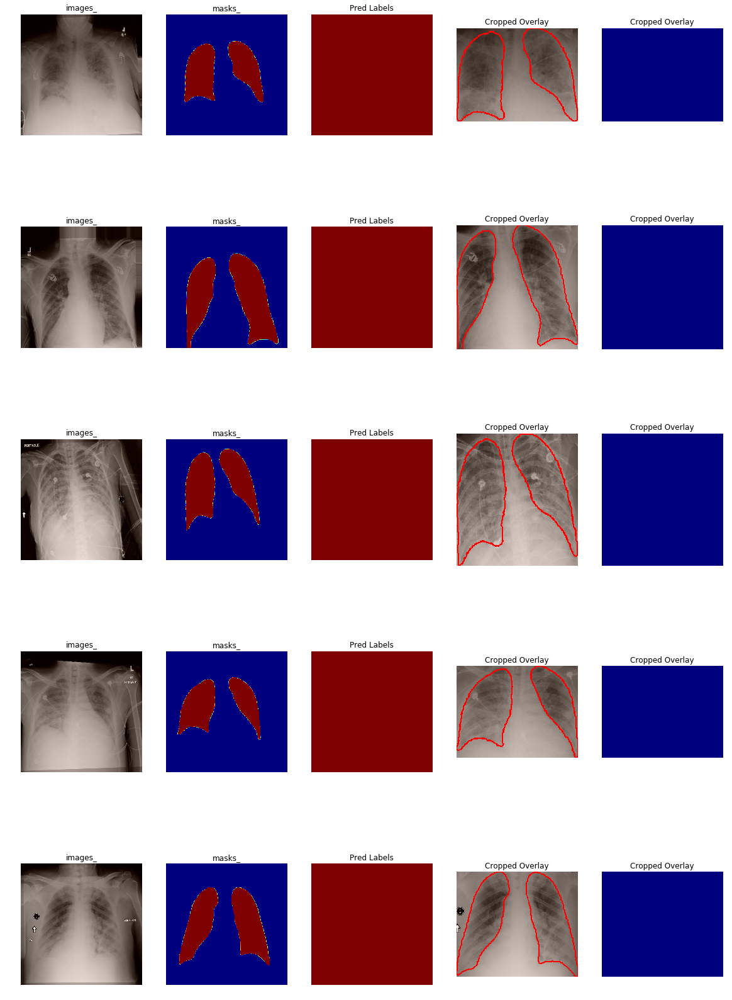

In [346]:
(rgb_batch, lab_batch) = next(valid_and_lab_gen)
sample_rows = 5
fig, m_axs = plt.subplots(sample_rows, 5, figsize = (20, 6*sample_rows))
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax1, ax2, ax2_pred, ax3, ax3_pred), rgb_img, lab_img in zip(m_axs, rgb_batch, lab_batch):
    # undoing the vgg correction is tedious
    r_rgb_img = np.clip(rgb_img+110, 0, 255).astype(np.uint8)
    lab_pred = model.predict(np.expand_dims(rgb_img, 0))[0]
    
    ax1.imshow(r_rgb_img)
    ax1.set_title('images_')
    ax2.imshow(lab_img[:,:,0], cmap = 'jet')
    ax2.set_title('masks_')
    ax2_pred.imshow(lab_pred[:,:,0], cmap = 'jet')
    ax2_pred.set_title('Pred Labels')
    if lab_img.max()>0.1:
        xd, yd = np.where(lab_img[:,:,0]>0)
        bound_img = mark_boundaries(image = r_rgb_img, label_img = lab_img[:,:,0], 
                                    color = (1,0,0), background_label = 255, mode = 'thick')
        ax3.imshow(bound_img[xd.min():xd.max(), yd.min():yd.max(),:])
        ax3.set_title('Cropped Overlay')
        ax3_pred.imshow(lab_pred[xd.min():xd.max(), yd.min():yd.max(),0], cmap = 'jet')
        ax3_pred.set_title('Cropped Overlay')

fig.savefig('trained_model.png')

In [279]:
train_df_img = train_df.iloc[0:60,0:3]

In [284]:
train_df_lab = train_df[['id','split','masks_']]
train_df_lab = train_df_lab.iloc[60:,]

group,id,split,masks_
60,NIH_0001_mask,train,NIH/masks/NIH_0001_mask.png
61,NIH_0002_mask,train,NIH/masks/NIH_0002_mask.png
62,NIH_0003_mask,train,NIH/masks/NIH_0003_mask.png
63,NIH_0004_mask,train,NIH/masks/NIH_0004_mask.png
64,NIH_0005_mask,train,NIH/masks/NIH_0005_mask.png
65,NIH_0006_mask,train,NIH/masks/NIH_0006_mask.png
66,NIH_0007_mask,train,NIH/masks/NIH_0007_mask.png
67,NIH_0008_mask,train,NIH/masks/NIH_0008_mask.png
68,NIH_0009_mask,train,NIH/masks/NIH_0009_mask.png
69,NIH_0010_mask,train,NIH/masks/NIH_0010_mask.png
